In [3]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from astropy.io import fits
from IPython.display import Image

import astropy.constants as cs
import os

import astropy.io.fits as pyfits
#import hstscan
#import data
import hstscan.pipeline as pipe
import hstscan.reduction as r
import hstscan.data as data
from hstscan.data import view_frame_image as view
import tqdm
import glob
import csv

# Setup for light-curve reduction

### 1) Download data
https://archive.stsci.edu/hst/search.php

\_ima files for all data

\_drz and \_flt files for the direct images (taken with Filters instead of Grism)

In [4]:
# data_dir: directory where the _ima files are stored
Dir = '/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/'
data_dir = Dir + 'Data/'
output_dir = Dir + 'output/'

conf_file_red = Dir + 'transmission_reduction.conf'
conf_file_ext = Dir + 'transmission_extraction.conf'

#Define a table of custom knots. A row for each subexposure. 
#If you haven't created this yet, please run the remainder of this code to find out the best knots.
#To do this, you need to set custom_knots_F=None, custom_knots_R=None in all extraction functions.
#Then create your own table with *interior* knots in ascending order
custom_knots = []
import csv
custom_knots = []
if os.path.isfile(Dir + 'custom_knots.csv'):
    with open(Dir + 'custom_knots.csv', 'rb') as csvfile:
        spamreader = csv.reader(csvfile, delimiter=',')
        for row in spamreader:
            row = np.array(row)
            custom_knots.append(row[row != ''].astype(float))
    noknots=False
else:
    noknots=True
print (noknots)
print (custom_knots)

False
[array([ 6., 11., 16., 18., 19., 20., 21., 24., 26., 31., 36., 39., 41.,
       44., 46., 49., 51., 54., 56., 59., 61., 62., 63., 64., 66., 71.]), array([ 6., 11., 16., 18., 19., 20., 21., 24., 26., 31., 36., 39., 41.,
       44., 46., 49., 51., 54., 56., 59., 61., 62., 63., 64., 66., 71.]), array([ 6., 11., 16., 18., 19., 20., 21., 24., 26., 31., 36., 39., 41.,
       44., 46., 49., 51., 54., 56., 59., 61., 62., 63., 64., 66., 71.]), array([ 6., 11., 16., 18., 19., 20., 21., 24., 26., 31., 36., 39., 41.,
       44., 46., 49., 51., 54., 56., 59., 61., 62., 63., 64., 66., 71.])]


### 2) Produce visit information lists

In [5]:
# prop_str: first 4 characters of the files' names (proposal ID string)
#data_dir='/home/barat/Desktop/PhD/hst_data_analysis/hst_scan/hstscan-master/example/Data'
#data_dir=Dir+
data.make_input_image_lists(data_dir=data_dir, prop_str='ie93',conf_file=conf_file_red)

['01', 'a1', 'b1', 'c1', 'd1', 'e1', 'f1', 'g1', 'h1', 'i1']
Starting visit 01
ie9301bqq_ima.fits
Completed file 1 for visit 01
ie9301biq_ima.fits
Completed file 2 for visit 01
ie9301bwq_ima.fits
Completed file 3 for visit 01
ie9301bzq_ima.fits
Completed file 4 for visit 01
ie9301boq_ima.fits
Completed file 5 for visit 01
ie9301bhq_ima.fits
Completed file 6 for visit 01
ie9301c0q_ima.fits
Completed file 7 for visit 01
ie9301bvq_ima.fits
Completed file 8 for visit 01
ie9301bnq_ima.fits
Completed file 9 for visit 01
ie9301bsq_ima.fits
Completed file 10 for visit 01
ie9301bkq_ima.fits
Completed file 11 for visit 01
ie9301buq_ima.fits
Completed file 12 for visit 01
ie9301bmq_ima.fits
Completed file 13 for visit 01
ie9301brq_ima.fits
Completed file 14 for visit 01
ie9301bgq_ima.fits
Completed file 15 for visit 01
ie9301bjq_ima.fits
Completed file 16 for visit 01
ie9301btq_ima.fits
Completed file 17 for visit 01
ie9301blq_ima.fits
Completed file 18 for visit 01
ie9301byq_ima.fits
Completed f

Completed file 3 for visit h1
ie93h1gaq_ima.fits
Completed file 4 for visit h1
ie93h1g7q_ima.fits
Completed file 5 for visit h1
ie93h1gkq_ima.fits
Completed file 6 for visit h1
ie93h1gfq_ima.fits
Completed file 7 for visit h1
ie93h1gmq_ima.fits
Completed file 8 for visit h1
ie93h1ghq_ima.fits
Completed file 9 for visit h1
ie93h1geq_ima.fits
Completed file 10 for visit h1
ie93h1gpq_ima.fits
Completed file 11 for visit h1
ie93h1g9q_ima.fits
Completed file 12 for visit h1
ie93h1gnq_ima.fits
Completed file 13 for visit h1
ie93h1gcq_ima.fits
Completed file 14 for visit h1
ie93h1giq_ima.fits
Completed file 15 for visit h1
ie93h1gdq_ima.fits
Completed file 16 for visit h1
ie93h1g8q_ima.fits
Completed file 17 for visit h1
ie93h1goq_ima.fits
Completed file 18 for visit h1
ie93h1gbq_ima.fits
Completed file 19 for visit h1
#####################
Visit h1 completed.
#####################
Starting visit i1
ie93i1gyq_ima.fits
Completed file 1 for visit i1
ie93i1gtq_ima.fits
Completed file 2 for visit

At this point it makes sense to re-name the visit files to more appropriate names, e.g. visit_26.lis -> transit.lis. This is not necessary, though.

The above code only needs to be run once after you've downloaded the data. So, you may disable the above code, as it's kinda slow.

### 3) Define a list of reference files

These reference files are used to calculate the absolute wavelength solution. They are typically the first grism exposures of each visit. Each visit should have at least one reference exposure.

In [4]:
ref_Images = ['ie9301bhq_ima.fits']

### 4) Fit direct image positions to produce position catalogues

Only a single star should be fully inside the second image.

Writing to: /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie93f1f1q_flt_1.cat
/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie93f1f1q_drz.fits
Shape (242, 271)


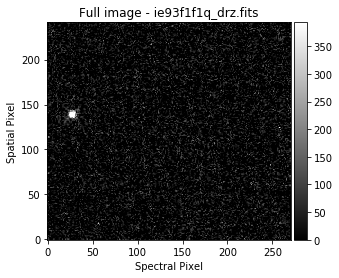

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  4.287e+04        0      inf    62.66     True     None     None
x_mean        27.67        0      242 0.001057     True     None     None
x_stddev      0.768        0      inf 0.001152     True     None     None
y_mean        138.7        0      242 0.001015     True     None     None
y_stddev     0.7158        0      inf 0.001048     True     None     None


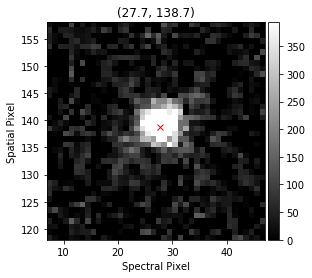

Writing to: /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie93c1d8q_flt_1.cat
/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie93c1d8q_drz.fits
Shape (242, 271)


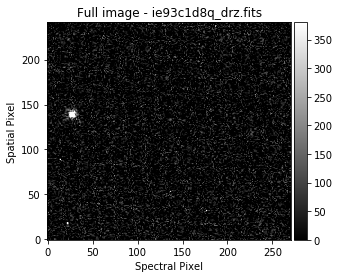

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  4.295e+04        0      inf     63.8     True     None     None
x_mean        27.71        0      242 0.001039     True     None     None
x_stddev     0.7485        0      inf 0.001091     True     None     None
y_mean        138.7        0      242 0.001004     True     None     None
y_stddev     0.7351        0      inf 0.001149     True     None     None


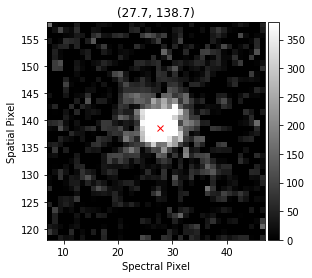

Writing to: /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie93e1efq_flt_1.cat
/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie93e1efq_drz.fits
Shape (242, 271)


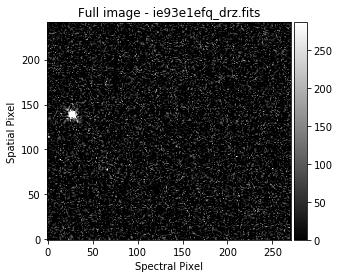

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  3.607e+04        0      inf     49.5     True     None     None
x_mean        27.56        0      242 0.001116     True     None     None
x_stddev     0.8689        0      inf 0.001178     True     None     None
y_mean        138.5        0      242 0.001009     True     None     None
y_stddev     0.7974        0      inf 0.001152     True     None     None


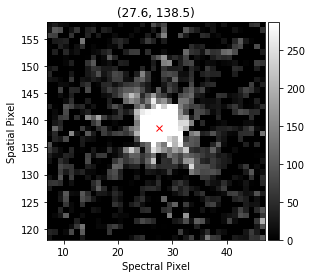

Writing to: /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie93g1fmq_flt_1.cat
/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie93g1fmq_drz.fits
Shape (242, 271)


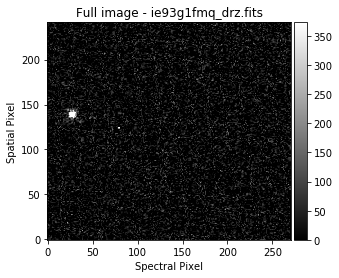

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  4.119e+04        0      inf    53.08     True     None     None
x_mean        27.51        0      242 0.001113     True     None     None
x_stddev     0.8651        0      inf 0.001183     True     None     None
y_mean        138.8        0      242 0.0009574     True     None     None
y_stddev     0.6798        0      inf 0.0008319     True     None     None


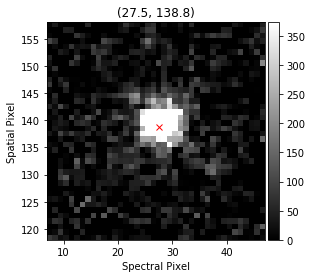

Writing to: /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie93h1g7q_flt_1.cat
/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie93h1g7q_drz.fits
Shape (242, 271)


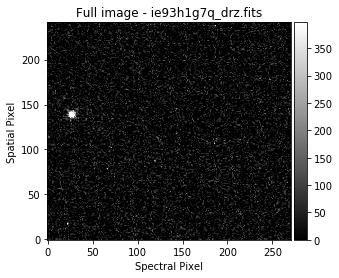

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  4.287e+04        0      inf    56.52     True     None     None
x_mean        27.55        0      242 0.001108     True     None     None
x_stddev     0.8395        0      inf 0.001199     True     None     None
y_mean        138.8        0      242 0.0009867     True     None     None
y_stddev     0.6609        0      inf 0.0008099     True     None     None


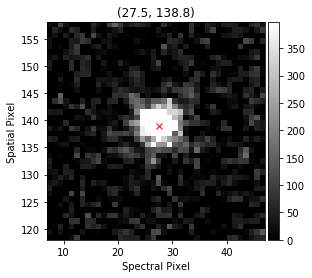

Writing to: /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie93b1cnq_flt_1.cat
/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie93b1cnq_drz.fits
Shape (242, 271)


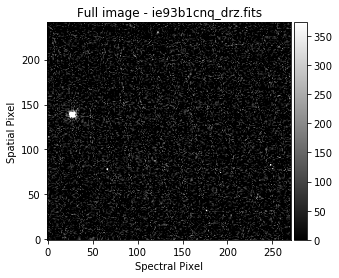

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  4.376e+04        0      inf    62.26     True     None     None
x_mean        27.75        0      242 0.000976     True     None     None
x_stddev     0.7128        0      inf 0.000967     True     None     None
y_mean        138.6        0      242 0.0009734     True     None     None
y_stddev     0.7544        0      inf 0.001159     True     None     None


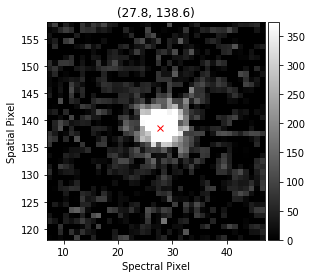

Writing to: /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie93a1c1q_flt_1.cat
/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie93a1c1q_drz.fits
Shape (242, 271)


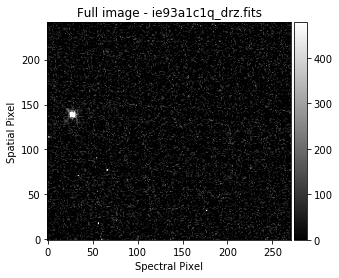

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  5.063e+04        0      inf    64.04     True     None     None
x_mean        27.87        0      242 0.000951     True     None     None
x_stddev     0.6715        0      inf 0.0007588     True     None     None
y_mean        138.7        0      242 0.0009087     True     None     None
y_stddev     0.6732        0      inf 0.0009364     True     None     None


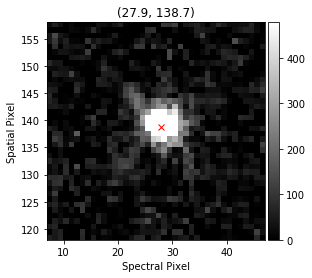

Writing to: /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie93i1gqq_flt_1.cat
/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie93i1gqq_drz.fits
Shape (242, 271)


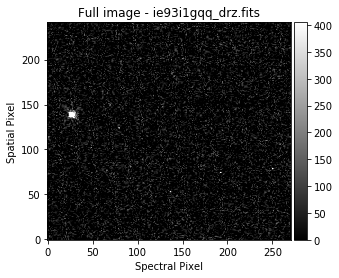

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  4.372e+04        0      inf    63.22     True     None     None
x_mean        27.64        0      242  0.00108     True     None     None
x_stddev     0.7836        0      inf 0.001188     True     None     None
y_mean        138.8        0      242 0.001016     True     None     None
y_stddev     0.6843        0      inf 0.000965     True     None     None


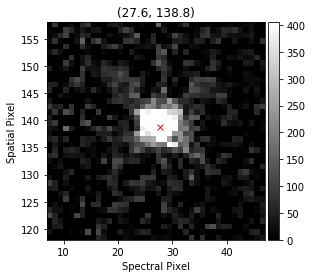

Writing to: /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie93d1duq_flt_1.cat
/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie93d1duq_drz.fits
Shape (242, 271)


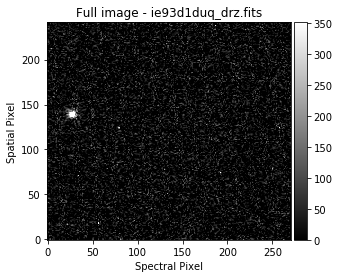

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  3.939e+04        0      inf    57.97     True     None     None
x_mean        27.66        0      242 0.001096     True     None     None
x_stddev     0.7995        0      inf 0.001176     True     None     None
y_mean        138.6        0      242 0.001041     True     None     None
y_stddev     0.7625        0      inf 0.001164     True     None     None


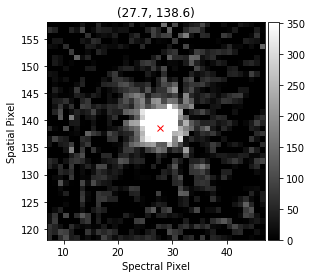

Writing to: /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie9301bgq_flt_1.cat
/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie9301bgq_drz.fits
Shape (242, 271)


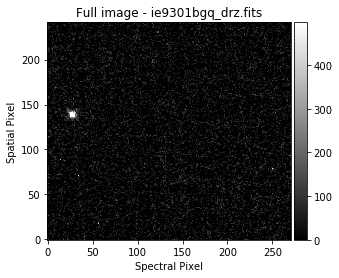

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  5.363e+04        0      inf    67.93     True     None     None
x_mean        27.82        0      242 0.0009203     True     None     None
x_stddev      0.649        0      inf 0.0007862     True     None     None
y_mean        138.8        0      242 0.000901     True     None     None
y_stddev     0.6481        0      inf 0.0008681     True     None     None


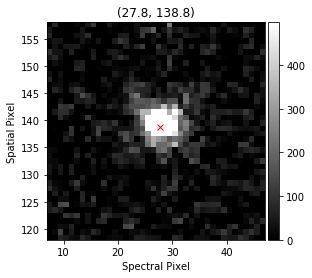

In [6]:
reload(pipe)
# gridsize: coarseness of initial search for source
# nstars: number of stars for which positions should be measured (in order of brightness)
# use_ima: use _ima files instead of _flt in case of problems
pipe.create_orbit_cats_gauss(data_dir=data_dir, conf_file=conf_file_red, gridsize=20, use_ima=False, nstars=1)

Now have everything you need to reduce an exposure and produce spectra

# Config file parameters

## Red

### Parameters to define yourself
 - source_dir
 - save_dir
 - scan_rate
 - bg_x,y,w,h
 - flat_file_g141
 - conf_file_g141
 - ref_exp
 - stellar_spectrum (PHOENIX model. TBF @ http://phoenix.astro.physik.uni-goettingen.de/?page_id=15) from https://arxiv.org/pdf/1303.5632.pdf
     You could also use a .txt file with one column of wavelengths in Angstrom and one of Flux in erg/s/cm^2/A. This file should have a one-line-header. This is useful if you want to use an ATLAS spectrum.
 - stellar_wavelengths (PHOENIX model wavelength definition)
 - HST_EPH_FILE The file with the ephemerides of HST. Downloadable from https://ssd.jpl.nasa.gov/horizons.cgi#top. See the example below

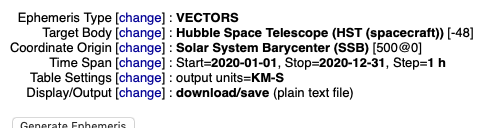

In [6]:
Image(filename = "ephemeris_example.png", width = 600, height = 300)

### Leave
These you are unlikely to want to change, although their effects are important
 - scanned = True
 - units = True
 - read_noise = 20
 - skip_start = 1
 - skip_end = 0
 - bg = True
 - bg_area = True
 - cr_local = True
 - dispersion = True
 - flat_field = True
 - ff_min = 0.5
 - contam_thresh = 0.01
 - nysig = 5
 - disp_coef = 'wilkins'
 - abs_wshift = True   #Whether to calculate the wavelength solution from the grism transmission fct.
 - peak = False
 - zeroth_ord_wshift = False
 - wshift_from_postarg = False
 - stel_spec_gauss_kern_sig = 1
 - tai_utc_file
 
### Cosmic Rays
You may want to experiment with cosmic ray removal parameters, can turn off cosmic ray removal for a first run
 - cr_tolx = 5 (try to lower without removing spectrum)
 - cr_tolx = 10 in the y-direction. Is typically higher because of the stuttering of HST
 - cr_x,y (consider tweaking if CR removal too agressive/weak)
 - cr_thresh = 50 (can raise)

### Data quality flags
Lookup flags in data handbook. 4: Bad detector pixel, 32: IR unstable pixel.

Leave as is unless there are problems.
 - dq_flags = [4,32]
 - dq_replace = None
 - dq_mean_width = 1
 
### Wavelength Solution
For now, disable the Tsiaras wavelength solution and use the simple interpolation.
May want to tweak drift_width and rowtol, parameters for smoothing the drift within an exposure.

E.g. define
 - tsiaras = False



### Plots
Leave on while still tweaking
 - debug = True
 - pdf = True
 - logger = True
 - bg_plot = True
 - cr_plot = True
 
### Tweak to position extraction box
Depending on the observations, need to account/remove different effects to center the spectrum in the extraction box. Have not figured out a universal solution.

 - remove_scan
 - postarg_yguess
 - default_scan
 
 
### Ignore
These are either no longer used, in development, or were for specific data sets/modes.
 - system
 - nlincorr
 - psf_h (these are for bg removal with masks)
 - mask_h
 - psf_w
 - n_masks
 - neg_masks
 - cr_replace
 - cr_master
 - cr_mname
 - ref_wv0
 - ref_wv1
 - pre_shift_ff
 - ext_wshift
 - grid_y
 - grid_lam
 - two_scans 
 - interp_kind
 - object_ind

## Ext

### Parameters to define yourself
 - save_dir
 - box_h (ensure large enough to capture whole spectrum)
 - ref_exp
 
### Plots
- debug = True
- logger = True
- pdf = True
- oe_debug = False (its very slow, turn on only if focusing on optimal extraction)

### Leave
 - save_extension = '_spec.txt'
 - calc_var = True
 - extraction_box = True
 - shift_spectra = True
 - shift_wv0 = 1.14
 - shift_wv1 = 1.6
 - peak = False
 - opt_ext = True
 - drift_wshift = False (if changed to True, opt_ext should be False)
 
### Tweak (if drift_wshift is enabled)
 - drift_width = 4
 - drift_rowtol = 1.1
 
### Optimal Extraction

#### Tweak
- fit_tol
- order (integer)(don't pick order=2)
- step (only works if func_type is not spline, custom_spline or split_spline and method is lsq
- k_col/row
- wstretch_sub_exps
- outliers_to_average  #substitutes outliers/DQ/CRs with the average of the surrounding pixels if possible
- slopefactor

#### Leave
- s = 0
- v_0 = 400
- q = 1
- s_clip = None
- s_cosmic = None
- func_type = 'spline'
- method = 'lsq'
- remove_bg = True
- object_ind = 0
- fit_dq = False
- wshift_sub_exps = True
- wstretch_sub_exps = True (especially recommended for forward + reverse scanned data)
- no_interp = False  #Cannot be true if wshift_sub_exps is enabled.
 
### Ignore
- save_sub
- mask_neg
- ignore_blobx
- blob_thresh
- skip_fit
- top_half

# Run data reduction on one exposure

Check 

 - Do the subexposures agree, smoothly across the whole wavelength range?
 
 - How many optimal extraction fits fail near the peak of the spectrum?
 
 - Check the fits, are they overfitting or underfitting clearly? Safer to overfit.

In [8]:
#Define the center pixel of each subexposure in y-direction. You can also run with the custom_knots=None argument to find out what these should be.
#ypix_F = [78, 120, 162,204]
ypix_F=[204,162,120,78]
ypix_R = [78, 120, 162,204]
print (output_dir)
ref_Images = ['ie9301bhq_ima.fits']

/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/


########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie93f1f2q_ima.fits
For configuration, see pipeline conf file: /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/transmission_reduction.conf


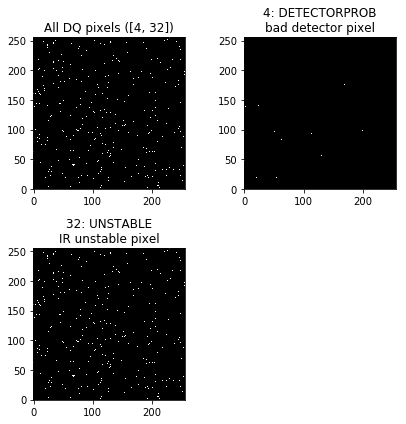

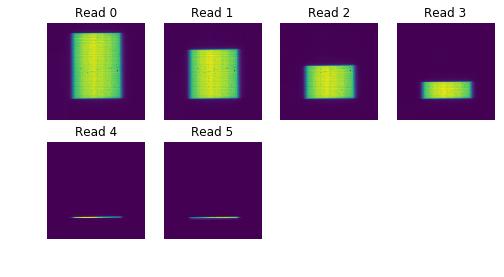

Large background of 50.1590118408 electrons per pixel found in subexposure 2
Large background of 64.6900177002 electrons per pixel found in subexposure 3


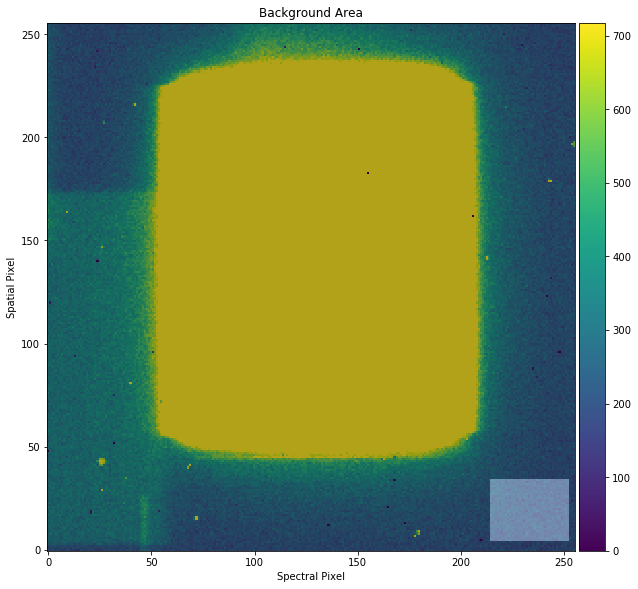

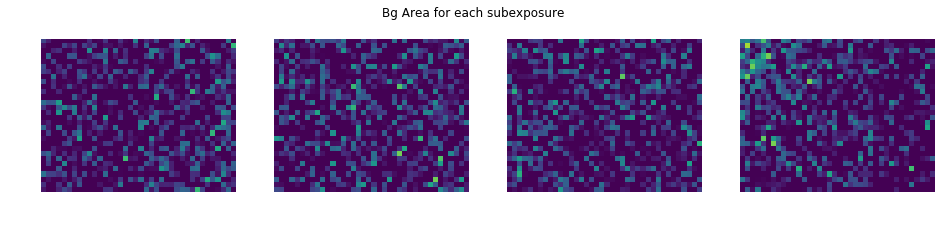

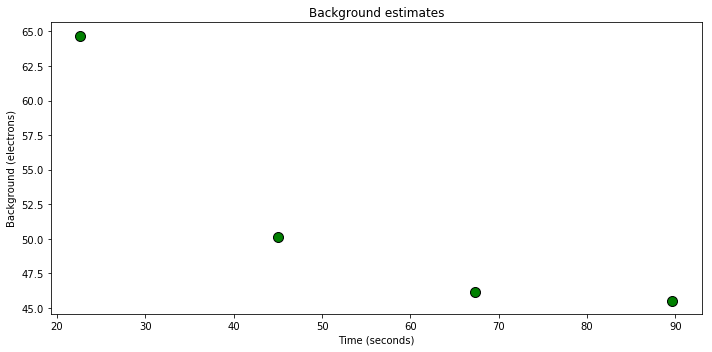

Forward scan
Catalogue used: /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie93f1f1q_flt_1.cat
Direct Image name: ie93f1f1q
catalogue /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie93f1f1q_flt_1.cat
Catalogue file: ie93f1f1q_ima.fits
########################
Direct image location of (27.6687110428,138.730752835)
Initial xpix is 24 and shift_in_x: -3.58024903523
FWHM of this subexposure is  42.040394061653075


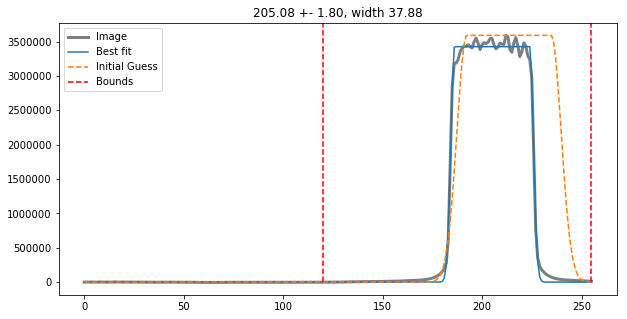

FWHM of this subexposure is  42.122102817701375


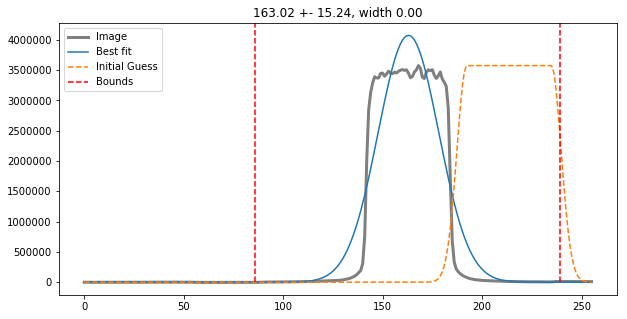

FWHM of this subexposure is  42.397755919869056


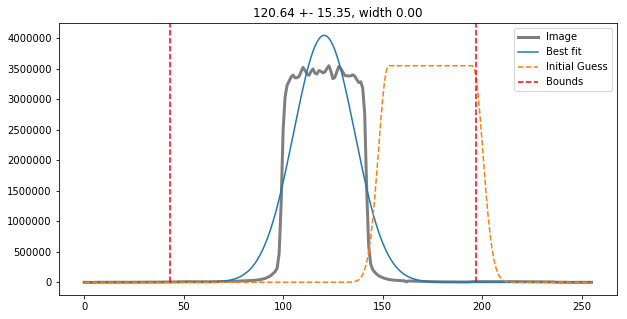

FWHM of this subexposure is  42.6662381071966


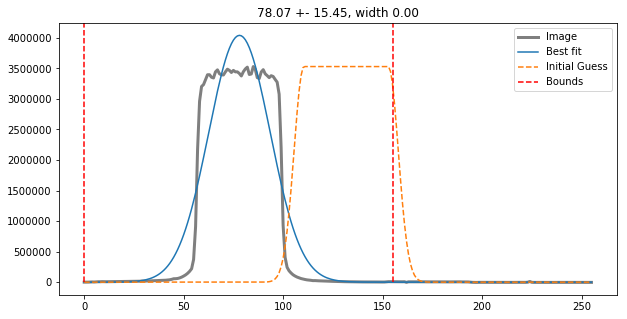

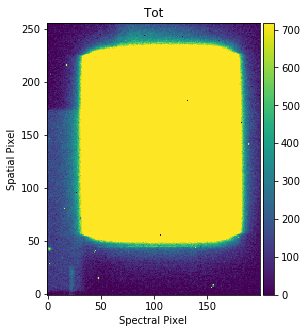

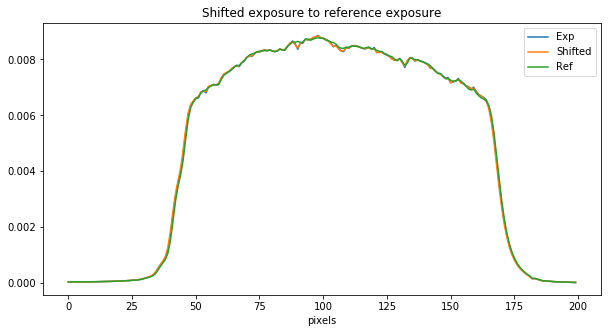

shifttoref 0.22494176663911958
The final xpix is 24
FWHM of this subexposure is  42.040394061653075


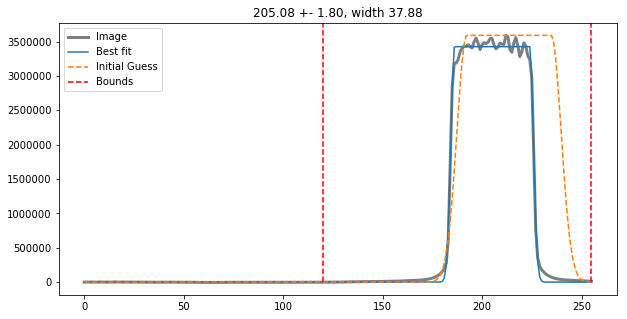

FWHM of this subexposure is  42.122102817701375


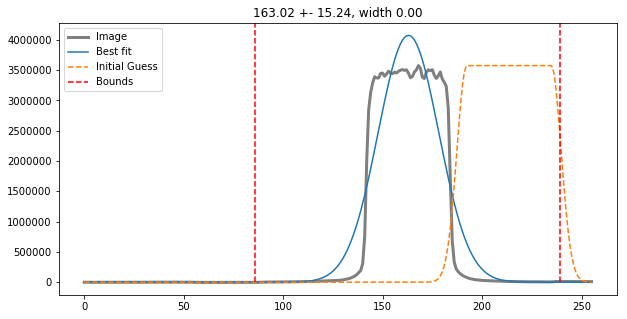

FWHM of this subexposure is  42.397755919869056


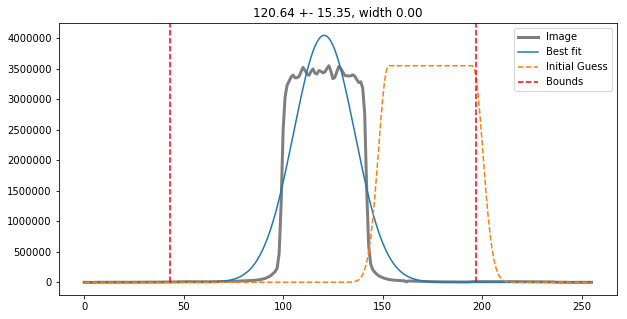

FWHM of this subexposure is  42.6662381071966


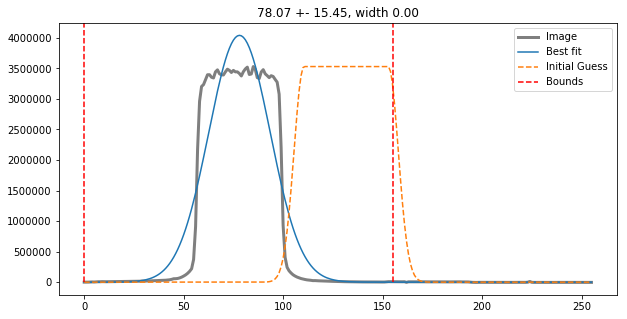

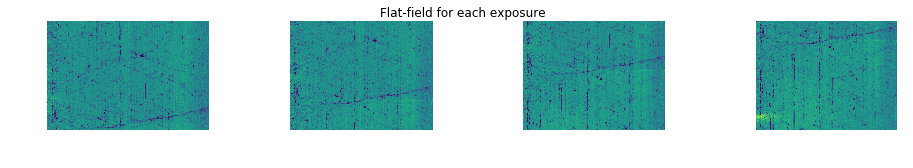

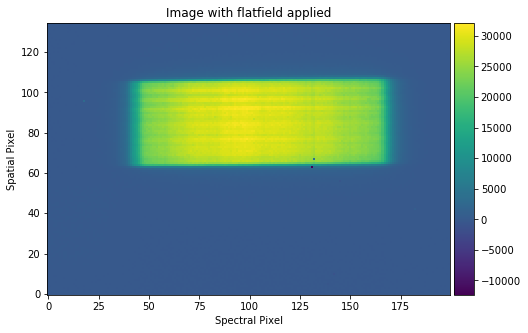

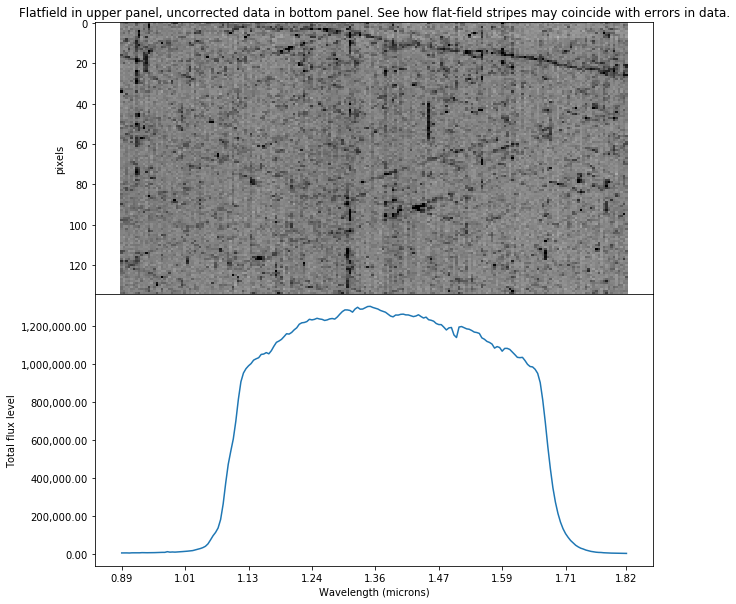

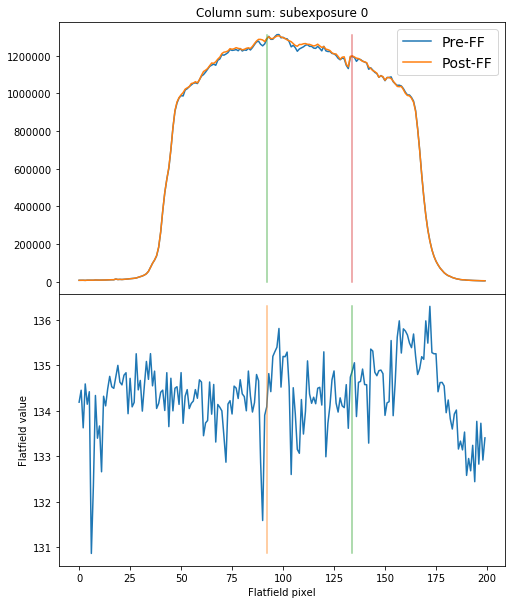

...

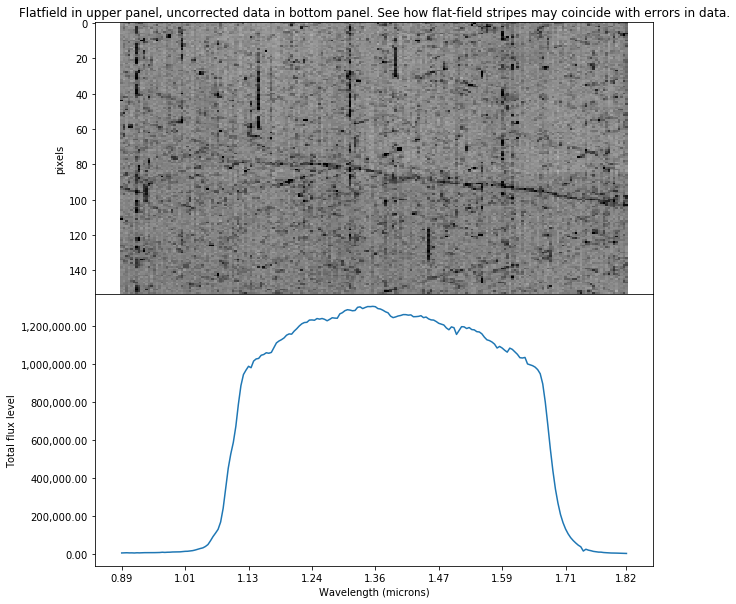

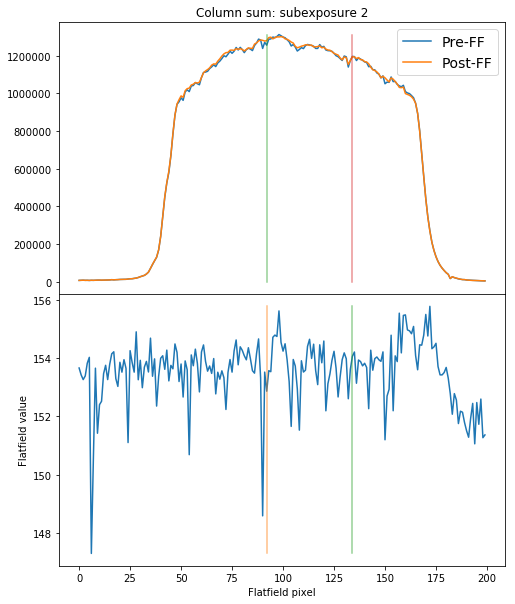

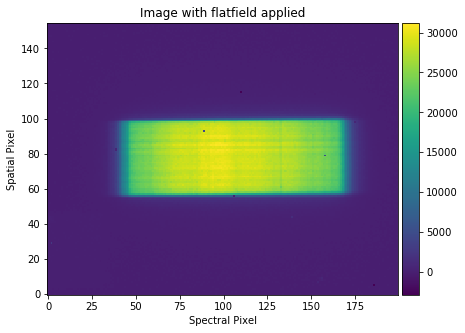

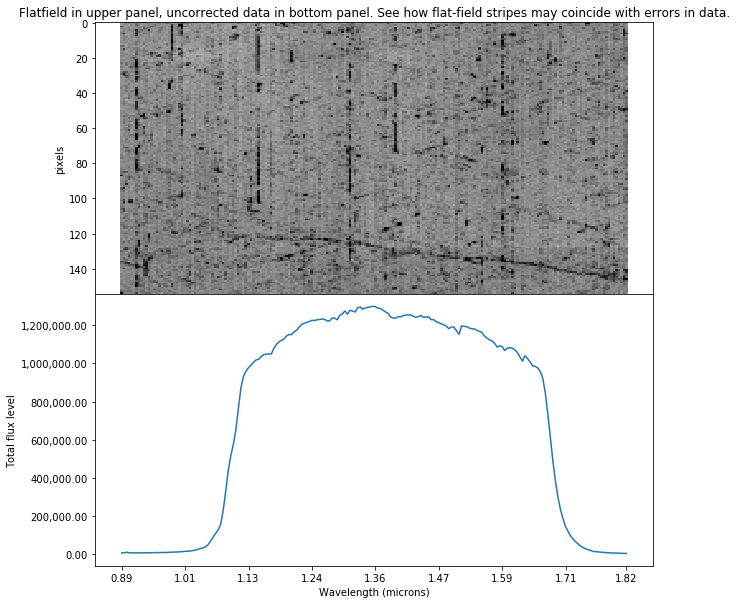

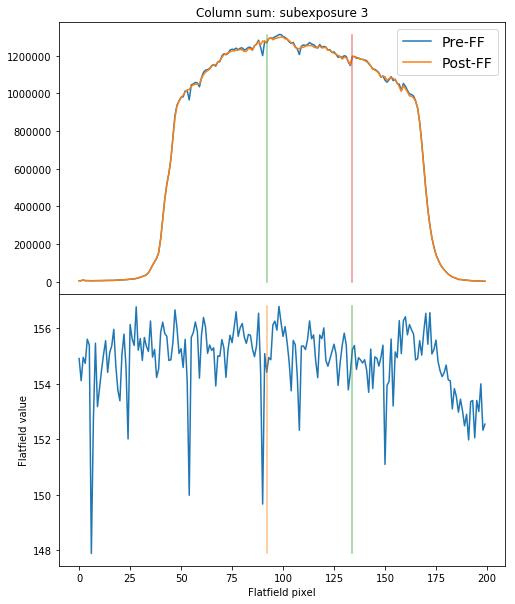

/Users/s.baratuva.nl/opt/anaconda3/envs/myenv2/lib/python2.7/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


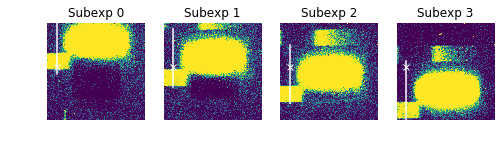

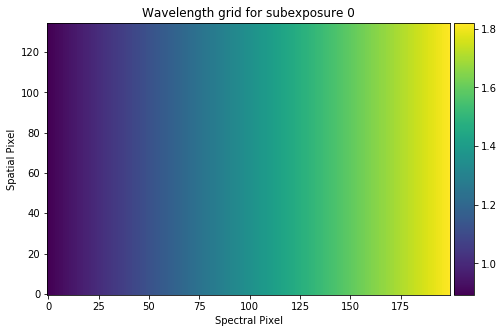

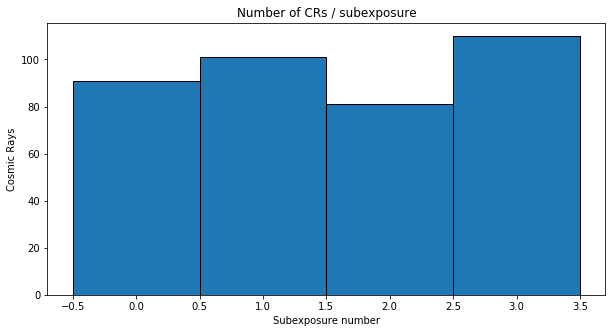

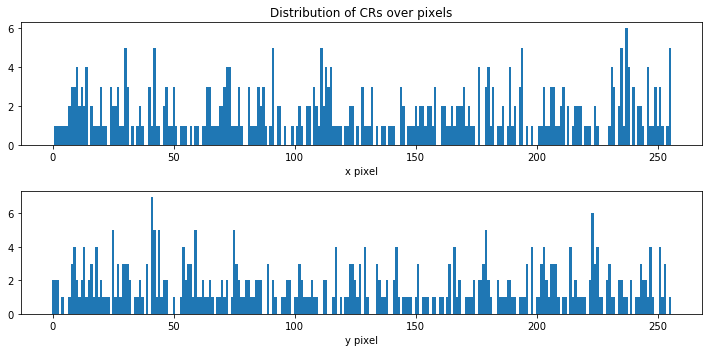

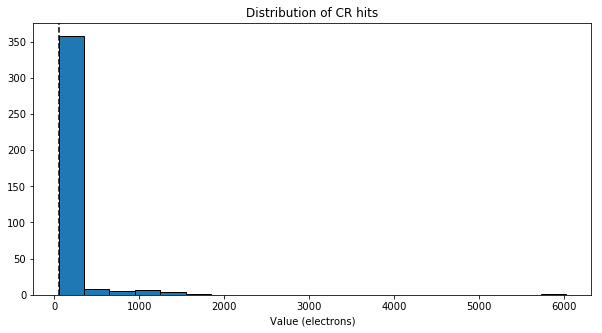

This should have a median energy of 1000 electrons
Nr. of DQs, CRs and CRs minus DQs 3092, 383 and 381
Percentage of pixels affected by CRs:0.581359863281 %, which should be ~0.348685388333% if there is no South Atlantic anomaly.


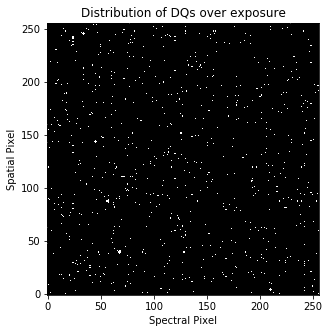

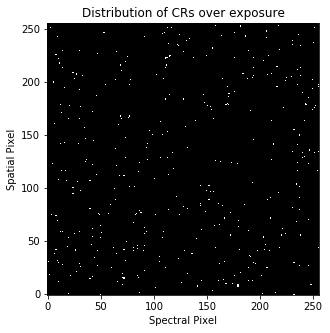

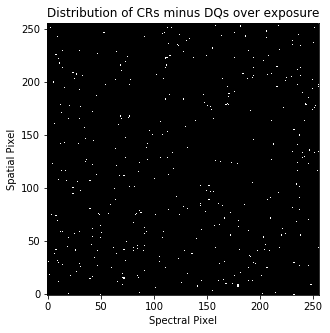

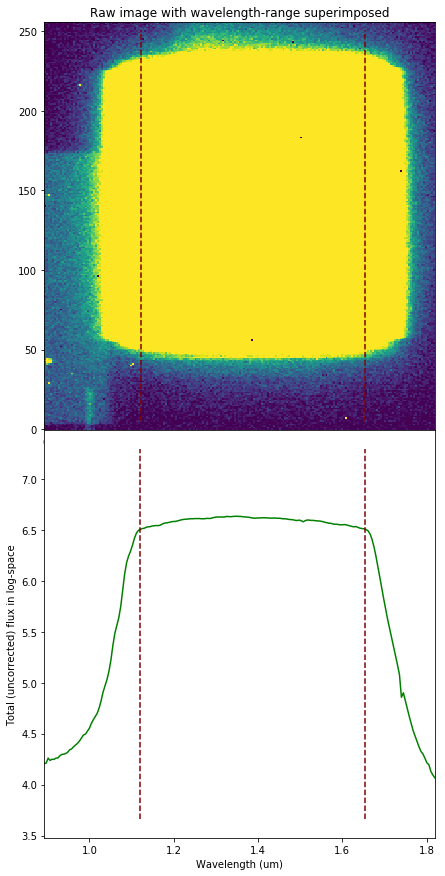

Saving reduced file to /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/
Saving reduced exposure to /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/ie93f1f2q_red.fits...
Reduction took 7.62s
########################################
###########Finished Reduction###########
########################################
########################################
############Started Extraction##########
########################################
Spectral extraction pipeline performed on exposure /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie93f1f2q_ima.fits
For configuration, see conf file: /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/transmission_extraction.conf
Forward scan
Extracting from subexposure 1
Extracting spectrum with a 82 high extraction box
nr. of CRs 864
Spectrum located at pixel 124 in spatial direction
subexp 205.0768783456675 [204, 162, 120, 78]
ypix is 204 for exposure 0


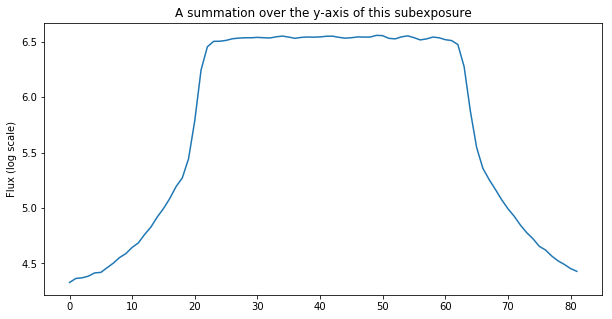

The difference between the two edges (for a 5-pixel bin for all subexps is): 946.7020833333333
This value may not be larger than  4442.917719997375  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Using flux for variance estimate
Extracting spectrum with optimal extraction...
Knots used are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


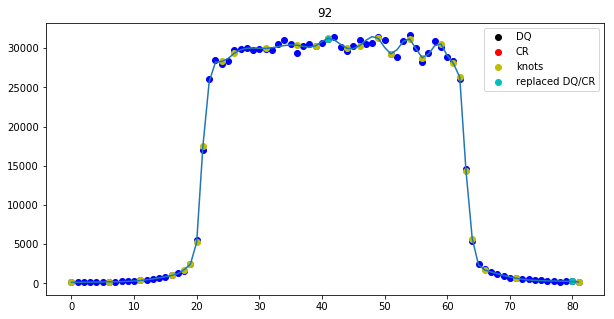

Knots used are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


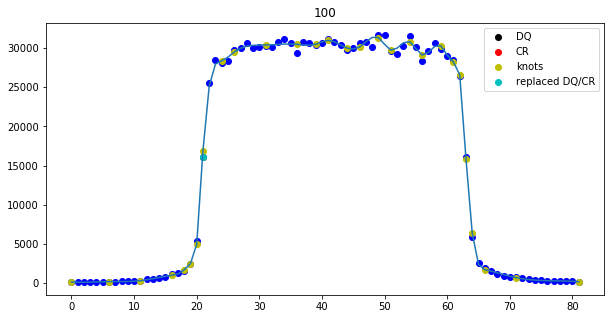

Knots used are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


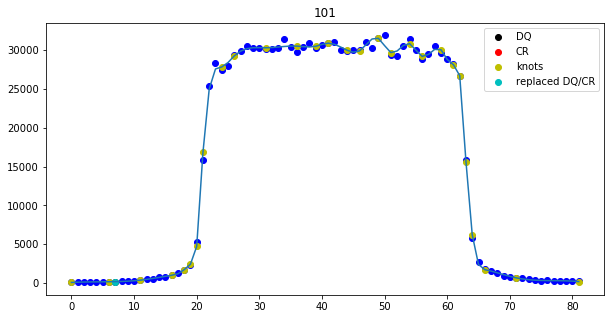

195 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 2, 3, 5]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 2
nr. of CRs 965
Spectrum located at pixel 124 in spatial direction
subexp 163.02008592420356 [204, 162, 120, 78]
ypix is 162 for exposure 1


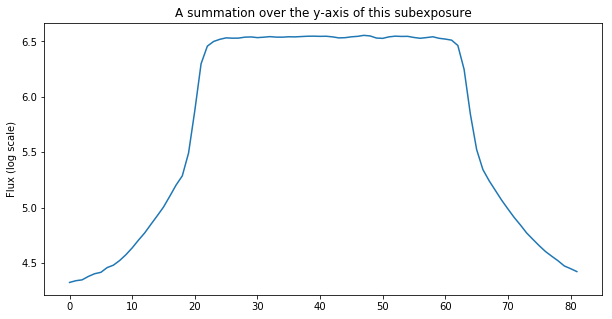

The difference between the two edges (for a 5-pixel bin for all subexps is): 936.23203125
This value may not be larger than  4444.588619883734  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
Knots used are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


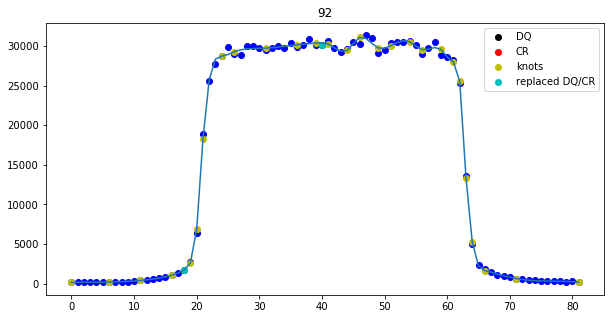

Knots used are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


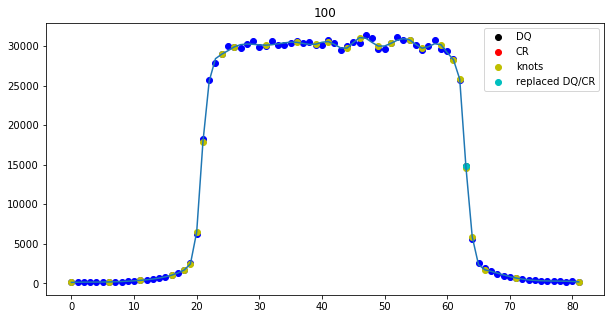

Knots used are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


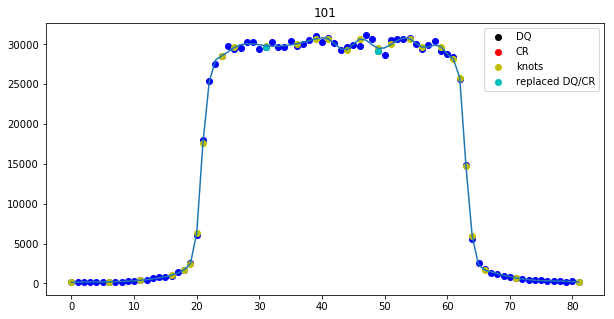

197 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 3
nr. of CRs 955
Spectrum located at pixel 124 in spatial direction
subexp 120.63603516064451 [204, 162, 120, 78]
ypix is 120 for exposure 2


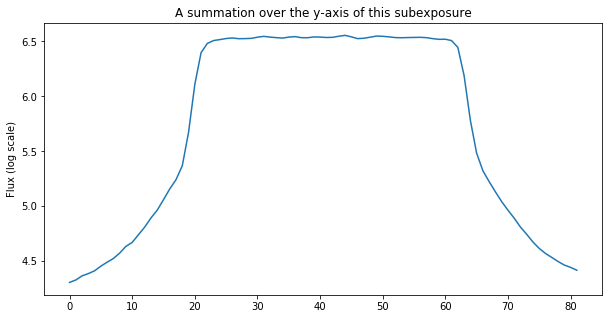

The difference between the two edges (for a 5-pixel bin for all subexps is): 1002.90625
This value may not be larger than  4444.583820036847  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
Knots used are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


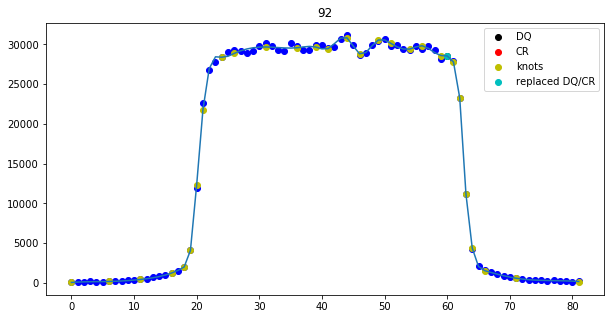

Knots used are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


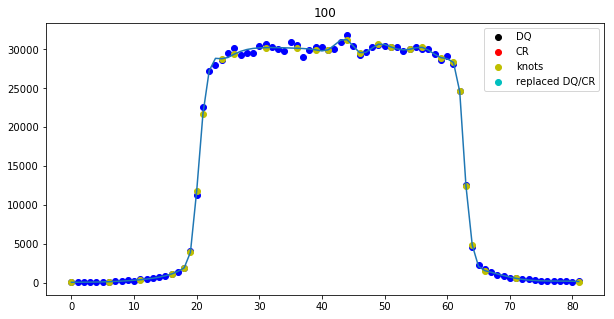

Knots used are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


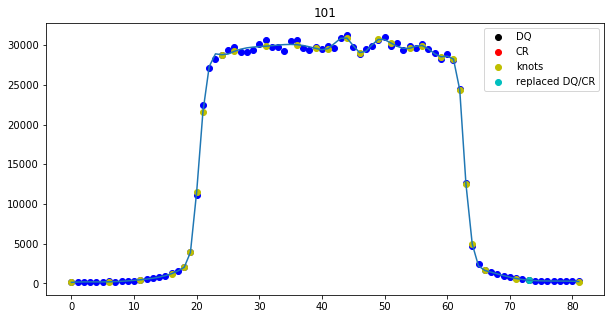

191 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 4
nr. of CRs 964
Spectrum located at pixel 124 in spatial direction
subexp 78.06631723286486 [204, 162, 120, 78]
ypix is 78 for exposure 3


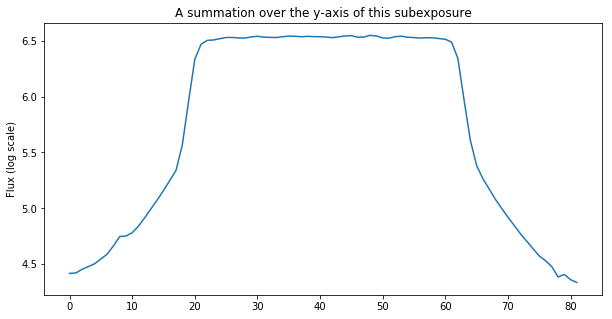

The difference between the two edges (for a 5-pixel bin for all subexps is): 624.5166666666667
This value may not be larger than  4444.3942219384635  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
Knots used are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


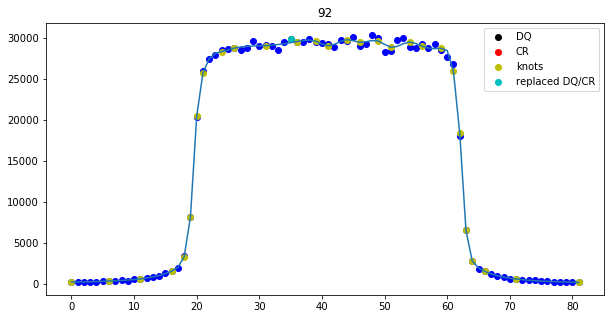

Knots used are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


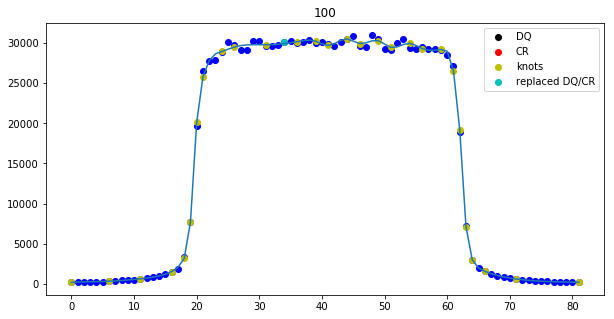

Knots used are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


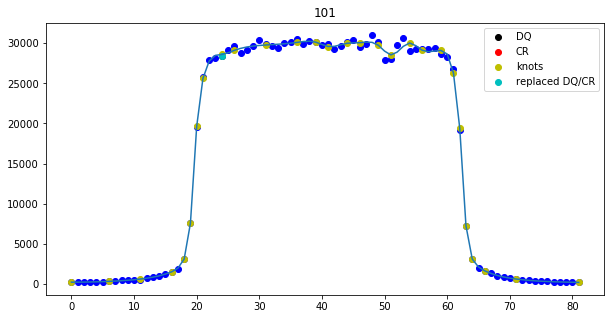

Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE


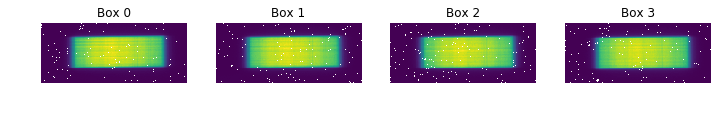

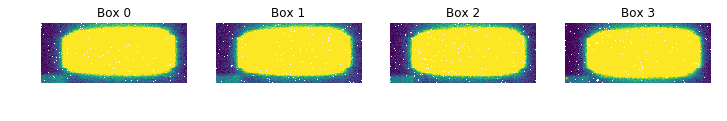

Applied an xshift of -0.230240654014 pix compared to reference (reduced) spectrum ie9301bhq


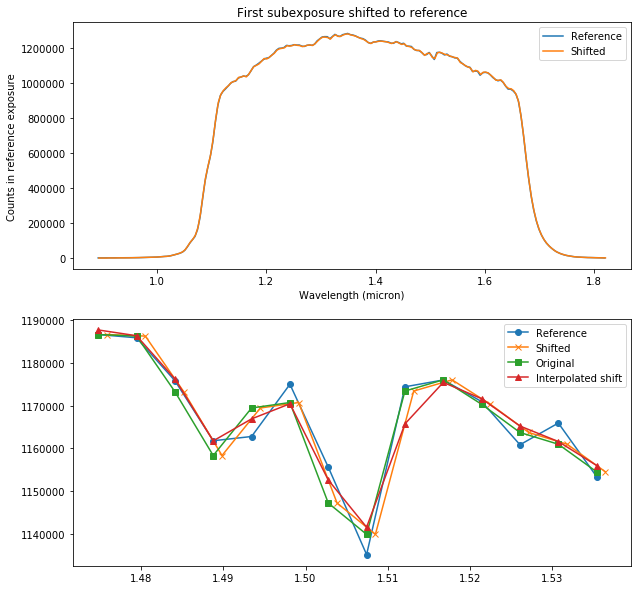

Shifted subexposure nr. 1 with -0.392785935447 pixels and shrunk 0.230998037066 percent.
Shifted subexposure nr. 2 with -0.76127002621 pixels and shrunk 0.4476344795 percent.
Shifted subexposure nr. 3 with -1.07343371477 pixels and shrunk 0.660339175144 percent.


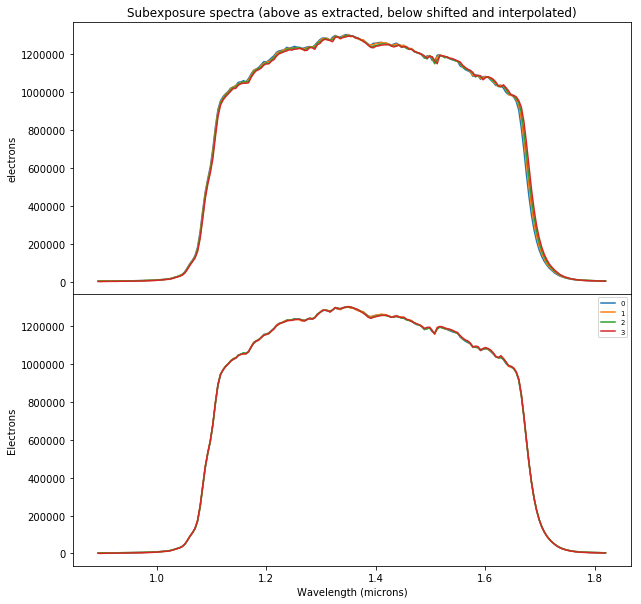

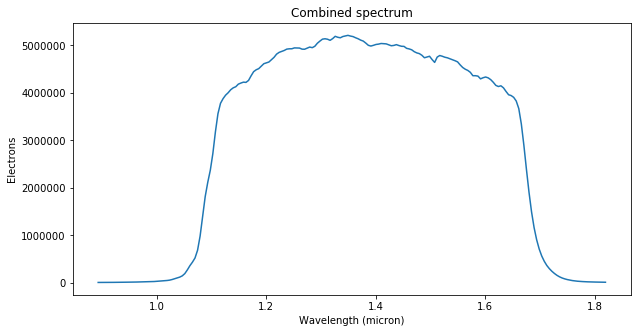

Saving spectrum to /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/ie93f1f2q_spec.txt
Extraction took 3.79s
########################################
###########Finished Extraction##########
########################################


In [12]:
#file_name=np.loadtxt()
reload(pipe)
#fname = 'ie93d1eeq_ima.fits'
fname='ie93f1f2q_ima.fits'
visit = 1

if visit == 1:
    Bg_x, Bg_y, Bg_w, Bg_h = (215, 5, 38, 30)
    Ref_exp = ref_Images[0].split('_ima.fits')[0]
    
if fname == Ref_exp + '_ima.fits':
    Save_sub = True
else:
    Save_sub = False

exp = pipe.reduce_exposure(fname, pdf=False, logger=False, debug=True,
                           bg_x = Bg_x, bg_y = Bg_y, bg_w = Bg_w, bg_h = Bg_h,
                           tsiaras=False, cr_tolx=6.0, cr_toly=6.0, cr_thresh=50,
                           ref_exp = Ref_exp,
                           conf_file=conf_file_red, \
                           source_dir=data_dir, write = True)
#print (exp.t)
#noknots=False
#custom_knots=[]
#x=np.array([3,5,7,9,11,23,31,45,46,61])
#custom_knots.append(x)
#custom_knots.append(x)
#custom_knots.append(x)
#custom_knots.append(x)
#print (custom_knots)
noknots=False
if noknots:
    exp_spectrum, variance, interp_spectra, variances = \
                    pipe.extract_spectra(exp, pdf=False, logger=False, debug=False,
                    conf_file=conf_file_ext, ref_exp=Ref_exp,
                    save_dir=output_dir, save_sub=Save_sub,custom_knots_F=None,custom_knots_R=None)
else:
#        custom_knots=[0,3,5,7,9,21,23,57,61]
        exp_spectrum, variance, interp_spectra, variances, reduced_exp = \
                    pipe.extract_spectra(exp, pdf=False, logger=False, debug=True,
                    conf_file=conf_file_ext, ref_exp=Ref_exp, ypix_F=ypix_F, ypix_R=ypix_R,
                    custom_knots_F=custom_knots, custom_knots_R=custom_knots[::-1],
                    save_dir=output_dir, save_sub=Save_sub, show_knots=True)


['ie9301bhq' 'ie9301biq' 'ie9301bjq' 'ie9301bkq' 'ie9301blq' 'ie9301bmq'
 'ie9301bnq' 'ie9301boq' 'ie9301bqq' 'ie9301brq' 'ie9301bsq' 'ie9301btq'
 'ie9301buq' 'ie9301bvq' 'ie9301bwq' 'ie9301byq' 'ie9301bzq' 'ie9301c0q']
ie9301bhq_ima.fits
########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie9301bhq_ima.fits
For configuration, see pipeline conf file: /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/transmission_reduction.conf
Large background of 50.6708259583 electrons per pixel found in subexposure 2
Large background of 65.5615539551 electrons per pixel found in subexposure 3
Forward scan
Catalogue used: /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie9301bgq_flt_1.cat
Direct Image name: ie9301bgq
catalogue /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Dat

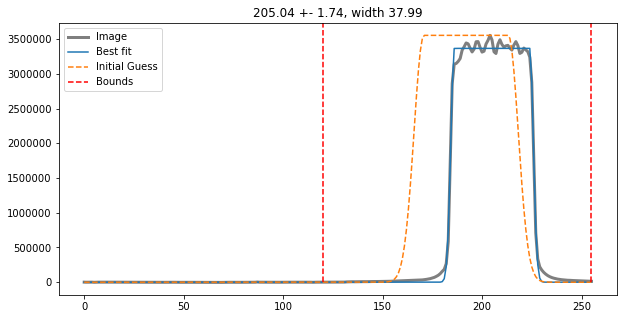

using a PHOENIX stellar model


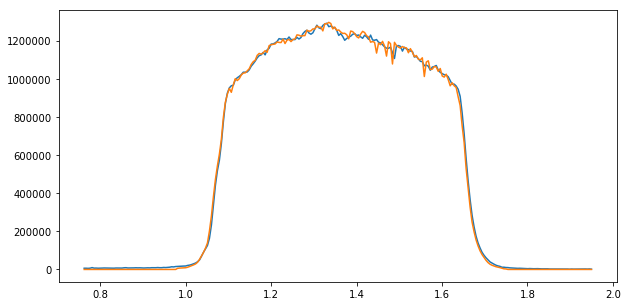

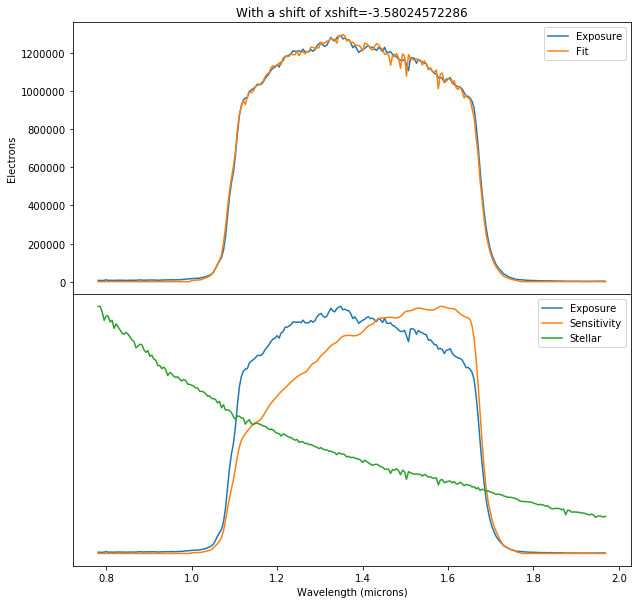

Applied an xshift of -3.58024572286 pix from a comparison to a stellar spectrum
24 value of xpix
Initial xpix is 24 and shift_in_x: -3.58024572286


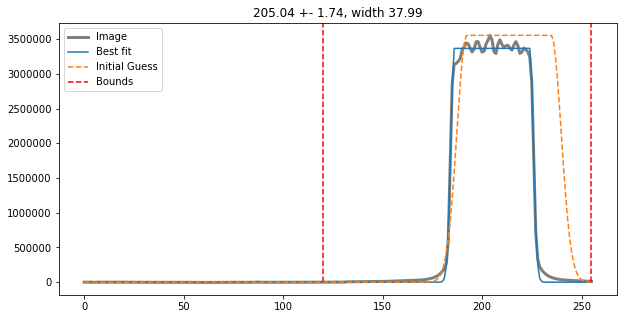

(array([[ 13.41481   ,  31.611496  , -29.66835   , ...,   4.437088  ,
         35.517212  ,  22.630188  ],
       [  0.996109  ,  11.786209  ,  23.216751  , ...,   0.5978699 ,
        -21.520126  ,  27.509186  ],
       [ 34.9554    ,  23.655838  ,  26.649094  , ...,  -5.279373  ,
         11.5793915 , -13.319046  ],
       ...,
       [-13.157394  , -12.082367  ,  -0.19472504, ...,  51.35933   ,
         37.69023   ,  42.88994   ],
       [-18.053268  ,  12.297195  ,  75.07977   , ...,  18.857544  ,
         26.078949  ,  39.33519   ],
       [ 34.09201   ,   7.1550446 , -14.526733  , ...,  38.622     ,
          9.056374  ,   5.093643  ]], dtype=float32), array([[0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       [1.01465568, 1.01152106, 0.97465585, ..., 0.99614412, 0.99226877,
        0.99630135],
       ...,
       [0.99049433, 0.98990652, 1.018020

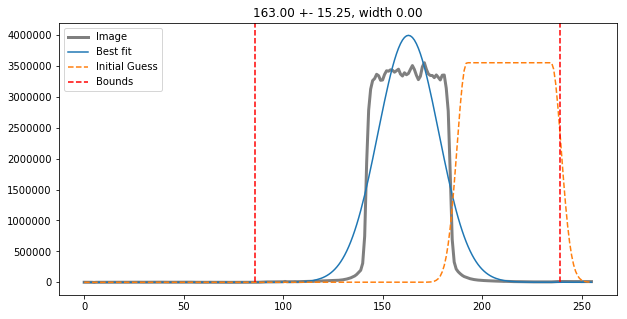

(array([[ 22.526443  ,  28.678757  ,  -4.243881  , ...,  21.165527  ,
        -17.96849   ,   9.802063  ],
       [ 24.652756  ,   1.9153595 , -25.339249  , ...,  10.132126  ,
         31.138489  ,  18.48053   ],
       [ 49.21164   ,  83.122025  ,  42.215683  , ...,  15.588791  ,
         16.665283  ,  37.050034  ],
       ...,
       [  7.3221893 ,   0.62770844,  -4.7863846 , ...,  20.348824  ,
        -33.873474  ,  31.094917  ],
       [  8.570694  ,  40.151802  , -58.737946  , ..., -13.063889  ,
        -13.483528  , -28.122635  ],
       [ 38.32763   ,  -4.2649155 ,   5.8282623 , ...,  58.458817  ,
         36.708397  ,  13.19915   ]], dtype=float32), array([[0.97797824, 1.01717404, 1.02369336, ..., 0.97947431, 0.99055837,
        0.97462096],
       [0.86756175, 1.00057105, 1.00078321, ..., 0.98511468, 0.98741866,
        0.97093693],
       [1.04421316, 1.00141875, 0.96262652, ..., 0.98749226, 1.01309426,
        0.9847939 ],
       ...,
       [0.98067773, 1.00647348, 0.980752

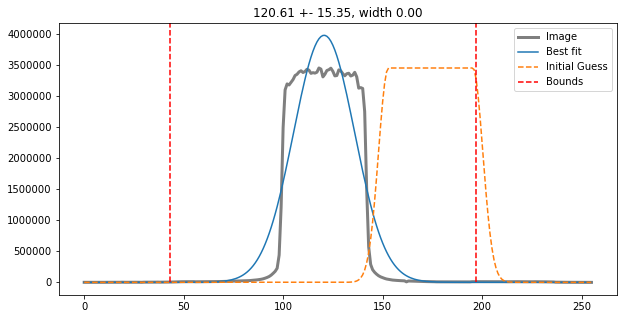

(array([[  9.546062 ,  92.601364 , 175.65584  , ..., -10.7611885,
        -22.301914 ,  27.447224 ],
       [ 25.085247 ,  68.371475 ,  92.19557  , ...,   1.2822151,
         15.637363 ,  -4.1155205],
       [ 20.931774 ,  17.43063  , -40.27297  , ...,  16.896053 ,
        -19.78371  ,  14.572933 ],
       ...,
       [  3.9953766, -12.871494 ,  -8.485424 , ..., -26.416622 ,
        -12.253185 ,  15.137379 ],
       [ -9.140141 ,  -8.209721 ,  34.699093 , ...,  15.870724 ,
         32.85783  ,  52.80817  ],
       [  8.286343 ,  14.454884 ,   5.556843 , ...,  24.318653 ,
         -4.185276 , -14.823246 ]], dtype=float32), array([[0.99152216, 0.98206137, 0.98798856, ..., 0.9900434 , 0.97864713,
        0.99251526],
       [1.0128799 , 0.96209698, 1.03174513, ..., 1.00765806, 0.99389191,
        0.98775042],
       [0.99974451, 0.98079478, 0.99440176, ..., 0.99625174, 0.9890361 ,
        0.95858532],
       ...,
       [1.03185068, 1.00088005, 0.98926224, ..., 0.98714183, 0.9753993 ,
   

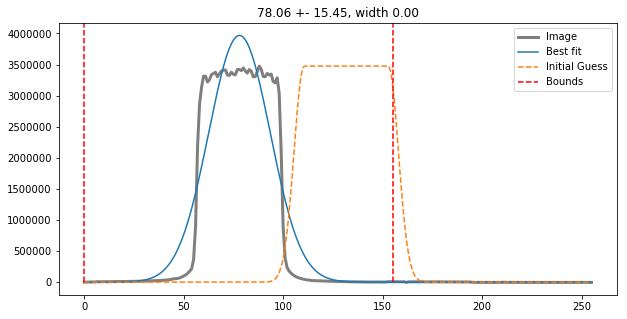

(array([[  1.6079636 ,  19.051071  , -13.7007675 , ..., -31.169815  ,
        -37.77574   , -11.8300705 ],
       [-27.487885  ,   3.637619  ,  32.644722  , ...,   8.36496   ,
        -36.96995   , -17.472729  ],
       [  0.93361664,  32.721222  ,  21.710213  , ..., -16.079144  ,
         30.284042  , -22.17635   ],
       ...,
       [-15.639114  ,  12.112091  ,   2.137436  , ...,  23.98069   ,
        -42.169014  ,  -6.3431206 ],
       [ 10.15358   ,  -5.6991577 , -60.944084  , ..., -40.408714  ,
         13.440819  , -15.394093  ],
       [-21.245361  ,  33.71161   , -17.356941  , ..., -28.602707  ,
        -32.23739   ,  25.858185  ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.03028248, 1.00843969, 1.014272

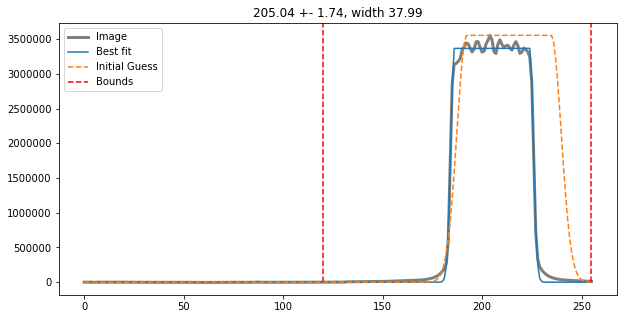

(array([[ 13.41481   ,  31.611496  , -29.66835   , ...,   4.437088  ,
         35.517212  ,  22.630188  ],
       [  0.996109  ,  11.786209  ,  23.216751  , ...,   0.5978699 ,
        -21.520126  ,  27.509186  ],
       [ 34.9554    ,  23.655838  ,  26.649094  , ...,  -5.279373  ,
         11.5793915 , -13.319046  ],
       ...,
       [-13.157394  , -12.082367  ,  -0.19472504, ...,  51.35933   ,
         37.69023   ,  42.88994   ],
       [-18.053268  ,  12.297195  ,  75.07977   , ...,  18.857544  ,
         26.078949  ,  39.33519   ],
       [ 34.09201   ,   7.1550446 , -14.526733  , ...,  38.622     ,
          9.056374  ,   5.093643  ]], dtype=float32), array([[0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       [1.01465568, 1.01152106, 0.97465585, ..., 0.99614412, 0.99226877,
        0.99630135],
       ...,
       [0.99049433, 0.98990652, 1.018020

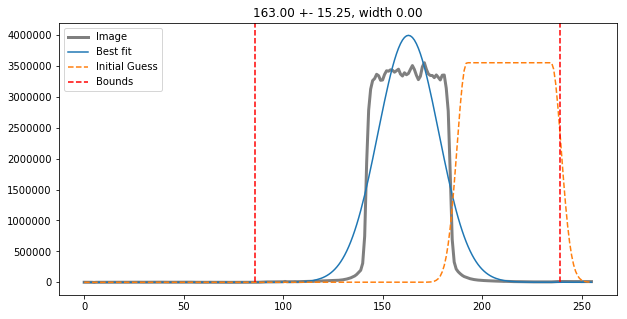

(array([[ 22.526443  ,  28.678757  ,  -4.243881  , ...,  21.165527  ,
        -17.96849   ,   9.802063  ],
       [ 24.652756  ,   1.9153595 , -25.339249  , ...,  10.132126  ,
         31.138489  ,  18.48053   ],
       [ 49.21164   ,  83.122025  ,  42.215683  , ...,  15.588791  ,
         16.665283  ,  37.050034  ],
       ...,
       [  7.3221893 ,   0.62770844,  -4.7863846 , ...,  20.348824  ,
        -33.873474  ,  31.094917  ],
       [  8.570694  ,  40.151802  , -58.737946  , ..., -13.063889  ,
        -13.483528  , -28.122635  ],
       [ 38.32763   ,  -4.2649155 ,   5.8282623 , ...,  58.458817  ,
         36.708397  ,  13.19915   ]], dtype=float32), array([[0.97797824, 1.01717404, 1.02369336, ..., 0.97947431, 0.99055837,
        0.97462096],
       [0.86756175, 1.00057105, 1.00078321, ..., 0.98511468, 0.98741866,
        0.97093693],
       [1.04421316, 1.00141875, 0.96262652, ..., 0.98749226, 1.01309426,
        0.9847939 ],
       ...,
       [0.98067773, 1.00647348, 0.980752

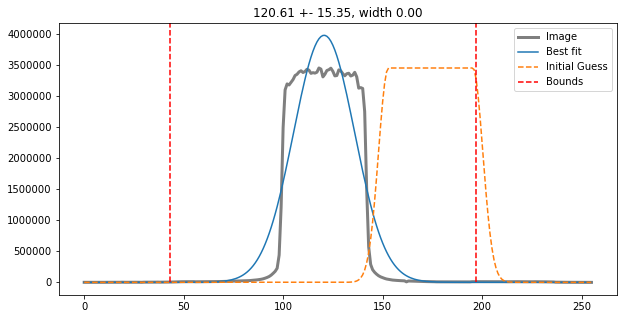

(array([[  9.546062 ,  92.601364 , 175.65584  , ..., -10.7611885,
        -22.301914 ,  27.447224 ],
       [ 25.085247 ,  68.371475 ,  92.19557  , ...,   1.2822151,
         15.637363 ,  -4.1155205],
       [ 20.931774 ,  17.43063  , -40.27297  , ...,  16.896053 ,
        -19.78371  ,  14.572933 ],
       ...,
       [  3.9953766, -12.871494 ,  -8.485424 , ..., -26.416622 ,
        -12.253185 ,  15.137379 ],
       [ -9.140141 ,  -8.209721 ,  34.699093 , ...,  15.870724 ,
         32.85783  ,  52.80817  ],
       [  8.286343 ,  14.454884 ,   5.556843 , ...,  24.318653 ,
         -4.185276 , -14.823246 ]], dtype=float32), array([[0.99152216, 0.98206137, 0.98798856, ..., 0.9900434 , 0.97864713,
        0.99251526],
       [1.0128799 , 0.96209698, 1.03174513, ..., 1.00765806, 0.99389191,
        0.98775042],
       [0.99974451, 0.98079478, 0.99440176, ..., 0.99625174, 0.9890361 ,
        0.95858532],
       ...,
       [1.03185068, 1.00088005, 0.98926224, ..., 0.98714183, 0.9753993 ,
   

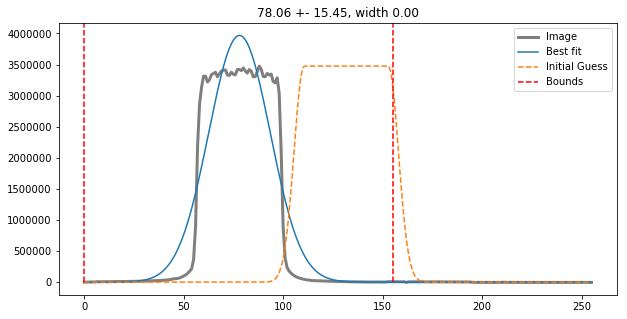

(array([[  1.6079636 ,  19.051071  , -13.7007675 , ..., -31.169815  ,
        -37.77574   , -11.8300705 ],
       [-27.487885  ,   3.637619  ,  32.644722  , ...,   8.36496   ,
        -36.96995   , -17.472729  ],
       [  0.93361664,  32.721222  ,  21.710213  , ..., -16.079144  ,
         30.284042  , -22.17635   ],
       ...,
       [-15.639114  ,  12.112091  ,   2.137436  , ...,  23.98069   ,
        -42.169014  ,  -6.3431206 ],
       [ 10.15358   ,  -5.6991577 , -60.944084  , ..., -40.408714  ,
         13.440819  , -15.394093  ],
       [-21.245361  ,  33.71161   , -17.356941  , ..., -28.602707  ,
        -32.23739   ,  25.858185  ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.03028248, 1.00843969, 1.014272

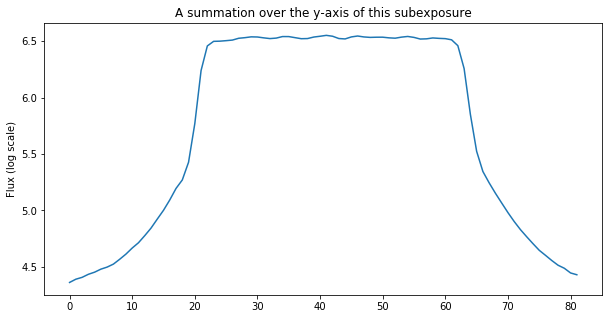

The difference between the two edges (for a 5-pixel bin for all subexps is): 655.88828125
This value may not be larger than  4404.0710863169925  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Using flux for variance estimate
Extracting spectrum with optimal extraction...
1265498.418027379 pl 1265498.418027379 40.75178
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


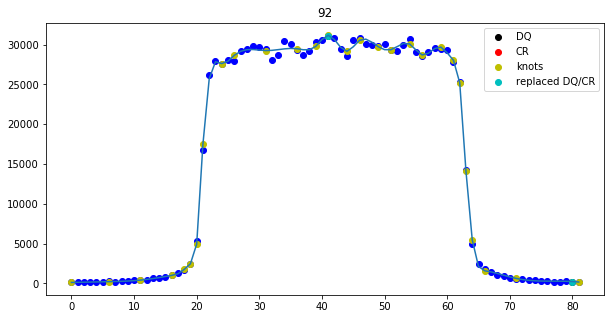

1274739.4891961396 pl 1274739.4891961396 40.94404
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


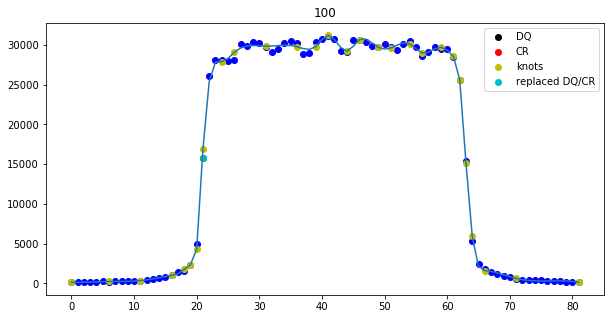

1269904.1648552965 pl 1269904.1648552965 40.412365
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


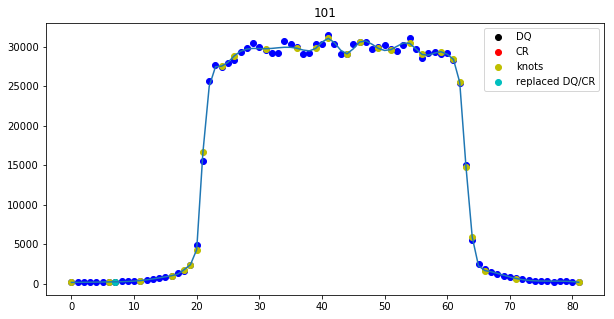

200 successes out of 200 total fits
Optimal extraction fitting failed for columns: []
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 2
nr. of CRs 1202
Spectrum located at pixel 124 in spatial direction
subexp 162.9955424887637 [204, 162, 120, 78]
ypix is 162 for exposure 1


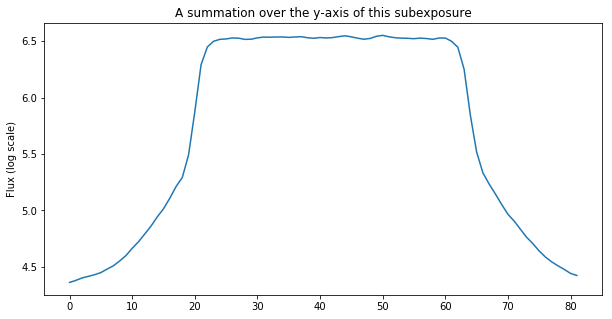

The difference between the two edges (for a 5-pixel bin for all subexps is): 620.0109375
This value may not be larger than  4405.405406997182  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1254733.9299685827 pl 1254733.9299685827 40.90627
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


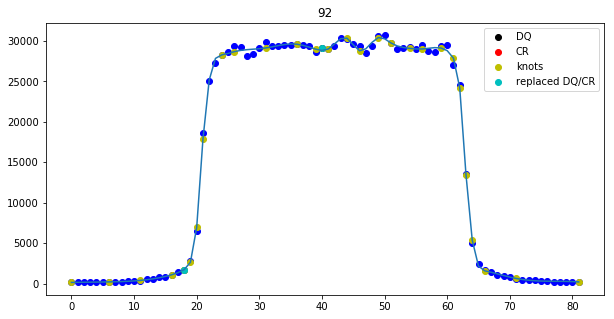

1276014.8569910526 pl 1276014.8569910526 40.304558
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


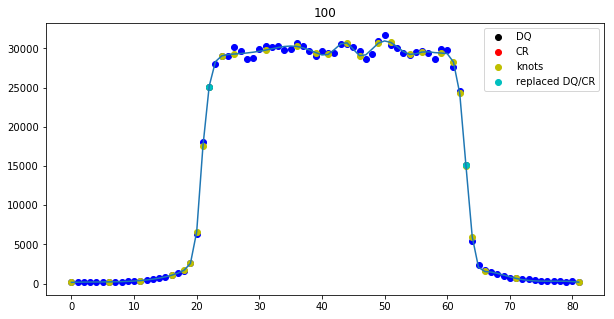

1263281.20866835 pl 1263281.20866835 40.763515
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


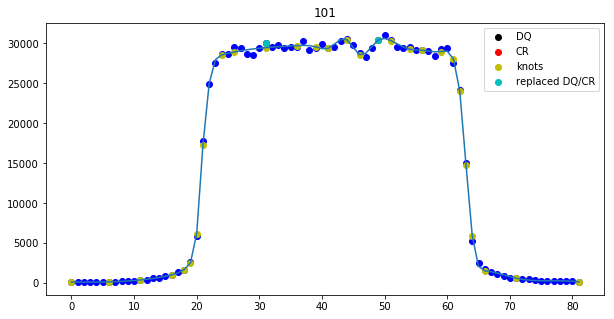

197 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 2]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 3
nr. of CRs 1212
Spectrum located at pixel 124 in spatial direction
subexp 120.60501340491888 [204, 162, 120, 78]
ypix is 120 for exposure 2


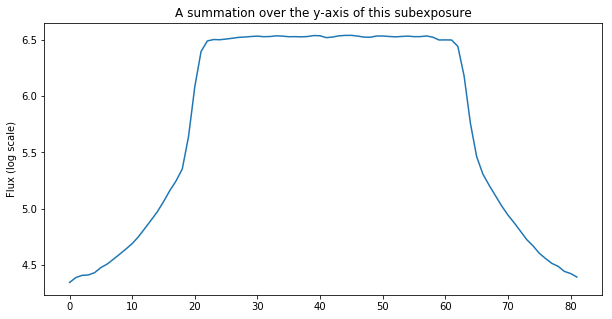

The difference between the two edges (for a 5-pixel bin for all subexps is): 590.2541666666667
This value may not be larger than  4405.914570211275  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1252145.8626907943 pl 1252145.8626907943 41.248413
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


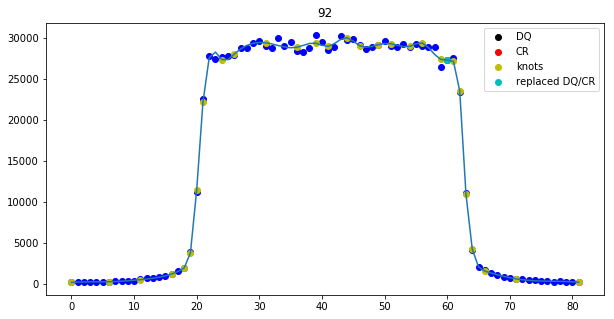

1275050.362936764 pl 1275050.362936764 41.733246
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


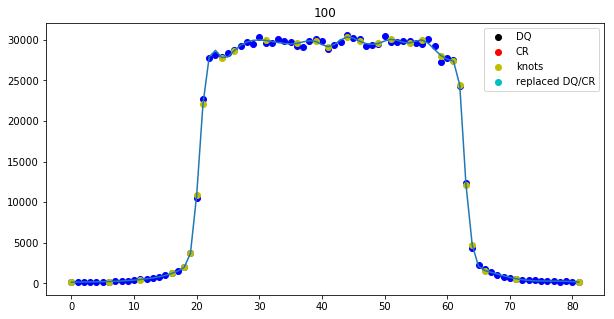

1265660.21302713 pl 1265660.21302713 41.71127
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


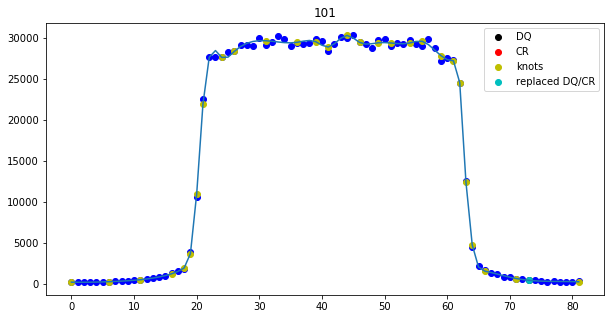

188 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 9]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 4
nr. of CRs 1202
Spectrum located at pixel 124 in spatial direction
subexp 78.05806939945019 [204, 162, 120, 78]
ypix is 78 for exposure 3


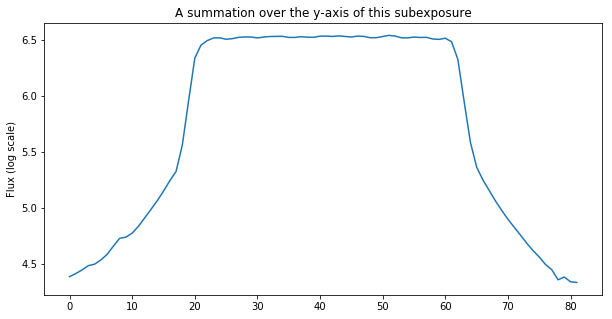

The difference between the two edges (for a 5-pixel bin for all subexps is): 577.0432291666667
This value may not be larger than  4404.735875547288  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1246278.4433662053 pl 1246278.4433662053 41.489403
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


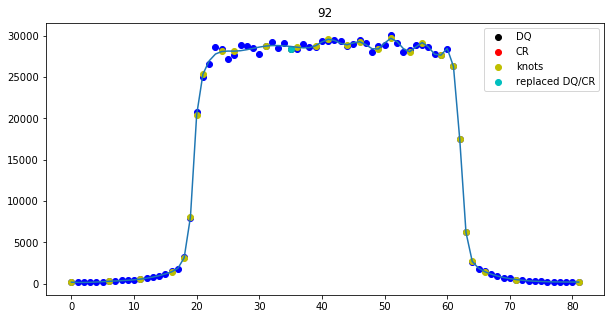

1273717.2058815819 pl 1273717.2058815819 41.855667
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


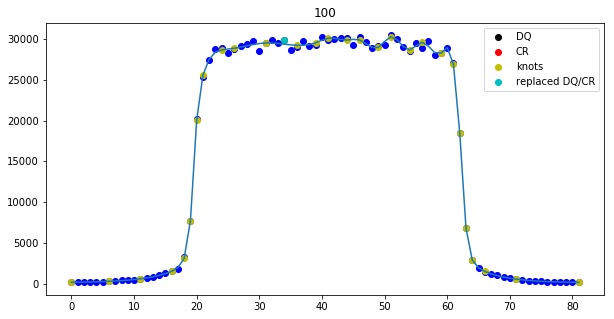

1263572.524697457 pl 1263572.524697457 41.42754
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


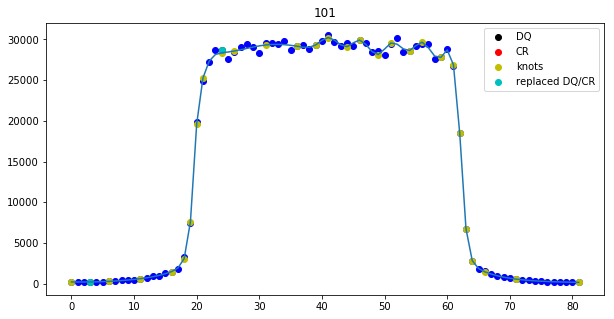

Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Shifted subexposure nr. 1 with -0.396775436827 pixels and shrunk 0.240236764638 percent.
Shifted subexposure nr. 2 with -0.761430530661 pixels and shrunk 0.452994463339 percent.
Shifted subexposure nr. 3 with -1.10621960412 pixels and shrunk 0.676439154697 percent.
Saving spectrum to /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/ie9301bhq_spec.txt
Extraction took 2.65s
########################################
###########Finished Extraction##########
########################################
ie9301bhq
########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie9301biq_ima.fits
For configuration, see pipeline conf file: /Use

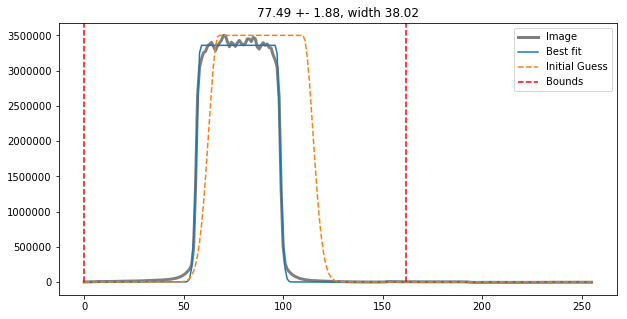

(array([[  5.903717  ,  14.888336  , -32.46611   , ..., -15.101448  ,
        -41.72133   , -27.44011   ],
       [  3.595749  , -26.619118  , -32.93155   , ..., -12.0733185 ,
         -9.583069  , -63.90744   ],
       [-14.7948    ,  52.63404   ,  16.429794  , ..., -11.968643  ,
         -0.41786957, -34.981064  ],
       ...,
       [-42.276413  ,  -3.456314  , -26.235214  , ...,   3.2783356 ,
        -35.7007    , -15.819809  ],
       [  3.5300446 , -11.912308  ,  -7.8475494 , ...,   2.7389069 ,
         27.594696  ,  13.231384  ],
       [  2.057541  ,   5.6520844 , -32.440903  , ..., -20.064926  ,
        -15.768997  , -10.856186  ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.01597487, 0.99097391, 1.001089

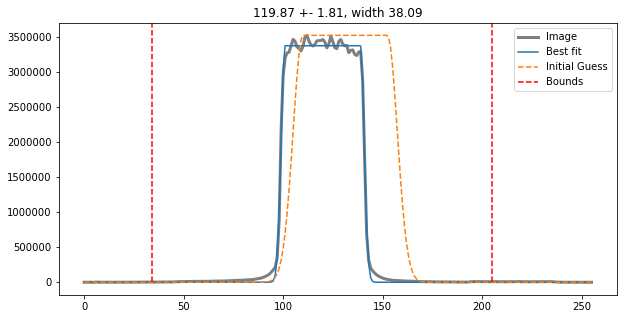

(array([[ 38.572124 ,  25.580494 ,  26.330112 , ...,  64.40802  ,
        -40.280018 , -23.209064 ],
       [ 47.09717  ,  18.948101 ,  -9.432514 , ...,  21.786701 ,
         -9.533543 ,   2.5935783],
       [ 20.380268 ,  16.742764 ,   8.49271  , ...,  50.122807 ,
         19.807735 , -11.940105 ],
       ...,
       [ 42.03725  ,  21.7347   , -25.776577 , ...,  24.61687  ,
        -20.896008 , -33.49992  ],
       [ 45.012318 ,  35.918316 ,  -0.5349388, ...,  27.40932  ,
         39.591938 ,  52.025715 ],
       [ -3.1118736,  -4.9589806,   0.4869728, ...,  26.292362 ,
          9.018803 ,   4.6944923]], dtype=float32), array([[1.00005887, 0.99631715, 1.01913849, ..., 1.01117496, 0.9857711 ,
        1.00169883],
       [1.0077967 , 1.00066505, 0.99113703, ..., 0.97842318, 0.98744521,
        0.98047949],
       [0.98492686, 0.9683537 , 0.97322563, ..., 0.98656412, 1.01614636,
        0.99626665],
       ...,
       [0.99159165, 0.96546904, 0.93943933, ..., 0.99333385, 0.98981972,
   

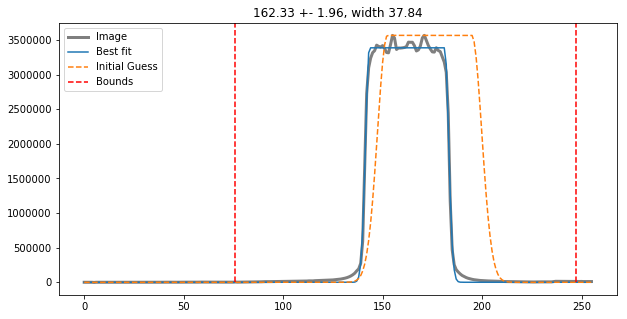

(array([[ -3.8168945,  34.81703  ,  -8.776047 , ...,   6.355259 ,
         -6.8055687,  25.529297 ],
       [ 10.882416 ,  13.893341 , -23.893238 , ..., -16.028835 ,
          9.499977 ,  -4.6267433],
       [ 16.426445 , -11.475704 ,  22.761604 , ...,  27.924904 ,
         -6.0504913,  33.90348  ],
       ...,
       [ -8.787991 ,  10.950588 ,  -4.828842 , ...,  31.321487 ,
         14.411186 , -15.965424 ],
       [ -2.765396 ,  -7.466526 ,  14.3507   , ...,   8.237595 ,
          0.6995468,  19.315498 ],
       [  9.350311 ,  25.592918 ,  23.1025   , ...,  -1.3516884,
         -7.87191  ,  36.472794 ]], dtype=float32), array([[0.98118528, 0.99323157, 1.00366311, ..., 0.98204106, 0.9522191 ,
        0.97554738],
       [0.97276955, 0.98545687, 1.00024228, ..., 0.99504684, 0.98786921,
        0.98946573],
       [1.01984942, 1.02008576, 0.99551588, ..., 0.97861723, 0.98087129,
        0.98033262],
       ...,
       [0.95235794, 0.96168618, 1.00095344, ..., 0.98480437, 0.99359909,
   

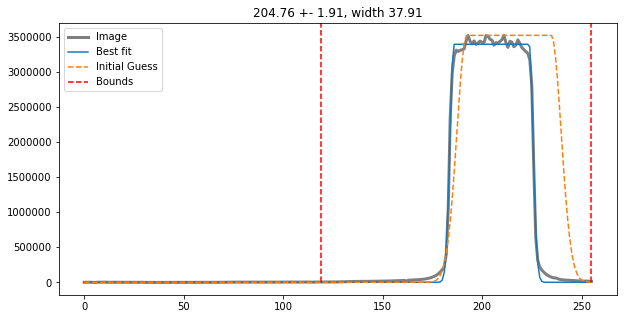

(array([[ -2.5966187 ,   2.000431  , -17.363554  , ..., -14.402403  ,
         23.710117  ,  -0.83921814],
       [ 12.343914  ,   1.8188667 ,  17.370365  , ...,  88.40431   ,
         66.96498   , -11.3233795 ],
       [ 33.573048  ,  33.343967  ,  42.184475  , ...,   1.2738228 ,
         23.838688  ,  20.29182   ],
       ...,
       [ 13.534649  ,  32.90787   ,   9.429401  , ...,  31.473194  ,
         39.673626  ,  15.384754  ],
       [ -7.414482  , -25.697552  ,  20.457966  , ...,  -4.479145  ,
         23.581745  ,  24.579372  ],
       [ 44.96867   ,   3.8688583 ,  80.16853   , ...,  11.74926   ,
         74.00894   ,  37.496296  ]], dtype=float32), array([[1.01551701, 0.9995939 , 1.0131288 , ..., 0.99402601, 0.99839718,
        1.0051168 ],
       [0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       ...,
       [0.99049433, 0.98990652, 1.018020

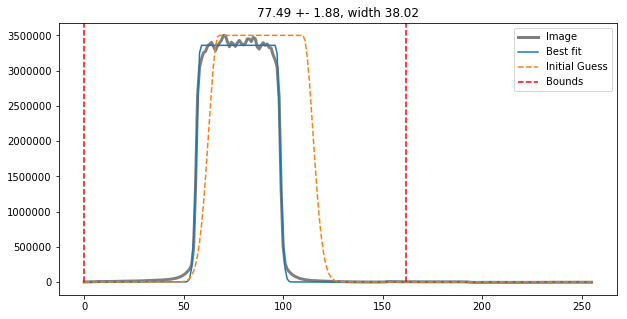

(array([[  5.903717  ,  14.888336  , -32.46611   , ..., -15.101448  ,
        -41.72133   , -27.44011   ],
       [  3.595749  , -26.619118  , -32.93155   , ..., -12.0733185 ,
         -9.583069  , -63.90744   ],
       [-14.7948    ,  52.63404   ,  16.429794  , ..., -11.968643  ,
         -0.41786957, -34.981064  ],
       ...,
       [-42.276413  ,  -3.456314  , -26.235214  , ...,   3.2783356 ,
        -35.7007    , -15.819809  ],
       [  3.5300446 , -11.912308  ,  -7.8475494 , ...,   2.7389069 ,
         27.594696  ,  13.231384  ],
       [  2.057541  ,   5.6520844 , -32.440903  , ..., -20.064926  ,
        -15.768997  , -10.856186  ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.01597487, 0.99097391, 1.001089

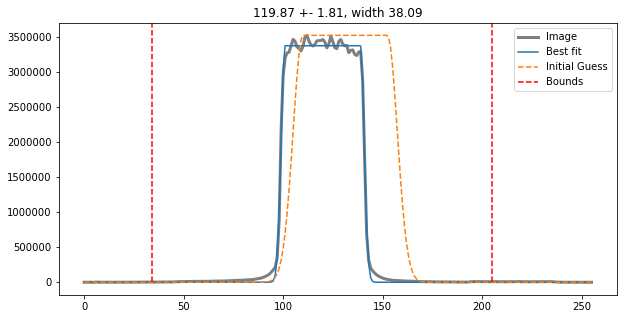

(array([[ 38.572124 ,  25.580494 ,  26.330112 , ...,  64.40802  ,
        -40.280018 , -23.209064 ],
       [ 47.09717  ,  18.948101 ,  -9.432514 , ...,  21.786701 ,
         -9.533543 ,   2.5935783],
       [ 20.380268 ,  16.742764 ,   8.49271  , ...,  50.122807 ,
         19.807735 , -11.940105 ],
       ...,
       [ 42.03725  ,  21.7347   , -25.776577 , ...,  24.61687  ,
        -20.896008 , -33.49992  ],
       [ 45.012318 ,  35.918316 ,  -0.5349388, ...,  27.40932  ,
         39.591938 ,  52.025715 ],
       [ -3.1118736,  -4.9589806,   0.4869728, ...,  26.292362 ,
          9.018803 ,   4.6944923]], dtype=float32), array([[1.00005887, 0.99631715, 1.01913849, ..., 1.01117496, 0.9857711 ,
        1.00169883],
       [1.0077967 , 1.00066505, 0.99113703, ..., 0.97842318, 0.98744521,
        0.98047949],
       [0.98492686, 0.9683537 , 0.97322563, ..., 0.98656412, 1.01614636,
        0.99626665],
       ...,
       [0.99159165, 0.96546904, 0.93943933, ..., 0.99333385, 0.98981972,
   

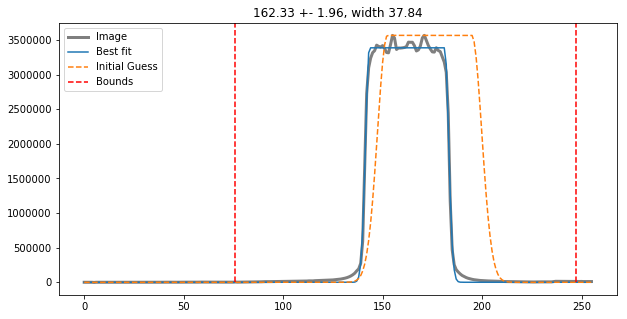

(array([[ -3.8168945,  34.81703  ,  -8.776047 , ...,   6.355259 ,
         -6.8055687,  25.529297 ],
       [ 10.882416 ,  13.893341 , -23.893238 , ..., -16.028835 ,
          9.499977 ,  -4.6267433],
       [ 16.426445 , -11.475704 ,  22.761604 , ...,  27.924904 ,
         -6.0504913,  33.90348  ],
       ...,
       [ -8.787991 ,  10.950588 ,  -4.828842 , ...,  31.321487 ,
         14.411186 , -15.965424 ],
       [ -2.765396 ,  -7.466526 ,  14.3507   , ...,   8.237595 ,
          0.6995468,  19.315498 ],
       [  9.350311 ,  25.592918 ,  23.1025   , ...,  -1.3516884,
         -7.87191  ,  36.472794 ]], dtype=float32), array([[0.98118528, 0.99323157, 1.00366311, ..., 0.98204106, 0.9522191 ,
        0.97554738],
       [0.97276955, 0.98545687, 1.00024228, ..., 0.99504684, 0.98786921,
        0.98946573],
       [1.01984942, 1.02008576, 0.99551588, ..., 0.97861723, 0.98087129,
        0.98033262],
       ...,
       [0.95235794, 0.96168618, 1.00095344, ..., 0.98480437, 0.99359909,
   

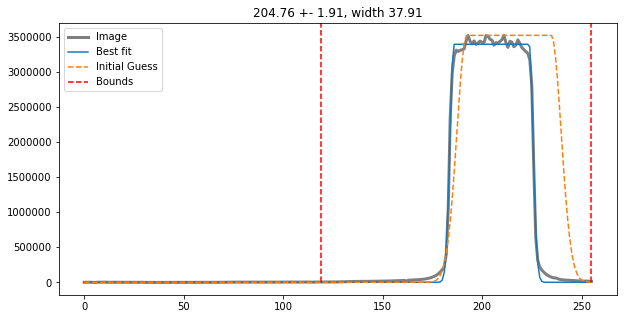

(array([[ -2.5966187 ,   2.000431  , -17.363554  , ..., -14.402403  ,
         23.710117  ,  -0.83921814],
       [ 12.343914  ,   1.8188667 ,  17.370365  , ...,  88.40431   ,
         66.96498   , -11.3233795 ],
       [ 33.573048  ,  33.343967  ,  42.184475  , ...,   1.2738228 ,
         23.838688  ,  20.29182   ],
       ...,
       [ 13.534649  ,  32.90787   ,   9.429401  , ...,  31.473194  ,
         39.673626  ,  15.384754  ],
       [ -7.414482  , -25.697552  ,  20.457966  , ...,  -4.479145  ,
         23.581745  ,  24.579372  ],
       [ 44.96867   ,   3.8688583 ,  80.16853   , ...,  11.74926   ,
         74.00894   ,  37.496296  ]], dtype=float32), array([[1.01551701, 0.9995939 , 1.0131288 , ..., 0.99402601, 0.99839718,
        1.0051168 ],
       [0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       ...,
       [0.99049433, 0.98990652, 1.018020

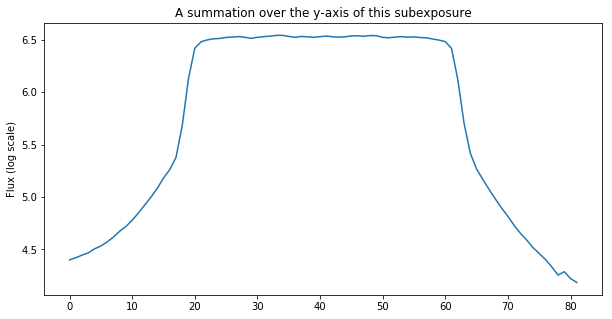

The difference between the two edges (for a 5-pixel bin for all subexps is): 1475.263671875
This value may not be larger than  4401.573052140942  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Using flux for variance estimate
Extracting spectrum with optimal extraction...
1244697.3861504288 pl 1244697.3861504288 41.50315
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


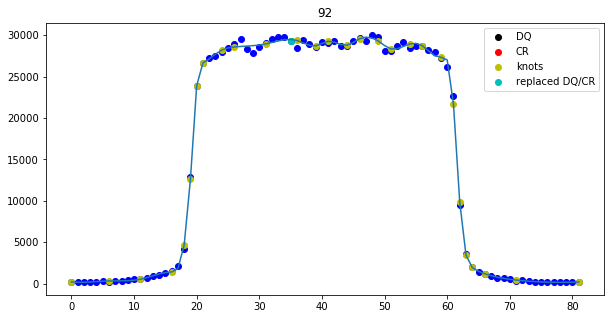

1271277.6174061412 pl 1271277.6174061412 41.472298
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


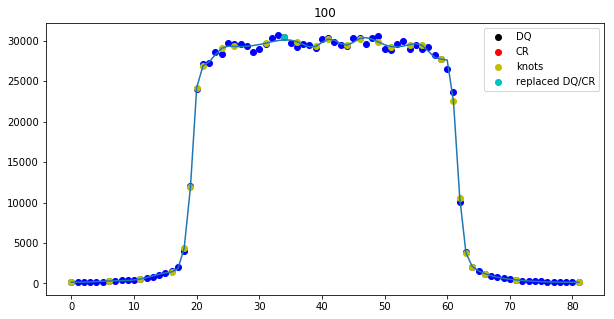

1262732.336220576 pl 1262732.336220576 41.190216
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


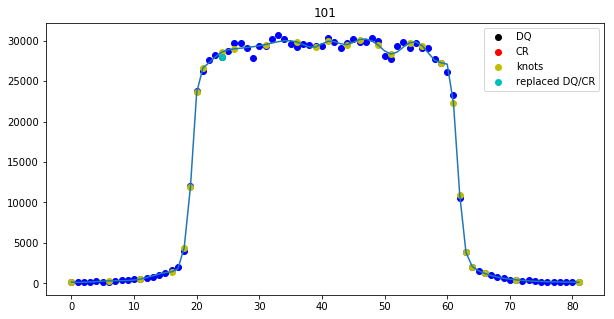

Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 16]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 2
nr. of CRs 1171
Spectrum located at pixel 124 in spatial direction
subexp 119.87221722661002 [204, 162, 120, 78]
ypix is 120 for exposure 1


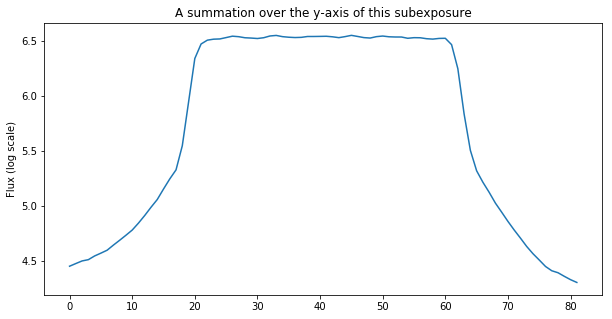

The difference between the two edges (for a 5-pixel bin for all subexps is): 1297.08125
This value may not be larger than  4415.531617672629  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1255695.3295552975 pl 1255695.3295552975 41.161358
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


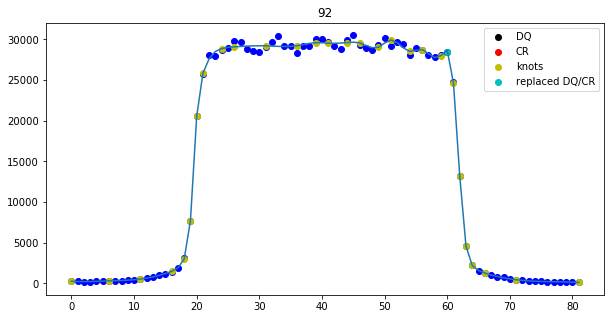

1279957.1242960028 pl 1279957.1242960028 40.831642
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


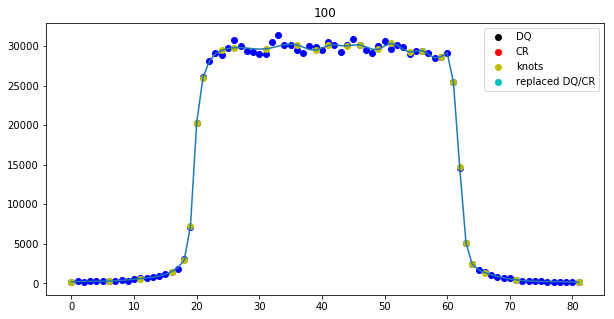

1273920.7786013493 pl 1273920.7786013493 41.10155
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


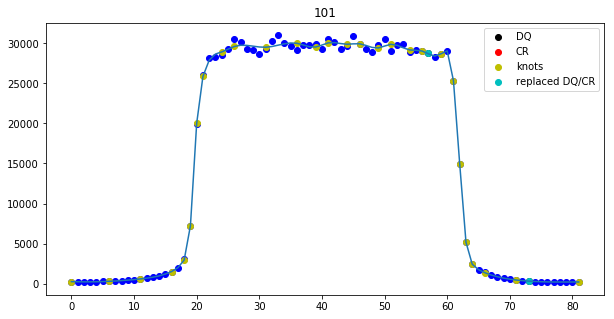

189 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 3
nr. of CRs 1154
Spectrum located at pixel 124 in spatial direction
subexp 162.3275485936315 [204, 162, 120, 78]
ypix is 162 for exposure 2


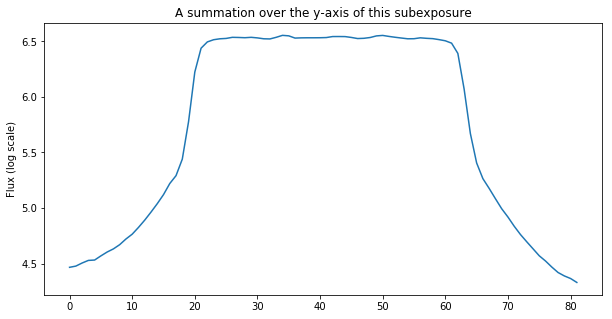

The difference between the two edges (for a 5-pixel bin for all subexps is): 1149.4924479166666
This value may not be larger than  4436.216285680099  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1274914.6924935817 pl 1274914.6924935817 40.29829
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


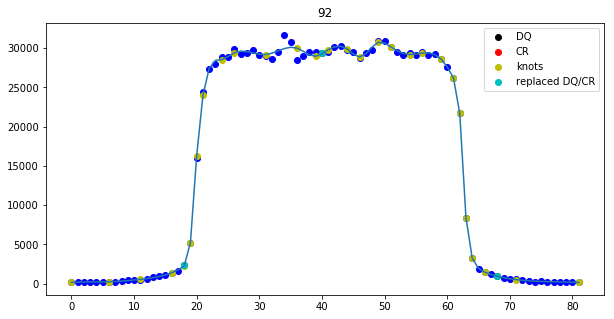

1291465.6552414487 pl 1291465.6552414487 40.967773
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


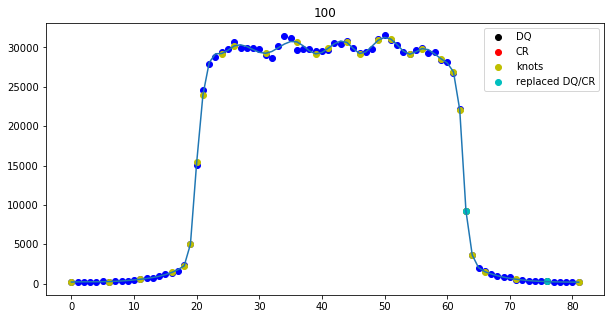

1284721.262550651 pl 1284721.262550651 41.044712
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


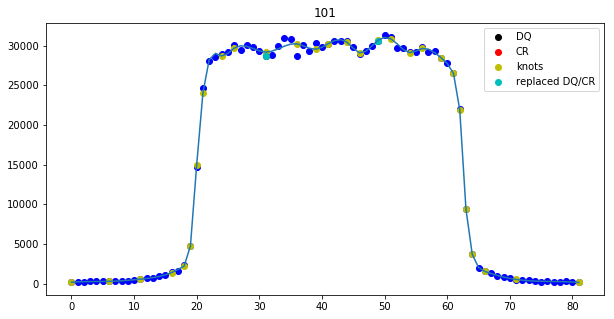

197 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 3]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 4
nr. of CRs 1170
Spectrum located at pixel 124 in spatial direction
subexp 204.7550987885512 [204, 162, 120, 78]
ypix is 204 for exposure 3


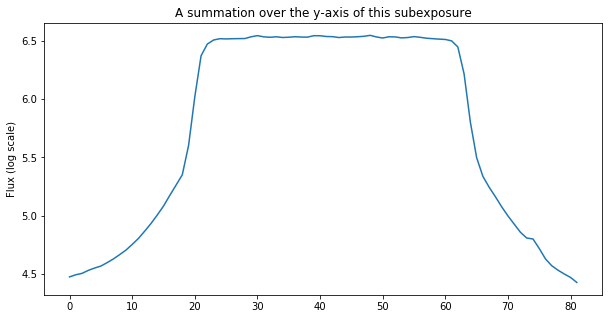

The difference between the two edges (for a 5-pixel bin for all subexps is): 581.828125
This value may not be larger than  4438.113473087411  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1285151.2525015825 pl 1285151.2525015825 40.868645
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


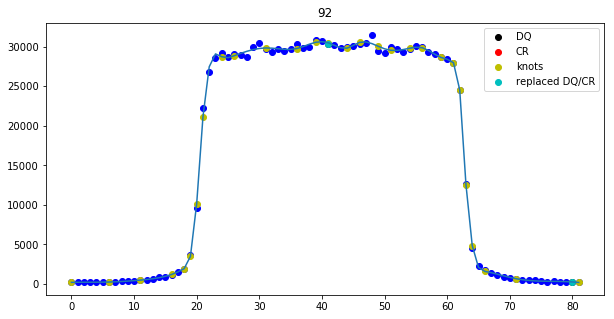

1294256.189960162 pl 1294256.189960162 41.87465
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


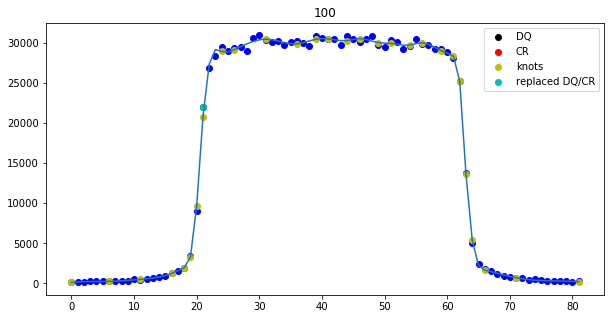

1288474.3097940637 pl 1288474.3097940637 41.208908
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


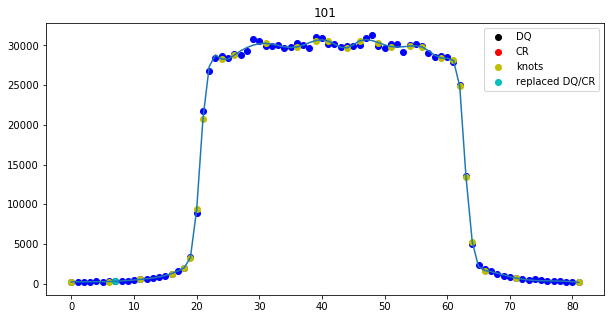

197 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 2]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Applied an xshift of 0.0110040293578 pix compared to reference (reduced) spectrum ie9301bhq
Shifted subexposure nr. 0 with -1.0820172753 pixels and shrunk 0.664947575813 percent.
Shifted subexposure nr. 1 with -0.757846894245 pixels and shrunk 0.451948244141 percent.
Shifted subexposure nr. 2 with -0.378542020719 pixels and shrunk 0.226235266377 percent.
Saving spectrum to /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/ie9301biq_spec.txt
Extraction took 2.60s
########################################
###########Finished Extraction##########
########################################
ie9301biq
########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v12

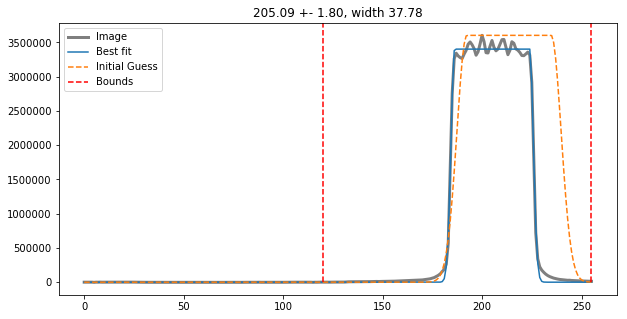

(array([[  4.1943054 ,  17.699768  ,   5.6734314 , ...,  23.306     ,
         12.295349  , -19.298752  ],
       [ -5.8797607 , -25.578735  ,  13.997589  , ...,  28.818848  ,
        -28.373932  ,  32.34607   ],
       [ 23.390808  ,   9.745392  ,  -1.3339539 , ...,  20.604904  ,
         -9.305145  ,  14.903397  ],
       ...,
       [ 40.848465  ,   6.807968  , -14.080017  , ...,  49.163284  ,
         61.4254    ,  -1.7418213 ],
       [  7.8598175 ,  -6.2708282 ,   7.350174  , ...,  37.87773   ,
          2.664627  ,  70.144005  ],
       [ 17.86554   ,   9.657608  ,  -0.31860352, ...,  59.998383  ,
         51.64969   ,  45.33069   ]], dtype=float32), array([[0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       [1.01465568, 1.01152106, 0.97465585, ..., 0.99614412, 0.99226877,
        0.99630135],
       ...,
       [0.99049433, 0.98990652, 1.018020

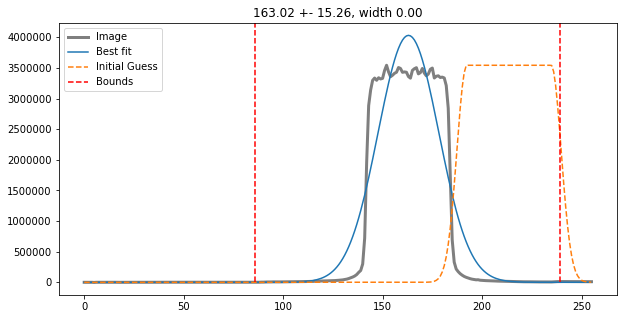

(array([[ 31.226696 ,  44.41325  ,  13.834713 , ...,  18.150478 ,
         21.107433 ,  44.19958  ],
       [  5.205471 ,  19.994991 ,  -0.2245369, ...,  18.808239 ,
         30.461788 ,   8.449642 ],
       [  1.6192894,   9.730099 ,  50.91203  , ...,  12.572308 ,
        -33.11907  ,  -3.3793068],
       ...,
       [ 23.030453 ,  21.017193 ,  -5.4668083, ..., -27.498775 ,
        -20.426014 , -14.3950615],
       [ -6.156803 ,  -5.0093803,  29.544613 , ..., -20.834797 ,
         -2.3941689,  18.32996  ],
       [ 30.62524  ,   9.101795 , -46.356907 , ...,  31.829014 ,
         28.937695 ,   3.0713997]], dtype=float32), array([[0.97797824, 1.01717404, 1.02369336, ..., 0.97947431, 0.99055837,
        0.97462096],
       [0.86756175, 1.00057105, 1.00078321, ..., 0.98511468, 0.98741866,
        0.97093693],
       [1.04421316, 1.00141875, 0.96262652, ..., 0.98749226, 1.01309426,
        0.9847939 ],
       ...,
       [0.98067773, 1.00647348, 0.9807526 , ..., 1.00480205, 0.98312882,
   

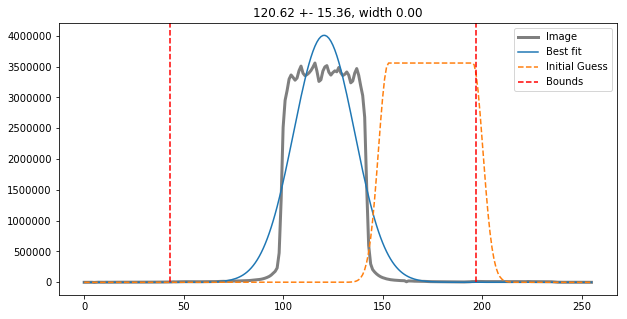

(array([[ 5.5205872e+01,  5.1491730e+01,  5.0123734e+01, ...,
        -2.1358887e+01,  2.5562782e+01,  1.2172974e+01],
       [ 2.1489349e+01,  2.2566147e+01,  7.4538055e+01, ...,
         3.9131165e-02, -1.9752579e+00,  1.6563644e+00],
       [ 2.6717316e+01,  2.5562668e+01,  6.6367477e+01, ...,
        -1.7086746e+01,  4.9127090e+01, -1.7070885e+01],
       ...,
       [ 7.4318886e+00,  1.3975685e+01,  1.6022156e+01, ...,
         1.7115784e+01, -3.0017387e+01, -1.2056149e+01],
       [ 3.4096260e+01,  3.0344147e+01,  6.7700958e-01, ...,
        -3.7257210e+01,  1.7451736e+01,  9.1120605e+00],
       [-2.3249512e+00,  3.8433914e+00,  1.1334324e+01, ...,
        -2.8808598e+01, -1.4876560e+01,  6.1714554e+01]], dtype=float32), array([[0.99152216, 0.98206137, 0.98798856, ..., 0.9900434 , 0.97864713,
        0.99251526],
       [1.0128799 , 0.96209698, 1.03174513, ..., 1.00765806, 0.99389191,
        0.98775042],
       [0.99974451, 0.98079478, 0.99440176, ..., 0.99625174, 0.9890361 ,
 

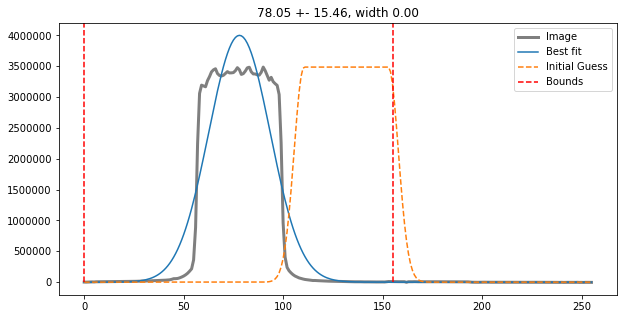

(array([[ 17.990486  , -16.168507  , -13.736992  , ..., -14.827286  ,
        -56.51155   , -46.935467  ],
       [  0.6230278 ,  10.638466  ,  -0.22993469, ..., -12.709305  ,
        -13.611759  , -31.530785  ],
       [  5.588707  ,  32.68599   , -13.509541  , ..., -41.830894  ,
         25.578278  , -38.573402  ],
       ...,
       [  3.0595474 ,   5.057724  ,  27.860382  , ..., -16.149727  ,
          0.21662521,  -6.394207  ],
       [-20.312607  , -43.188953  , -28.197544  , ..., -26.314312  ,
         20.462463  ,   1.0577736 ],
       [ -9.569843  , -52.94378   , -12.705017  , ...,  -7.435028  ,
         -3.9978485 ,  16.37619   ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.03028248, 1.00843969, 1.014272

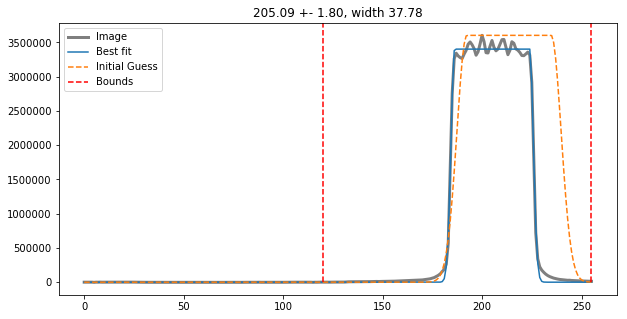

(array([[  4.1943054 ,  17.699768  ,   5.6734314 , ...,  23.306     ,
         12.295349  , -19.298752  ],
       [ -5.8797607 , -25.578735  ,  13.997589  , ...,  28.818848  ,
        -28.373932  ,  32.34607   ],
       [ 23.390808  ,   9.745392  ,  -1.3339539 , ...,  20.604904  ,
         -9.305145  ,  14.903397  ],
       ...,
       [ 40.848465  ,   6.807968  , -14.080017  , ...,  49.163284  ,
         61.4254    ,  -1.7418213 ],
       [  7.8598175 ,  -6.2708282 ,   7.350174  , ...,  37.87773   ,
          2.664627  ,  70.144005  ],
       [ 17.86554   ,   9.657608  ,  -0.31860352, ...,  59.998383  ,
         51.64969   ,  45.33069   ]], dtype=float32), array([[0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       [1.01465568, 1.01152106, 0.97465585, ..., 0.99614412, 0.99226877,
        0.99630135],
       ...,
       [0.99049433, 0.98990652, 1.018020

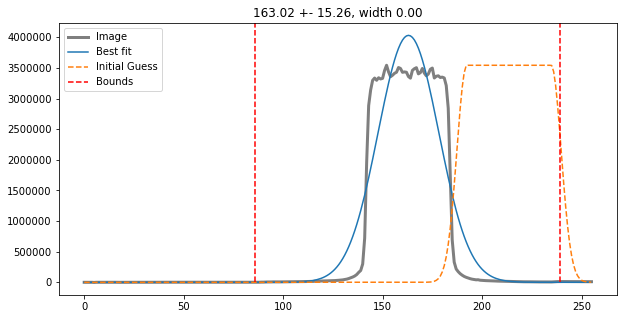

(array([[ 31.226696 ,  44.41325  ,  13.834713 , ...,  18.150478 ,
         21.107433 ,  44.19958  ],
       [  5.205471 ,  19.994991 ,  -0.2245369, ...,  18.808239 ,
         30.461788 ,   8.449642 ],
       [  1.6192894,   9.730099 ,  50.91203  , ...,  12.572308 ,
        -33.11907  ,  -3.3793068],
       ...,
       [ 23.030453 ,  21.017193 ,  -5.4668083, ..., -27.498775 ,
        -20.426014 , -14.3950615],
       [ -6.156803 ,  -5.0093803,  29.544613 , ..., -20.834797 ,
         -2.3941689,  18.32996  ],
       [ 30.62524  ,   9.101795 , -46.356907 , ...,  31.829014 ,
         28.937695 ,   3.0713997]], dtype=float32), array([[0.97797824, 1.01717404, 1.02369336, ..., 0.97947431, 0.99055837,
        0.97462096],
       [0.86756175, 1.00057105, 1.00078321, ..., 0.98511468, 0.98741866,
        0.97093693],
       [1.04421316, 1.00141875, 0.96262652, ..., 0.98749226, 1.01309426,
        0.9847939 ],
       ...,
       [0.98067773, 1.00647348, 0.9807526 , ..., 1.00480205, 0.98312882,
   

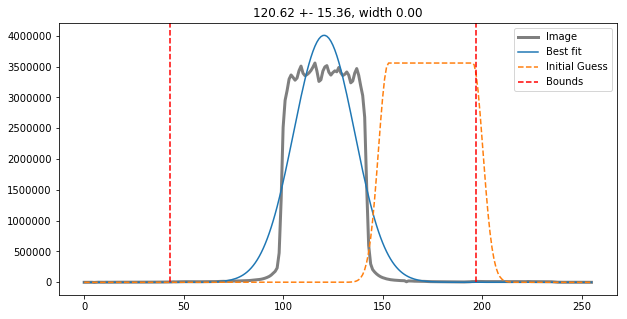

(array([[ 5.5205872e+01,  5.1491730e+01,  5.0123734e+01, ...,
        -2.1358887e+01,  2.5562782e+01,  1.2172974e+01],
       [ 2.1489349e+01,  2.2566147e+01,  7.4538055e+01, ...,
         3.9131165e-02, -1.9752579e+00,  1.6563644e+00],
       [ 2.6717316e+01,  2.5562668e+01,  6.6367477e+01, ...,
        -1.7086746e+01,  4.9127090e+01, -1.7070885e+01],
       ...,
       [ 7.4318886e+00,  1.3975685e+01,  1.6022156e+01, ...,
         1.7115784e+01, -3.0017387e+01, -1.2056149e+01],
       [ 3.4096260e+01,  3.0344147e+01,  6.7700958e-01, ...,
        -3.7257210e+01,  1.7451736e+01,  9.1120605e+00],
       [-2.3249512e+00,  3.8433914e+00,  1.1334324e+01, ...,
        -2.8808598e+01, -1.4876560e+01,  6.1714554e+01]], dtype=float32), array([[0.99152216, 0.98206137, 0.98798856, ..., 0.9900434 , 0.97864713,
        0.99251526],
       [1.0128799 , 0.96209698, 1.03174513, ..., 1.00765806, 0.99389191,
        0.98775042],
       [0.99974451, 0.98079478, 0.99440176, ..., 0.99625174, 0.9890361 ,
 

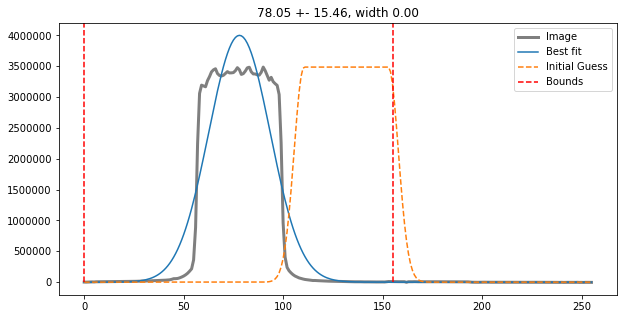

(array([[ 17.990486  , -16.168507  , -13.736992  , ..., -14.827286  ,
        -56.51155   , -46.935467  ],
       [  0.6230278 ,  10.638466  ,  -0.22993469, ..., -12.709305  ,
        -13.611759  , -31.530785  ],
       [  5.588707  ,  32.68599   , -13.509541  , ..., -41.830894  ,
         25.578278  , -38.573402  ],
       ...,
       [  3.0595474 ,   5.057724  ,  27.860382  , ..., -16.149727  ,
          0.21662521,  -6.394207  ],
       [-20.312607  , -43.188953  , -28.197544  , ..., -26.314312  ,
         20.462463  ,   1.0577736 ],
       [ -9.569843  , -52.94378   , -12.705017  , ...,  -7.435028  ,
         -3.9978485 ,  16.37619   ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.03028248, 1.00843969, 1.014272

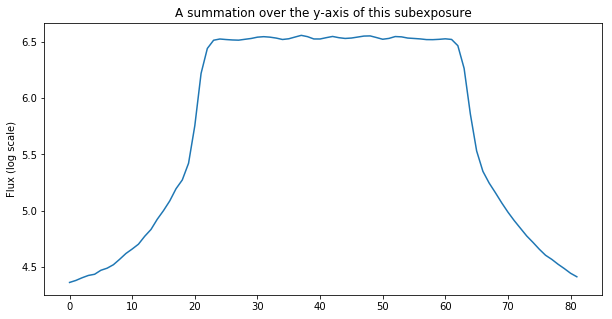

The difference between the two edges (for a 5-pixel bin for all subexps is): 635.9177083333333
This value may not be larger than  4422.437578229153  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Using flux for variance estimate
Extracting spectrum with optimal extraction...
1275480.666117414 pl 1275480.666117414 40.102158
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


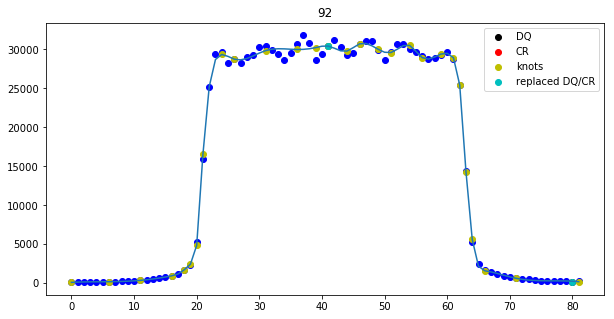

1286574.6936549519 pl 1286574.6936549519 40.508553
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


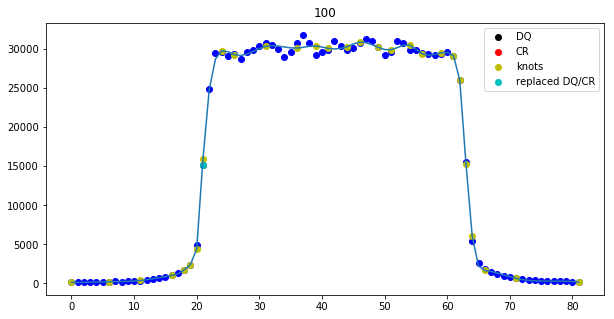

1279875.9517967375 pl 1279875.9517967375 39.789455
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


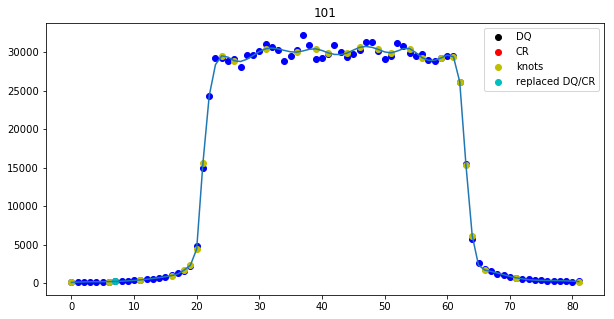

199 successes out of 200 total fits
Optimal extraction fitting failed for columns: [1]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 2
nr. of CRs 1170
Spectrum located at pixel 124 in spatial direction
subexp 163.0165089216225 [204, 162, 120, 78]
ypix is 162 for exposure 1


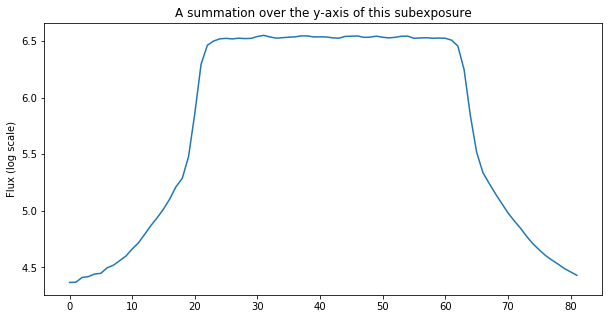

The difference between the two edges (for a 5-pixel bin for all subexps is): 740.4575520833333
This value may not be larger than  4424.27027504725  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1265941.8002086212 pl 1265941.8002086212 41.024002
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


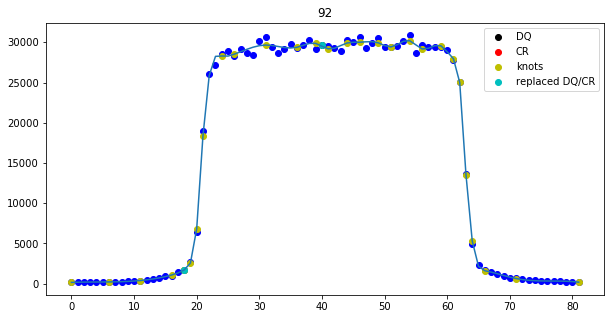

1285213.9381363888 pl 1285213.9381363888 41.253155
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


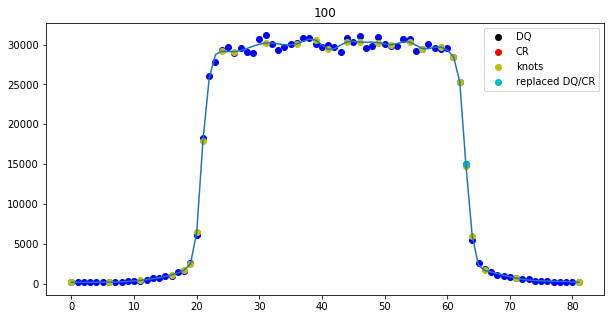

1272329.9516139622 pl 1272329.9516139622 40.88061
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


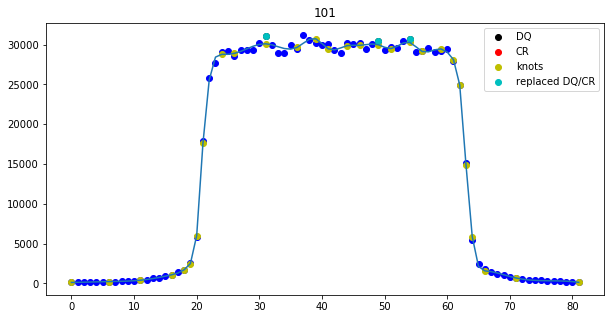

198 successes out of 200 total fits
Optimal extraction fitting failed for columns: [1, 2]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 3
nr. of CRs 1189
Spectrum located at pixel 124 in spatial direction
subexp 120.62035260617718 [204, 162, 120, 78]
ypix is 120 for exposure 2


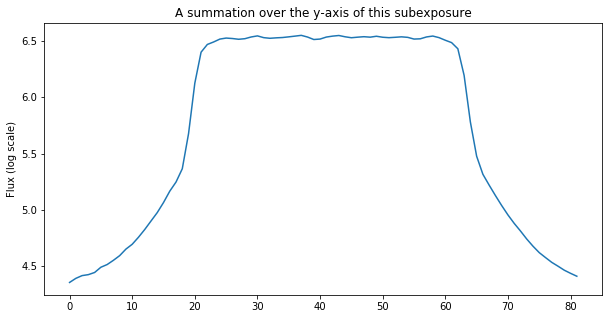

The difference between the two edges (for a 5-pixel bin for all subexps is): 617.2447916666666
This value may not be larger than  4424.489424404433  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1257867.4863464872 pl 1257867.4863464872 40.89511
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


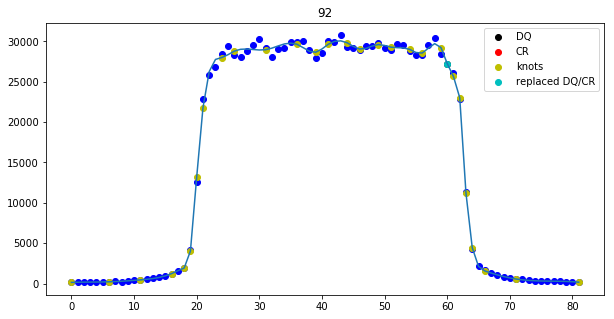

1287067.8978273317 pl 1287067.8978273317 41.269325
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


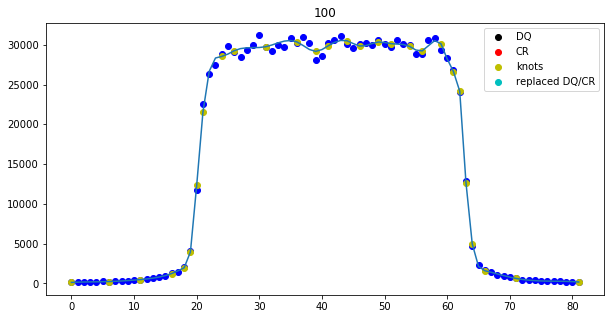

1277474.405974854 pl 1277474.405974854 40.55707
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


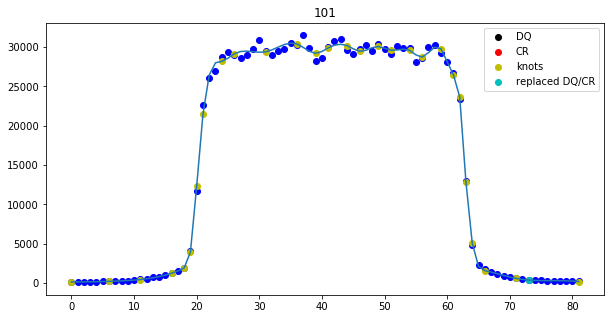

188 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 3, 4, 5, 6, 7, 8, 9]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 4
nr. of CRs 1173
Spectrum located at pixel 124 in spatial direction
subexp 78.0473759842434 [204, 162, 120, 78]
ypix is 78 for exposure 3


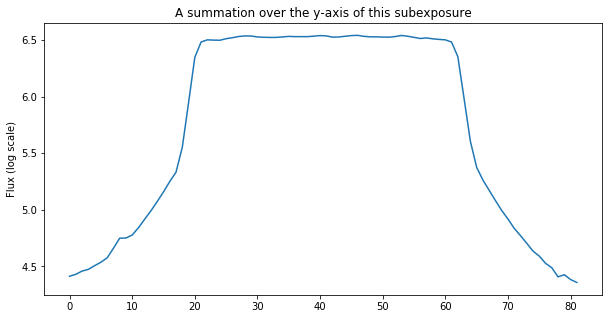

The difference between the two edges (for a 5-pixel bin for all subexps is): 546.9604166666667
This value may not be larger than  4423.270343686144  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1256767.1108243226 pl 1256767.1108243226 41.707355
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


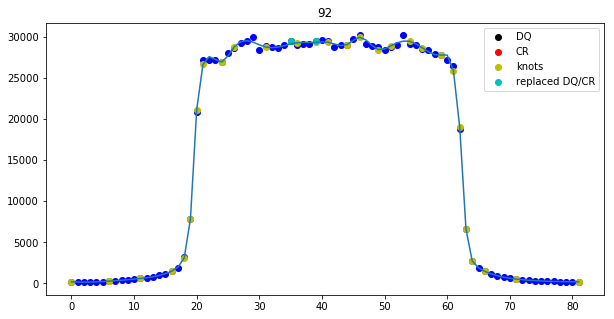

1285466.476367626 pl 1285466.476367626 41.94966
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


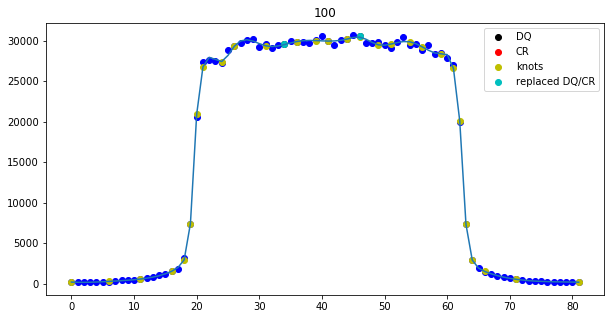

1275304.8373233688 pl 1275304.8373233688 41.52706
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


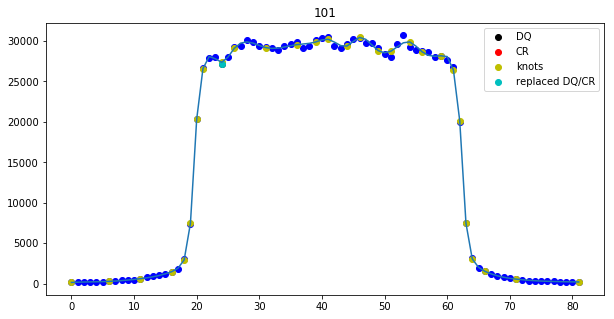

Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 16]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Applied an xshift of 0.0140464757751 pix compared to reference (reduced) spectrum ie9301bhq
Shifted subexposure nr. 1 with -0.395498447262 pixels and shrunk 0.230528128114 percent.
Shifted subexposure nr. 2 with -0.763906879251 pixels and shrunk 0.450460267039 percent.
Shifted subexposure nr. 3 with -1.0851594183 pixels and shrunk 0.66690369202 percent.
Saving spectrum to /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/ie9301bjq_spec.txt
Extraction took 2.58s
########################################
###########Finished Extraction##########
########################################
ie9301bjq
########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/s.baratuva.nl/Desktop/PhD/hst_data_a

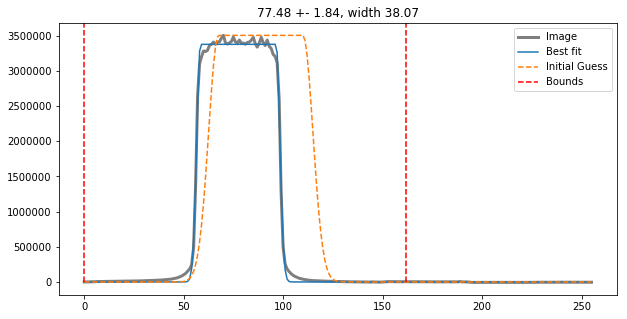

(array([[ 40.251213  ,  32.816505  ,  22.989784  , ..., -15.929359  ,
         -2.7949448 ,  -0.20743561],
       [  2.7602768 ,  26.491325  ,   3.760933  , ...,  17.499092  ,
         17.650337  , -20.30465   ],
       [ 17.20742   ,  28.343544  ,   6.2135315 , ...,  36.309593  ,
        -12.9381485 ,  22.653107  ],
       ...,
       [ 17.758598  , -27.69654   , -17.701088  , ...,  16.574944  ,
         22.38781   ,   4.5492935 ],
       [  2.7009811 , -61.90232   ,   5.367241  , ..., -21.680794  ,
         -8.613686  ,  -1.7605209 ],
       [ 22.295677  ,  11.84417   ,  -9.862526  , ...,  -6.7682266 ,
         18.74279   , -23.490822  ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.01597487, 0.99097391, 1.001089

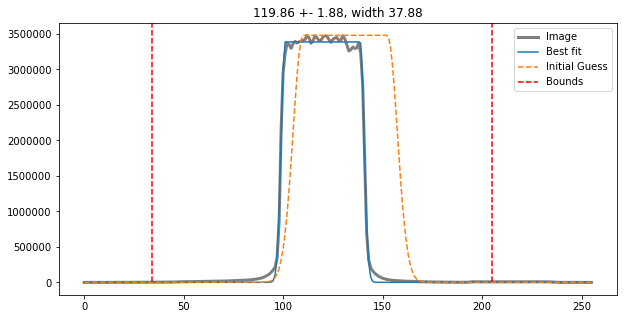

(array([[-1.8750954e+01,  8.1320190e+00, -7.5374527e+00, ...,
         7.2591133e+00, -1.5542374e+00,  6.1636276e+00],
       [-5.5348663e+00,  3.8440704e+00, -8.1173706e+00, ...,
        -2.1333305e+01,  1.0484871e+01,  2.0273819e+01],
       [ 4.7496185e+01, -1.9470444e+01, -4.2643127e+00, ...,
        -1.3130188e-02, -3.0328430e+01,  2.2109085e+01],
       ...,
       [-4.3271660e+01, -7.3875809e+00, -1.0417297e+01, ...,
        -1.6493423e+01, -1.4857590e+01, -1.5674011e+01],
       [ 1.8428574e+00,  4.1912033e+01,  1.2482964e+01, ...,
         2.8016052e+00,  7.9101257e+00, -1.2658783e+01],
       [ 2.1610573e+01,  4.3174728e+01,  2.7552010e+01, ...,
         2.2901718e+01,  9.1374207e-01,  3.1950089e+01]], dtype=float32), array([[1.00005887, 0.99631715, 1.01913849, ..., 1.01117496, 0.9857711 ,
        1.00169883],
       [1.0077967 , 1.00066505, 0.99113703, ..., 0.97842318, 0.98744521,
        0.98047949],
       [0.98492686, 0.9683537 , 0.97322563, ..., 0.98656412, 1.01614636,
 

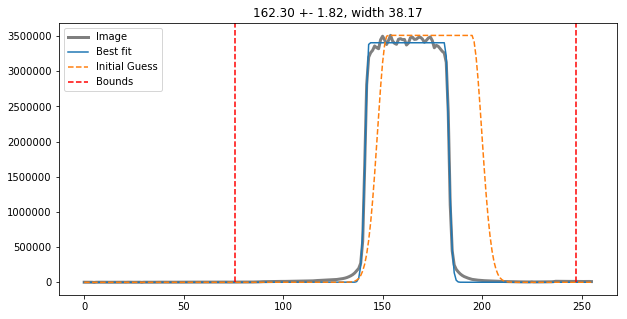

(array([[ -0.19311523, -13.16172   , -47.372566  , ...,   0.61253357,
        -33.59424   ,  -3.5973282 ],
       [ 14.50745   ,  19.862427  ,   5.53183   , ..., -17.0943    ,
         31.81958   , -22.061432  ],
       [ 20.050034  ,  20.294235  , -13.489052  , ...,  24.521965  ,
         30.300919  ,  28.159859  ],
       ...,
       [-21.559868  ,  -8.84486   ,  29.222626  , ...,  25.535118  ,
         29.841843  ,  27.756027  ],
       [ 10.215832  ,  31.267838  ,  -3.103218  , ...,  -9.336426  ,
         25.559883  ,  39.461136  ],
       [ 29.355087  , -10.590797  , -34.15175   , ...,  54.156113  ,
         31.134743  ,  42.47267   ]], dtype=float32), array([[0.98118528, 0.99323157, 1.00366311, ..., 0.98204106, 0.9522191 ,
        0.97554738],
       [0.97276955, 0.98545687, 1.00024228, ..., 0.99504684, 0.98786921,
        0.98946573],
       [1.01984942, 1.02008576, 0.99551588, ..., 0.97861723, 0.98087129,
        0.98033262],
       ...,
       [0.95235794, 0.96168618, 1.000953

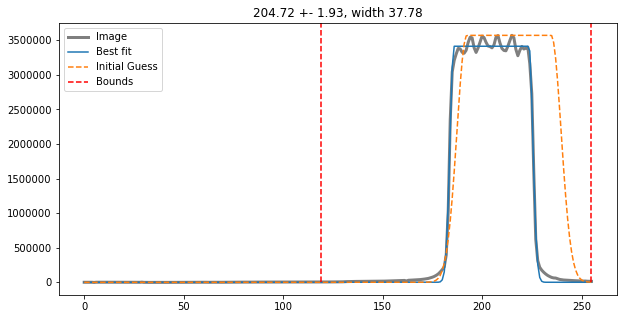

(array([[ 17.241367  , -11.000099  , -13.944584  , ...,  35.776382  ,
         22.441582  , -13.800747  ],
       [-17.075033  , -18.218225  ,   4.37125   , ...,  21.6567    ,
         11.909134  ,  29.500778  ],
       [ 27.610153  ,  -0.76656723,  26.839912  , ...,  25.729164  ,
         -3.154026  ,  28.377312  ],
       ...,
       [-13.488787  ,   5.8855896 ,   8.159874  , ...,  25.47982   ,
         24.25077   ,  65.97346   ],
       [ -1.661541  ,  22.197906  ,   0.45797348, ...,  10.747452  ,
         17.589039  ,  70.45416   ],
       [ 29.651047  ,  51.763557  ,  32.074905  , ...,   1.0416641 ,
         86.87779   ,  78.655174  ]], dtype=float32), array([[1.01551701, 0.9995939 , 1.0131288 , ..., 0.99402601, 0.99839718,
        1.0051168 ],
       [0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       ...,
       [0.99049433, 0.98990652, 1.018020

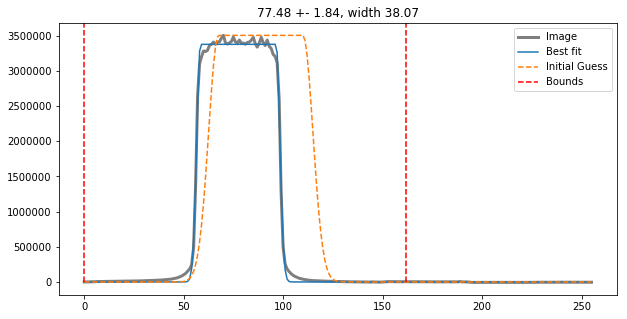

(array([[ 40.251213  ,  32.816505  ,  22.989784  , ..., -15.929359  ,
         -2.7949448 ,  -0.20743561],
       [  2.7602768 ,  26.491325  ,   3.760933  , ...,  17.499092  ,
         17.650337  , -20.30465   ],
       [ 17.20742   ,  28.343544  ,   6.2135315 , ...,  36.309593  ,
        -12.9381485 ,  22.653107  ],
       ...,
       [ 17.758598  , -27.69654   , -17.701088  , ...,  16.574944  ,
         22.38781   ,   4.5492935 ],
       [  2.7009811 , -61.90232   ,   5.367241  , ..., -21.680794  ,
         -8.613686  ,  -1.7605209 ],
       [ 22.295677  ,  11.84417   ,  -9.862526  , ...,  -6.7682266 ,
         18.74279   , -23.490822  ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.01597487, 0.99097391, 1.001089

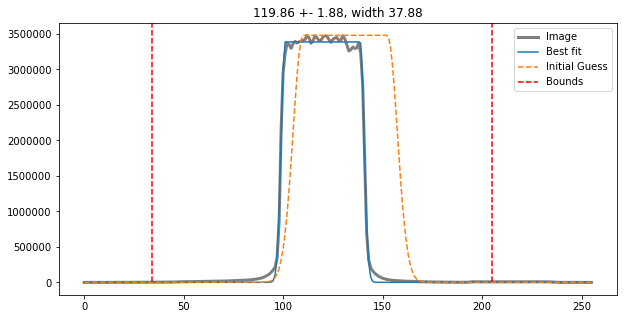

(array([[-1.8750954e+01,  8.1320190e+00, -7.5374527e+00, ...,
         7.2591133e+00, -1.5542374e+00,  6.1636276e+00],
       [-5.5348663e+00,  3.8440704e+00, -8.1173706e+00, ...,
        -2.1333305e+01,  1.0484871e+01,  2.0273819e+01],
       [ 4.7496185e+01, -1.9470444e+01, -4.2643127e+00, ...,
        -1.3130188e-02, -3.0328430e+01,  2.2109085e+01],
       ...,
       [-4.3271660e+01, -7.3875809e+00, -1.0417297e+01, ...,
        -1.6493423e+01, -1.4857590e+01, -1.5674011e+01],
       [ 1.8428574e+00,  4.1912033e+01,  1.2482964e+01, ...,
         2.8016052e+00,  7.9101257e+00, -1.2658783e+01],
       [ 2.1610573e+01,  4.3174728e+01,  2.7552010e+01, ...,
         2.2901718e+01,  9.1374207e-01,  3.1950089e+01]], dtype=float32), array([[1.00005887, 0.99631715, 1.01913849, ..., 1.01117496, 0.9857711 ,
        1.00169883],
       [1.0077967 , 1.00066505, 0.99113703, ..., 0.97842318, 0.98744521,
        0.98047949],
       [0.98492686, 0.9683537 , 0.97322563, ..., 0.98656412, 1.01614636,
 

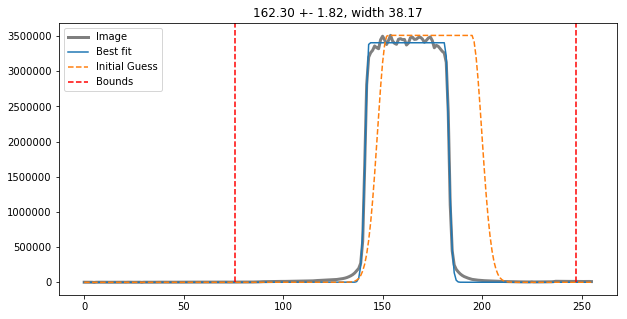

(array([[ -0.19311523, -13.16172   , -47.372566  , ...,   0.61253357,
        -33.59424   ,  -3.5973282 ],
       [ 14.50745   ,  19.862427  ,   5.53183   , ..., -17.0943    ,
         31.81958   , -22.061432  ],
       [ 20.050034  ,  20.294235  , -13.489052  , ...,  24.521965  ,
         30.300919  ,  28.159859  ],
       ...,
       [-21.559868  ,  -8.84486   ,  29.222626  , ...,  25.535118  ,
         29.841843  ,  27.756027  ],
       [ 10.215832  ,  31.267838  ,  -3.103218  , ...,  -9.336426  ,
         25.559883  ,  39.461136  ],
       [ 29.355087  , -10.590797  , -34.15175   , ...,  54.156113  ,
         31.134743  ,  42.47267   ]], dtype=float32), array([[0.98118528, 0.99323157, 1.00366311, ..., 0.98204106, 0.9522191 ,
        0.97554738],
       [0.97276955, 0.98545687, 1.00024228, ..., 0.99504684, 0.98786921,
        0.98946573],
       [1.01984942, 1.02008576, 0.99551588, ..., 0.97861723, 0.98087129,
        0.98033262],
       ...,
       [0.95235794, 0.96168618, 1.000953

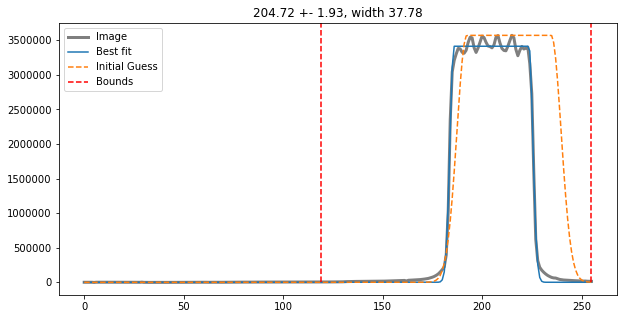

(array([[ 17.241367  , -11.000099  , -13.944584  , ...,  35.776382  ,
         22.441582  , -13.800747  ],
       [-17.075033  , -18.218225  ,   4.37125   , ...,  21.6567    ,
         11.909134  ,  29.500778  ],
       [ 27.610153  ,  -0.76656723,  26.839912  , ...,  25.729164  ,
         -3.154026  ,  28.377312  ],
       ...,
       [-13.488787  ,   5.8855896 ,   8.159874  , ...,  25.47982   ,
         24.25077   ,  65.97346   ],
       [ -1.661541  ,  22.197906  ,   0.45797348, ...,  10.747452  ,
         17.589039  ,  70.45416   ],
       [ 29.651047  ,  51.763557  ,  32.074905  , ...,   1.0416641 ,
         86.87779   ,  78.655174  ]], dtype=float32), array([[1.01551701, 0.9995939 , 1.0131288 , ..., 0.99402601, 0.99839718,
        1.0051168 ],
       [0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       ...,
       [0.99049433, 0.98990652, 1.018020

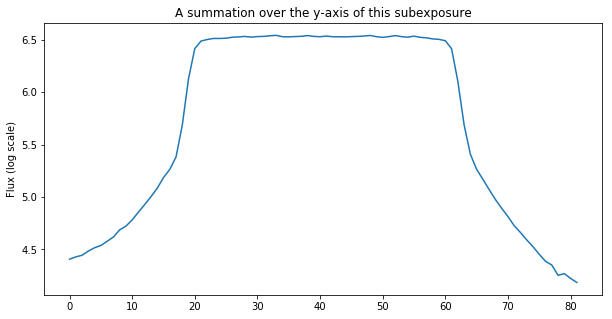

The difference between the two edges (for a 5-pixel bin for all subexps is): 1537.7145833333334
This value may not be larger than  4411.453214833708  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Using flux for variance estimate
Extracting spectrum with optimal extraction...
1247900.3282955748 pl 1247900.3282955748 41.281845
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


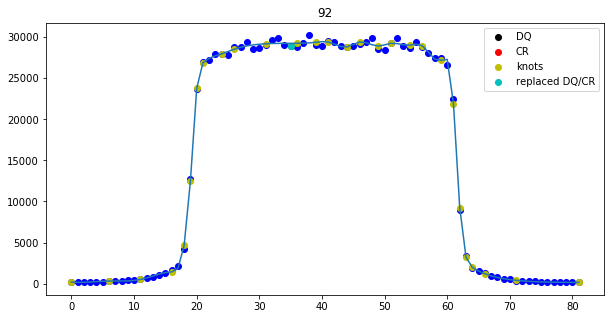

1277675.9260127542 pl 1277675.9260127542 41.39696
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


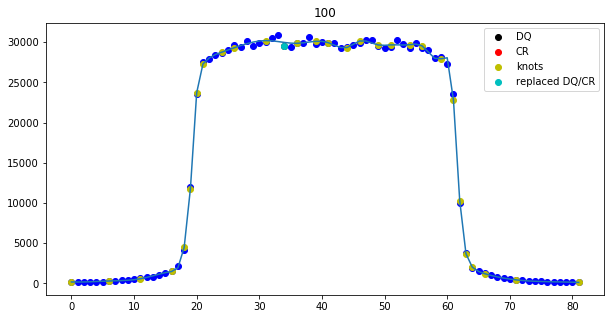

1268269.0411506207 pl 1268269.0411506207 41.256172
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


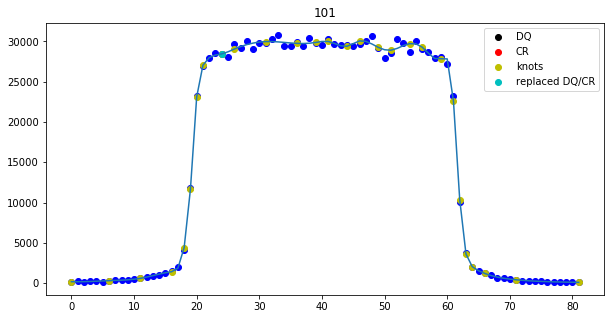

Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 199]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 2
nr. of CRs 1187
Spectrum located at pixel 124 in spatial direction
subexp 119.86444130194883 [204, 162, 120, 78]
ypix is 120 for exposure 1


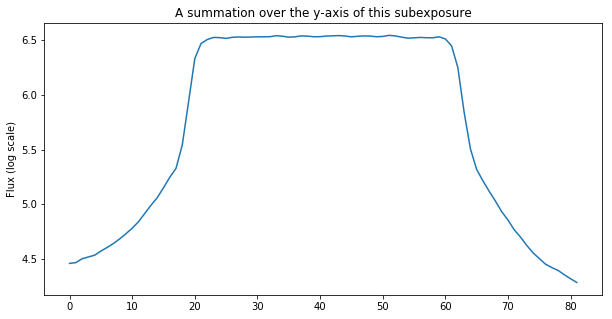

The difference between the two edges (for a 5-pixel bin for all subexps is): 1329.1286458333334
This value may not be larger than  4425.363985029931  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1259416.5735452096 pl 1259416.5735452096 41.142784
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


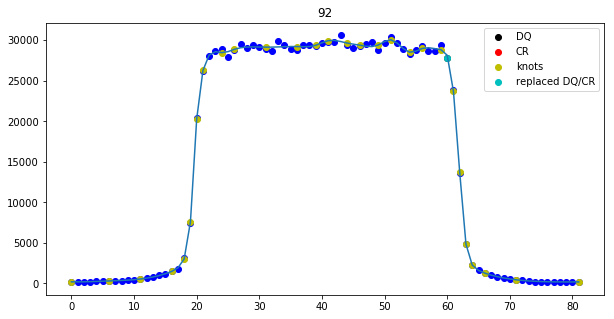

1287878.0835385115 pl 1287878.0835385115 41.63241
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


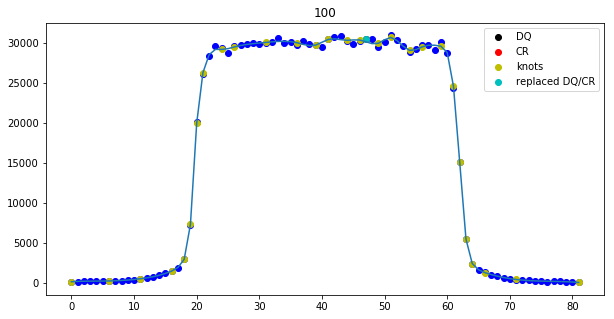

1276299.9664395712 pl 1276299.9664395712 41.861702
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


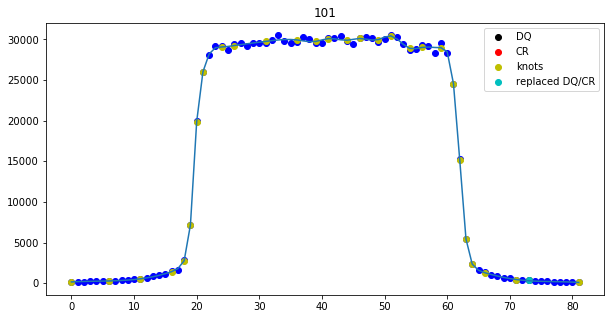

187 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 8]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 3
nr. of CRs 1154
Spectrum located at pixel 124 in spatial direction
subexp 162.29901817731508 [204, 162, 120, 78]
ypix is 162 for exposure 2


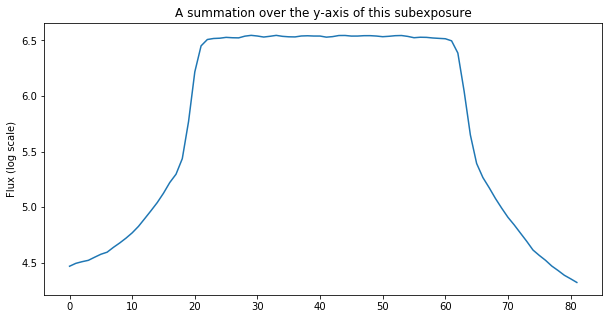

The difference between the two edges (for a 5-pixel bin for all subexps is): 1360.5833333333333
This value may not be larger than  4446.761458260007  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1277191.3637460822 pl 1277191.3637460822 41.85133
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


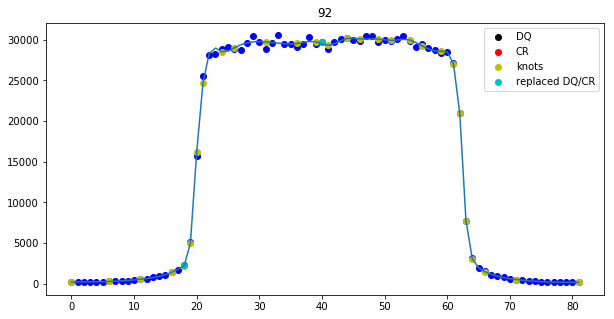

1301246.3421971956 pl 1301246.3421971956 41.72497
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


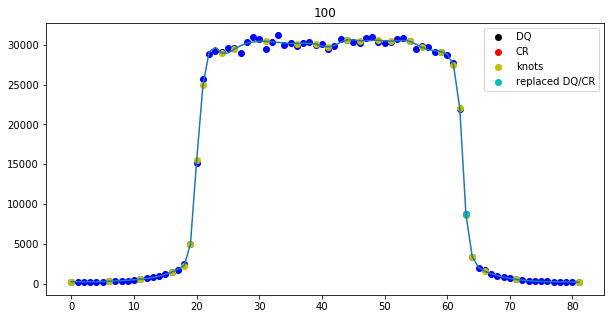

1288504.4197960454 pl 1288504.4197960454 41.76117
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


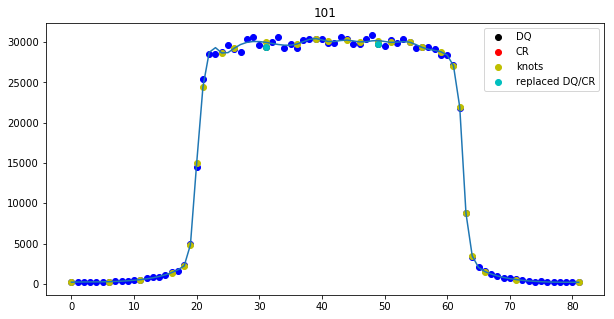

195 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 4, 6]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 4
nr. of CRs 1162
Spectrum located at pixel 124 in spatial direction
subexp 204.7214778132132 [204, 162, 120, 78]
ypix is 204 for exposure 3


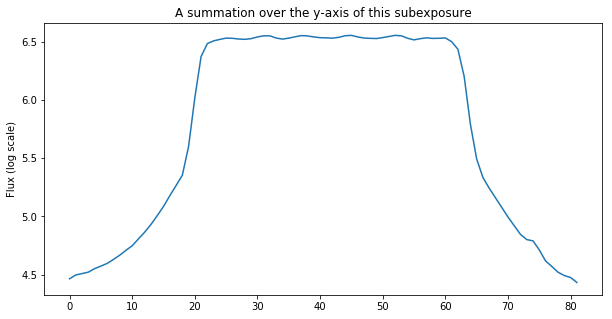

The difference between the two edges (for a 5-pixel bin for all subexps is): 576.8908854166667
This value may not be larger than  4449.018828161254  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1290124.13720686 pl 1290124.13720686 40.851223
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


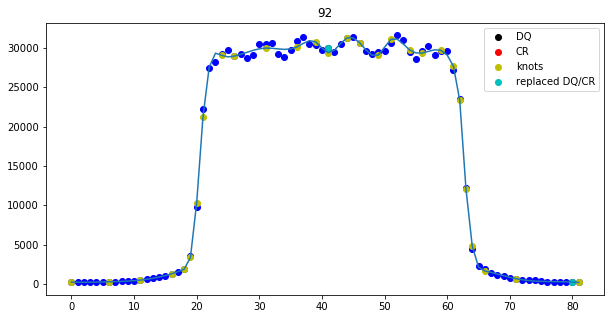

1299629.6159875728 pl 1299629.6159875728 40.99781
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


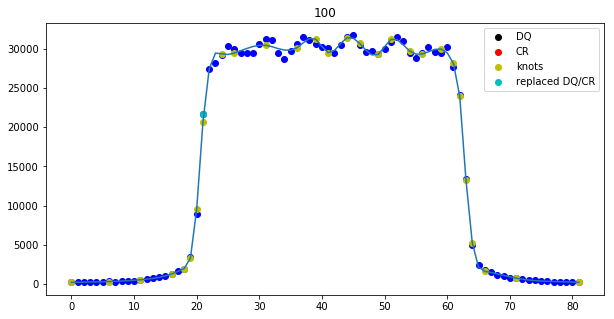

1296231.7913517095 pl 1296231.7913517095 40.95297
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


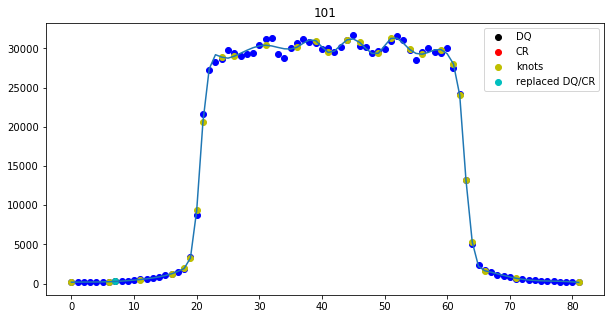

195 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 3, 4]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Applied an xshift of 0.0119644955393 pix compared to reference (reduced) spectrum ie9301bhq
Shifted subexposure nr. 0 with -1.07572622136 pixels and shrunk 0.66132463614 percent.
Shifted subexposure nr. 1 with -0.743857740033 pixels and shrunk 0.44369650514 percent.
Shifted subexposure nr. 2 with -0.344445908379 pixels and shrunk 0.218466565522 percent.
Saving spectrum to /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/ie9301bkq_spec.txt
Extraction took 2.56s
########################################
###########Finished Extraction##########
########################################
ie9301bkq
########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysi

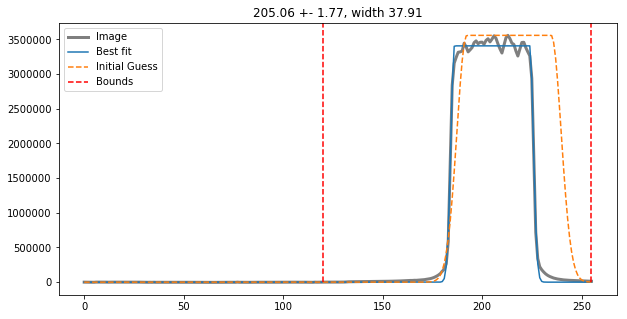

(array([[ 35.169365 ,  11.149284 ,  17.884941 , ...,   5.084816 ,
        -26.9719   ,  -2.44384  ],
       [ 43.859337 , -11.022041 ,   5.100334 , ...,  12.936394 ,
         37.58541  ,  -2.2422714],
       [-20.686623 ,  57.136986 ,  17.913506 , ...,  30.443108 ,
         -1.8042679,   1.3586807],
       ...,
       [  3.8772202,  -6.752846 ,  -8.913094 , ...,  16.64199  ,
         54.83734  ,  31.745079 ],
       [ 15.369225 ,  50.401985 ,  -8.551598 , ...,  66.64962  ,
         24.364845 ,  23.47808  ],
       [  4.3051605,  31.213356 ,  21.2369   , ...,  32.19291  ,
         37.98809  ,  10.451942 ]], dtype=float32), array([[0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       [1.01465568, 1.01152106, 0.97465585, ..., 0.99614412, 0.99226877,
        0.99630135],
       ...,
       [0.99049433, 0.98990652, 1.01802076, ..., 0.98726069, 0.99180205,
   

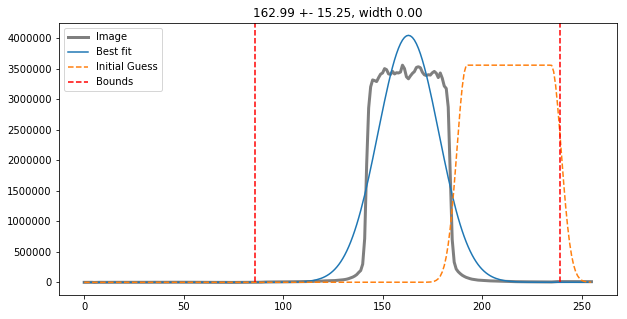

(array([[ 1.23507805e+01,  3.25746880e+01,  1.13794975e+01, ...,
         4.84297600e+01,  6.07439384e+01,  4.87582054e+01],
       [ 2.15139427e+01,  3.86480370e+01,  3.01551476e+01, ...,
        -1.63865395e+01, -5.57899475e-02,  3.40531578e+01],
       [ 5.54531212e+01,  5.88732567e+01,  2.50019646e+01, ...,
        -1.09300880e+01,  2.75606499e+01,  1.28703575e+01],
       ...,
       [-4.02951088e+01,  2.17317581e+00,  3.78229904e+00, ...,
         4.54877129e+01, -6.37761307e+00,  1.85140038e+01],
       [ 1.01167946e+01,  2.53092613e+01,  2.00654716e+01, ...,
         2.62190666e+01,  4.70185051e+01,  2.53058510e+01],
       [-1.86532707e+01,  1.83509407e+01, -1.36962166e+01, ...,
         8.15729904e+00,  2.41264305e+01,  3.59786339e+01]], dtype=float32), array([[0.97797824, 1.01717404, 1.02369336, ..., 0.97947431, 0.99055837,
        0.97462096],
       [0.86756175, 1.00057105, 1.00078321, ..., 0.98511468, 0.98741866,
        0.97093693],
       [1.04421316, 1.00141875, 0.9626

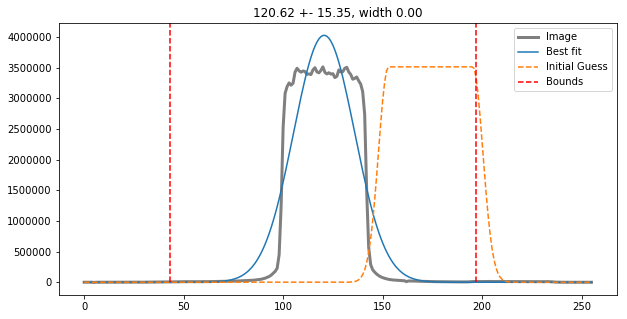

(array([[ 18.117802 ,  26.130314 ,  13.035786 , ...,  -6.889019 ,
          7.292454 ,  43.011066 ],
       [ -8.562435 ,  58.185062 ,  42.140293 , ...,  16.845554 ,
        -10.891422 ,  23.141033 ],
       [ 38.883625 , -23.252697 , -17.62991  , ..., -26.002453 ,
          5.1338615,  46.504826 ],
       ...,
       [  7.869751 ,   7.390831 ,   4.7536583, ...,  24.628803 ,
         12.858677 ,  14.316486 ],
       [-14.630108 ,  -6.6766243,  31.549442 , ..., -27.387325 ,
         34.39488  ,   7.1944923],
       [  7.4782524,  15.987385 ,  11.772575 , ..., -28.369091 ,
         -2.6492538,  36.2205   ]], dtype=float32), array([[0.99152216, 0.98206137, 0.98798856, ..., 0.9900434 , 0.97864713,
        0.99251526],
       [1.0128799 , 0.96209698, 1.03174513, ..., 1.00765806, 0.99389191,
        0.98775042],
       [0.99974451, 0.98079478, 0.99440176, ..., 0.99625174, 0.9890361 ,
        0.95858532],
       ...,
       [1.03185068, 1.00088005, 0.98926224, ..., 0.98714183, 0.9753993 ,
   

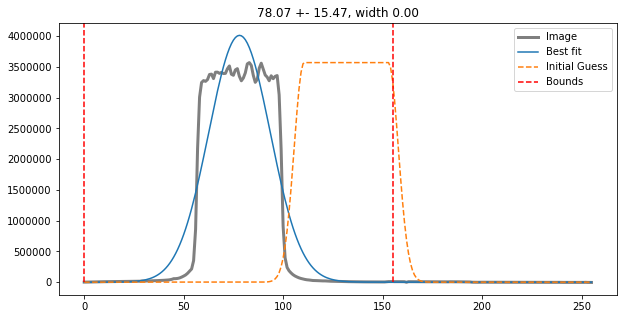

(array([[-23.73471  ,  -6.291359 ,  -3.8597488, ...,  20.745655 ,
          4.785816 ,  -9.024097 ],
       [ 10.500011 ,   6.4421883,  16.684177 , ..., -12.214146 ,
         14.945934 , -21.681274 ],
       [ 15.4662895,  16.761982 ,  19.823673 , ..., -38.9975   ,
        -46.42083  , -10.0159   ],
       ...,
       [-24.54012  , -43.612427 ,  -9.1040535, ...,  -6.2237816,
        -34.65249  ,  10.603741 ],
       [-15.135506 ,  -2.8943176,   2.7324715, ...,  -9.316368 ,
        -19.121414 , -19.666203 ],
       [-37.169395 , -24.354137 ,  -9.869144 , ...,  40.211277 ,
        -15.290112 ,  -9.062637 ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.03028248, 1.00843969, 1.01427215, ..., 1.00247373, 0.98736319,
   

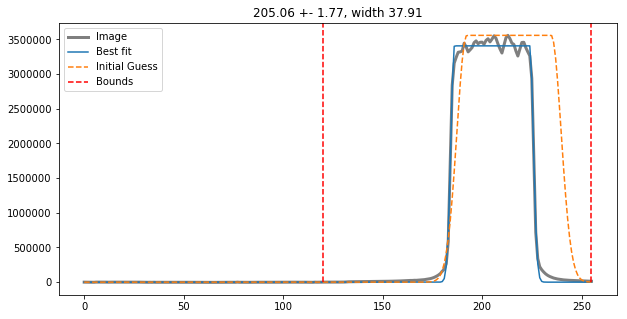

(array([[ 35.169365 ,  11.149284 ,  17.884941 , ...,   5.084816 ,
        -26.9719   ,  -2.44384  ],
       [ 43.859337 , -11.022041 ,   5.100334 , ...,  12.936394 ,
         37.58541  ,  -2.2422714],
       [-20.686623 ,  57.136986 ,  17.913506 , ...,  30.443108 ,
         -1.8042679,   1.3586807],
       ...,
       [  3.8772202,  -6.752846 ,  -8.913094 , ...,  16.64199  ,
         54.83734  ,  31.745079 ],
       [ 15.369225 ,  50.401985 ,  -8.551598 , ...,  66.64962  ,
         24.364845 ,  23.47808  ],
       [  4.3051605,  31.213356 ,  21.2369   , ...,  32.19291  ,
         37.98809  ,  10.451942 ]], dtype=float32), array([[0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       [1.01465568, 1.01152106, 0.97465585, ..., 0.99614412, 0.99226877,
        0.99630135],
       ...,
       [0.99049433, 0.98990652, 1.01802076, ..., 0.98726069, 0.99180205,
   

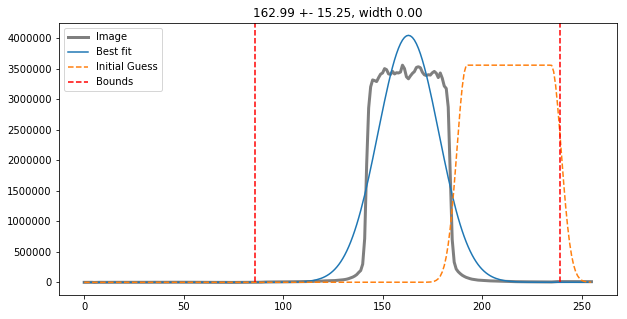

(array([[ 1.23507805e+01,  3.25746880e+01,  1.13794975e+01, ...,
         4.84297600e+01,  6.07439384e+01,  4.87582054e+01],
       [ 2.15139427e+01,  3.86480370e+01,  3.01551476e+01, ...,
        -1.63865395e+01, -5.57899475e-02,  3.40531578e+01],
       [ 5.54531212e+01,  5.88732567e+01,  2.50019646e+01, ...,
        -1.09300880e+01,  2.75606499e+01,  1.28703575e+01],
       ...,
       [-4.02951088e+01,  2.17317581e+00,  3.78229904e+00, ...,
         4.54877129e+01, -6.37761307e+00,  1.85140038e+01],
       [ 1.01167946e+01,  2.53092613e+01,  2.00654716e+01, ...,
         2.62190666e+01,  4.70185051e+01,  2.53058510e+01],
       [-1.86532707e+01,  1.83509407e+01, -1.36962166e+01, ...,
         8.15729904e+00,  2.41264305e+01,  3.59786339e+01]], dtype=float32), array([[0.97797824, 1.01717404, 1.02369336, ..., 0.97947431, 0.99055837,
        0.97462096],
       [0.86756175, 1.00057105, 1.00078321, ..., 0.98511468, 0.98741866,
        0.97093693],
       [1.04421316, 1.00141875, 0.9626

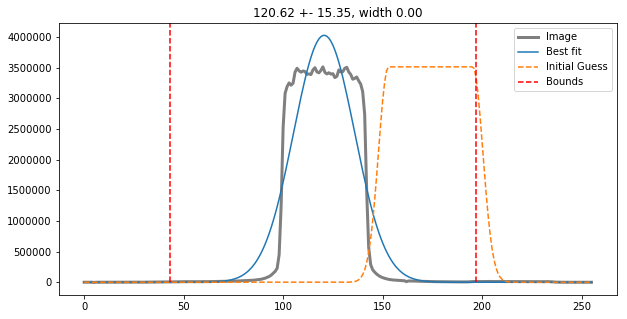

(array([[ 18.117802 ,  26.130314 ,  13.035786 , ...,  -6.889019 ,
          7.292454 ,  43.011066 ],
       [ -8.562435 ,  58.185062 ,  42.140293 , ...,  16.845554 ,
        -10.891422 ,  23.141033 ],
       [ 38.883625 , -23.252697 , -17.62991  , ..., -26.002453 ,
          5.1338615,  46.504826 ],
       ...,
       [  7.869751 ,   7.390831 ,   4.7536583, ...,  24.628803 ,
         12.858677 ,  14.316486 ],
       [-14.630108 ,  -6.6766243,  31.549442 , ..., -27.387325 ,
         34.39488  ,   7.1944923],
       [  7.4782524,  15.987385 ,  11.772575 , ..., -28.369091 ,
         -2.6492538,  36.2205   ]], dtype=float32), array([[0.99152216, 0.98206137, 0.98798856, ..., 0.9900434 , 0.97864713,
        0.99251526],
       [1.0128799 , 0.96209698, 1.03174513, ..., 1.00765806, 0.99389191,
        0.98775042],
       [0.99974451, 0.98079478, 0.99440176, ..., 0.99625174, 0.9890361 ,
        0.95858532],
       ...,
       [1.03185068, 1.00088005, 0.98926224, ..., 0.98714183, 0.9753993 ,
   

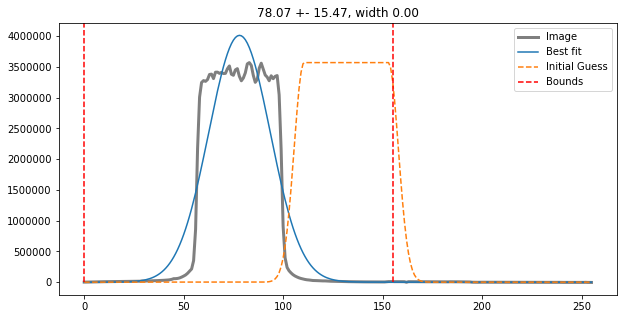

(array([[-23.73471  ,  -6.291359 ,  -3.8597488, ...,  20.745655 ,
          4.785816 ,  -9.024097 ],
       [ 10.500011 ,   6.4421883,  16.684177 , ..., -12.214146 ,
         14.945934 , -21.681274 ],
       [ 15.4662895,  16.761982 ,  19.823673 , ..., -38.9975   ,
        -46.42083  , -10.0159   ],
       ...,
       [-24.54012  , -43.612427 ,  -9.1040535, ...,  -6.2237816,
        -34.65249  ,  10.603741 ],
       [-15.135506 ,  -2.8943176,   2.7324715, ...,  -9.316368 ,
        -19.121414 , -19.666203 ],
       [-37.169395 , -24.354137 ,  -9.869144 , ...,  40.211277 ,
        -15.290112 ,  -9.062637 ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.03028248, 1.00843969, 1.01427215, ..., 1.00247373, 0.98736319,
   

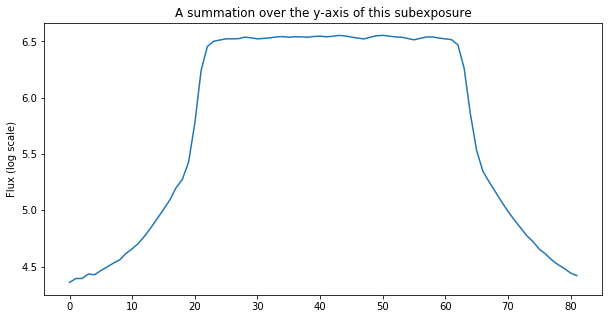

The difference between the two edges (for a 5-pixel bin for all subexps is): 651.2783854166667
This value may not be larger than  4429.941519553804  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Using flux for variance estimate
Extracting spectrum with optimal extraction...
1279211.766924155 pl 1279211.766924155 40.65767
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


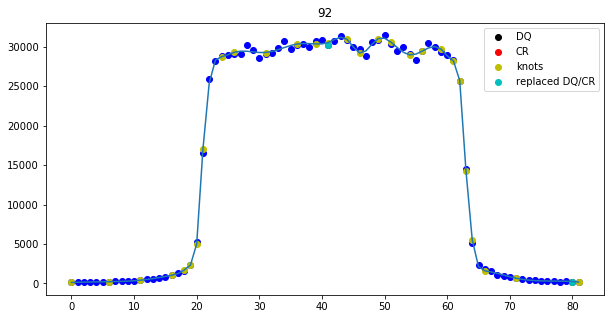

1292324.7962181703 pl 1292324.7962181703 40.87303
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


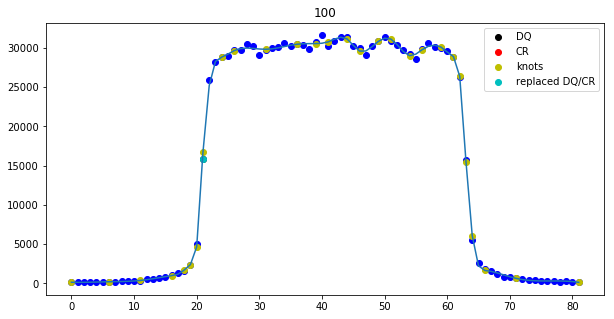

1282947.9966775707 pl 1282947.9966775707 40.995026
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


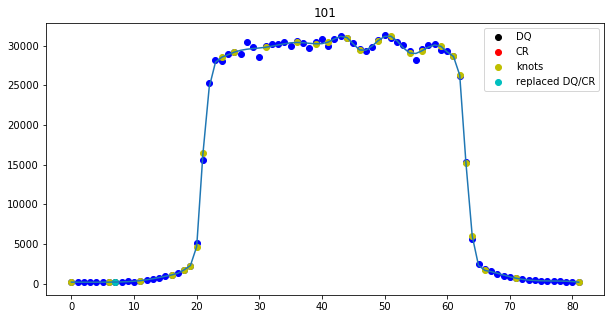

198 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 2
nr. of CRs 1135
Spectrum located at pixel 124 in spatial direction
subexp 162.9936274921101 [204, 162, 120, 78]
ypix is 162 for exposure 1


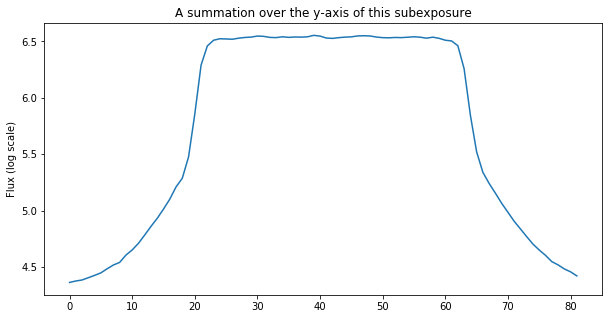

The difference between the two edges (for a 5-pixel bin for all subexps is): 746.7778645833333
This value may not be larger than  4431.719124673855  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1270284.6021378872 pl 1270284.6021378872 41.17963
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


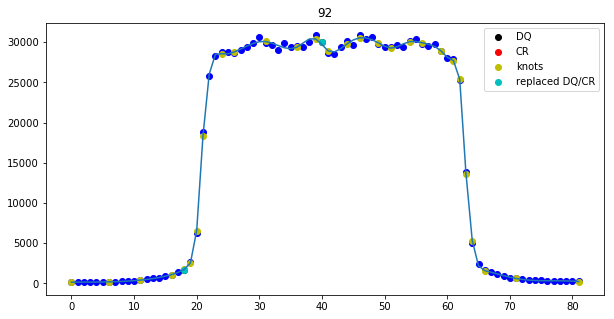

1291789.6202196598 pl 1291789.6202196598 41.20375
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


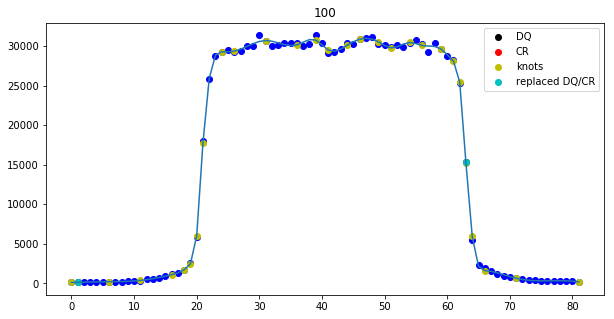

1281247.6171628903 pl 1281247.6171628903 40.955223
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


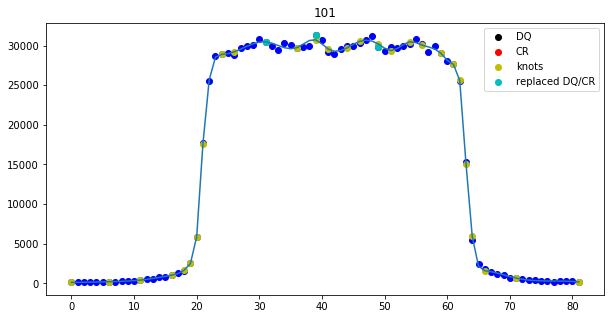

195 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 3]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 3
nr. of CRs 1171
Spectrum located at pixel 124 in spatial direction
subexp 120.62374272304352 [204, 162, 120, 78]
ypix is 120 for exposure 2


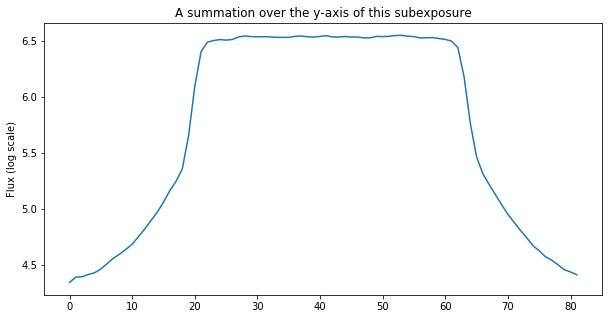

The difference between the two edges (for a 5-pixel bin for all subexps is): 710.2614583333333
This value may not be larger than  4431.908783658196  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1264512.803647679 pl 1264512.803647679 41.631115
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


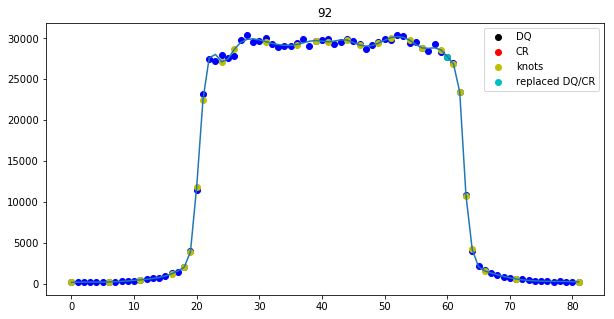

1288356.4726783605 pl 1288356.4726783605 40.853962
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


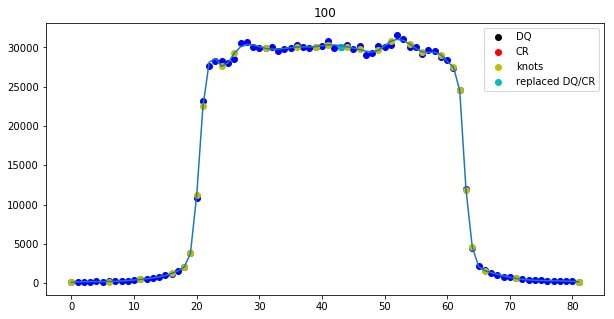

1282341.6413770588 pl 1282341.6413770588 41.40445
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


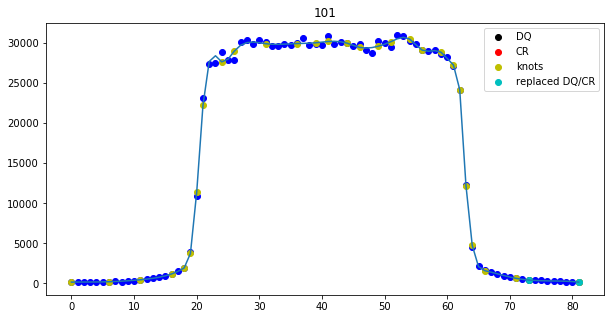

189 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 4
nr. of CRs 1198
Spectrum located at pixel 124 in spatial direction
subexp 78.07285621646182 [204, 162, 120, 78]
ypix is 78 for exposure 3


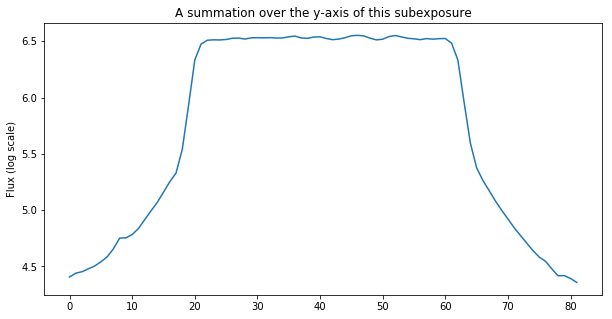

The difference between the two edges (for a 5-pixel bin for all subexps is): 635.9809895833333
This value may not be larger than  4430.890595203933  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1258816.553601411 pl 1258816.553601411 40.935356
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


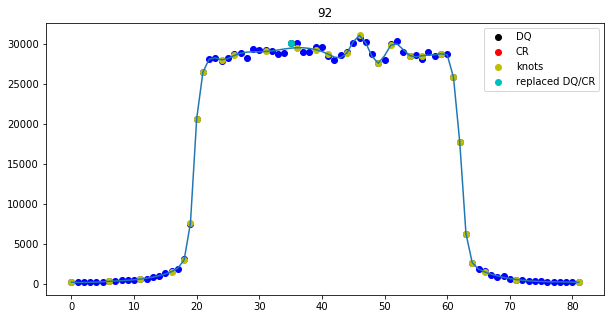

1288969.6523052223 pl 1288969.6523052223 41.24127
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


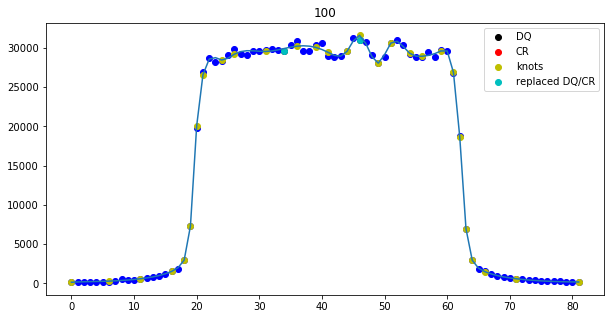

1280314.3839326745 pl 1280314.3839326745 40.76197
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


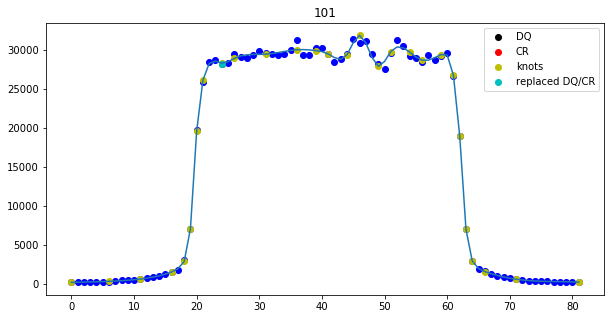

Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Applied an xshift of -0.00204163217442 pix compared to reference (reduced) spectrum ie9301bhq
Shifted subexposure nr. 1 with -0.361979481328 pixels and shrunk 0.229303407243 percent.
Shifted subexposure nr. 2 with -0.720252394868 pixels and shrunk 0.438375083792 percent.
Shifted subexposure nr. 3 with -1.07740329236 pixels and shrunk 0.664205026588 percent.
Saving spectrum to /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/ie9301blq_spec.txt
Extraction took 2.61s
########################################
###########Finished Extraction##########
########################################
ie9301blq
########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/s.baratuva.nl/Desktop/PhD/hs

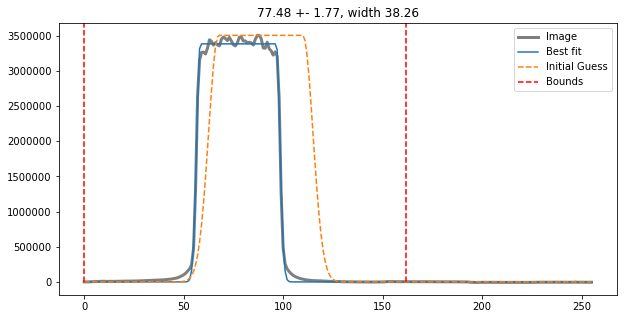

(array([[  1.8218613,  31.91407  ,  29.125298 , ..., -19.17701  ,
        -24.750237 , -50.222504 ],
       [ 30.00364  ,   2.1353302,  -6.5225067, ..., -76.94767  ,
        -25.349495 , -11.859261 ],
       [ 16.30574  ,  18.06015  ,  17.038277 , ...,  33.06405  ,
        -13.847008 , -13.333107 ],
       ...,
       [-36.989662 ,   1.8305893, -53.722298 , ...,   8.612877 ,
         14.4247055, -41.13224  ],
       [-14.591713 , -25.353493 , -16.607155 , ..., -17.857353 ,
          4.6393814, -47.442223 ],
       [ 35.435295 ,  -5.448189 , -24.814003 , ...,   1.7698898,
        -34.009987 ,   1.5501022]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.01597487, 0.99097391, 1.00108907, ..., 1.0139594 , 0.99567206,
   

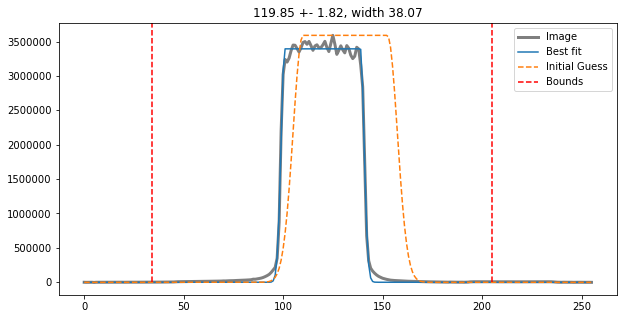

(array([[  0.8060913 ,  25.343079  , -18.471718  , ..., -38.717323  ,
         27.302063  , -16.427887  ],
       [ -4.741585  ,  23.40113   , -14.360611  , ...,   7.522934  ,
        -19.121788  ,   4.6978836 ],
       [  3.7235107 ,  32.92479   ,  38.747932  , ...,  -1.5577316 ,
         19.573631  ,  29.917793  ],
       ...,
       [ -0.33809662,  16.817299  ,  -2.6005325 , ...,  14.944412  ,
         14.223633  , -45.52916   ],
       [ -2.0462646 ,  38.025543  ,  -0.769783  , ...,  -5.835861  ,
        -10.157715  ,  11.707306  ],
       [ 34.10961   ,  25.238892  ,  -4.430252  , ...,   7.190628  ,
        -10.082077  , -12.049393  ]], dtype=float32), array([[1.00005887, 0.99631715, 1.01913849, ..., 1.01117496, 0.9857711 ,
        1.00169883],
       [1.0077967 , 1.00066505, 0.99113703, ..., 0.97842318, 0.98744521,
        0.98047949],
       [0.98492686, 0.9683537 , 0.97322563, ..., 0.98656412, 1.01614636,
        0.99626665],
       ...,
       [0.99159165, 0.96546904, 0.939439

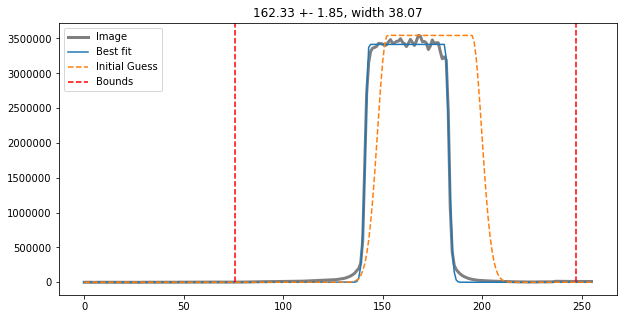

(array([[-11.449581 ,  24.83879  , -35.173332 , ...,  33.818275 ,
        -21.436035 , -17.162676 ],
       [ 22.015083 ,  20.334297 ,   6.003586 , ...,  32.479973 ,
        -16.823517 , -12.241943 ],
       [  1.7570076, -21.454346 , -20.053967 , ...,  -7.7506027,
         -6.650131 ,  -8.789005 ],
       ...,
       [-23.433449 ,  29.082504 ,  13.302902 , ...,   7.155922 ,
         -5.040474 ,  42.381836 ],
       [ 31.75373  , -31.476318 ,  23.116936 , ..., -39.503323 ,
        -25.824135 ,  16.36758  ],
       [ 27.481743 ,  -7.7816925,  41.23295  , ...,  19.274406 ,
         50.474472 ,  17.021393 ]], dtype=float32), array([[0.98118528, 0.99323157, 1.00366311, ..., 0.98204106, 0.9522191 ,
        0.97554738],
       [0.97276955, 0.98545687, 1.00024228, ..., 0.99504684, 0.98786921,
        0.98946573],
       [1.01984942, 1.02008576, 0.99551588, ..., 0.97861723, 0.98087129,
        0.98033262],
       ...,
       [0.95235794, 0.96168618, 1.00095344, ..., 0.98480437, 0.99359909,
   

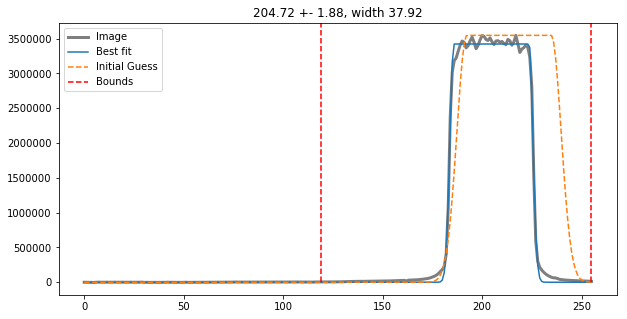

(array([[ -0.46736145, -28.709131  ,  24.63998   , ..., -38.00406   ,
          0.1089592 ,   3.621975  ],
       [ 37.928913  ,  29.74973   ,   3.0803452 , ...,  13.354607  ,
         17.639202  ,  84.34125   ],
       [ 12.245846  ,  19.053509  , -19.016731  , ...,  43.15202   ,
         11.930073  ,   8.383373  ],
       ...,
       [ 25.024845  ,  42.056927  ,  13.896595  , ...,  43.042866  ,
         58.316517  ,  64.67679   ],
       [ 50.899677  ,  18.568535  ,   3.8527718 , ...,  23.594982  ,
         16.291664  ,  -1.5715446 ],
       [ 37.7279    ,  29.405926  ,  19.080986  , ...,  -4.971058  ,
         66.7195    ,  37.278225  ]], dtype=float32), array([[1.01551701, 0.9995939 , 1.0131288 , ..., 0.99402601, 0.99839718,
        1.0051168 ],
       [0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       ...,
       [0.99049433, 0.98990652, 1.018020

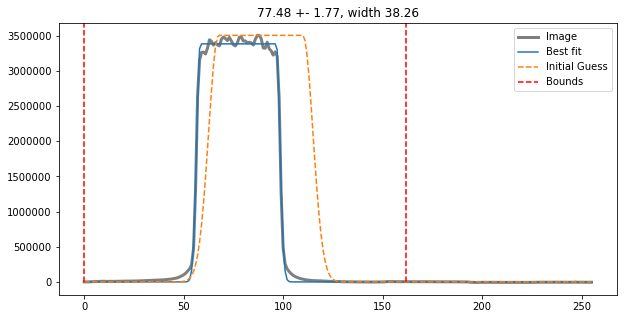

(array([[  1.8218613,  31.91407  ,  29.125298 , ..., -19.17701  ,
        -24.750237 , -50.222504 ],
       [ 30.00364  ,   2.1353302,  -6.5225067, ..., -76.94767  ,
        -25.349495 , -11.859261 ],
       [ 16.30574  ,  18.06015  ,  17.038277 , ...,  33.06405  ,
        -13.847008 , -13.333107 ],
       ...,
       [-36.989662 ,   1.8305893, -53.722298 , ...,   8.612877 ,
         14.4247055, -41.13224  ],
       [-14.591713 , -25.353493 , -16.607155 , ..., -17.857353 ,
          4.6393814, -47.442223 ],
       [ 35.435295 ,  -5.448189 , -24.814003 , ...,   1.7698898,
        -34.009987 ,   1.5501022]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.01597487, 0.99097391, 1.00108907, ..., 1.0139594 , 0.99567206,
   

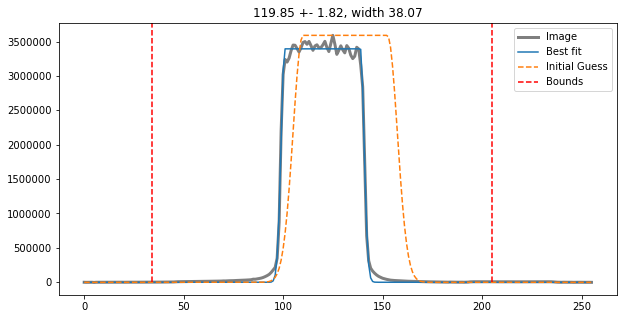

(array([[  0.8060913 ,  25.343079  , -18.471718  , ..., -38.717323  ,
         27.302063  , -16.427887  ],
       [ -4.741585  ,  23.40113   , -14.360611  , ...,   7.522934  ,
        -19.121788  ,   4.6978836 ],
       [  3.7235107 ,  32.92479   ,  38.747932  , ...,  -1.5577316 ,
         19.573631  ,  29.917793  ],
       ...,
       [ -0.33809662,  16.817299  ,  -2.6005325 , ...,  14.944412  ,
         14.223633  , -45.52916   ],
       [ -2.0462646 ,  38.025543  ,  -0.769783  , ...,  -5.835861  ,
        -10.157715  ,  11.707306  ],
       [ 34.10961   ,  25.238892  ,  -4.430252  , ...,   7.190628  ,
        -10.082077  , -12.049393  ]], dtype=float32), array([[1.00005887, 0.99631715, 1.01913849, ..., 1.01117496, 0.9857711 ,
        1.00169883],
       [1.0077967 , 1.00066505, 0.99113703, ..., 0.97842318, 0.98744521,
        0.98047949],
       [0.98492686, 0.9683537 , 0.97322563, ..., 0.98656412, 1.01614636,
        0.99626665],
       ...,
       [0.99159165, 0.96546904, 0.939439

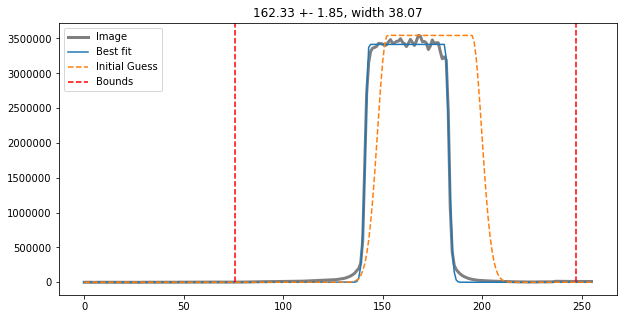

(array([[-11.449581 ,  24.83879  , -35.173332 , ...,  33.818275 ,
        -21.436035 , -17.162676 ],
       [ 22.015083 ,  20.334297 ,   6.003586 , ...,  32.479973 ,
        -16.823517 , -12.241943 ],
       [  1.7570076, -21.454346 , -20.053967 , ...,  -7.7506027,
         -6.650131 ,  -8.789005 ],
       ...,
       [-23.433449 ,  29.082504 ,  13.302902 , ...,   7.155922 ,
         -5.040474 ,  42.381836 ],
       [ 31.75373  , -31.476318 ,  23.116936 , ..., -39.503323 ,
        -25.824135 ,  16.36758  ],
       [ 27.481743 ,  -7.7816925,  41.23295  , ...,  19.274406 ,
         50.474472 ,  17.021393 ]], dtype=float32), array([[0.98118528, 0.99323157, 1.00366311, ..., 0.98204106, 0.9522191 ,
        0.97554738],
       [0.97276955, 0.98545687, 1.00024228, ..., 0.99504684, 0.98786921,
        0.98946573],
       [1.01984942, 1.02008576, 0.99551588, ..., 0.97861723, 0.98087129,
        0.98033262],
       ...,
       [0.95235794, 0.96168618, 1.00095344, ..., 0.98480437, 0.99359909,
   

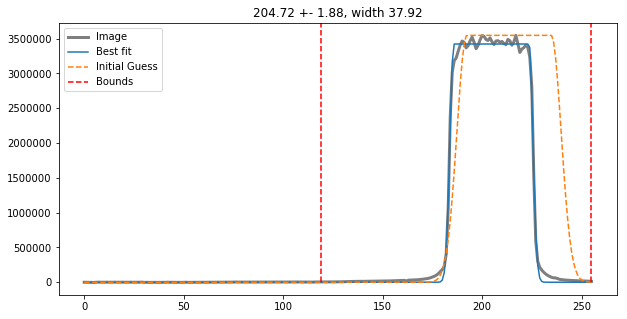

(array([[ -0.46736145, -28.709131  ,  24.63998   , ..., -38.00406   ,
          0.1089592 ,   3.621975  ],
       [ 37.928913  ,  29.74973   ,   3.0803452 , ...,  13.354607  ,
         17.639202  ,  84.34125   ],
       [ 12.245846  ,  19.053509  , -19.016731  , ...,  43.15202   ,
         11.930073  ,   8.383373  ],
       ...,
       [ 25.024845  ,  42.056927  ,  13.896595  , ...,  43.042866  ,
         58.316517  ,  64.67679   ],
       [ 50.899677  ,  18.568535  ,   3.8527718 , ...,  23.594982  ,
         16.291664  ,  -1.5715446 ],
       [ 37.7279    ,  29.405926  ,  19.080986  , ...,  -4.971058  ,
         66.7195    ,  37.278225  ]], dtype=float32), array([[1.01551701, 0.9995939 , 1.0131288 , ..., 0.99402601, 0.99839718,
        1.0051168 ],
       [0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       ...,
       [0.99049433, 0.98990652, 1.018020

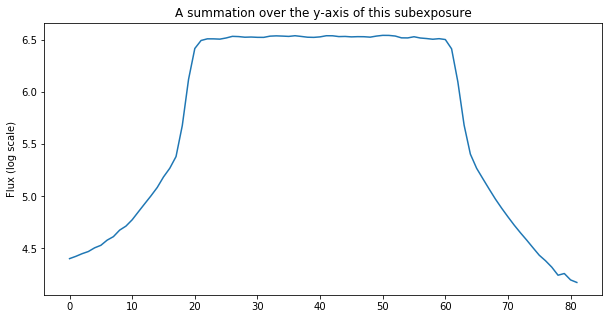

The difference between the two edges (for a 5-pixel bin for all subexps is): 1552.26953125
This value may not be larger than  4415.558190459427  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Using flux for variance estimate
Extracting spectrum with optimal extraction...
1251637.1102392415 pl 1251637.1102392415 41.595837
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


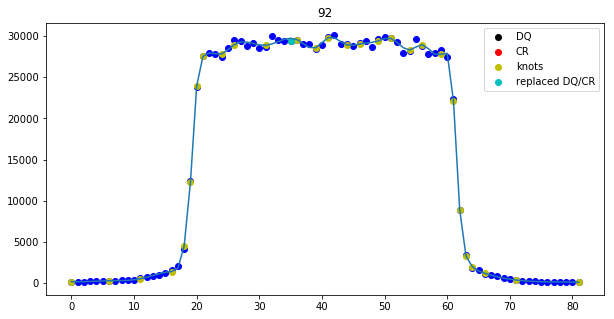

1277749.5556131492 pl 1277749.5556131492 41.1388
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


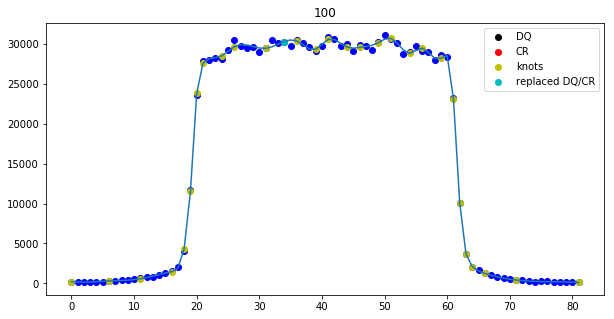

1270505.1356181814 pl 1270505.1356181814 41.419018
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


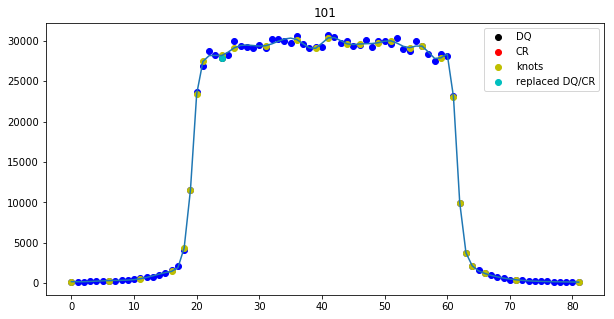

Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 2
nr. of CRs 1208
Spectrum located at pixel 124 in spatial direction
subexp 119.84766859922779 [204, 162, 120, 78]
ypix is 120 for exposure 1


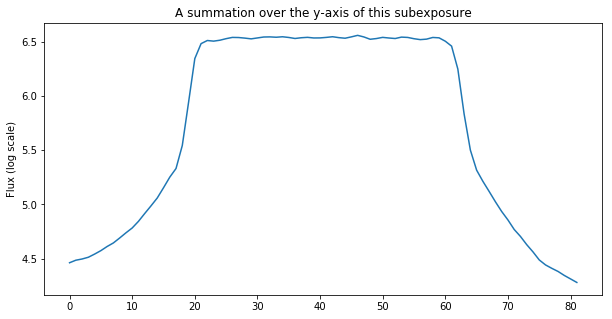

The difference between the two edges (for a 5-pixel bin for all subexps is): 1537.25859375
This value may not be larger than  4430.757948703585  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1265324.3938545382 pl 1265324.3938545382 41.028194
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


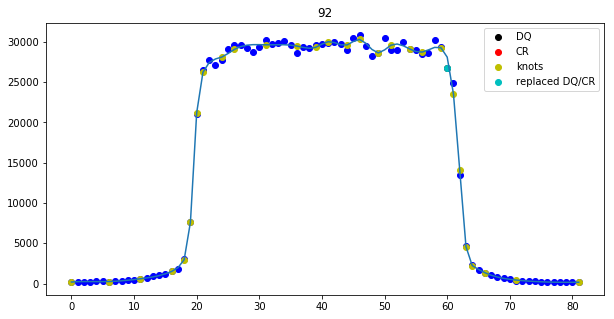

1288897.5187185819 pl 1288897.5187185819 40.25575
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


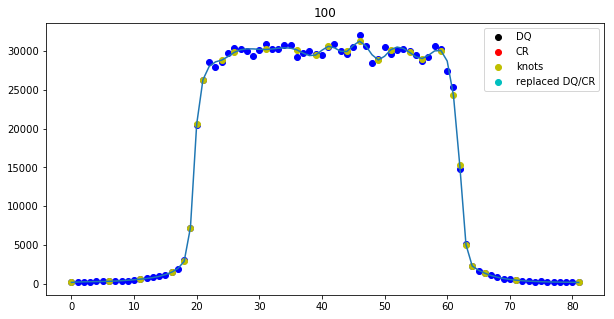

1279891.600397699 pl 1279891.600397699 40.517265
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


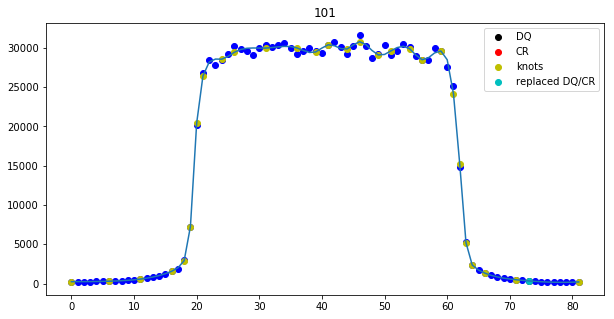

189 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 8]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 3
nr. of CRs 1159
Spectrum located at pixel 124 in spatial direction
subexp 162.33009020376969 [204, 162, 120, 78]
ypix is 162 for exposure 2


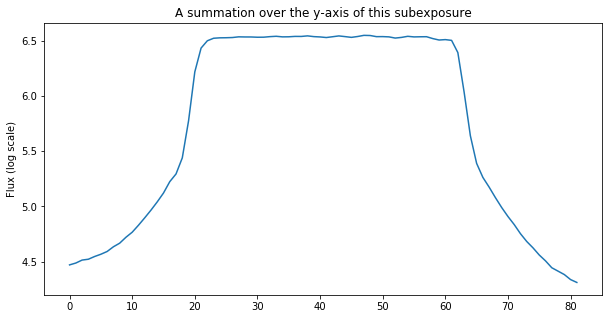

The difference between the two edges (for a 5-pixel bin for all subexps is): 1362.9171875
This value may not be larger than  4451.915542774817  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1282660.860759282 pl 1282660.860759282 41.14328
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


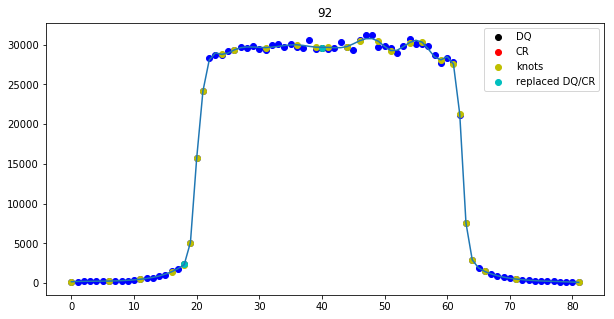

1301707.2428095657 pl 1301707.2428095657 41.31381
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


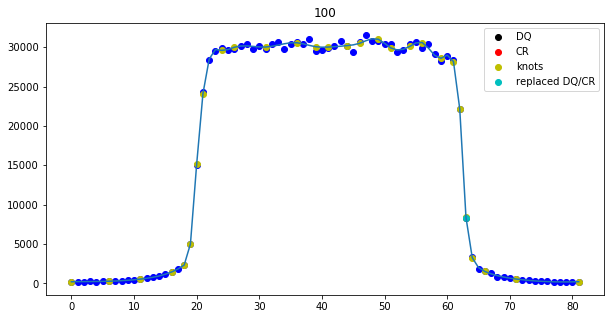

1294679.500056947 pl 1294679.500056947 41.578045
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


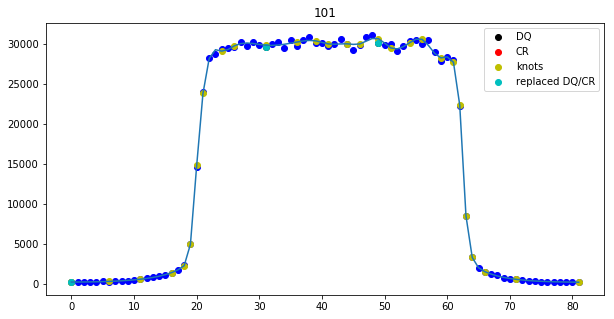

191 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 4
nr. of CRs 1137
Spectrum located at pixel 124 in spatial direction
subexp 204.7165065781305 [204, 162, 120, 78]
ypix is 204 for exposure 3


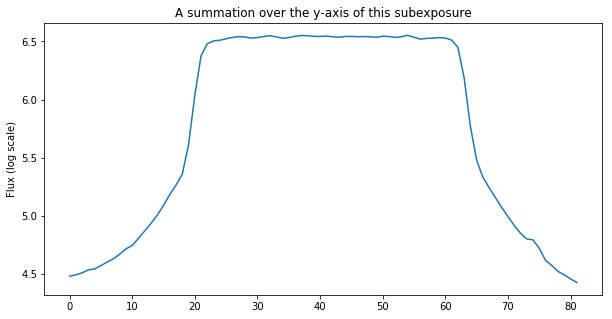

The difference between the two edges (for a 5-pixel bin for all subexps is): 583.91015625
This value may not be larger than  4454.802951122903  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1292958.6706556778 pl 1292958.6706556778 41.32484
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


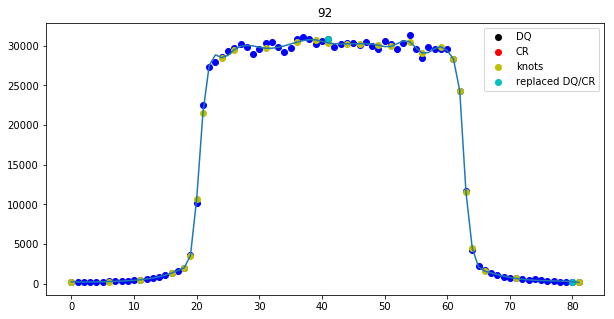

1303288.3906832996 pl 1303288.3906832996 41.418606
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


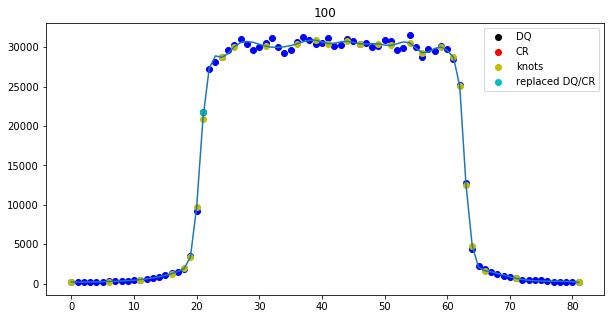

1298106.9620079694 pl 1298106.9620079694 41.155746
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


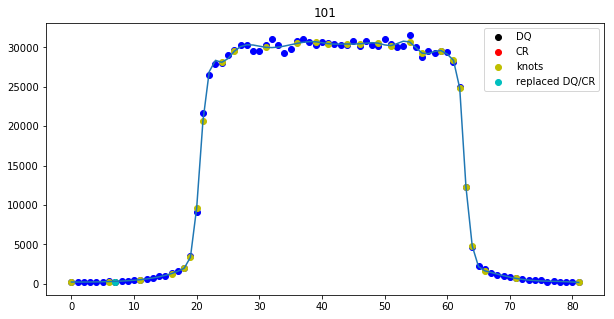

198 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Applied an xshift of 0.0126288039219 pix compared to reference (reduced) spectrum ie9301bhq
Shifted subexposure nr. 0 with -1.08618364468 pixels and shrunk 0.664108641668 percent.
Shifted subexposure nr. 1 with -0.743953242785 pixels and shrunk 0.448603566434 percent.
Shifted subexposure nr. 2 with -0.375431574373 pixels and shrunk 0.222883437039 percent.
Saving spectrum to /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/ie9301bmq_spec.txt
Extraction took 2.61s
########################################
###########Finished Extraction##########
########################################
ie9301bmq
########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298

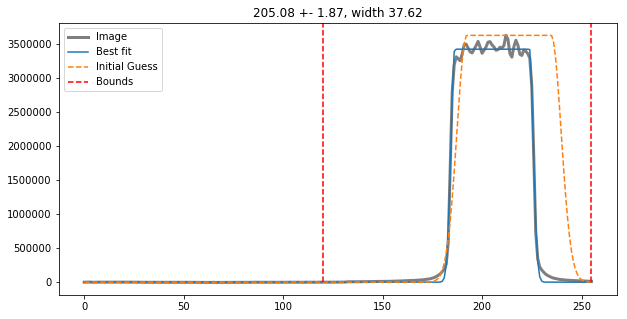

(array([[ 32.55385  ,  -7.883713 ,  -1.1478119, ...,  28.197311 ,
         19.52501  ,  30.022446 ],
       [-22.081894 ,  30.924606 ,   7.1766205, ..., -36.439682 ,
          6.916733 ,   2.1631012],
       [ 30.640488 ,  21.687363 , -10.499741 , ...,  44.204224 ,
         -6.7511444,  10.441177 ],
       ...,
       [-12.781448 ,  21.069878 ,   2.5214386, ...,   2.2288818,
         38.065475 ,   7.9030685],
       [ 10.415955 , -10.737228 ,   7.5658875, ...,  56.95128  ,
         64.1741   ,  11.420319 ],
       [ 36.80992  ,  61.377617 ,  35.01169  , ...,  -3.437622 ,
         37.720642 ,  31.400787 ]], dtype=float32), array([[0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       [1.01465568, 1.01152106, 0.97465585, ..., 0.99614412, 0.99226877,
        0.99630135],
       ...,
       [0.99049433, 0.98990652, 1.01802076, ..., 0.98726069, 0.99180205,
   

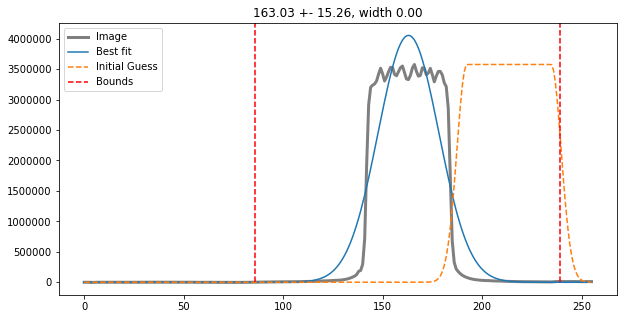

(array([[ 52.822678  ,  42.556763  ,  14.325836  , ..., -16.436829  ,
         12.243332  ,  40.01326   ],
       [ 45.568314  ,  20.484741  ,  42.484116  , ...,  12.282486  ,
         77.71959   ,  13.615692  ],
       [ 51.36409   ,  43.05748   ,  49.0569    , ...,  45.7995    ,
        -11.583466  ,   4.124756  ],
       ...,
       [  4.7918243 ,  -1.9034424 ,  -2.6356964 , ...,  74.36694   ,
         24.859604  , -18.61705   ],
       [  6.039276  ,  -2.1783218 ,  15.988129  , ...,  10.305649  ,
        -11.331375  ,  51.82788   ],
       [  3.0214539 ,  16.615097  ,   0.95557404, ...,  20.535439  ,
         -1.2175293 ,  -8.223694  ]], dtype=float32), array([[0.97797824, 1.01717404, 1.02369336, ..., 0.97947431, 0.99055837,
        0.97462096],
       [0.86756175, 1.00057105, 1.00078321, ..., 0.98511468, 0.98741866,
        0.97093693],
       [1.04421316, 1.00141875, 0.96262652, ..., 0.98749226, 1.01309426,
        0.9847939 ],
       ...,
       [0.98067773, 1.00647348, 0.980752

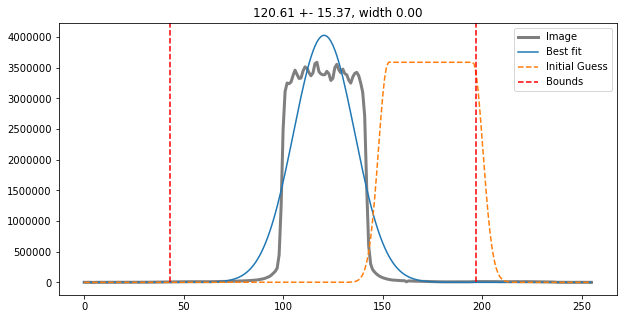

(array([[ 48.304283  ,   7.0629044 ,  36.187218  , ...,   4.4996643 ,
        -46.795288  ,  35.69268   ],
       [ 28.66027   ,  10.973808  ,  84.055504  , ...,  28.236229  ,
         -6.5174713 ,  -5.223633  ],
       [ 17.471352  ,  30.388954  ,  61.811302  , ...,  13.448601  ,
          0.15384674, -12.2586975 ],
       ...,
       [  7.5661163 ,  11.7704315 ,  -2.5721016 , ...,   3.1061249 ,
         36.129555  ,  -0.13356018],
       [  6.1370125 ,  -9.320564  ,  12.517647  , ...,  43.035736  ,
         43.51928   , -14.328339  ],
       [ 14.19915   ,  18.02629   ,  -0.2362938 , ...,  32.623055  ,
         60.700584  ,  40.63212   ]], dtype=float32), array([[0.99152216, 0.98206137, 0.98798856, ..., 0.9900434 , 0.97864713,
        0.99251526],
       [1.0128799 , 0.96209698, 1.03174513, ..., 1.00765806, 0.99389191,
        0.98775042],
       [0.99974451, 0.98079478, 0.99440176, ..., 0.99625174, 0.9890361 ,
        0.95858532],
       ...,
       [1.03185068, 1.00088005, 0.989262

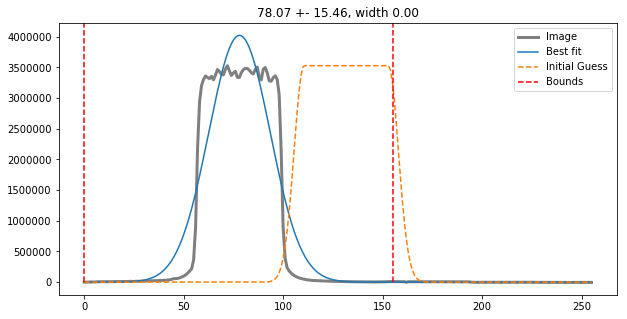

(array([[ 25.67176   ,   0.8957596 ,   8.018471  , ...,  11.533478  ,
        -41.843575  , -15.897526  ],
       [  5.9589157 ,  41.77603   ,  30.907288  , ...,  -0.37978363,
        -27.006378  , -35.57153   ],
       [ 20.306938  ,  -4.1981087 ,   3.5534515 , ...,   0.89972687,
        -32.24787   ,  -2.8583221 ],
       ...,
       [-31.418774  , -13.032211  , -41.736332  , ...,   1.0119705 ,
          5.5903244 , -34.026707  ],
       [ 22.469109  , -12.113312  ,   9.900932  , ..., -20.940224  ,
        -18.957535  ,   4.0735397 ],
       [-37.024708  , -52.30403   ,  -7.3827972 , ..., -13.849674  ,
        -12.769104  , -15.9711685 ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.03028248, 1.00843969, 1.014272

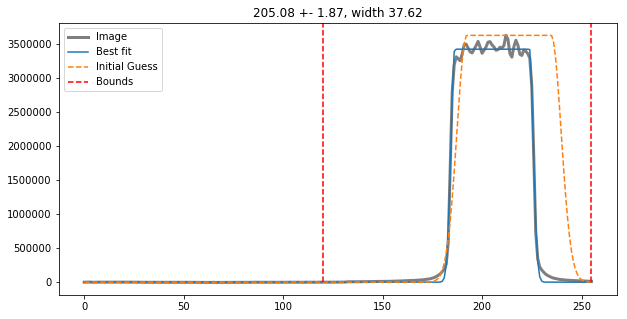

(array([[ 32.55385  ,  -7.883713 ,  -1.1478119, ...,  28.197311 ,
         19.52501  ,  30.022446 ],
       [-22.081894 ,  30.924606 ,   7.1766205, ..., -36.439682 ,
          6.916733 ,   2.1631012],
       [ 30.640488 ,  21.687363 , -10.499741 , ...,  44.204224 ,
         -6.7511444,  10.441177 ],
       ...,
       [-12.781448 ,  21.069878 ,   2.5214386, ...,   2.2288818,
         38.065475 ,   7.9030685],
       [ 10.415955 , -10.737228 ,   7.5658875, ...,  56.95128  ,
         64.1741   ,  11.420319 ],
       [ 36.80992  ,  61.377617 ,  35.01169  , ...,  -3.437622 ,
         37.720642 ,  31.400787 ]], dtype=float32), array([[0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       [1.01465568, 1.01152106, 0.97465585, ..., 0.99614412, 0.99226877,
        0.99630135],
       ...,
       [0.99049433, 0.98990652, 1.01802076, ..., 0.98726069, 0.99180205,
   

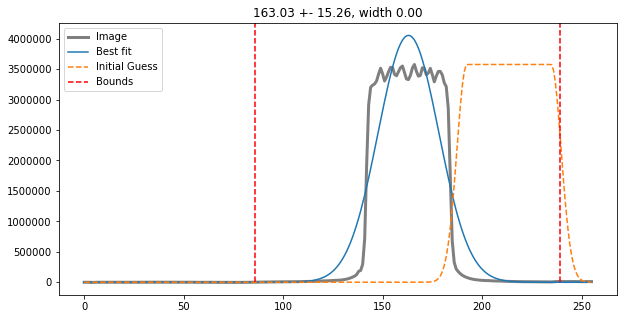

(array([[ 52.822678  ,  42.556763  ,  14.325836  , ..., -16.436829  ,
         12.243332  ,  40.01326   ],
       [ 45.568314  ,  20.484741  ,  42.484116  , ...,  12.282486  ,
         77.71959   ,  13.615692  ],
       [ 51.36409   ,  43.05748   ,  49.0569    , ...,  45.7995    ,
        -11.583466  ,   4.124756  ],
       ...,
       [  4.7918243 ,  -1.9034424 ,  -2.6356964 , ...,  74.36694   ,
         24.859604  , -18.61705   ],
       [  6.039276  ,  -2.1783218 ,  15.988129  , ...,  10.305649  ,
        -11.331375  ,  51.82788   ],
       [  3.0214539 ,  16.615097  ,   0.95557404, ...,  20.535439  ,
         -1.2175293 ,  -8.223694  ]], dtype=float32), array([[0.97797824, 1.01717404, 1.02369336, ..., 0.97947431, 0.99055837,
        0.97462096],
       [0.86756175, 1.00057105, 1.00078321, ..., 0.98511468, 0.98741866,
        0.97093693],
       [1.04421316, 1.00141875, 0.96262652, ..., 0.98749226, 1.01309426,
        0.9847939 ],
       ...,
       [0.98067773, 1.00647348, 0.980752

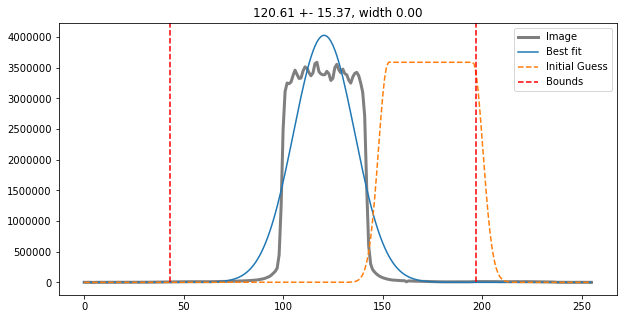

(array([[ 48.304283  ,   7.0629044 ,  36.187218  , ...,   4.4996643 ,
        -46.795288  ,  35.69268   ],
       [ 28.66027   ,  10.973808  ,  84.055504  , ...,  28.236229  ,
         -6.5174713 ,  -5.223633  ],
       [ 17.471352  ,  30.388954  ,  61.811302  , ...,  13.448601  ,
          0.15384674, -12.2586975 ],
       ...,
       [  7.5661163 ,  11.7704315 ,  -2.5721016 , ...,   3.1061249 ,
         36.129555  ,  -0.13356018],
       [  6.1370125 ,  -9.320564  ,  12.517647  , ...,  43.035736  ,
         43.51928   , -14.328339  ],
       [ 14.19915   ,  18.02629   ,  -0.2362938 , ...,  32.623055  ,
         60.700584  ,  40.63212   ]], dtype=float32), array([[0.99152216, 0.98206137, 0.98798856, ..., 0.9900434 , 0.97864713,
        0.99251526],
       [1.0128799 , 0.96209698, 1.03174513, ..., 1.00765806, 0.99389191,
        0.98775042],
       [0.99974451, 0.98079478, 0.99440176, ..., 0.99625174, 0.9890361 ,
        0.95858532],
       ...,
       [1.03185068, 1.00088005, 0.989262

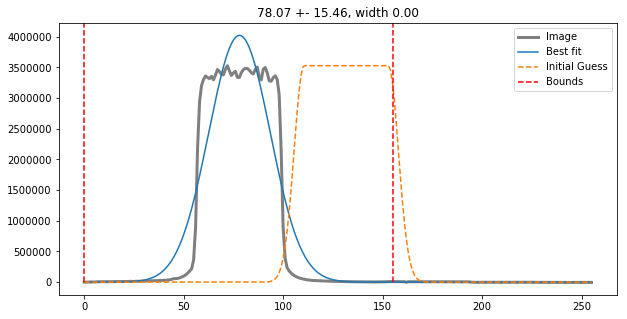

(array([[ 25.67176   ,   0.8957596 ,   8.018471  , ...,  11.533478  ,
        -41.843575  , -15.897526  ],
       [  5.9589157 ,  41.77603   ,  30.907288  , ...,  -0.37978363,
        -27.006378  , -35.57153   ],
       [ 20.306938  ,  -4.1981087 ,   3.5534515 , ...,   0.89972687,
        -32.24787   ,  -2.8583221 ],
       ...,
       [-31.418774  , -13.032211  , -41.736332  , ...,   1.0119705 ,
          5.5903244 , -34.026707  ],
       [ 22.469109  , -12.113312  ,   9.900932  , ..., -20.940224  ,
        -18.957535  ,   4.0735397 ],
       [-37.024708  , -52.30403   ,  -7.3827972 , ..., -13.849674  ,
        -12.769104  , -15.9711685 ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.03028248, 1.00843969, 1.014272

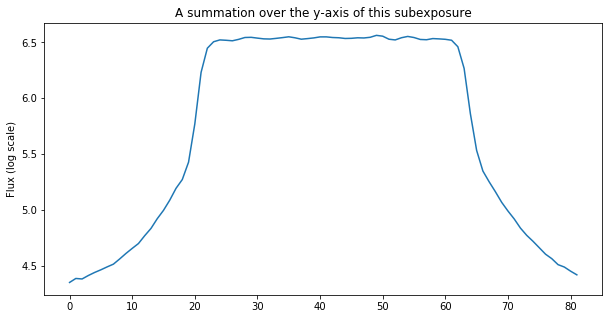

The difference between the two edges (for a 5-pixel bin for all subexps is): 787.48046875
This value may not be larger than  4434.546801346597  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Using flux for variance estimate
Extracting spectrum with optimal extraction...
1283038.549245409 pl 1283038.549245409 40.295628
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


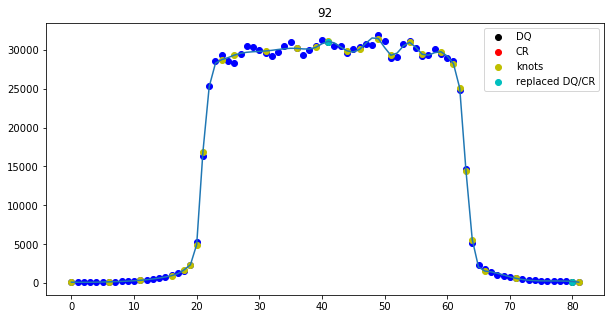

1293542.0217580372 pl 1293542.0217580372 40.112606
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


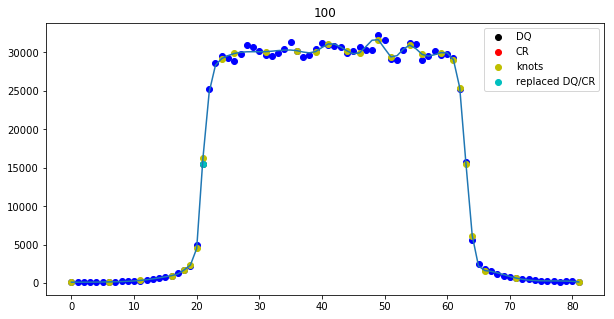

1285539.2380558301 pl 1285539.2380558301 40.008854
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


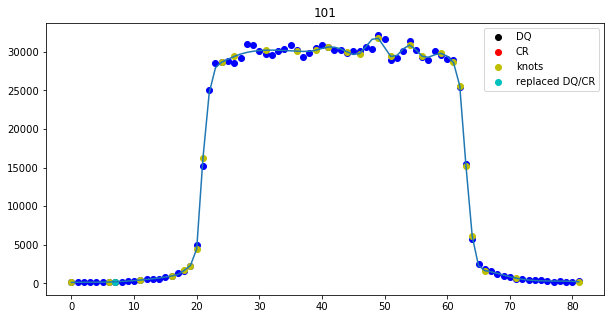

197 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 2]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 2
nr. of CRs 1172
Spectrum located at pixel 124 in spatial direction
subexp 163.02537550248587 [204, 162, 120, 78]
ypix is 162 for exposure 1


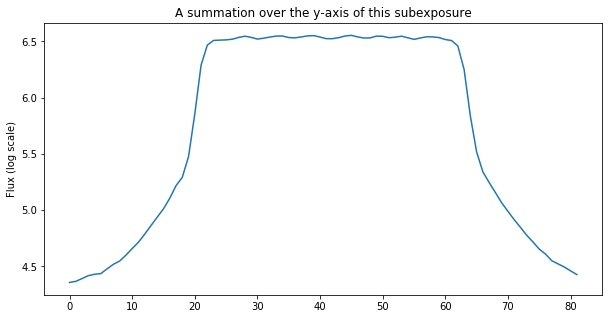

The difference between the two edges (for a 5-pixel bin for all subexps is): 811.89140625
This value may not be larger than  4436.210034101932  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1273268.6481891759 pl 1273268.6481891759 41.00668
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


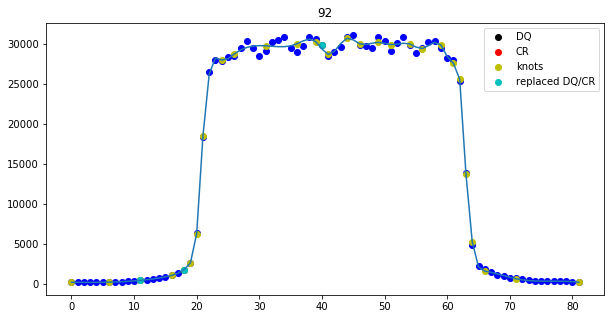

1294087.6446947758 pl 1294087.6446947758 41.096233
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


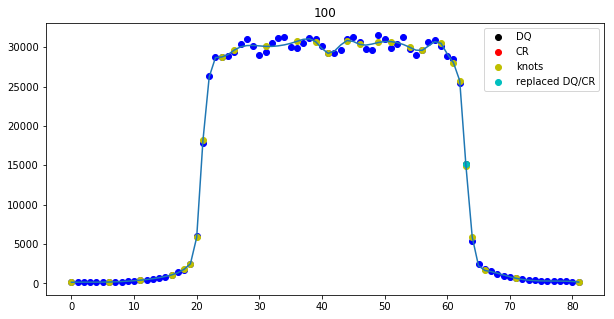

1283803.5807963638 pl 1283803.5807963638 40.628548
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


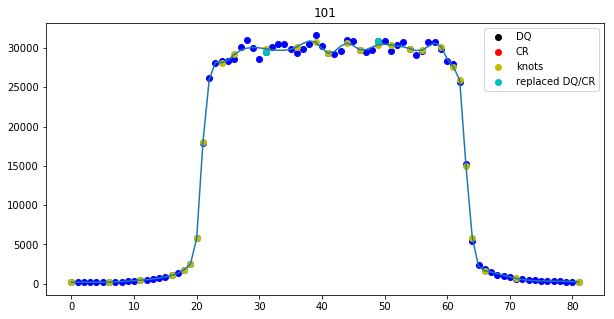

198 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 2]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 3
nr. of CRs 1166
Spectrum located at pixel 124 in spatial direction
subexp 120.61217508326934 [204, 162, 120, 78]
ypix is 120 for exposure 2


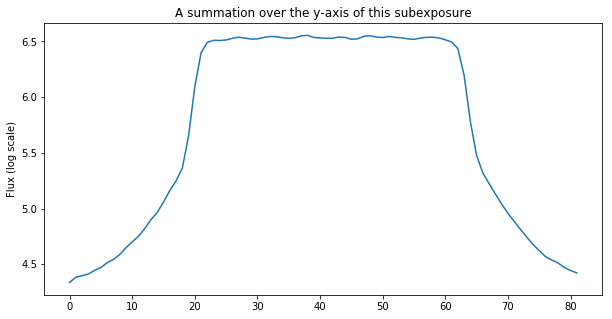

The difference between the two edges (for a 5-pixel bin for all subexps is): 813.5869791666667
This value may not be larger than  4436.040276342555  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1266063.4623672117 pl 1266063.4623672117 40.780193
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


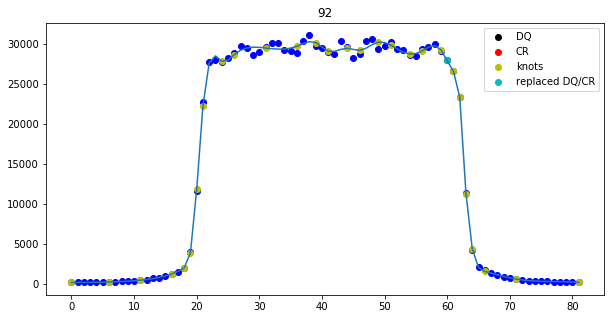

1292832.194482769 pl 1292832.194482769 40.75483
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


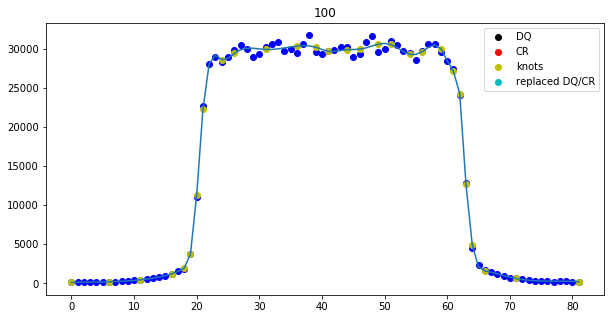

1285733.6449197049 pl 1285733.6449197049 40.797714
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


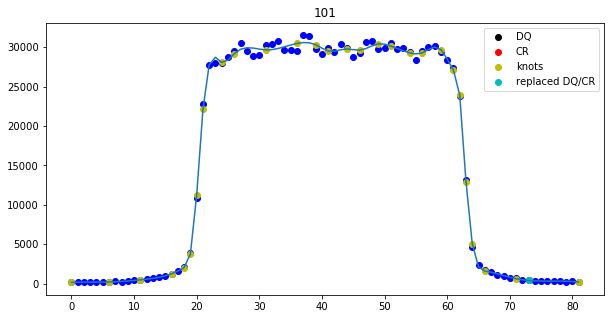

187 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 8]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 4
nr. of CRs 1169
Spectrum located at pixel 124 in spatial direction
subexp 78.06784832296287 [204, 162, 120, 78]
ypix is 78 for exposure 3


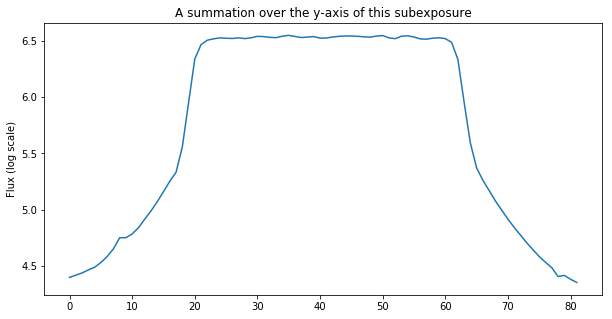

The difference between the two edges (for a 5-pixel bin for all subexps is): 486.45
This value may not be larger than  4434.9075901684055  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1262221.684495219 pl 1262221.684495219 41.42167
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


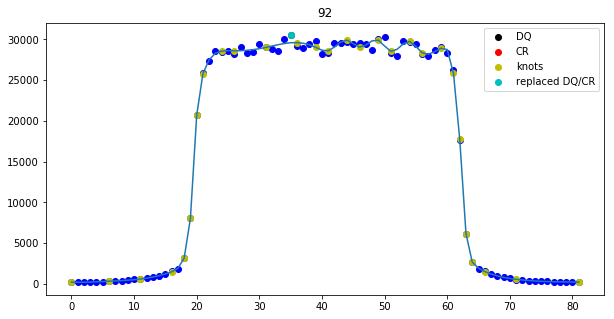

1291299.9486107044 pl 1291299.9486107044 41.63582
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


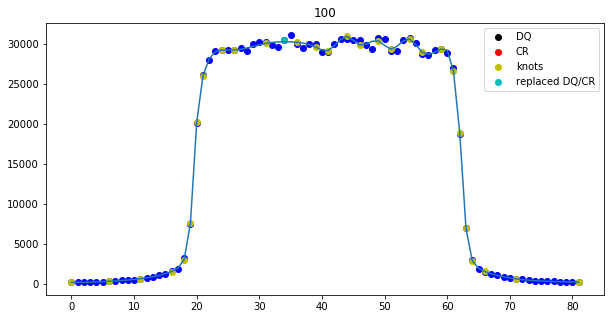

1280802.4595931356 pl 1280802.4595931356 42.09553
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


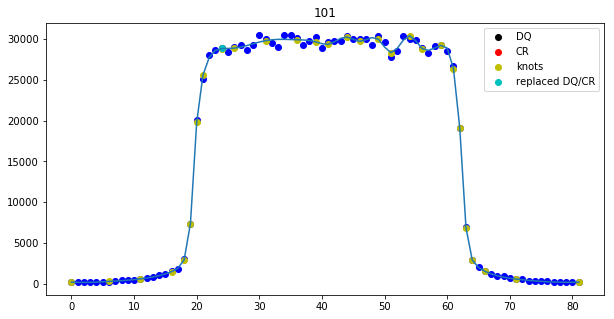

Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Applied an xshift of 0.00216530465254 pix compared to reference (reduced) spectrum ie9301bhq
Shifted subexposure nr. 1 with -0.387844987967 pixels and shrunk 0.226687531713 percent.
Shifted subexposure nr. 2 with -0.755222061927 pixels and shrunk 0.447000004452 percent.
Shifted subexposure nr. 3 with -1.03681067043 pixels and shrunk 0.653507467276 percent.
Saving spectrum to /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/ie9301bnq_spec.txt
Extraction took 2.60s
########################################
###########Finished Extraction##########
########################################
ie9301bnq
########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/s.baratuva.nl/Desktop/PhD/hst_dat

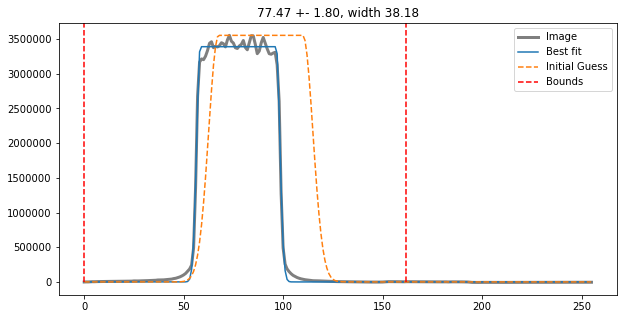

(array([[-17.836906  , -55.76203   ,  -4.607231  , ..., -48.126945  ,
         -4.5930405 ,  -2.004036  ],
       [ -8.418526  ,   8.275429  ,  -7.4185104 , ...,  27.392845  ,
         -5.19326   ,  -5.7336197 ],
       [  1.3359909 ,  35.928505  ,   4.4153824 , ...,   4.1132584 ,
        -12.39814   , -21.236946  ],
       ...,
       [ -0.42484283,  -8.425575  , -28.86222   , ...,  21.851036  ,
        -10.056526  ,  -4.3211136 ],
       [-13.142036  , -21.562141  ,   8.252251  , ...,  28.384743  ,
        -45.772438  , -22.416512  ],
       [ 27.520592  , -13.363106  , -53.796608  , ...,   7.9353867 ,
        -11.342659  ,   7.7155685 ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.01597487, 0.99097391, 1.001089

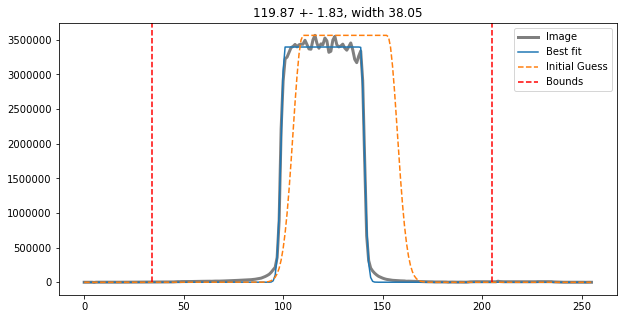

(array([[  4.612118  ,  -8.378895  , -54.539753  , ...,  25.873348  ,
         54.476665  ,  41.14773   ],
       [ 15.483562  ,  -0.93886185,  -3.5183983 , ...,   4.29636   ,
        -22.347149  ,  43.56439   ],
       [ 28.63982   , -12.525738  ,  54.281727  , ...,   2.2326317 ,
         18.686916  ,  -6.0459557 ],
       ...,
       [ 40.916103  ,   4.225071  ,   3.5362358 , ...,  -4.796467  ,
        -10.232868  , -11.049061  ],
       [ 13.455616  , -23.730808  ,   3.0260277 , ...,  26.287235  ,
        -15.7542305 ,  53.259243  ],
       [-20.622257  ,  10.307034  , -35.750843  , ...,  25.167645  ,
        -27.466602  ,  13.000912  ]], dtype=float32), array([[1.00005887, 0.99631715, 1.01913849, ..., 1.01117496, 0.9857711 ,
        1.00169883],
       [1.0077967 , 1.00066505, 0.99113703, ..., 0.97842318, 0.98744521,
        0.98047949],
       [0.98492686, 0.9683537 , 0.97322563, ..., 0.98656412, 1.01614636,
        0.99626665],
       ...,
       [0.99159165, 0.96546904, 0.939439

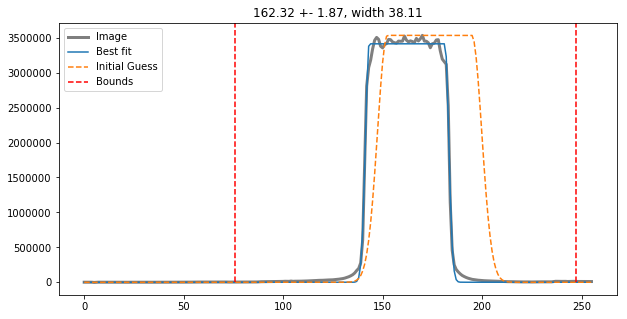

(array([[ 25.643967  ,  -3.7433853 ,  15.993385  , ..., -13.379562  ,
         31.92276   ,  17.487946  ],
       [ 30.961884  ,  64.46449   ,  31.369164  , ..., -26.409866  ,
         -7.896549  ,  62.16284   ],
       [ 24.775307  ,  13.294128  , -20.489586  , ...,   3.5147972 ,
         51.3861    ,  46.907562  ],
       ...,
       [ 15.935867  ,   7.5811157 , -12.88028   , ...,  44.427643  ,
          6.298313  ,  23.073029  ],
       [-22.523186  ,  -3.8128204 ,  20.345963  , ...,  11.91304   ,
         13.804375  ,   1.7732544 ],
       [ 22.369644  ,  47.9756    , -10.702278  , ...,  51.831024  ,
         59.455772  ,   0.06964111]], dtype=float32), array([[0.98118528, 0.99323157, 1.00366311, ..., 0.98204106, 0.9522191 ,
        0.97554738],
       [0.97276955, 0.98545687, 1.00024228, ..., 0.99504684, 0.98786921,
        0.98946573],
       [1.01984942, 1.02008576, 0.99551588, ..., 0.97861723, 0.98087129,
        0.98033262],
       ...,
       [0.95235794, 0.96168618, 1.000953

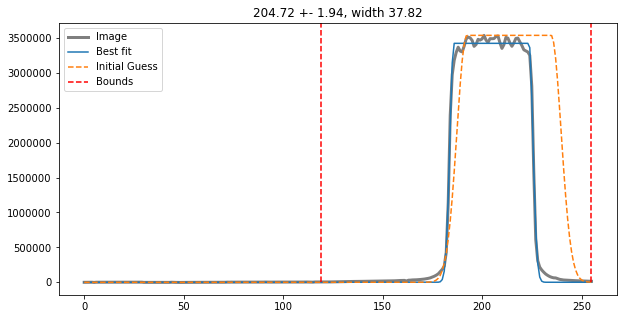

(array([[  0.3219986,  28.375015 ,  -7.408146 , ...,  21.242195 ,
         73.38442  ,   4.4043236],
       [ 12.917366 ,   2.3916664,  17.944153 , ...,   4.7831078,
         37.129723 , -10.757111 ],
       [ 57.602142 , -34.105392 ,   0.5376854, ...,  60.30478  ,
         29.082268 , -21.23557  ],
       ...,
       [ -4.625908 ,  19.430435 ,  38.093735 , ...,  27.342133 ,
         63.832703 ,  13.611736 ],
       [ 28.272652 ,  14.671856 ,  16.344215 , ...,  36.185265 ,
         38.3115   ,  29.878983 ],
       [-48.11078  ,  11.461399 ,  -8.2282715, ...,  38.267258 ,
         10.93927  ,  68.72874  ]], dtype=float32), array([[1.01551701, 0.9995939 , 1.0131288 , ..., 0.99402601, 0.99839718,
        1.0051168 ],
       [0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       ...,
       [0.99049433, 0.98990652, 1.01802076, ..., 0.98726069, 0.99180205,
   

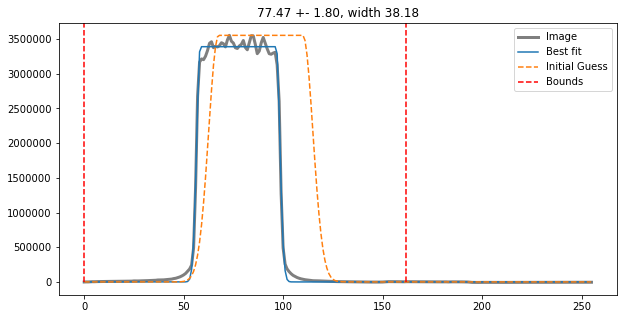

(array([[-17.836906  , -55.76203   ,  -4.607231  , ..., -48.126945  ,
         -4.5930405 ,  -2.004036  ],
       [ -8.418526  ,   8.275429  ,  -7.4185104 , ...,  27.392845  ,
         -5.19326   ,  -5.7336197 ],
       [  1.3359909 ,  35.928505  ,   4.4153824 , ...,   4.1132584 ,
        -12.39814   , -21.236946  ],
       ...,
       [ -0.42484283,  -8.425575  , -28.86222   , ...,  21.851036  ,
        -10.056526  ,  -4.3211136 ],
       [-13.142036  , -21.562141  ,   8.252251  , ...,  28.384743  ,
        -45.772438  , -22.416512  ],
       [ 27.520592  , -13.363106  , -53.796608  , ...,   7.9353867 ,
        -11.342659  ,   7.7155685 ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.01597487, 0.99097391, 1.001089

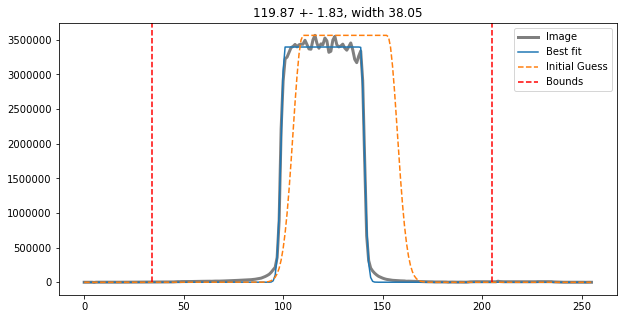

(array([[  4.612118  ,  -8.378895  , -54.539753  , ...,  25.873348  ,
         54.476665  ,  41.14773   ],
       [ 15.483562  ,  -0.93886185,  -3.5183983 , ...,   4.29636   ,
        -22.347149  ,  43.56439   ],
       [ 28.63982   , -12.525738  ,  54.281727  , ...,   2.2326317 ,
         18.686916  ,  -6.0459557 ],
       ...,
       [ 40.916103  ,   4.225071  ,   3.5362358 , ...,  -4.796467  ,
        -10.232868  , -11.049061  ],
       [ 13.455616  , -23.730808  ,   3.0260277 , ...,  26.287235  ,
        -15.7542305 ,  53.259243  ],
       [-20.622257  ,  10.307034  , -35.750843  , ...,  25.167645  ,
        -27.466602  ,  13.000912  ]], dtype=float32), array([[1.00005887, 0.99631715, 1.01913849, ..., 1.01117496, 0.9857711 ,
        1.00169883],
       [1.0077967 , 1.00066505, 0.99113703, ..., 0.97842318, 0.98744521,
        0.98047949],
       [0.98492686, 0.9683537 , 0.97322563, ..., 0.98656412, 1.01614636,
        0.99626665],
       ...,
       [0.99159165, 0.96546904, 0.939439

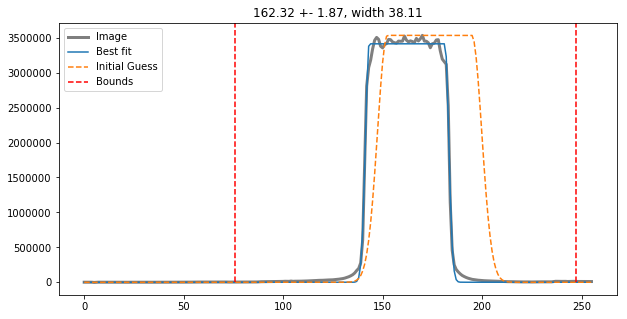

(array([[ 25.643967  ,  -3.7433853 ,  15.993385  , ..., -13.379562  ,
         31.92276   ,  17.487946  ],
       [ 30.961884  ,  64.46449   ,  31.369164  , ..., -26.409866  ,
         -7.896549  ,  62.16284   ],
       [ 24.775307  ,  13.294128  , -20.489586  , ...,   3.5147972 ,
         51.3861    ,  46.907562  ],
       ...,
       [ 15.935867  ,   7.5811157 , -12.88028   , ...,  44.427643  ,
          6.298313  ,  23.073029  ],
       [-22.523186  ,  -3.8128204 ,  20.345963  , ...,  11.91304   ,
         13.804375  ,   1.7732544 ],
       [ 22.369644  ,  47.9756    , -10.702278  , ...,  51.831024  ,
         59.455772  ,   0.06964111]], dtype=float32), array([[0.98118528, 0.99323157, 1.00366311, ..., 0.98204106, 0.9522191 ,
        0.97554738],
       [0.97276955, 0.98545687, 1.00024228, ..., 0.99504684, 0.98786921,
        0.98946573],
       [1.01984942, 1.02008576, 0.99551588, ..., 0.97861723, 0.98087129,
        0.98033262],
       ...,
       [0.95235794, 0.96168618, 1.000953

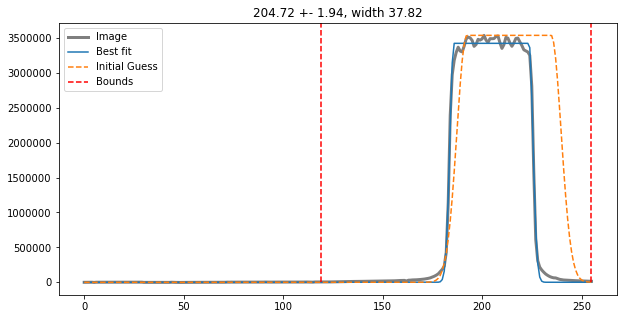

(array([[  0.3219986,  28.375015 ,  -7.408146 , ...,  21.242195 ,
         73.38442  ,   4.4043236],
       [ 12.917366 ,   2.3916664,  17.944153 , ...,   4.7831078,
         37.129723 , -10.757111 ],
       [ 57.602142 , -34.105392 ,   0.5376854, ...,  60.30478  ,
         29.082268 , -21.23557  ],
       ...,
       [ -4.625908 ,  19.430435 ,  38.093735 , ...,  27.342133 ,
         63.832703 ,  13.611736 ],
       [ 28.272652 ,  14.671856 ,  16.344215 , ...,  36.185265 ,
         38.3115   ,  29.878983 ],
       [-48.11078  ,  11.461399 ,  -8.2282715, ...,  38.267258 ,
         10.93927  ,  68.72874  ]], dtype=float32), array([[1.01551701, 0.9995939 , 1.0131288 , ..., 0.99402601, 0.99839718,
        1.0051168 ],
       [0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       ...,
       [0.99049433, 0.98990652, 1.01802076, ..., 0.98726069, 0.99180205,
   

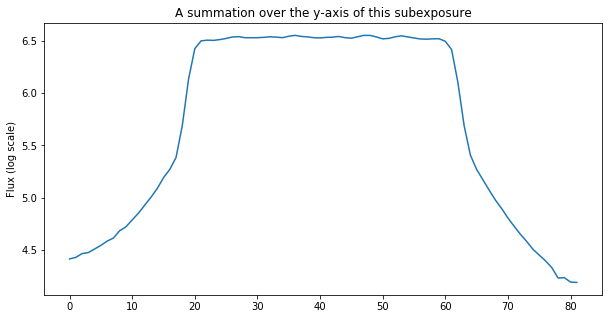

The difference between the two edges (for a 5-pixel bin for all subexps is): 1518.2024739583333
This value may not be larger than  4419.3511439275035  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Using flux for variance estimate
Extracting spectrum with optimal extraction...
1253680.2798038502 pl 1253680.2798038502 41.187836
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


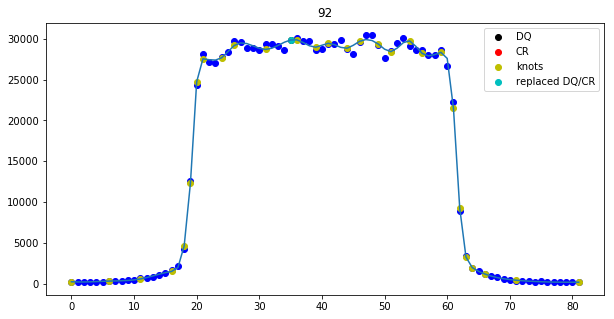

1283005.5153602194 pl 1283005.5153602194 41.066807
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


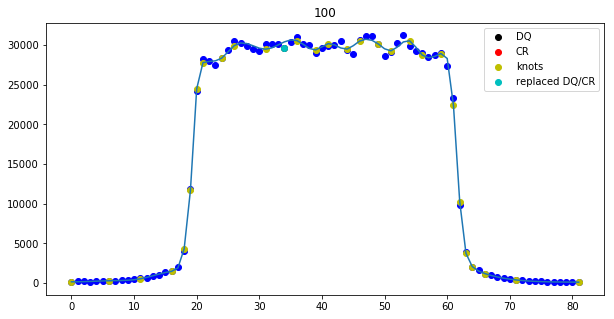

1273001.2429215212 pl 1273001.2429215212 40.500088
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


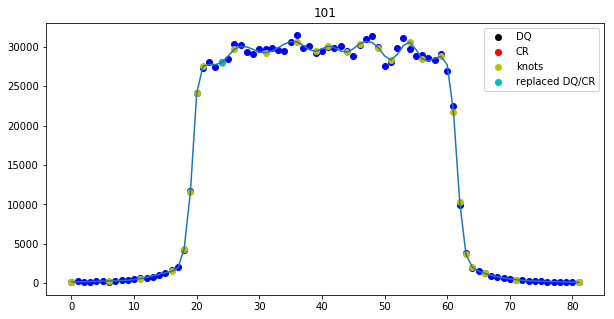

Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 2
nr. of CRs 1198
Spectrum located at pixel 124 in spatial direction
subexp 119.87334023783092 [204, 162, 120, 78]
ypix is 120 for exposure 1


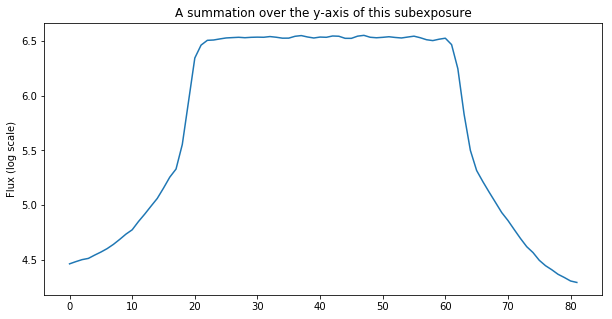

The difference between the two edges (for a 5-pixel bin for all subexps is): 1432.35078125
This value may not be larger than  4433.331208019541  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1266458.5152669456 pl 1266458.5152669456 40.874607
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


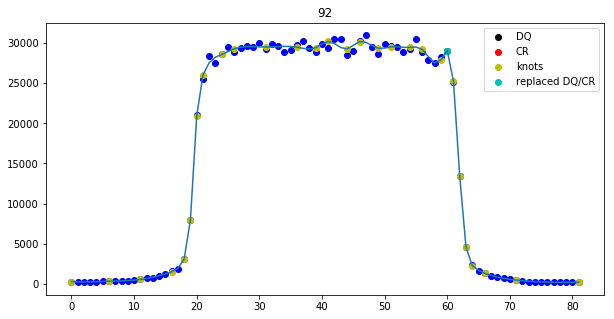

1290773.373792639 pl 1290773.373792639 40.783142
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


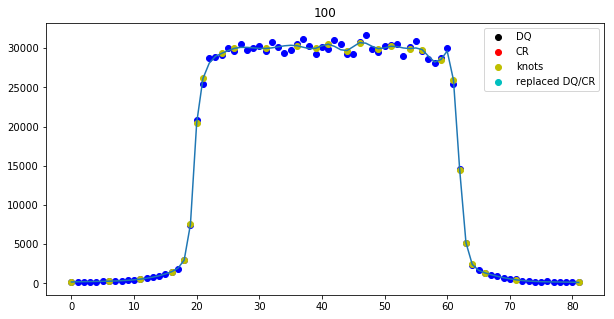

1284228.0775521684 pl 1284228.0775521684 40.698803
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


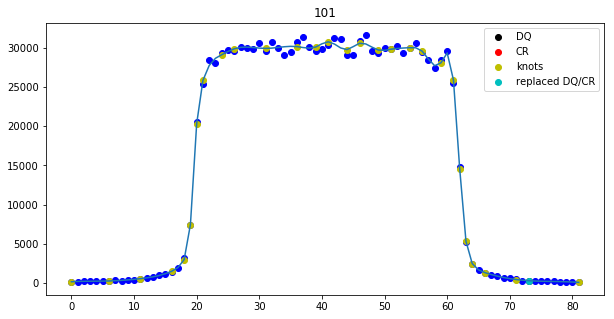

186 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 12]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 3
nr. of CRs 1192
Spectrum located at pixel 124 in spatial direction
subexp 162.32241987672347 [204, 162, 120, 78]
ypix is 162 for exposure 2


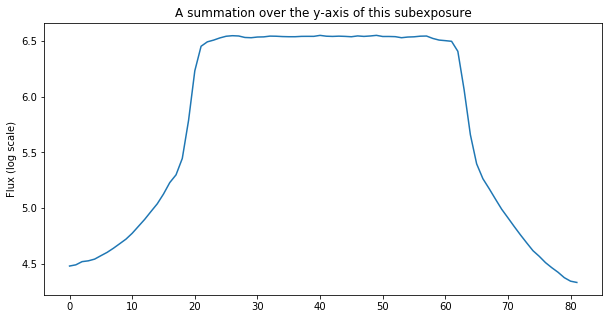

The difference between the two edges (for a 5-pixel bin for all subexps is): 1264.4997395833334
This value may not be larger than  4455.617936942081  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1283092.1211258771 pl 1283092.1211258771 41.72342
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


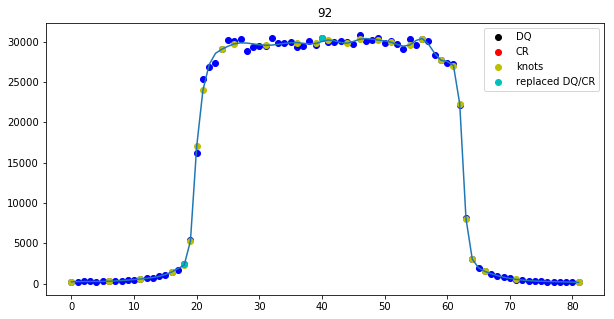

1305777.671200675 pl 1305777.671200675 41.645298
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


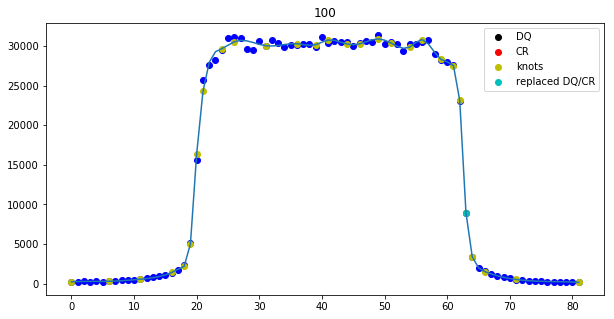

1296751.926819887 pl 1296751.926819887 41.316196
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


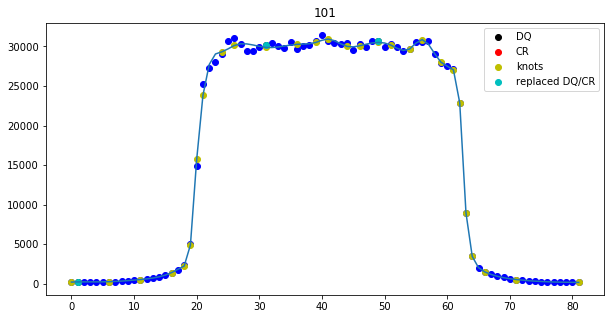

195 successes out of 200 total fits
Optimal extraction fitting failed for columns: [1, 2, 3, 4, 6]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 4
nr. of CRs 1195
Spectrum located at pixel 124 in spatial direction
subexp 204.7170419312162 [204, 162, 120, 78]
ypix is 204 for exposure 3


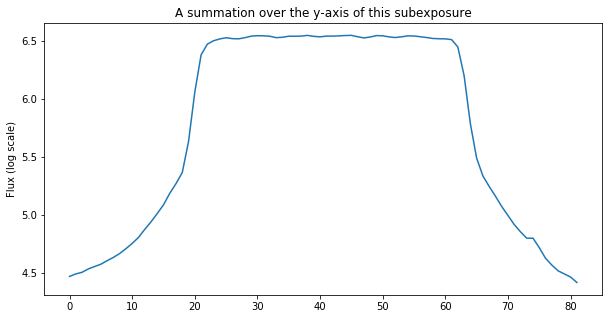

The difference between the two edges (for a 5-pixel bin for all subexps is): 638.9348958333334
This value may not be larger than  4457.409711181297  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1296420.9427692979 pl 1296420.9427692979 41.336823
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


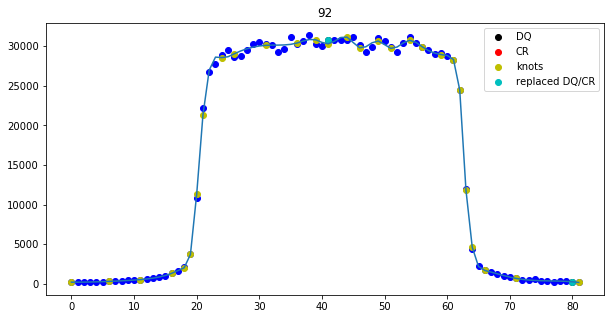

1302699.7394752137 pl 1302699.7394752137 42.005966
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


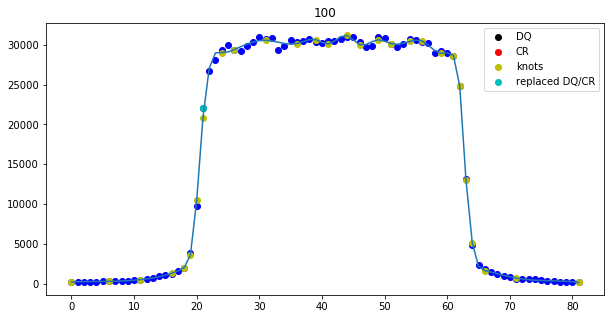

1299921.9505867462 pl 1299921.9505867462 41.51609
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


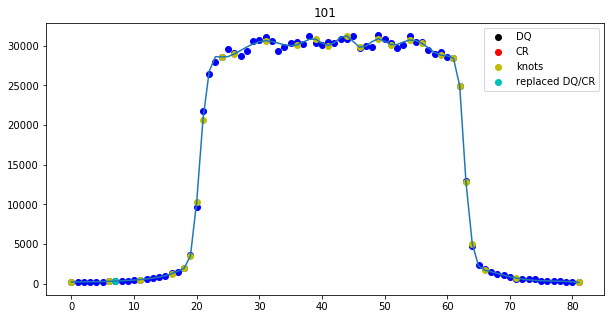

192 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Applied an xshift of 0.00976775614973 pix compared to reference (reduced) spectrum ie9301bhq
Shifted subexposure nr. 0 with -1.10782576596 pixels and shrunk 0.670445212 percent.
Shifted subexposure nr. 1 with -0.758005234414 pixels and shrunk 0.450482525013 percent.
Shifted subexposure nr. 2 with -0.404731290831 pixels and shrunk 0.239030579727 percent.
Saving spectrum to /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/ie9301boq_spec.txt
Extraction took 2.56s
########################################
###########Finished Extraction##########
########################################
ie9301boq
########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/s.baratuva.nl/Desktop/PhD/hst_data_a

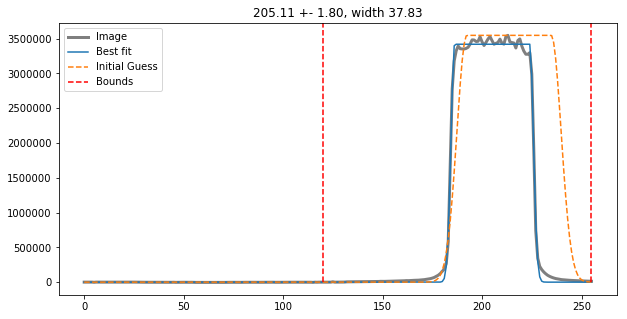

(array([[ 11.42025   , -33.70716   , -10.554024  , ...,  32.849434  ,
         -8.561012  ,  34.672905  ],
       [-36.178444  ,  56.70063   ,  35.296654  , ...,  26.671074  ,
        -28.183983  ,  -4.876564  ],
       [ 21.233604  ,  28.697533  ,   5.8930283 , ...,  18.456474  ,
         14.268898  ,  -8.290184  ],
       ...,
       [ 12.946312  ,  11.680321  ,  -4.525635  , ...,  21.06466   ,
          0.32239532,  31.453423  ],
       [  3.368019  ,  24.353447  ,  44.997658  , ...,  64.00106   ,
         38.217598  ,  51.47367   ],
       [-28.76609   ,  42.62371   ,   9.235893  , ...,   8.325218  ,
         18.836525  ,  17.232262  ]], dtype=float32), array([[0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       [1.01465568, 1.01152106, 0.97465585, ..., 0.99614412, 0.99226877,
        0.99630135],
       ...,
       [0.99049433, 0.98990652, 1.018020

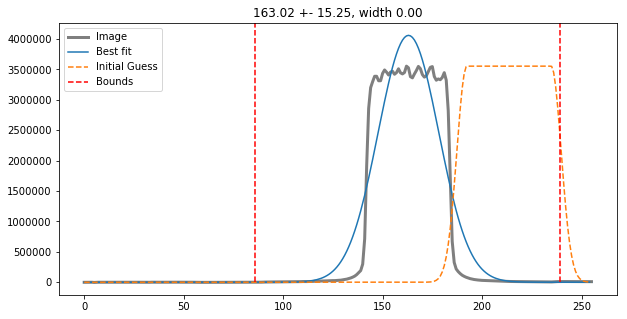

(array([[ 66.287575 ,   2.0795364,  20.756233 , ...,  13.351295 ,
         32.677696 ,  37.06298  ],
       [ 35.58082  ,  45.678734 ,  -5.0298233, ...,  58.43914  ,
         16.309486 ,  13.004478 ],
       [ 69.51995  ,  42.45089  ,  29.689705 , ...,   3.0968246,
         46.265205 ,  22.220985 ],
       ...,
       [ 11.205627 ,   2.1693268,  10.802586 , ..., -22.884872 ,
         24.265305 , -26.283318 ],
       [ 12.453369 ,  22.964546 ,  -5.6913834, ..., -35.08082  ,
        -21.355232 ,  32.373795 ],
       [-53.77439  ,  -7.405365 ,   9.71051  , ...,   1.0806885,
         -4.1688232,  28.902252 ]], dtype=float32), array([[0.97797824, 1.01717404, 1.02369336, ..., 0.97947431, 0.99055837,
        0.97462096],
       [0.86756175, 1.00057105, 1.00078321, ..., 0.98511468, 0.98741866,
        0.97093693],
       [1.04421316, 1.00141875, 0.96262652, ..., 0.98749226, 1.01309426,
        0.9847939 ],
       ...,
       [0.98067773, 1.00647348, 0.9807526 , ..., 1.00480205, 0.98312882,
   

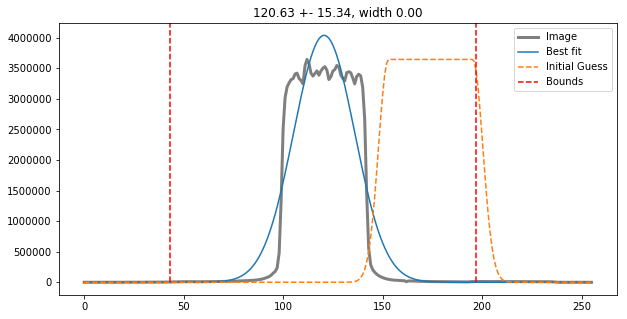

(array([[  2.566887 ,  26.997154 ,  30.32209  , ...,  36.07141  ,
        -24.577305 ,  15.818001 ],
       [ 18.1045   ,  12.14463  ,  43.006172 , ..., -50.101418 ,
         22.715843 , -11.068581 ],
       [ 11.604637 ,  31.560188 ,  23.111145 , ...,  14.619896 ,
        -19.720627 ,  -6.4106903],
       ...,
       [ 18.102776 , -29.199574 ,   5.6219864, ...,  -2.7982788,
        -12.210693 , -10.7520485],
       [ 19.013474 ,  10.579666 ,  -7.3822327, ..., -43.025986 ,
         21.112312 ,  38.707375 ],
       [ 15.369804 ,   7.4913216,  45.416    , ...,   3.1431198,
         14.718117 ,  27.655228 ]], dtype=float32), array([[0.99152216, 0.98206137, 0.98798856, ..., 0.9900434 , 0.97864713,
        0.99251526],
       [1.0128799 , 0.96209698, 1.03174513, ..., 1.00765806, 0.99389191,
        0.98775042],
       [0.99974451, 0.98079478, 0.99440176, ..., 0.99625174, 0.9890361 ,
        0.95858532],
       ...,
       [1.03185068, 1.00088005, 0.98926224, ..., 0.98714183, 0.9753993 ,
   

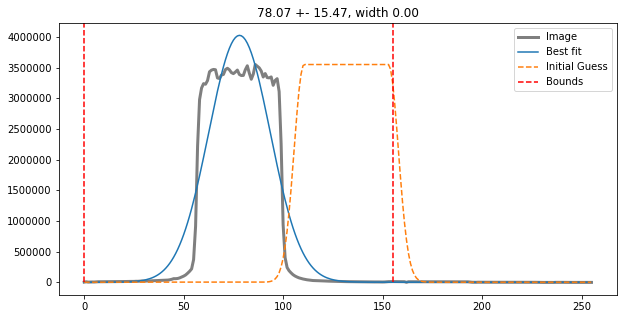

(array([[ 14.3329735 , -10.443256  ,  27.171864  , ..., -18.470997  ,
         -4.030224  , -17.839989  ],
       [  6.348011  ,   6.981556  ,   5.4952736 , ...,  -6.9984856 ,
         24.839542  , -42.190063  ],
       [ 23.041767  ,  54.830677  ,  -5.4386253 , ...,  -3.3807182 ,
        -59.913456  ,  -0.12325668],
       ...,
       [-16.977413  , -36.050114  ,   5.48151   , ..., -38.69046   ,
         -3.4629784 ,  15.860203  ],
       [-12.25523   ,  -9.378235  ,   5.612934  , ..., -27.636543  ,
         35.64398   , -12.052418  ],
       [-27.266129  ,  -0.40343857,  28.129063  , ...,   7.746311  ,
        -21.822834  , -36.812977  ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.03028248, 1.00843969, 1.014272

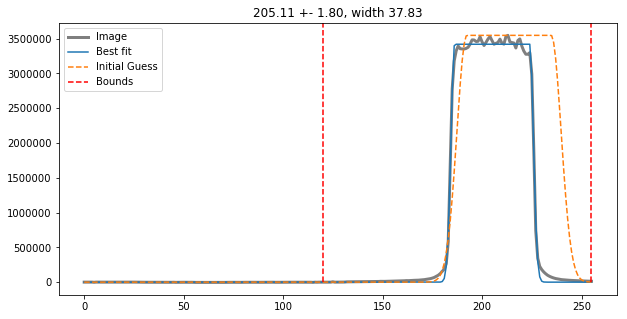

(array([[ 11.42025   , -33.70716   , -10.554024  , ...,  32.849434  ,
         -8.561012  ,  34.672905  ],
       [-36.178444  ,  56.70063   ,  35.296654  , ...,  26.671074  ,
        -28.183983  ,  -4.876564  ],
       [ 21.233604  ,  28.697533  ,   5.8930283 , ...,  18.456474  ,
         14.268898  ,  -8.290184  ],
       ...,
       [ 12.946312  ,  11.680321  ,  -4.525635  , ...,  21.06466   ,
          0.32239532,  31.453423  ],
       [  3.368019  ,  24.353447  ,  44.997658  , ...,  64.00106   ,
         38.217598  ,  51.47367   ],
       [-28.76609   ,  42.62371   ,   9.235893  , ...,   8.325218  ,
         18.836525  ,  17.232262  ]], dtype=float32), array([[0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       [1.01465568, 1.01152106, 0.97465585, ..., 0.99614412, 0.99226877,
        0.99630135],
       ...,
       [0.99049433, 0.98990652, 1.018020

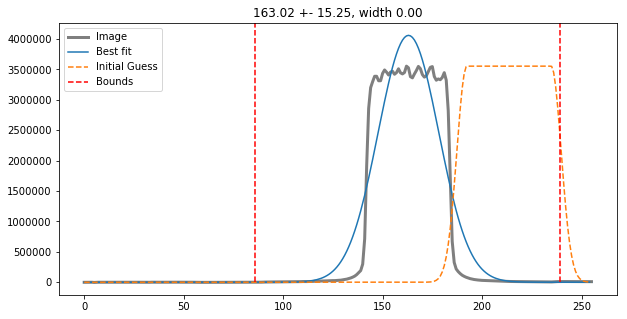

(array([[ 66.287575 ,   2.0795364,  20.756233 , ...,  13.351295 ,
         32.677696 ,  37.06298  ],
       [ 35.58082  ,  45.678734 ,  -5.0298233, ...,  58.43914  ,
         16.309486 ,  13.004478 ],
       [ 69.51995  ,  42.45089  ,  29.689705 , ...,   3.0968246,
         46.265205 ,  22.220985 ],
       ...,
       [ 11.205627 ,   2.1693268,  10.802586 , ..., -22.884872 ,
         24.265305 , -26.283318 ],
       [ 12.453369 ,  22.964546 ,  -5.6913834, ..., -35.08082  ,
        -21.355232 ,  32.373795 ],
       [-53.77439  ,  -7.405365 ,   9.71051  , ...,   1.0806885,
         -4.1688232,  28.902252 ]], dtype=float32), array([[0.97797824, 1.01717404, 1.02369336, ..., 0.97947431, 0.99055837,
        0.97462096],
       [0.86756175, 1.00057105, 1.00078321, ..., 0.98511468, 0.98741866,
        0.97093693],
       [1.04421316, 1.00141875, 0.96262652, ..., 0.98749226, 1.01309426,
        0.9847939 ],
       ...,
       [0.98067773, 1.00647348, 0.9807526 , ..., 1.00480205, 0.98312882,
   

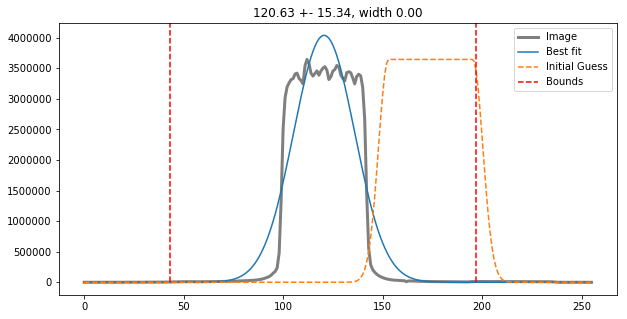

(array([[  2.566887 ,  26.997154 ,  30.32209  , ...,  36.07141  ,
        -24.577305 ,  15.818001 ],
       [ 18.1045   ,  12.14463  ,  43.006172 , ..., -50.101418 ,
         22.715843 , -11.068581 ],
       [ 11.604637 ,  31.560188 ,  23.111145 , ...,  14.619896 ,
        -19.720627 ,  -6.4106903],
       ...,
       [ 18.102776 , -29.199574 ,   5.6219864, ...,  -2.7982788,
        -12.210693 , -10.7520485],
       [ 19.013474 ,  10.579666 ,  -7.3822327, ..., -43.025986 ,
         21.112312 ,  38.707375 ],
       [ 15.369804 ,   7.4913216,  45.416    , ...,   3.1431198,
         14.718117 ,  27.655228 ]], dtype=float32), array([[0.99152216, 0.98206137, 0.98798856, ..., 0.9900434 , 0.97864713,
        0.99251526],
       [1.0128799 , 0.96209698, 1.03174513, ..., 1.00765806, 0.99389191,
        0.98775042],
       [0.99974451, 0.98079478, 0.99440176, ..., 0.99625174, 0.9890361 ,
        0.95858532],
       ...,
       [1.03185068, 1.00088005, 0.98926224, ..., 0.98714183, 0.9753993 ,
   

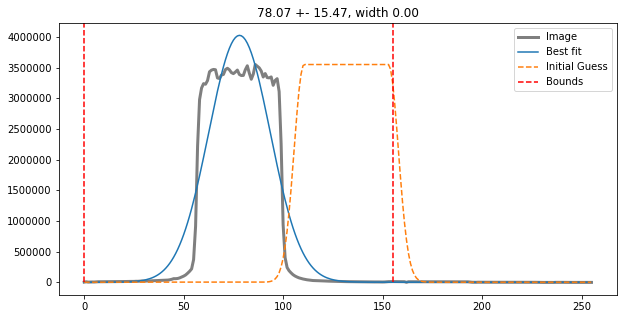

(array([[ 14.3329735 , -10.443256  ,  27.171864  , ..., -18.470997  ,
         -4.030224  , -17.839989  ],
       [  6.348011  ,   6.981556  ,   5.4952736 , ...,  -6.9984856 ,
         24.839542  , -42.190063  ],
       [ 23.041767  ,  54.830677  ,  -5.4386253 , ...,  -3.3807182 ,
        -59.913456  ,  -0.12325668],
       ...,
       [-16.977413  , -36.050114  ,   5.48151   , ..., -38.69046   ,
         -3.4629784 ,  15.860203  ],
       [-12.25523   ,  -9.378235  ,   5.612934  , ..., -27.636543  ,
         35.64398   , -12.052418  ],
       [-27.266129  ,  -0.40343857,  28.129063  , ...,   7.746311  ,
        -21.822834  , -36.812977  ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.03028248, 1.00843969, 1.014272

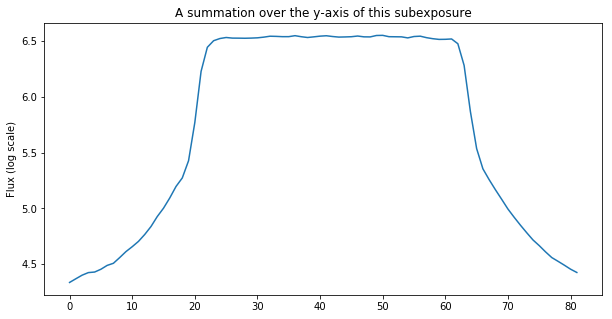

The difference between the two edges (for a 5-pixel bin for all subexps is): 908.0330729166667
This value may not be larger than  4436.924580532481  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Using flux for variance estimate
Extracting spectrum with optimal extraction...
1284604.7580398107 pl 1284604.7580398107 41.160534
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


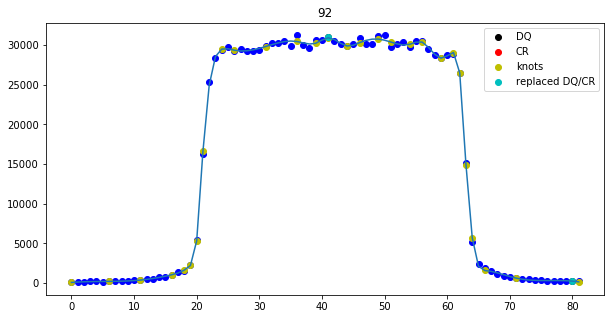

1293125.9924710041 pl 1293125.9924710041 41.094078
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


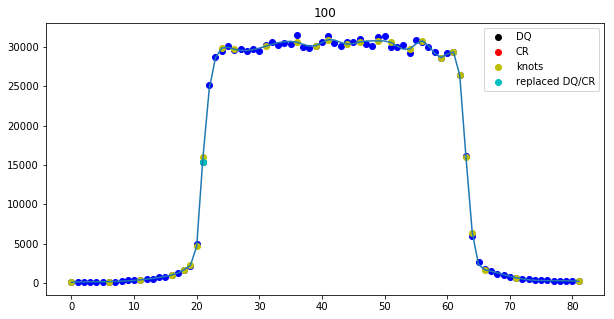

1287545.7149315437 pl 1287545.7149315437 41.275032
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


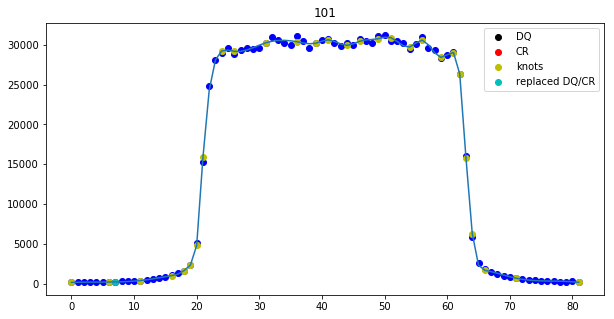

197 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 3, 4]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 2
nr. of CRs 1173
Spectrum located at pixel 124 in spatial direction
subexp 163.02201394762827 [204, 162, 120, 78]
ypix is 162 for exposure 1


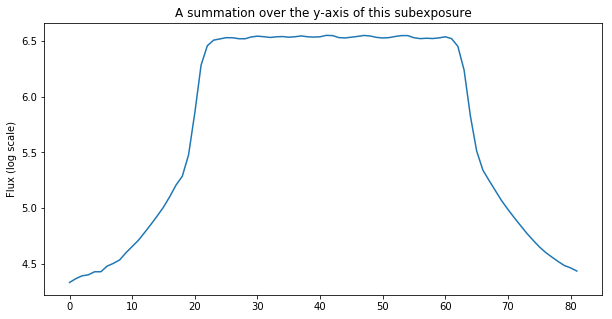

The difference between the two edges (for a 5-pixel bin for all subexps is): 1005.8403645833333
This value may not be larger than  4437.881536649365  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1276760.496838038 pl 1276760.496838038 41.144596
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


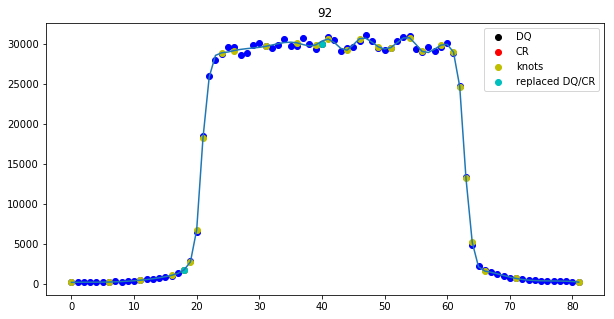

1294757.05693712 pl 1294757.05693712 41.008137
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


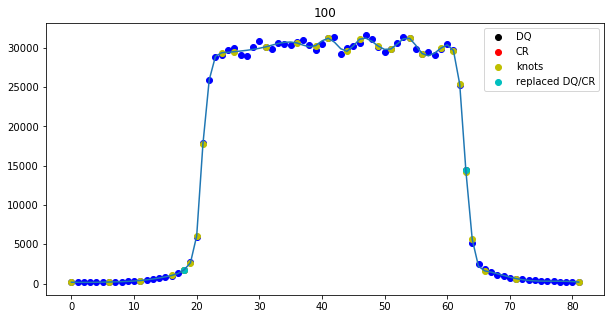

1285249.0154400957 pl 1285249.0154400957 40.8367
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


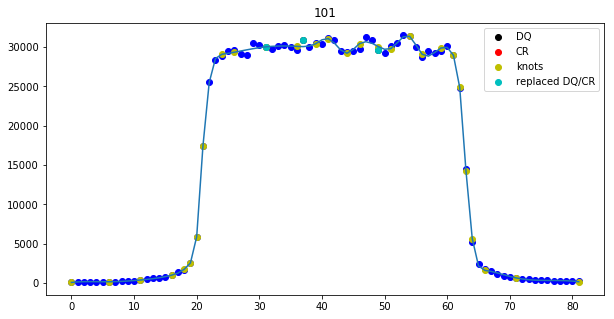

195 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 2, 3, 6]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 3
nr. of CRs 1149
Spectrum located at pixel 124 in spatial direction
subexp 120.6319055823638 [204, 162, 120, 78]
ypix is 120 for exposure 2


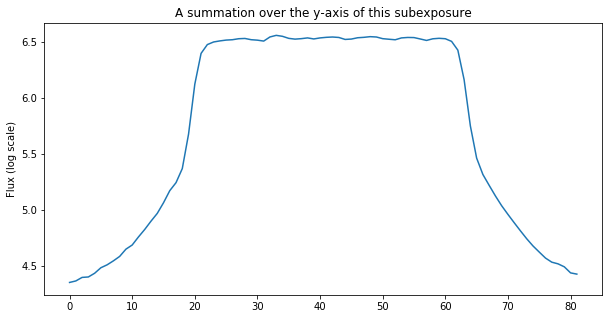

The difference between the two edges (for a 5-pixel bin for all subexps is): 653.4723958333333
This value may not be larger than  4438.975737712474  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1267570.0024765306 pl 1267570.0024765306 40.17386
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


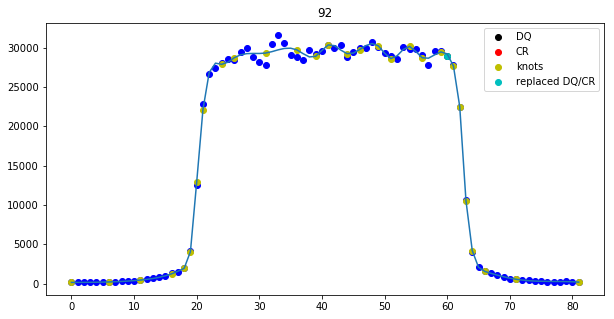

1296649.479438426 pl 1296649.479438426 40.543667
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


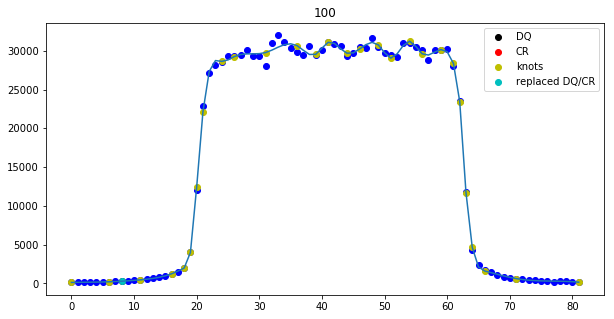

1285851.8638028891 pl 1285851.8638028891 39.77142
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


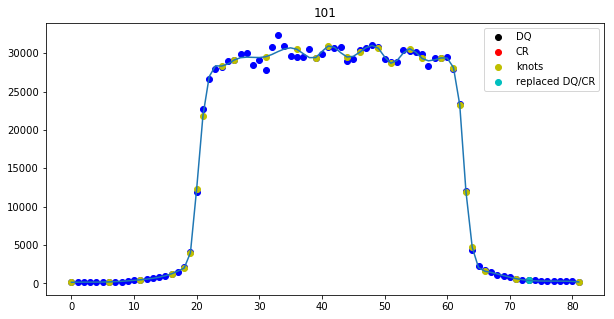

191 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 4, 6, 7]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 4
nr. of CRs 1184
Spectrum located at pixel 124 in spatial direction
subexp 78.0689202791979 [204, 162, 120, 78]
ypix is 78 for exposure 3


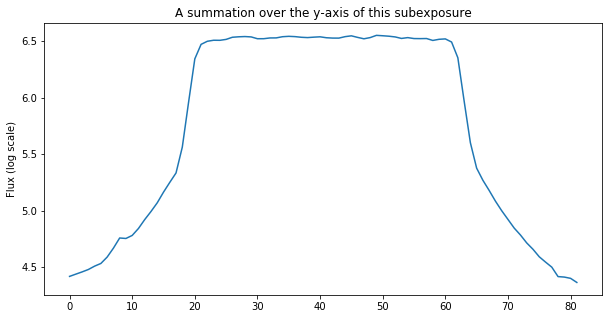

The difference between the two edges (for a 5-pixel bin for all subexps is): 570.16640625
This value may not be larger than  4438.039447023126  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1264368.341747955 pl 1264368.341747955 40.951717
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


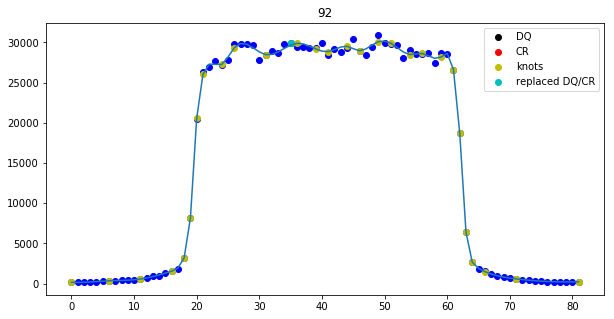

1292348.069836526 pl 1292348.069836526 40.8336
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


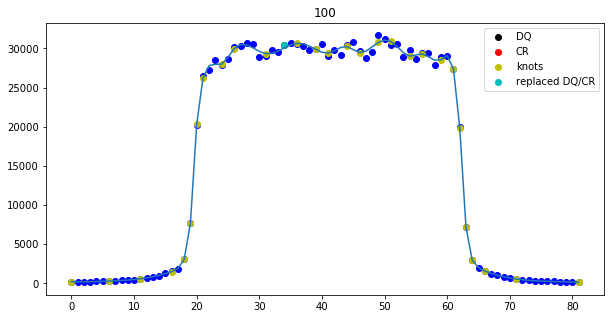

1281850.092915031 pl 1281850.092915031 41.23825
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


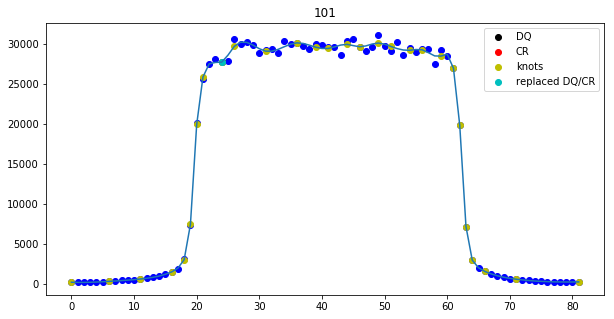

Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Applied an xshift of -0.000736689857552 pix compared to reference (reduced) spectrum ie9301bhq
Shifted subexposure nr. 1 with -0.390690402014 pixels and shrunk 0.234159201692 percent.
Shifted subexposure nr. 2 with -0.757767185902 pixels and shrunk 0.448394289504 percent.
Shifted subexposure nr. 3 with -1.10546221961 pixels and shrunk 0.671425212118 percent.
Saving spectrum to /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/ie9301bqq_spec.txt
Extraction took 2.56s
########################################
###########Finished Extraction##########
########################################
ie9301bqq
########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/s.baratuva.nl/Desktop/PhD/hst_data_anal

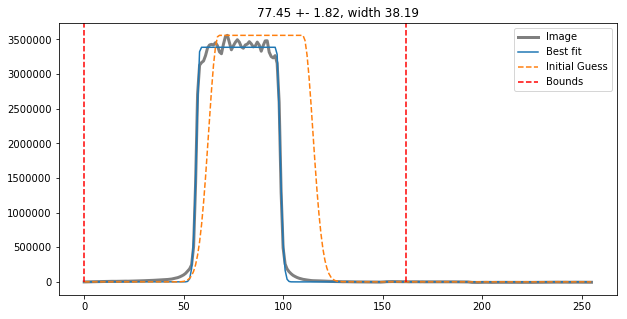

(array([[  4.095566  ,  22.462082  ,  -1.4374695 , ..., -16.908508  ,
          0.90226746,  12.844818  ],
       [ 11.170189  , -16.700043  , -25.358109  , ...,  16.520485  ,
        -11.389481  , -32.975418  ],
       [ 18.579971  , -12.503052  ,  45.11451   , ...,  11.948013  ,
         25.837524  , -34.448563  ],
       ...,
       [ -4.286255  ,  -2.9231873 ,  -2.2909546 , ...,  -5.605072  ,
         44.998383  ,  -3.4866638 ],
       [-12.321564  , -11.377808  ,   6.732727  , ..., -13.215347  ,
         16.355194  ,   1.9911957 ],
       [ 26.00064   , -24.246857  , -10.83844   , ...,  44.130844  ,
        -55.29904   ,  -3.2382507 ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.01597487, 0.99097391, 1.001089

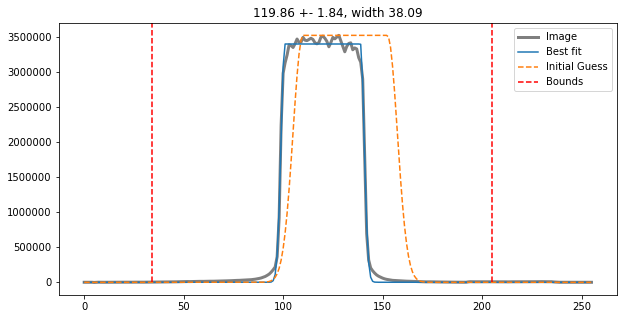

(array([[ 75.44503  ,  27.27237  , -37.652695 , ...,   7.6341324,
          1.1602631,   8.877487 ],
       [ -5.1585236,  -9.851898 , -10.086136 , ...,   2.4270325,
         20.214668 , -16.766273 ],
       [ -6.0747986,  34.851982 , -10.923889 , ...,  23.74881  ,
         14.478409 ,  31.838974 ],
       ...,
       [ 46.065475 ,   4.694687 ,  -7.7002487, ...,  47.53369  ,
         30.312675 ,  29.495468 ],
       [ 13.923553 ,  21.219643 ,  24.564163 , ...,  22.038925 ,
        -20.001846 ,  34.86731  ],
       [-13.129738 , -29.023315 ,  -4.847046 , ...,   6.7761383,
         27.222672 ,  37.041718 ]], dtype=float32), array([[1.00005887, 0.99631715, 1.01913849, ..., 1.01117496, 0.9857711 ,
        1.00169883],
       [1.0077967 , 1.00066505, 0.99113703, ..., 0.97842318, 0.98744521,
        0.98047949],
       [0.98492686, 0.9683537 , 0.97322563, ..., 0.98656412, 1.01614636,
        0.99626665],
       ...,
       [0.99159165, 0.96546904, 0.93943933, ..., 0.99333385, 0.98981972,
   

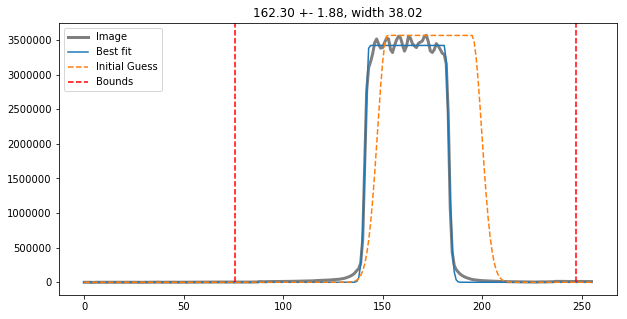

(array([[  2.011757 ,  17.190636 , -35.785744 , ...,  23.860672 ,
         24.731133 ,  33.680634 ],
       [ 54.23999  , -10.770226 ,  14.762344 , ...,  20.184189 ,
         36.358803 ,  19.894684 ],
       [ 45.71051  ,   1.3889885,   2.7886505, ...,  10.354103 ,
         13.793968 ,  49.070473 ],
       ...,
       [ 29.807358 ,  14.428383 ,  22.060272 , ...,  -7.6167297,
        -15.098    , -14.826195 ],
       [ 14.758984 ,  31.12767  ,  10.804634 , ...,  30.59423  ,
         13.626808 , -14.908226 ],
       [-19.948242 ,   5.658203 , -41.314087 , ...,  18.647102 ,
         16.842415 ,  -2.4668121]], dtype=float32), array([[0.98118528, 0.99323157, 1.00366311, ..., 0.98204106, 0.9522191 ,
        0.97554738],
       [0.97276955, 0.98545687, 1.00024228, ..., 0.99504684, 0.98786921,
        0.98946573],
       [1.01984942, 1.02008576, 0.99551588, ..., 0.97861723, 0.98087129,
        0.98033262],
       ...,
       [0.95235794, 0.96168618, 1.00095344, ..., 0.98480437, 0.99359909,
   

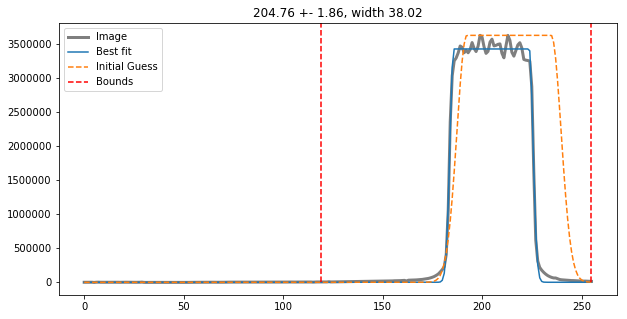

(array([[ 54.84721  , -17.960997 , -13.868986 , ...,  -6.244053 ,
          3.8059921,  42.398098 ],
       [ 41.64089  ,  49.87917  ,  16.174305 , ...,  19.390446 ,
         -9.064518 ,  34.25234  ],
       [ -9.844578 ,  43.874928 ,  43.334843 , ...,  25.802586 ,
          3.9345665,  14.41893  ],
       ...,
       [ -8.732151 ,  17.666027 ,  12.916229 , ...,   6.69923  ,
         33.76147  ,  70.77008  ],
       [-13.293072 ,  22.271679 ,  16.920254 , ...,  -8.034016 ,
         29.45641  , -14.33979  ],
       [ -7.73378  ,  14.37933  , -33.405304 , ...,  19.982563 ,
         39.80559  ,  26.867695 ]], dtype=float32), array([[1.01551701, 0.9995939 , 1.0131288 , ..., 0.99402601, 0.99839718,
        1.0051168 ],
       [0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       ...,
       [0.99049433, 0.98990652, 1.01802076, ..., 0.98726069, 0.99180205,
   

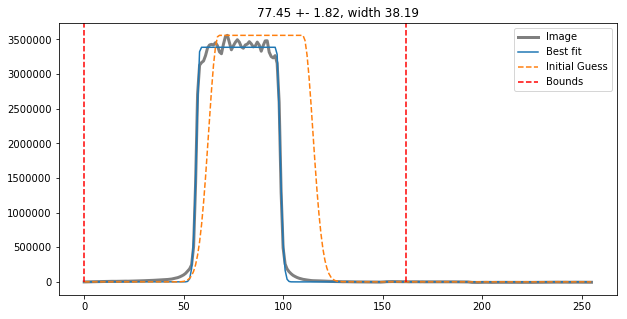

(array([[  4.095566  ,  22.462082  ,  -1.4374695 , ..., -16.908508  ,
          0.90226746,  12.844818  ],
       [ 11.170189  , -16.700043  , -25.358109  , ...,  16.520485  ,
        -11.389481  , -32.975418  ],
       [ 18.579971  , -12.503052  ,  45.11451   , ...,  11.948013  ,
         25.837524  , -34.448563  ],
       ...,
       [ -4.286255  ,  -2.9231873 ,  -2.2909546 , ...,  -5.605072  ,
         44.998383  ,  -3.4866638 ],
       [-12.321564  , -11.377808  ,   6.732727  , ..., -13.215347  ,
         16.355194  ,   1.9911957 ],
       [ 26.00064   , -24.246857  , -10.83844   , ...,  44.130844  ,
        -55.29904   ,  -3.2382507 ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.01597487, 0.99097391, 1.001089

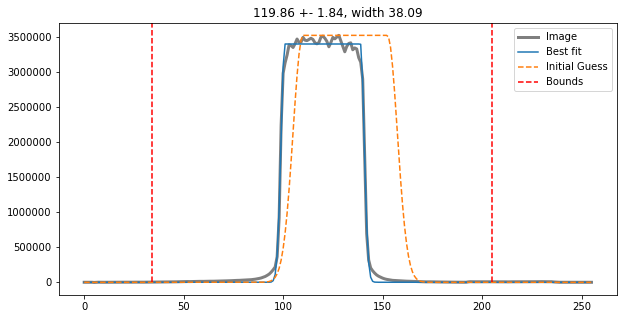

(array([[ 75.44503  ,  27.27237  , -37.652695 , ...,   7.6341324,
          1.1602631,   8.877487 ],
       [ -5.1585236,  -9.851898 , -10.086136 , ...,   2.4270325,
         20.214668 , -16.766273 ],
       [ -6.0747986,  34.851982 , -10.923889 , ...,  23.74881  ,
         14.478409 ,  31.838974 ],
       ...,
       [ 46.065475 ,   4.694687 ,  -7.7002487, ...,  47.53369  ,
         30.312675 ,  29.495468 ],
       [ 13.923553 ,  21.219643 ,  24.564163 , ...,  22.038925 ,
        -20.001846 ,  34.86731  ],
       [-13.129738 , -29.023315 ,  -4.847046 , ...,   6.7761383,
         27.222672 ,  37.041718 ]], dtype=float32), array([[1.00005887, 0.99631715, 1.01913849, ..., 1.01117496, 0.9857711 ,
        1.00169883],
       [1.0077967 , 1.00066505, 0.99113703, ..., 0.97842318, 0.98744521,
        0.98047949],
       [0.98492686, 0.9683537 , 0.97322563, ..., 0.98656412, 1.01614636,
        0.99626665],
       ...,
       [0.99159165, 0.96546904, 0.93943933, ..., 0.99333385, 0.98981972,
   

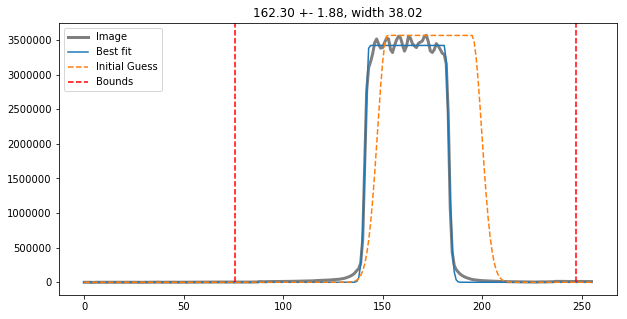

(array([[  2.011757 ,  17.190636 , -35.785744 , ...,  23.860672 ,
         24.731133 ,  33.680634 ],
       [ 54.23999  , -10.770226 ,  14.762344 , ...,  20.184189 ,
         36.358803 ,  19.894684 ],
       [ 45.71051  ,   1.3889885,   2.7886505, ...,  10.354103 ,
         13.793968 ,  49.070473 ],
       ...,
       [ 29.807358 ,  14.428383 ,  22.060272 , ...,  -7.6167297,
        -15.098    , -14.826195 ],
       [ 14.758984 ,  31.12767  ,  10.804634 , ...,  30.59423  ,
         13.626808 , -14.908226 ],
       [-19.948242 ,   5.658203 , -41.314087 , ...,  18.647102 ,
         16.842415 ,  -2.4668121]], dtype=float32), array([[0.98118528, 0.99323157, 1.00366311, ..., 0.98204106, 0.9522191 ,
        0.97554738],
       [0.97276955, 0.98545687, 1.00024228, ..., 0.99504684, 0.98786921,
        0.98946573],
       [1.01984942, 1.02008576, 0.99551588, ..., 0.97861723, 0.98087129,
        0.98033262],
       ...,
       [0.95235794, 0.96168618, 1.00095344, ..., 0.98480437, 0.99359909,
   

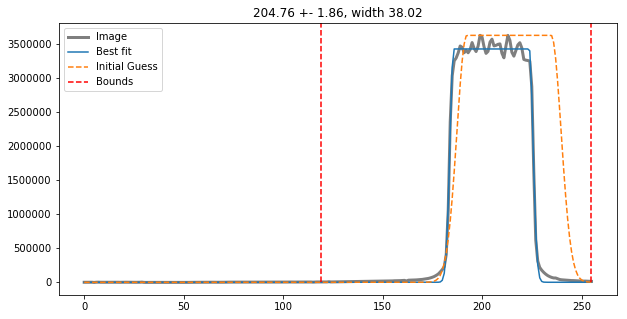

(array([[ 54.84721  , -17.960997 , -13.868986 , ...,  -6.244053 ,
          3.8059921,  42.398098 ],
       [ 41.64089  ,  49.87917  ,  16.174305 , ...,  19.390446 ,
         -9.064518 ,  34.25234  ],
       [ -9.844578 ,  43.874928 ,  43.334843 , ...,  25.802586 ,
          3.9345665,  14.41893  ],
       ...,
       [ -8.732151 ,  17.666027 ,  12.916229 , ...,   6.69923  ,
         33.76147  ,  70.77008  ],
       [-13.293072 ,  22.271679 ,  16.920254 , ...,  -8.034016 ,
         29.45641  , -14.33979  ],
       [ -7.73378  ,  14.37933  , -33.405304 , ...,  19.982563 ,
         39.80559  ,  26.867695 ]], dtype=float32), array([[1.01551701, 0.9995939 , 1.0131288 , ..., 0.99402601, 0.99839718,
        1.0051168 ],
       [0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       ...,
       [0.99049433, 0.98990652, 1.01802076, ..., 0.98726069, 0.99180205,
   

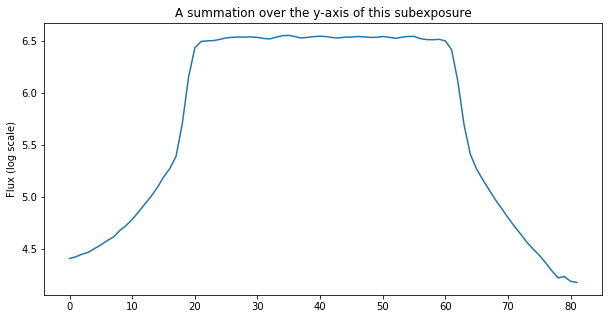

The difference between the two edges (for a 5-pixel bin for all subexps is): 1544.0856770833334
This value may not be larger than  4420.924790131585  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Using flux for variance estimate
Extracting spectrum with optimal extraction...
1254236.4655330947 pl 1254236.4655330947 41.036633
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


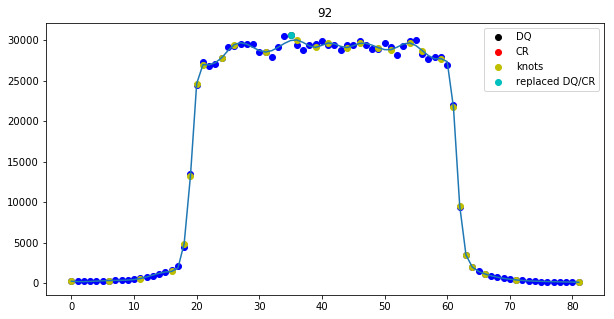

1281292.903433921 pl 1281292.903433921 40.805748
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


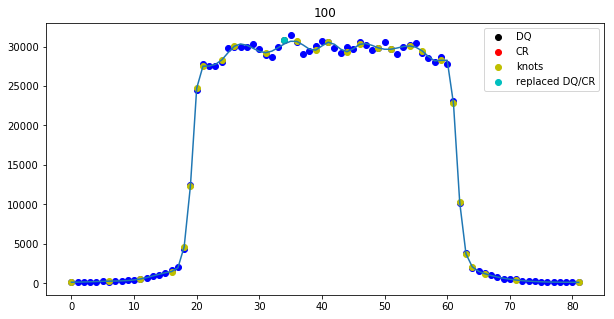

1275677.6177032564 pl 1275677.6177032564 41.220654
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


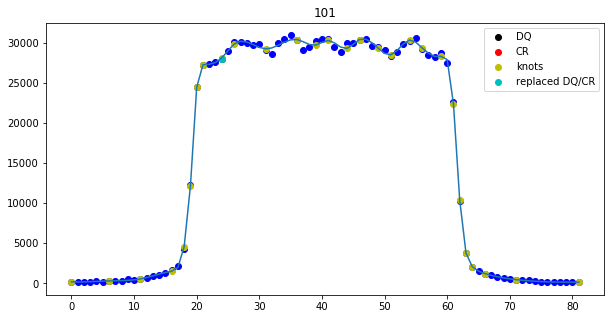

Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 2
nr. of CRs 1161
Spectrum located at pixel 124 in spatial direction
subexp 119.86226763632412 [204, 162, 120, 78]
ypix is 120 for exposure 1


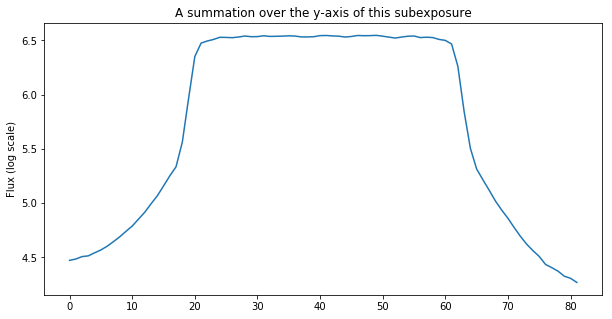

The difference between the two edges (for a 5-pixel bin for all subexps is): 1593.2059895833333
This value may not be larger than  4435.306107436855  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1267416.4477289417 pl 1267416.4477289417 41.828022
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


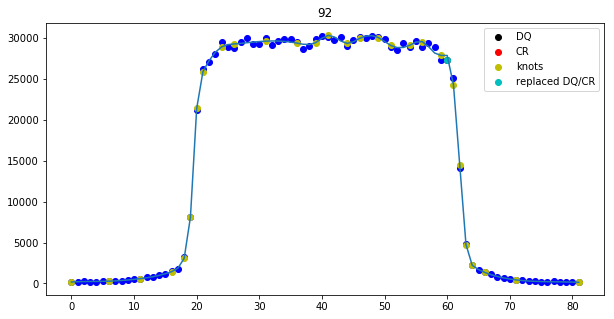

1291360.5291451844 pl 1291360.5291451844 41.416126
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


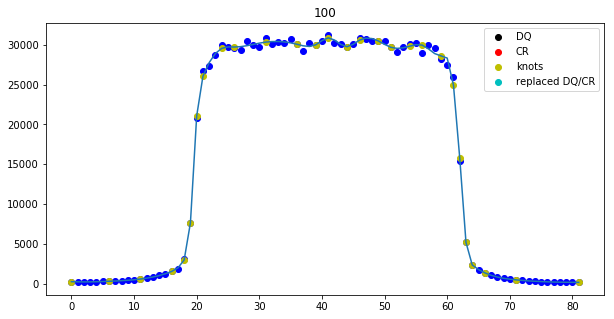

1284658.8820739128 pl 1284658.8820739128 41.65249
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


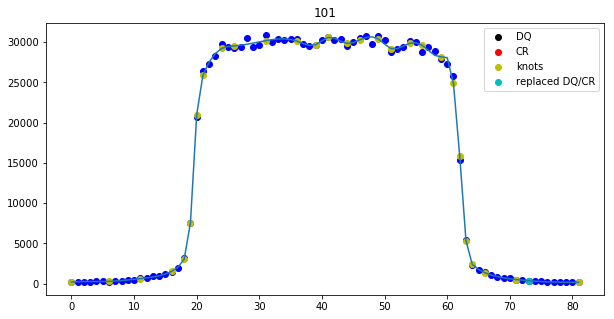

191 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 3
nr. of CRs 1172
Spectrum located at pixel 124 in spatial direction
subexp 162.29871864235056 [204, 162, 120, 78]
ypix is 162 for exposure 2


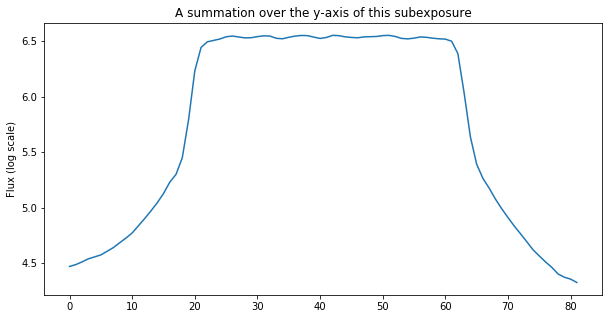

The difference between the two edges (for a 5-pixel bin for all subexps is): 1263.91875
This value may not be larger than  4457.488201517383  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1285114.7326499654 pl 1285114.7326499654 40.984535
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


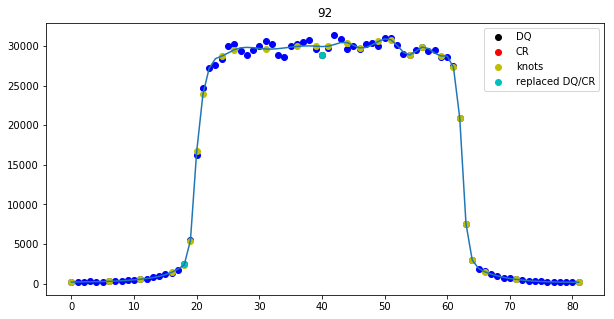

1305108.3095635774 pl 1305108.3095635774 41.28159
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


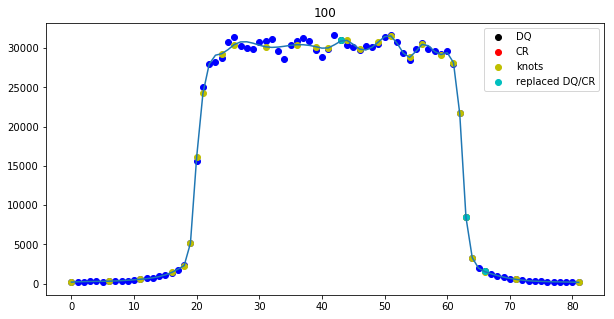

1294356.5262947616 pl 1294356.5262947616 41.39586
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


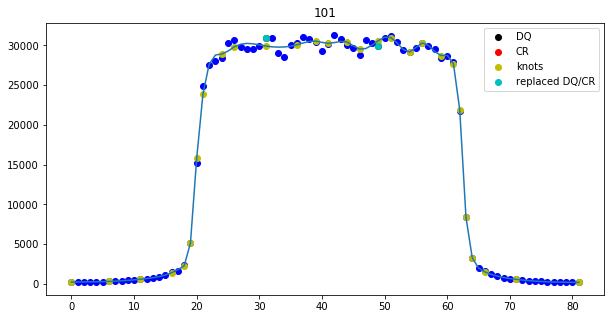

195 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 6, 7]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 4
nr. of CRs 1157
Spectrum located at pixel 124 in spatial direction
subexp 204.75546982652168 [204, 162, 120, 78]
ypix is 204 for exposure 3


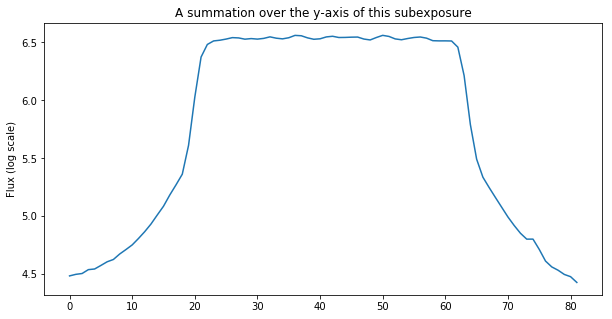

The difference between the two edges (for a 5-pixel bin for all subexps is): 624.5776041666667
This value may not be larger than  4459.756884255762  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1293000.8394335462 pl 1293000.8394335462 40.184113
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


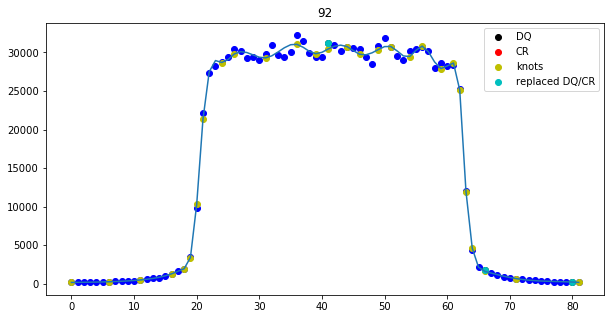

1306330.0140208474 pl 1306330.0140208474 40.60088
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


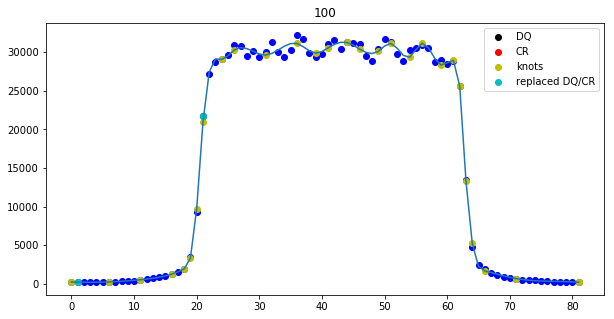

1299903.8426937298 pl 1299903.8426937298 40.237564
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


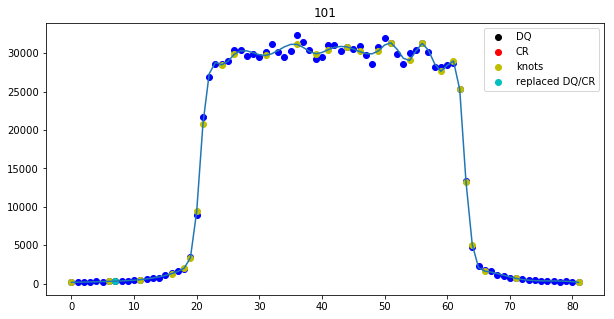

197 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 4]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Applied an xshift of 0.00931229418459 pix compared to reference (reduced) spectrum ie9301bhq
Shifted subexposure nr. 0 with -1.07380144846 pixels and shrunk 0.660846176186 percent.
Shifted subexposure nr. 1 with -0.747795682645 pixels and shrunk 0.448336330038 percent.
Shifted subexposure nr. 2 with -0.396629413453 pixels and shrunk 0.230936709491 percent.
Saving spectrum to /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/ie9301brq_spec.txt
Extraction took 2.59s
########################################
###########Finished Extraction##########
########################################
ie9301brq
########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v

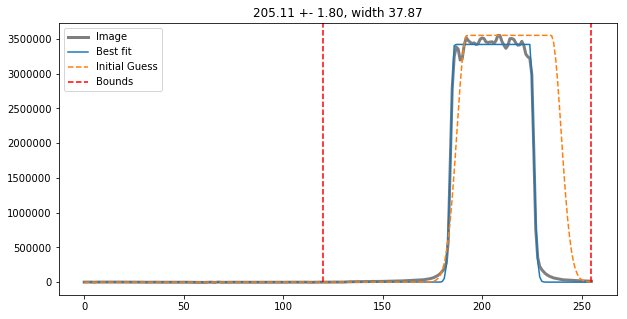

(array([[ -8.265778 ,  28.693756 ,  -9.1328125, ...,  20.24147  ,
        -23.507538 ,  26.742249 ],
       [  7.459503 ,  15.904144 ,  15.610367 , ...,  42.12407  ,
         27.020355 ,  15.25177  ],
       [  6.2394104,  30.12033  , -18.48462  , ..., -10.520416 ,
         13.3526   , -16.221817 ],
       ...,
       [-23.089493 ,   6.0793915,  27.330307 , ...,  46.059525 ,
         72.466835 ,   4.5834503],
       [ 42.24713  ,  25.776329 ,  32.374153 , ...,  -0.5881195,
         32.566055 ,  45.822403 ],
       [-17.97918  ,  11.271111 ,  12.999176 , ...,  47.46553  ,
         13.185509 ,  39.868866 ]], dtype=float32), array([[0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       [1.01465568, 1.01152106, 0.97465585, ..., 0.99614412, 0.99226877,
        0.99630135],
       ...,
       [0.99049433, 0.98990652, 1.01802076, ..., 0.98726069, 0.99180205,
   

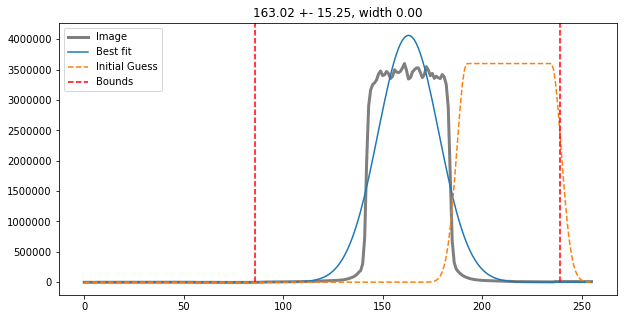

(array([[ 55.969364  ,  22.250858  ,  -8.325527  , ...,   3.060337  ,
         38.75487   ,  22.095036  ],
       [  6.4972878 ,  -6.857662  ,  19.831333  , ...,  13.071964  ,
         38.756443  ,  19.083233  ],
       [ 56.85648   ,  36.821934  ,  -4.0840263 , ..., -16.54768   ,
         -1.4398155 ,  -6.77734   ],
       ...,
       [  0.9038582 ,  12.938137  ,   7.5233955 , ...,   4.4668236 ,
         -0.24869919, -13.07729   ],
       [ 13.857937  ,  31.391659  , -18.334126  , ...,  58.281094  ,
        -50.58414   , -15.715214  ],
       [ -5.548008  ,   5.7048607 ,  -2.931553  , ...,  19.002834  ,
          1.9650459 ,  32.678432  ]], dtype=float32), array([[0.97797824, 1.01717404, 1.02369336, ..., 0.97947431, 0.99055837,
        0.97462096],
       [0.86756175, 1.00057105, 1.00078321, ..., 0.98511468, 0.98741866,
        0.97093693],
       [1.04421316, 1.00141875, 0.96262652, ..., 0.98749226, 1.01309426,
        0.9847939 ],
       ...,
       [0.98067773, 1.00647348, 0.980752

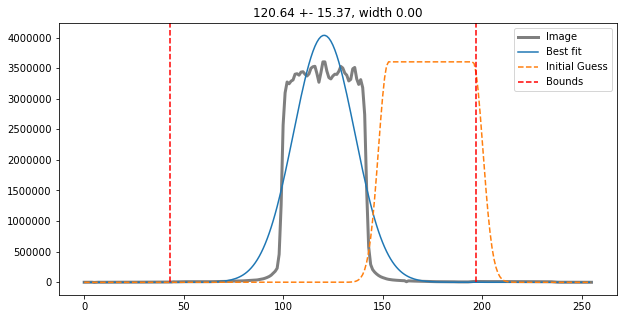

(array([[  0.320076  , -10.4307785 , -18.833504  , ...,   3.429428  ,
         43.3349    ,   4.2216644 ],
       [  4.1321335 ,   0.51688385,  21.997017  , ..., -42.98964   ,
          4.1039124 ,  42.81343   ],
       [ 16.395363  ,  57.457024  ,  18.517113  , ...,   0.685318  ,
        -43.00905   ,  -6.3146973 ],
       ...,
       [ 27.565193  ,   3.674343  ,  33.813164  , ...,   9.094372  ,
         27.972755  ,  -1.2172012 ],
       [ 16.77047   ,  -5.7103043 ,  23.150581  , ...,  23.090828  ,
         28.290611  ,  29.381508  ],
       [ 20.14904   , -15.823532  ,   5.7139664 , ...,  -3.824669  ,
         24.252937  ,  39.547287  ]], dtype=float32), array([[0.99152216, 0.98206137, 0.98798856, ..., 0.9900434 , 0.97864713,
        0.99251526],
       [1.0128799 , 0.96209698, 1.03174513, ..., 1.00765806, 0.99389191,
        0.98775042],
       [0.99974451, 0.98079478, 0.99440176, ..., 0.99625174, 0.9890361 ,
        0.95858532],
       ...,
       [1.03185068, 1.00088005, 0.989262

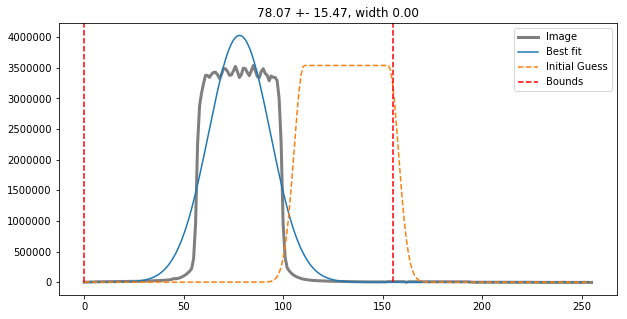

(array([[-25.465614  , -54.933956  ,  15.519634  , ...,   0.31240845,
        -20.325405  , -24.780327  ],
       [-14.686001  , -14.053608  ,   3.225193  , ...,  -9.262096  ,
        -21.857746  , -14.05254   ],
       [-21.448208  ,  12.685818  ,  20.43816   , ...,  -0.968071  ,
        -20.083107  , -16.418194  ],
       ...,
       [-40.314426  ,   1.4839439 ,   0.8743782 , ..., -24.46854   ,
        -17.532436  , -28.858303  ],
       [ 13.573589  ,   4.7437325 , -22.406326  , ...,  12.518955  ,
        -16.147064  ,  28.102673  ],
       [-38.89657   , -12.034382  ,   2.451191  , ..., -25.184223  ,
        -21.746052  ,  12.772022  ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.03028248, 1.00843969, 1.014272

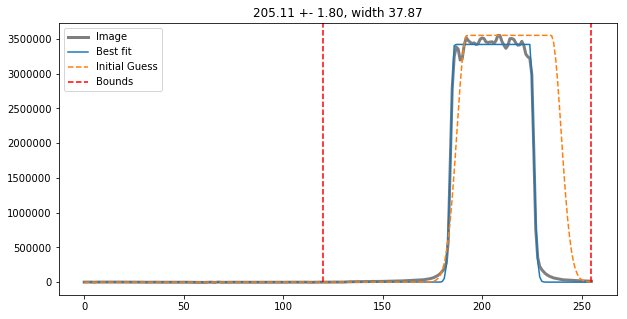

(array([[ -8.265778 ,  28.693756 ,  -9.1328125, ...,  20.24147  ,
        -23.507538 ,  26.742249 ],
       [  7.459503 ,  15.904144 ,  15.610367 , ...,  42.12407  ,
         27.020355 ,  15.25177  ],
       [  6.2394104,  30.12033  , -18.48462  , ..., -10.520416 ,
         13.3526   , -16.221817 ],
       ...,
       [-23.089493 ,   6.0793915,  27.330307 , ...,  46.059525 ,
         72.466835 ,   4.5834503],
       [ 42.24713  ,  25.776329 ,  32.374153 , ...,  -0.5881195,
         32.566055 ,  45.822403 ],
       [-17.97918  ,  11.271111 ,  12.999176 , ...,  47.46553  ,
         13.185509 ,  39.868866 ]], dtype=float32), array([[0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       [1.01465568, 1.01152106, 0.97465585, ..., 0.99614412, 0.99226877,
        0.99630135],
       ...,
       [0.99049433, 0.98990652, 1.01802076, ..., 0.98726069, 0.99180205,
   

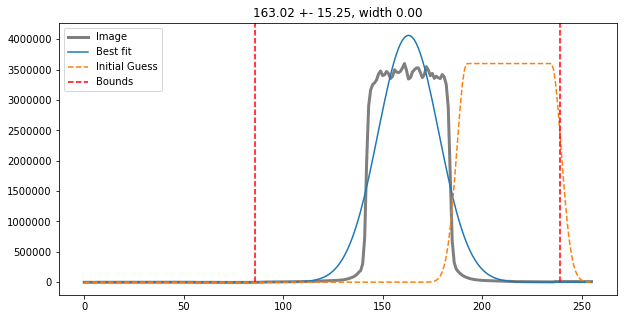

(array([[ 55.969364  ,  22.250858  ,  -8.325527  , ...,   3.060337  ,
         38.75487   ,  22.095036  ],
       [  6.4972878 ,  -6.857662  ,  19.831333  , ...,  13.071964  ,
         38.756443  ,  19.083233  ],
       [ 56.85648   ,  36.821934  ,  -4.0840263 , ..., -16.54768   ,
         -1.4398155 ,  -6.77734   ],
       ...,
       [  0.9038582 ,  12.938137  ,   7.5233955 , ...,   4.4668236 ,
         -0.24869919, -13.07729   ],
       [ 13.857937  ,  31.391659  , -18.334126  , ...,  58.281094  ,
        -50.58414   , -15.715214  ],
       [ -5.548008  ,   5.7048607 ,  -2.931553  , ...,  19.002834  ,
          1.9650459 ,  32.678432  ]], dtype=float32), array([[0.97797824, 1.01717404, 1.02369336, ..., 0.97947431, 0.99055837,
        0.97462096],
       [0.86756175, 1.00057105, 1.00078321, ..., 0.98511468, 0.98741866,
        0.97093693],
       [1.04421316, 1.00141875, 0.96262652, ..., 0.98749226, 1.01309426,
        0.9847939 ],
       ...,
       [0.98067773, 1.00647348, 0.980752

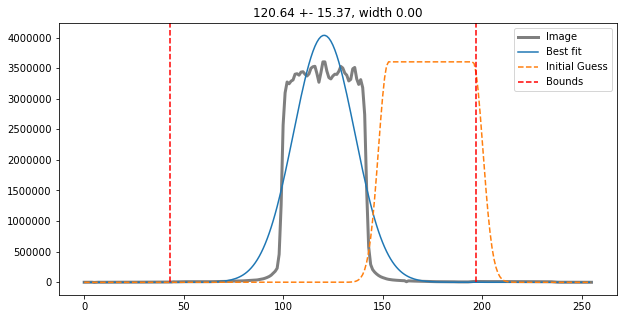

(array([[  0.320076  , -10.4307785 , -18.833504  , ...,   3.429428  ,
         43.3349    ,   4.2216644 ],
       [  4.1321335 ,   0.51688385,  21.997017  , ..., -42.98964   ,
          4.1039124 ,  42.81343   ],
       [ 16.395363  ,  57.457024  ,  18.517113  , ...,   0.685318  ,
        -43.00905   ,  -6.3146973 ],
       ...,
       [ 27.565193  ,   3.674343  ,  33.813164  , ...,   9.094372  ,
         27.972755  ,  -1.2172012 ],
       [ 16.77047   ,  -5.7103043 ,  23.150581  , ...,  23.090828  ,
         28.290611  ,  29.381508  ],
       [ 20.14904   , -15.823532  ,   5.7139664 , ...,  -3.824669  ,
         24.252937  ,  39.547287  ]], dtype=float32), array([[0.99152216, 0.98206137, 0.98798856, ..., 0.9900434 , 0.97864713,
        0.99251526],
       [1.0128799 , 0.96209698, 1.03174513, ..., 1.00765806, 0.99389191,
        0.98775042],
       [0.99974451, 0.98079478, 0.99440176, ..., 0.99625174, 0.9890361 ,
        0.95858532],
       ...,
       [1.03185068, 1.00088005, 0.989262

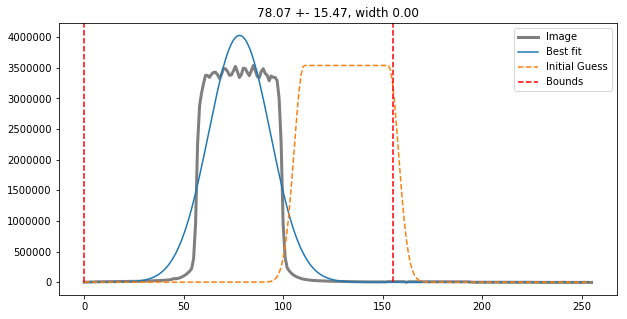

(array([[-25.465614  , -54.933956  ,  15.519634  , ...,   0.31240845,
        -20.325405  , -24.780327  ],
       [-14.686001  , -14.053608  ,   3.225193  , ...,  -9.262096  ,
        -21.857746  , -14.05254   ],
       [-21.448208  ,  12.685818  ,  20.43816   , ...,  -0.968071  ,
        -20.083107  , -16.418194  ],
       ...,
       [-40.314426  ,   1.4839439 ,   0.8743782 , ..., -24.46854   ,
        -17.532436  , -28.858303  ],
       [ 13.573589  ,   4.7437325 , -22.406326  , ...,  12.518955  ,
        -16.147064  ,  28.102673  ],
       [-38.89657   , -12.034382  ,   2.451191  , ..., -25.184223  ,
        -21.746052  ,  12.772022  ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.03028248, 1.00843969, 1.014272

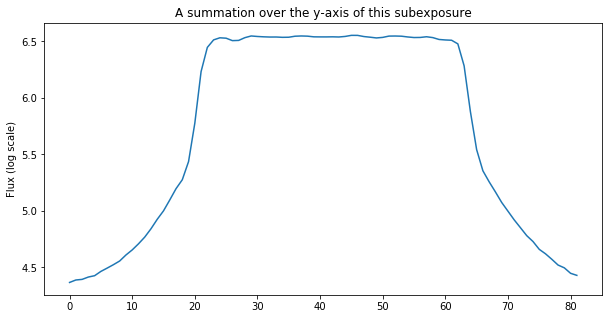

The difference between the two edges (for a 5-pixel bin for all subexps is): 635.3697916666666
This value may not be larger than  4439.120873926879  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Using flux for variance estimate
Extracting spectrum with optimal extraction...
1282536.2730084246 pl 1282536.2730084246 40.992386
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


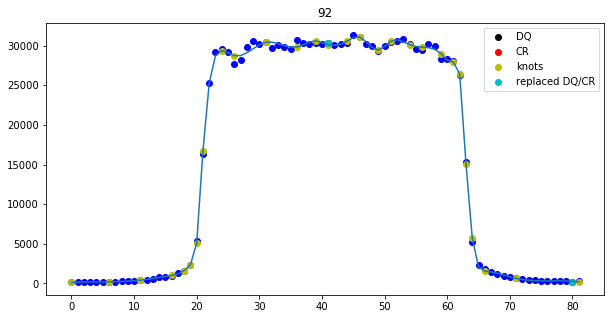

1293458.0915505798 pl 1293458.0915505798 41.051907
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


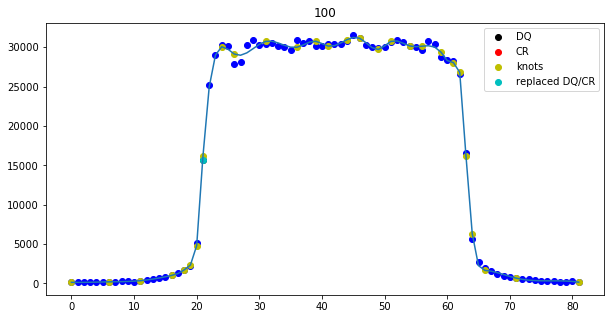

1288766.9943914067 pl 1288766.9943914067 41.276077
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


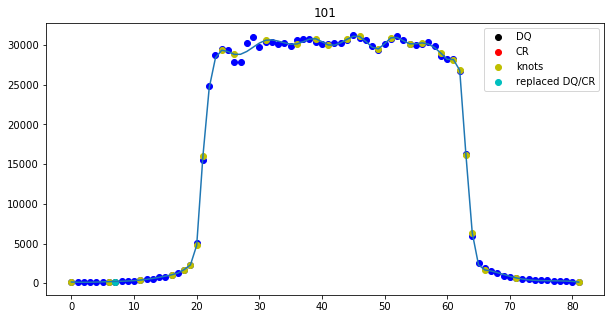

198 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 2
nr. of CRs 1172
Spectrum located at pixel 124 in spatial direction
subexp 163.01680531117987 [204, 162, 120, 78]
ypix is 162 for exposure 1


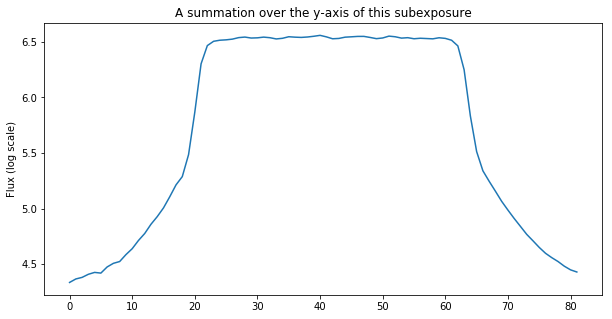

The difference between the two edges (for a 5-pixel bin for all subexps is): 861.4703125
This value may not be larger than  4439.726598188977  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1273047.7464506698 pl 1273047.7464506698 40.58351
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


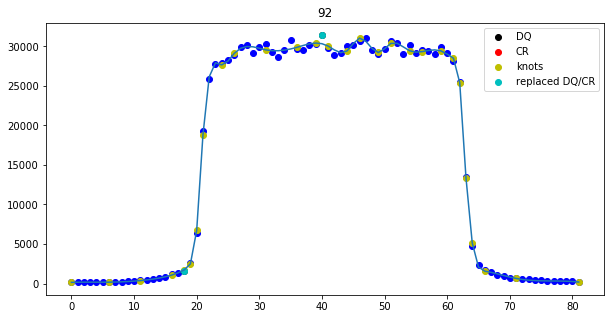

1293908.9324421803 pl 1293908.9324421803 40.947083
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


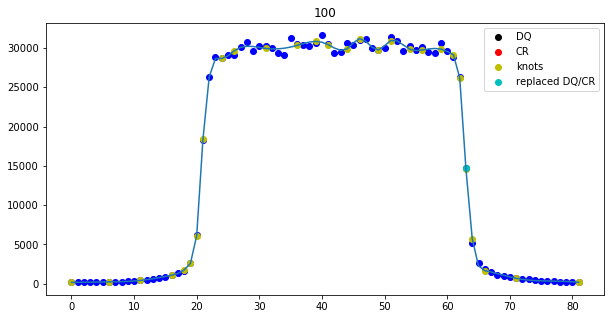

1286216.4853567928 pl 1286216.4853567928 40.527992
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


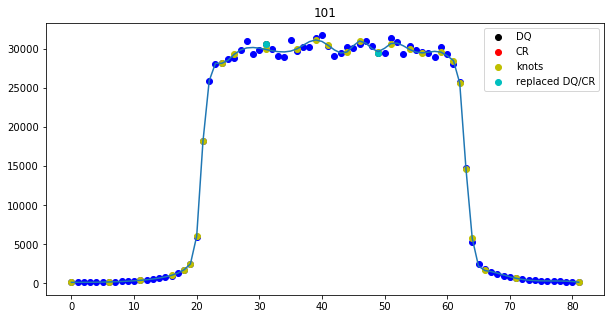

193 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 3
nr. of CRs 1141
Spectrum located at pixel 124 in spatial direction
subexp 120.63564804835501 [204, 162, 120, 78]
ypix is 120 for exposure 2


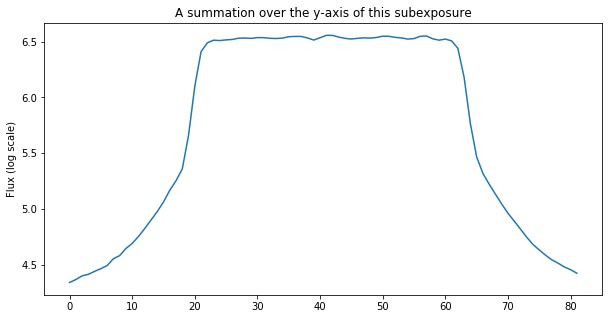

The difference between the two edges (for a 5-pixel bin for all subexps is): 881.3380208333333
This value may not be larger than  4440.69303900491  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1268008.9767773103 pl 1268008.9767773103 40.74436
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


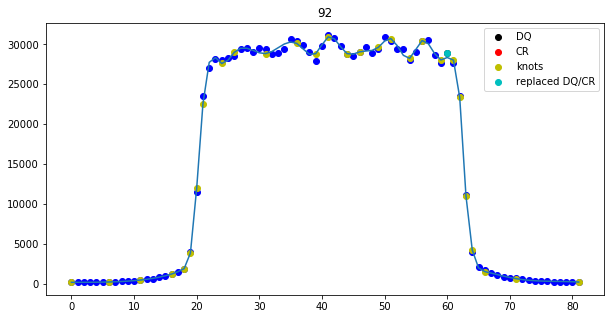

1295530.7977739545 pl 1295530.7977739545 40.702087
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


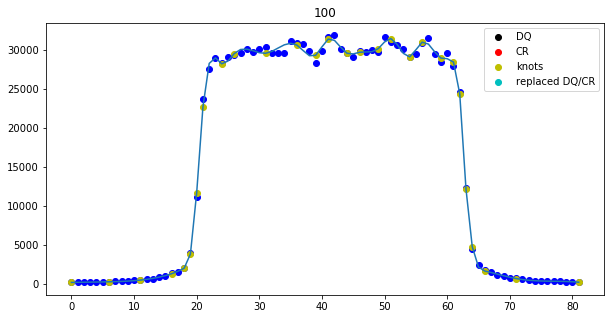

1286707.4742755406 pl 1286707.4742755406 40.615562
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


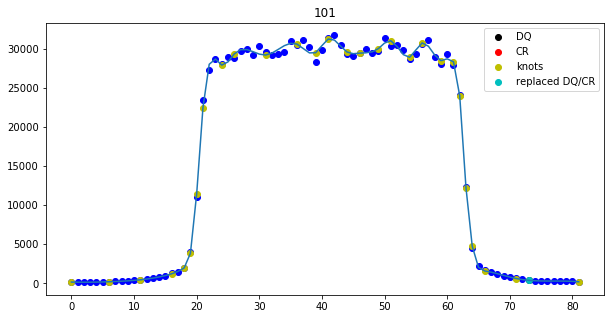

191 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 4
nr. of CRs 1161
Spectrum located at pixel 124 in spatial direction
subexp 78.07346107978806 [204, 162, 120, 78]
ypix is 78 for exposure 3


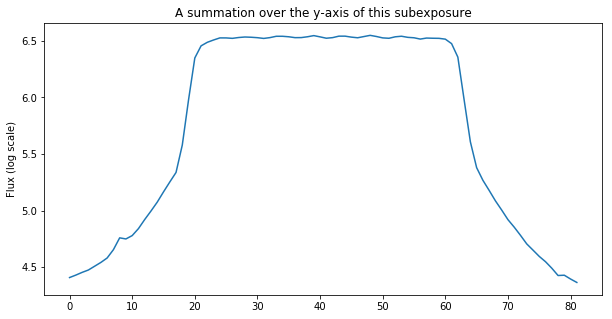

The difference between the two edges (for a 5-pixel bin for all subexps is): 499.0755208333333
This value may not be larger than  4439.619202889666  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1265189.066376907 pl 1265189.066376907 41.59495
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


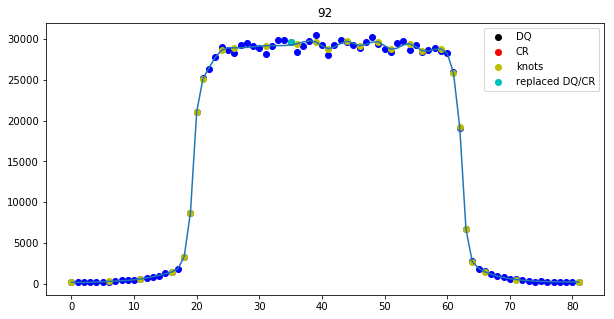

1290234.1311523071 pl 1290234.1311523071 41.499775
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


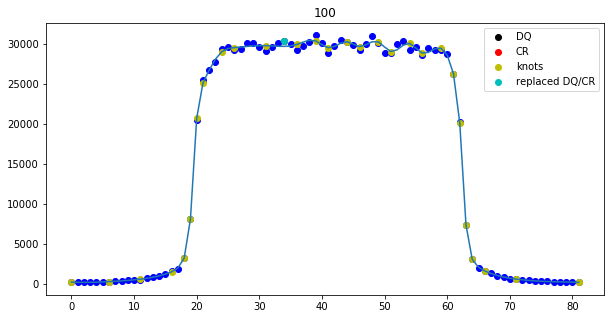

1284244.7423346858 pl 1284244.7423346858 41.572712
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


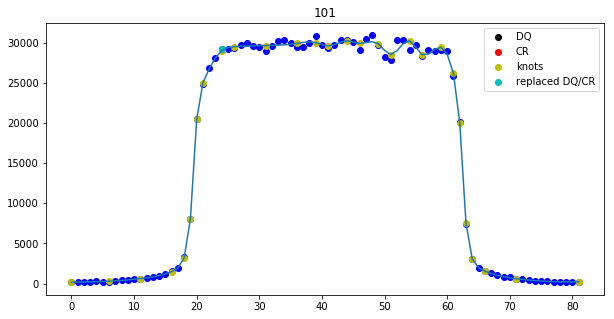

Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Applied an xshift of 0.0144519596505 pix compared to reference (reduced) spectrum ie9301bhq
Shifted subexposure nr. 1 with -0.387258719388 pixels and shrunk 0.22577654413 percent.
Shifted subexposure nr. 2 with -0.776209536909 pixels and shrunk 0.446314175906 percent.
Shifted subexposure nr. 3 with -1.10743517617 pixels and shrunk 0.665301071228 percent.
Saving spectrum to /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/ie9301bsq_spec.txt
Extraction took 2.57s
########################################
###########Finished Extraction##########
########################################
ie9301bsq
########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/s.baratuva.nl/Desktop/PhD/hst_data_

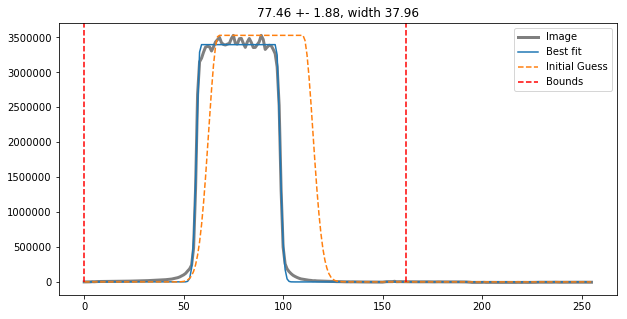

(array([[ 12.293762 ,  30.658714 , -30.76841  , ...,  -1.7174988,
        -23.660362 ,  11.665932 ],
       [ -8.780495 , -34.303795 , -19.506187 , ...,  13.004272 ,
         -7.890358 , -27.13842  ],
       [  5.666725 ,  28.529808 ,  20.472313 , ..., -40.67627  ,
         -5.741295 ,  -2.8887558],
       ...,
       [-10.150276 , -22.831215 , -38.58628  , ..., -13.874489 ,
         24.942375 , -49.473717 ],
       [-22.865395 ,   6.169243 , -10.835854 , ...,  39.80697  ,
        -22.56092  ,   5.508766 ],
       [ 38.86547  , -18.404823 , -37.769997 , ...,   7.5734787,
         18.9421   ,   9.709816 ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.01597487, 0.99097391, 1.00108907, ..., 1.0139594 , 0.99567206,
   

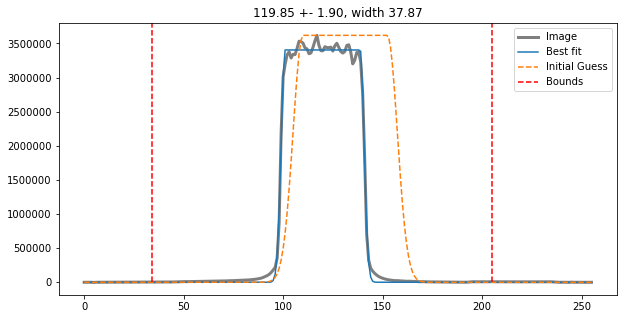

(array([[-18.579502  , -50.334217  , -35.512127  , ..., -29.987194  ,
        -17.753292  ,  18.02612   ],
       [ 41.547848  , -21.785046  , -29.055378  , ...,  -9.470898  ,
          5.978077  ,  -7.6180077 ],
       [  0.75693893, -12.262035  , -18.165653  , ...,   9.510761  ,
        -16.1273    ,  31.633656  ],
       ...,
       [-10.325153  ,   2.1472054 ,   3.8005981 , ...,   7.2547874 ,
         15.964062  ,  34.006817  ],
       [ -7.3508263 ,  18.673092  ,  33.723186  , ..., -25.313831  ,
        -36.707447  ,   4.0169945 ],
       [ 70.944214  ,  66.75574   , -23.782001  , ..., -26.431889  ,
         19.947063  , -40.95728   ]], dtype=float32), array([[1.00005887, 0.99631715, 1.01913849, ..., 1.01117496, 0.9857711 ,
        1.00169883],
       [1.0077967 , 1.00066505, 0.99113703, ..., 0.97842318, 0.98744521,
        0.98047949],
       [0.98492686, 0.9683537 , 0.97322563, ..., 0.98656412, 1.01614636,
        0.99626665],
       ...,
       [0.99159165, 0.96546904, 0.939439

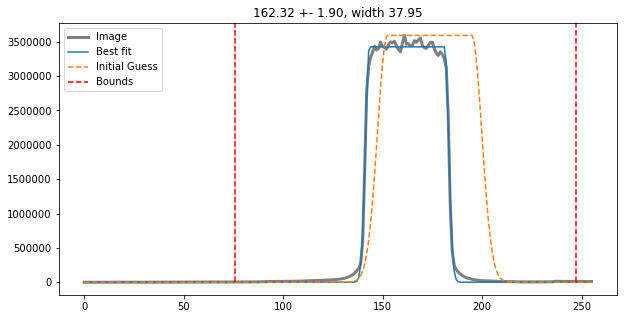

(array([[  9.681999 ,   6.0961   ,  -4.659172 , ...,   1.1071472,
          6.654705 ,   6.250759 ],
       [ 29.073593 ,  10.973171 ,   1.3331146, ...,  13.800678 ,
         13.605709 ,  -9.875015 ],
       [  1.7781715,  48.934006 ,  26.87957  , ..., -12.399658 ,
         26.118683 ,  28.655182 ],
       ...,
       [ 25.757019 ,  12.719402 ,   8.645699 , ...,  11.88163  ,
         11.472153 , -14.189049 ],
       [  1.3449211,   8.349499 ,  51.235855 , ...,   5.2992096,
         37.839333 ,  14.019463 ],
       [-35.703842 ,  20.337685 ,  17.848    , ...,  21.641876 ,
          0.977417 ,  40.60637  ]], dtype=float32), array([[0.98118528, 0.99323157, 1.00366311, ..., 0.98204106, 0.9522191 ,
        0.97554738],
       [0.97276955, 0.98545687, 1.00024228, ..., 0.99504684, 0.98786921,
        0.98946573],
       [1.01984942, 1.02008576, 0.99551588, ..., 0.97861723, 0.98087129,
        0.98033262],
       ...,
       [0.95235794, 0.96168618, 1.00095344, ..., 0.98480437, 0.99359909,
   

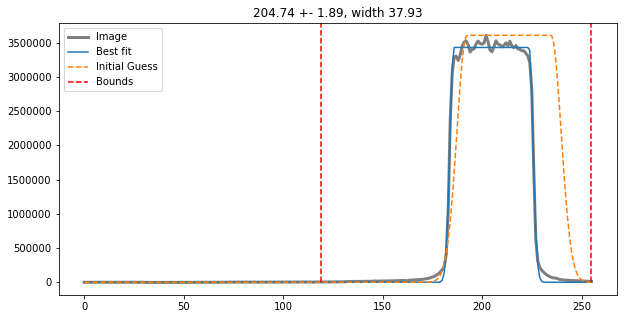

(array([[  6.6712456,  30.033165 ,  -8.096027 , ...,   1.8515663,
         -2.1300812, -14.986317 ],
       [ 28.649178 ,  39.234123 ,  38.36651  , ...,  27.48645  ,
         20.077705 ,  11.946053 ],
       [  5.311119 , -18.3737   ,  11.577919 , ...,  26.882065 ,
        -16.032253 , -38.2876   ],
       ...,
       [-38.08721  ,  14.06377  ,  -9.41515  , ...,  40.791008 ,
          4.1980324,  67.139656 ],
       [ 29.929169 ,  13.987663 ,   1.6128616, ...,   9.554916 ,
         16.39661  ,  26.824898 ],
       [  9.734547 ,  22.48304  ,  40.252266 , ...,  51.71591  ,
         52.67906  ,  13.8077545]], dtype=float32), array([[1.01551701, 0.9995939 , 1.0131288 , ..., 0.99402601, 0.99839718,
        1.0051168 ],
       [0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       ...,
       [0.99049433, 0.98990652, 1.01802076, ..., 0.98726069, 0.99180205,
   

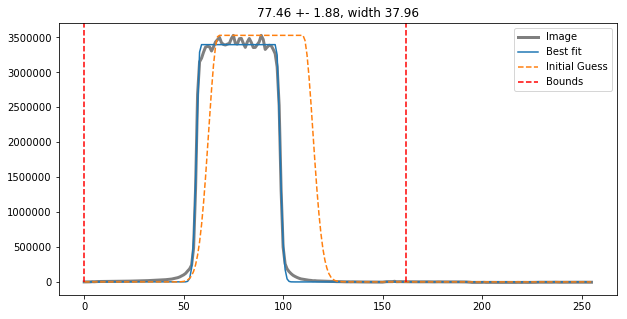

(array([[ 12.293762 ,  30.658714 , -30.76841  , ...,  -1.7174988,
        -23.660362 ,  11.665932 ],
       [ -8.780495 , -34.303795 , -19.506187 , ...,  13.004272 ,
         -7.890358 , -27.13842  ],
       [  5.666725 ,  28.529808 ,  20.472313 , ..., -40.67627  ,
         -5.741295 ,  -2.8887558],
       ...,
       [-10.150276 , -22.831215 , -38.58628  , ..., -13.874489 ,
         24.942375 , -49.473717 ],
       [-22.865395 ,   6.169243 , -10.835854 , ...,  39.80697  ,
        -22.56092  ,   5.508766 ],
       [ 38.86547  , -18.404823 , -37.769997 , ...,   7.5734787,
         18.9421   ,   9.709816 ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.01597487, 0.99097391, 1.00108907, ..., 1.0139594 , 0.99567206,
   

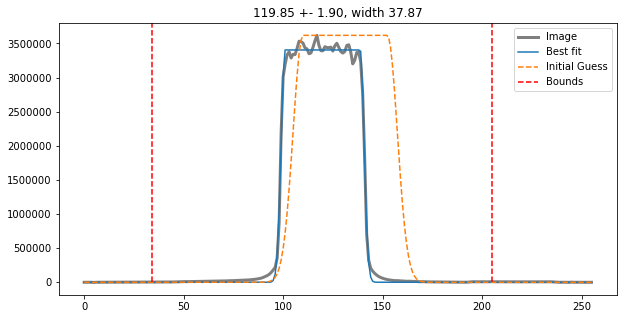

(array([[-18.579502  , -50.334217  , -35.512127  , ..., -29.987194  ,
        -17.753292  ,  18.02612   ],
       [ 41.547848  , -21.785046  , -29.055378  , ...,  -9.470898  ,
          5.978077  ,  -7.6180077 ],
       [  0.75693893, -12.262035  , -18.165653  , ...,   9.510761  ,
        -16.1273    ,  31.633656  ],
       ...,
       [-10.325153  ,   2.1472054 ,   3.8005981 , ...,   7.2547874 ,
         15.964062  ,  34.006817  ],
       [ -7.3508263 ,  18.673092  ,  33.723186  , ..., -25.313831  ,
        -36.707447  ,   4.0169945 ],
       [ 70.944214  ,  66.75574   , -23.782001  , ..., -26.431889  ,
         19.947063  , -40.95728   ]], dtype=float32), array([[1.00005887, 0.99631715, 1.01913849, ..., 1.01117496, 0.9857711 ,
        1.00169883],
       [1.0077967 , 1.00066505, 0.99113703, ..., 0.97842318, 0.98744521,
        0.98047949],
       [0.98492686, 0.9683537 , 0.97322563, ..., 0.98656412, 1.01614636,
        0.99626665],
       ...,
       [0.99159165, 0.96546904, 0.939439

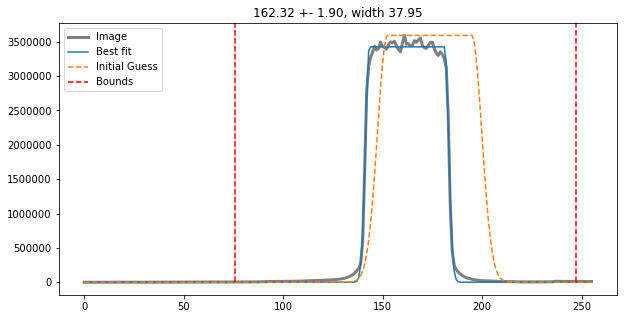

(array([[  9.681999 ,   6.0961   ,  -4.659172 , ...,   1.1071472,
          6.654705 ,   6.250759 ],
       [ 29.073593 ,  10.973171 ,   1.3331146, ...,  13.800678 ,
         13.605709 ,  -9.875015 ],
       [  1.7781715,  48.934006 ,  26.87957  , ..., -12.399658 ,
         26.118683 ,  28.655182 ],
       ...,
       [ 25.757019 ,  12.719402 ,   8.645699 , ...,  11.88163  ,
         11.472153 , -14.189049 ],
       [  1.3449211,   8.349499 ,  51.235855 , ...,   5.2992096,
         37.839333 ,  14.019463 ],
       [-35.703842 ,  20.337685 ,  17.848    , ...,  21.641876 ,
          0.977417 ,  40.60637  ]], dtype=float32), array([[0.98118528, 0.99323157, 1.00366311, ..., 0.98204106, 0.9522191 ,
        0.97554738],
       [0.97276955, 0.98545687, 1.00024228, ..., 0.99504684, 0.98786921,
        0.98946573],
       [1.01984942, 1.02008576, 0.99551588, ..., 0.97861723, 0.98087129,
        0.98033262],
       ...,
       [0.95235794, 0.96168618, 1.00095344, ..., 0.98480437, 0.99359909,
   

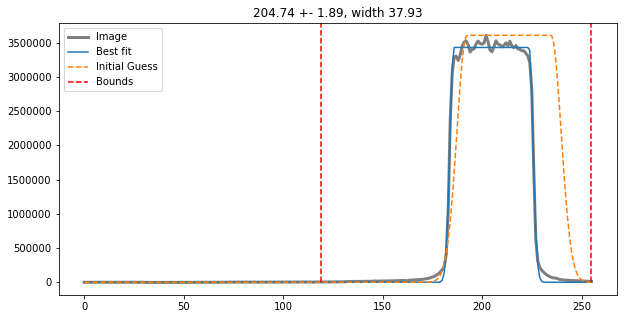

(array([[  6.6712456,  30.033165 ,  -8.096027 , ...,   1.8515663,
         -2.1300812, -14.986317 ],
       [ 28.649178 ,  39.234123 ,  38.36651  , ...,  27.48645  ,
         20.077705 ,  11.946053 ],
       [  5.311119 , -18.3737   ,  11.577919 , ...,  26.882065 ,
        -16.032253 , -38.2876   ],
       ...,
       [-38.08721  ,  14.06377  ,  -9.41515  , ...,  40.791008 ,
          4.1980324,  67.139656 ],
       [ 29.929169 ,  13.987663 ,   1.6128616, ...,   9.554916 ,
         16.39661  ,  26.824898 ],
       [  9.734547 ,  22.48304  ,  40.252266 , ...,  51.71591  ,
         52.67906  ,  13.8077545]], dtype=float32), array([[1.01551701, 0.9995939 , 1.0131288 , ..., 0.99402601, 0.99839718,
        1.0051168 ],
       [0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       ...,
       [0.99049433, 0.98990652, 1.01802076, ..., 0.98726069, 0.99180205,
   

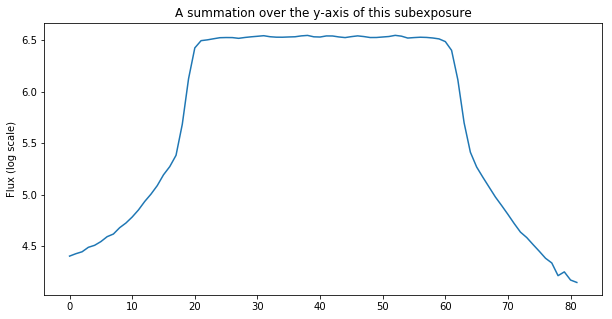

The difference between the two edges (for a 5-pixel bin for all subexps is): 1682.288671875
This value may not be larger than  4422.169844469266  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Using flux for variance estimate
Extracting spectrum with optimal extraction...
1253865.7001973395 pl 1253865.7001973395 41.34188
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


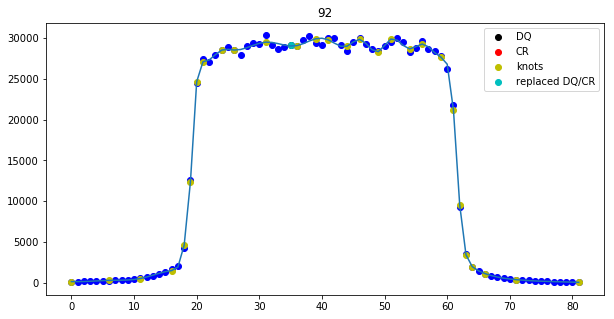

1283427.209334848 pl 1283427.209334848 41.155228
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


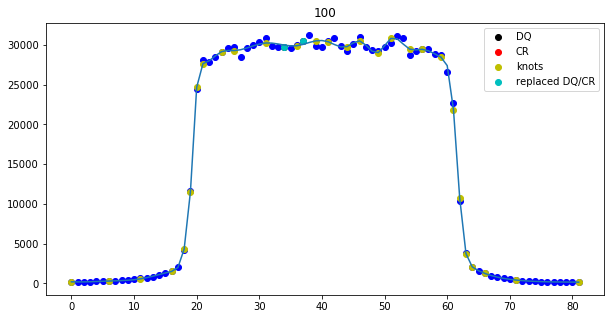

1272890.2399761071 pl 1272890.2399761071 41.140766
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


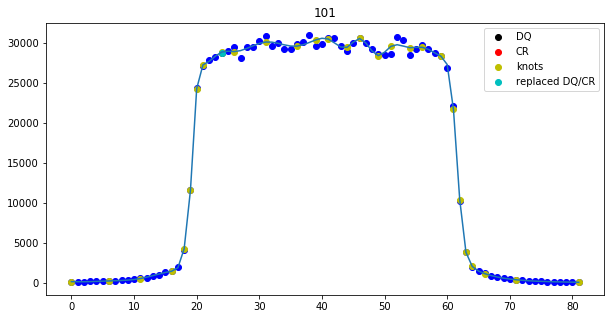

Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 2
nr. of CRs 1202
Spectrum located at pixel 124 in spatial direction
subexp 119.85357260739563 [204, 162, 120, 78]
ypix is 120 for exposure 1


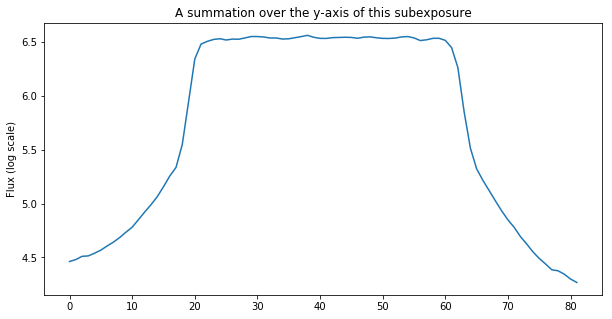

The difference between the two edges (for a 5-pixel bin for all subexps is): 1555.5393229166666
This value may not be larger than  4436.887557736842  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1266730.297271796 pl 1266730.297271796 40.65485
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


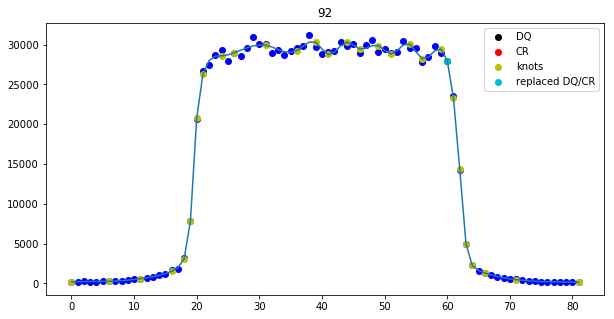

1294363.7090680602 pl 1294363.7090680602 40.51161
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


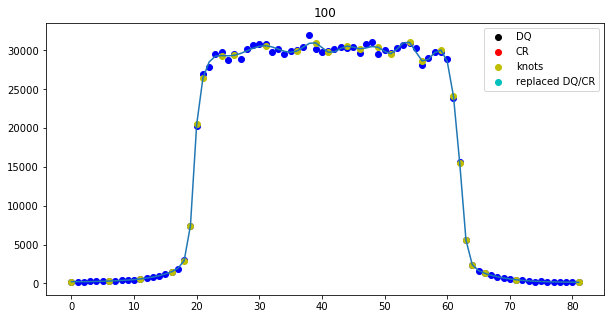

1285460.1803497395 pl 1285460.1803497395 40.364502
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


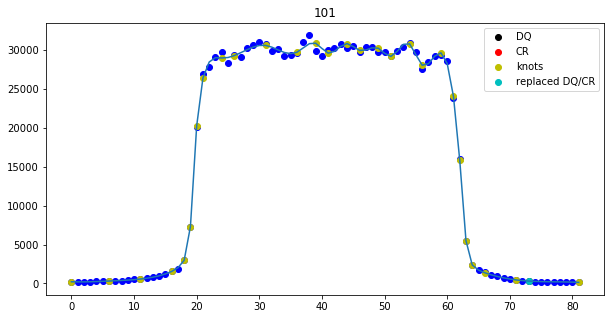

188 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 3
nr. of CRs 1171
Spectrum located at pixel 124 in spatial direction
subexp 162.31671545658926 [204, 162, 120, 78]
ypix is 162 for exposure 2


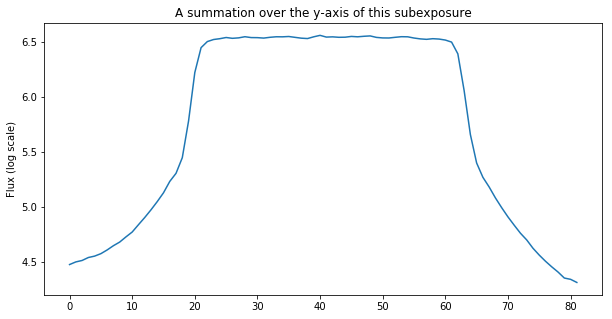

The difference between the two edges (for a 5-pixel bin for all subexps is): 1461.52421875
This value may not be larger than  4458.535245272076  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1285181.4429452294 pl 1285181.4429452294 41.11622
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


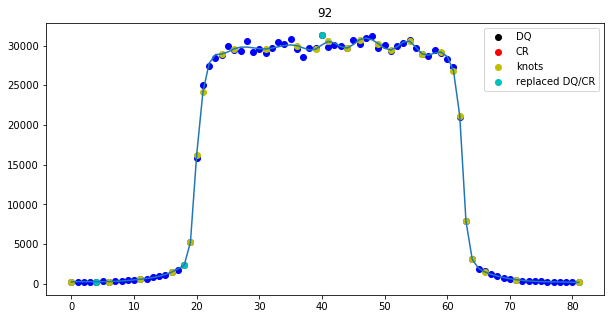

1304893.2957778177 pl 1304893.2957778177 41.119873
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


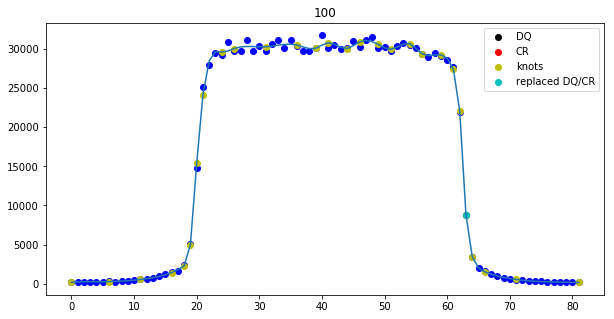

1297750.1957114092 pl 1297750.1957114092 40.604748
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


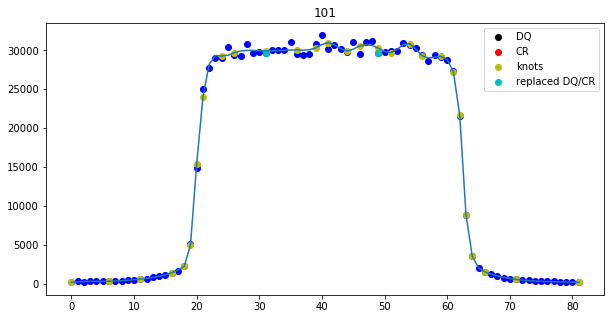

194 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 3, 4, 6]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 4
nr. of CRs 1173
Spectrum located at pixel 124 in spatial direction
subexp 204.7393194603407 [204, 162, 120, 78]
ypix is 204 for exposure 3


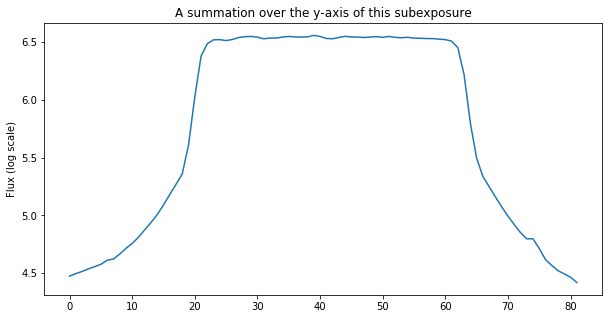

The difference between the two edges (for a 5-pixel bin for all subexps is): 674.8296875
This value may not be larger than  4461.357162717791  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1297334.204434939 pl 1297334.204434939 40.908558
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


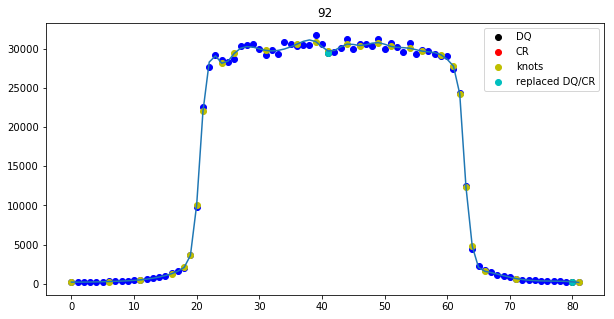

1307444.113080223 pl 1307444.113080223 41.027008
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


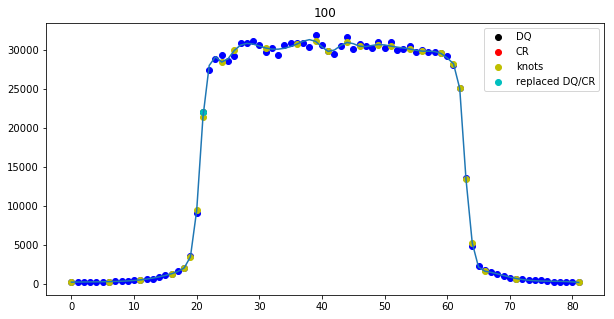

1302327.0454507743 pl 1302327.0454507743 41.006165
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


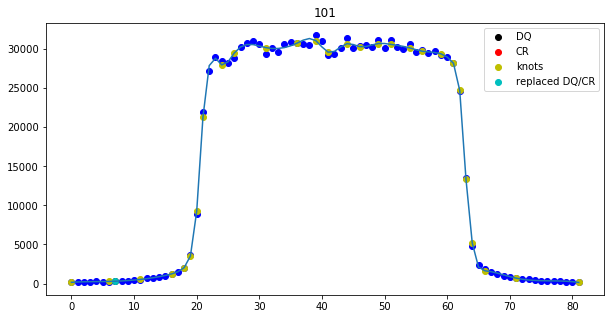

198 successes out of 200 total fits
Optimal extraction fitting failed for columns: [4]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Applied an xshift of 0.0210595999398 pix compared to reference (reduced) spectrum ie9301bhq
Shifted subexposure nr. 0 with -1.08530904793 pixels and shrunk 0.666282763171 percent.
Shifted subexposure nr. 1 with -0.736264944014 pixels and shrunk 0.444862884061 percent.
Shifted subexposure nr. 2 with -0.363853488067 pixels and shrunk 0.226249347813 percent.
Saving spectrum to /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/ie9301btq_spec.txt
Extraction took 2.61s
########################################
###########Finished Extraction##########
########################################
ie9301btq
########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298

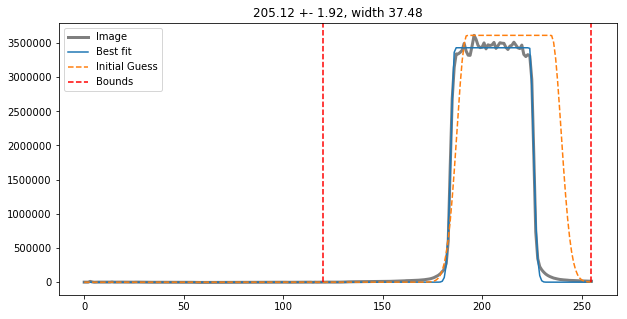

(array([[ 2.6925850e+01,  2.6359108e+01,  4.9503555e+00, ...,
         4.5968758e+01,  4.1972389e+01, -1.0666496e+01],
       [ 1.2161140e+01,  8.8790054e+00, -1.9560844e+01, ...,
         7.0537033e+00,  1.3038559e+00,  1.9934807e+01],
       [-1.4858177e+01, -3.5912323e-01,  2.6087105e+01, ...,
         3.1575996e+01,  4.0040970e+00,  1.4181465e+01],
       ...,
       [ 2.6696854e+00,  1.3109688e+01,  1.0948936e+01, ...,
         5.3152321e+01, -1.0025017e+01,  3.7609749e+01],
       [ 1.1820351e+01,  3.0754089e-02,  3.2381042e+01, ...,
         5.3654030e+01,  4.2015495e+01,  3.1697594e+01],
       [-6.2672195e+00,  3.4688225e+01, -3.3815849e+01, ...,
         2.1553825e+01,  6.0355331e+01,  6.8846817e+00]], dtype=float32), array([[0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       [1.01465568, 1.01152106, 0.97465585, ..., 0.99614412, 0.99226877,
 

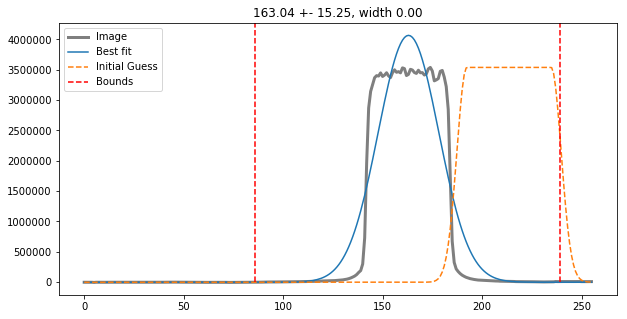

(array([[  4.9019623 ,  11.053604  ,  15.658524  , ...,  31.648712  ,
          8.883759  , -19.467773  ],
       [ 14.063522  ,  26.509125  ,  34.433334  , ...,  11.26239   ,
         18.238007  ,  -1.4350586 ],
       [ 52.697876  ,  -0.17234802,  62.119003  , ...,  28.410065  ,
         17.794586  ,  19.473068  ],
       ...,
       [-19.63733   ,  15.808624  , -22.381989  , ...,  19.145493  ,
          9.716049  , -40.83281   ],
       [ 35.456367  ,  22.555908  ,   3.265419  , ...,  35.24044   ,
         11.245956  ,  39.042778  ],
       [  6.686943  ,  22.620735  ,  16.326187  , ...,  -6.395859  ,
          9.572273  , -13.936623  ]], dtype=float32), array([[0.97797824, 1.01717404, 1.02369336, ..., 0.97947431, 0.99055837,
        0.97462096],
       [0.86756175, 1.00057105, 1.00078321, ..., 0.98511468, 0.98741866,
        0.97093693],
       [1.04421316, 1.00141875, 0.96262652, ..., 0.98749226, 1.01309426,
        0.9847939 ],
       ...,
       [0.98067773, 1.00647348, 0.980752

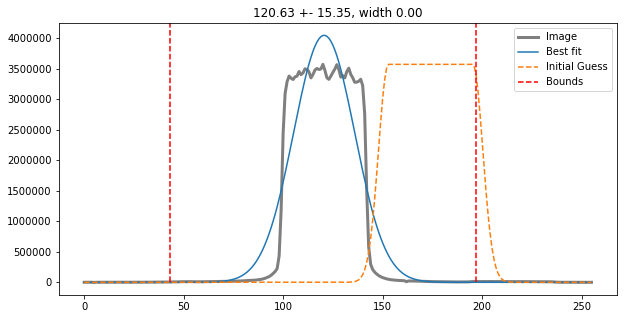

(array([[  1.7862167 ,  -4.274391  ,  -5.640465  , ...,  32.951187  ,
         26.087753  ,  26.728378  ],
       [ 24.360771  ,  -0.36293793, -23.445473  , ...,   7.5794296 ,
         40.64113   ,  34.920494  ],
       [ 34.27903   ,  49.541893  ,   8.256645  , ..., -14.222916  ,
         12.236183  ,  32.56288   ],
       ...,
       [  3.2742767 ,  21.525864  ,  18.888931  , ..., -15.364777  ,
         15.300949  ,  33.262894  ],
       [  6.5280113 ,  14.481422  , -19.86871   , ...,  36.35264   ,
         22.691368  ,  66.21786   ],
       [-32.234497  , -16.701149  ,  42.294212  , ...,  40.086647  ,
          9.224205  ,  19.803688  ]], dtype=float32), array([[0.99152216, 0.98206137, 0.98798856, ..., 0.9900434 , 0.97864713,
        0.99251526],
       [1.0128799 , 0.96209698, 1.03174513, ..., 1.00765806, 0.99389191,
        0.98775042],
       [0.99974451, 0.98079478, 0.99440176, ..., 0.99625174, 0.9890361 ,
        0.95858532],
       ...,
       [1.03185068, 1.00088005, 0.989262

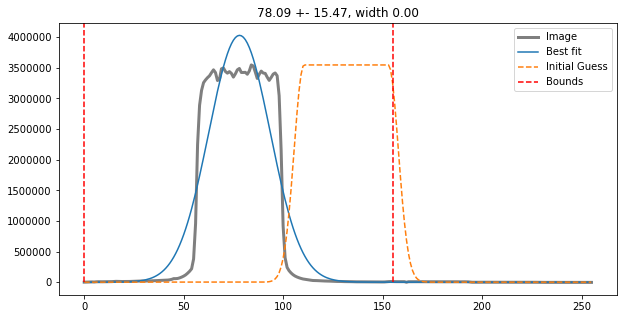

(array([[-22.87584   ,  -3.086563  , -17.074333  , ..., -34.52847   ,
        -15.410179  ,  -3.4964333 ],
       [ -7.405197  ,  -9.118637  ,   3.4687958 , ...,  -4.347679  ,
         -5.2497406 ,  21.26307   ],
       [  9.28875   ,  45.7679    ,   4.2633896 , ..., -14.761192  ,
         45.632904  , -25.535187  ],
       ...,
       [-42.41578   ,  -0.6175575 ,  -1.226471  , ..., -59.576492  ,
         -7.8465652 ,  18.549118  ],
       [ -7.257984  ,  12.007446  , -40.896202  , ...,  -6.085903  ,
          0.61148834,  -7.0048637 ],
       [  1.143486  , -23.500427  , -11.356728  , ...,  -1.352623  ,
         32.73433   , -12.904621  ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.03028248, 1.00843969, 1.014272

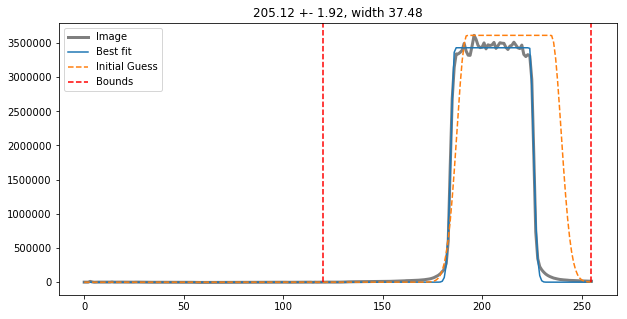

(array([[ 2.6925850e+01,  2.6359108e+01,  4.9503555e+00, ...,
         4.5968758e+01,  4.1972389e+01, -1.0666496e+01],
       [ 1.2161140e+01,  8.8790054e+00, -1.9560844e+01, ...,
         7.0537033e+00,  1.3038559e+00,  1.9934807e+01],
       [-1.4858177e+01, -3.5912323e-01,  2.6087105e+01, ...,
         3.1575996e+01,  4.0040970e+00,  1.4181465e+01],
       ...,
       [ 2.6696854e+00,  1.3109688e+01,  1.0948936e+01, ...,
         5.3152321e+01, -1.0025017e+01,  3.7609749e+01],
       [ 1.1820351e+01,  3.0754089e-02,  3.2381042e+01, ...,
         5.3654030e+01,  4.2015495e+01,  3.1697594e+01],
       [-6.2672195e+00,  3.4688225e+01, -3.3815849e+01, ...,
         2.1553825e+01,  6.0355331e+01,  6.8846817e+00]], dtype=float32), array([[0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       [1.01465568, 1.01152106, 0.97465585, ..., 0.99614412, 0.99226877,
 

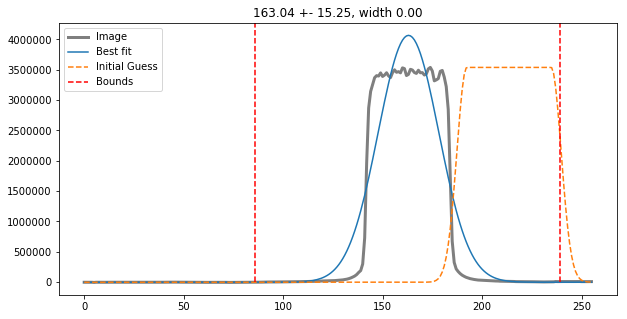

(array([[  4.9019623 ,  11.053604  ,  15.658524  , ...,  31.648712  ,
          8.883759  , -19.467773  ],
       [ 14.063522  ,  26.509125  ,  34.433334  , ...,  11.26239   ,
         18.238007  ,  -1.4350586 ],
       [ 52.697876  ,  -0.17234802,  62.119003  , ...,  28.410065  ,
         17.794586  ,  19.473068  ],
       ...,
       [-19.63733   ,  15.808624  , -22.381989  , ...,  19.145493  ,
          9.716049  , -40.83281   ],
       [ 35.456367  ,  22.555908  ,   3.265419  , ...,  35.24044   ,
         11.245956  ,  39.042778  ],
       [  6.686943  ,  22.620735  ,  16.326187  , ...,  -6.395859  ,
          9.572273  , -13.936623  ]], dtype=float32), array([[0.97797824, 1.01717404, 1.02369336, ..., 0.97947431, 0.99055837,
        0.97462096],
       [0.86756175, 1.00057105, 1.00078321, ..., 0.98511468, 0.98741866,
        0.97093693],
       [1.04421316, 1.00141875, 0.96262652, ..., 0.98749226, 1.01309426,
        0.9847939 ],
       ...,
       [0.98067773, 1.00647348, 0.980752

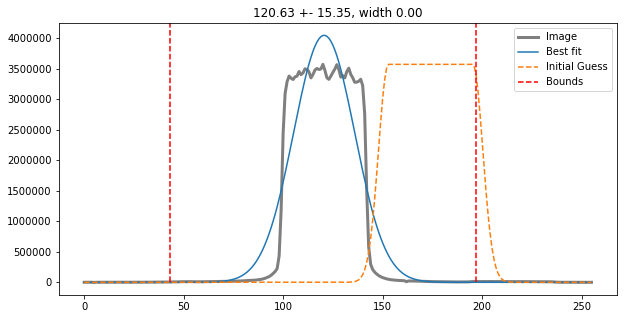

(array([[  1.7862167 ,  -4.274391  ,  -5.640465  , ...,  32.951187  ,
         26.087753  ,  26.728378  ],
       [ 24.360771  ,  -0.36293793, -23.445473  , ...,   7.5794296 ,
         40.64113   ,  34.920494  ],
       [ 34.27903   ,  49.541893  ,   8.256645  , ..., -14.222916  ,
         12.236183  ,  32.56288   ],
       ...,
       [  3.2742767 ,  21.525864  ,  18.888931  , ..., -15.364777  ,
         15.300949  ,  33.262894  ],
       [  6.5280113 ,  14.481422  , -19.86871   , ...,  36.35264   ,
         22.691368  ,  66.21786   ],
       [-32.234497  , -16.701149  ,  42.294212  , ...,  40.086647  ,
          9.224205  ,  19.803688  ]], dtype=float32), array([[0.99152216, 0.98206137, 0.98798856, ..., 0.9900434 , 0.97864713,
        0.99251526],
       [1.0128799 , 0.96209698, 1.03174513, ..., 1.00765806, 0.99389191,
        0.98775042],
       [0.99974451, 0.98079478, 0.99440176, ..., 0.99625174, 0.9890361 ,
        0.95858532],
       ...,
       [1.03185068, 1.00088005, 0.989262

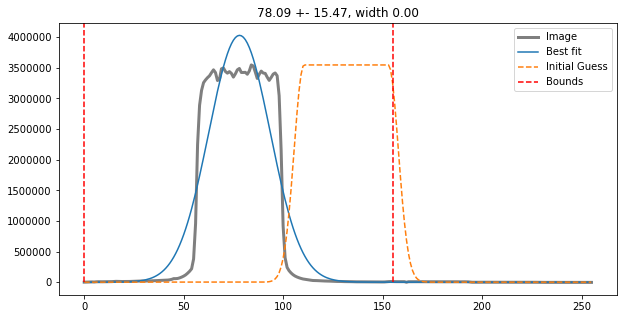

(array([[-22.87584   ,  -3.086563  , -17.074333  , ..., -34.52847   ,
        -15.410179  ,  -3.4964333 ],
       [ -7.405197  ,  -9.118637  ,   3.4687958 , ...,  -4.347679  ,
         -5.2497406 ,  21.26307   ],
       [  9.28875   ,  45.7679    ,   4.2633896 , ..., -14.761192  ,
         45.632904  , -25.535187  ],
       ...,
       [-42.41578   ,  -0.6175575 ,  -1.226471  , ..., -59.576492  ,
         -7.8465652 ,  18.549118  ],
       [ -7.257984  ,  12.007446  , -40.896202  , ...,  -6.085903  ,
          0.61148834,  -7.0048637 ],
       [  1.143486  , -23.500427  , -11.356728  , ...,  -1.352623  ,
         32.73433   , -12.904621  ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.03028248, 1.00843969, 1.014272

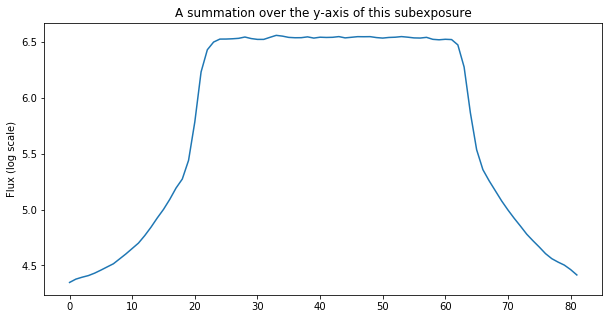

The difference between the two edges (for a 5-pixel bin for all subexps is): 902.4627604166667
This value may not be larger than  4440.193629411522  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Using flux for variance estimate
Extracting spectrum with optimal extraction...
1282611.9621116202 pl 1282611.9621116202 40.93126
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


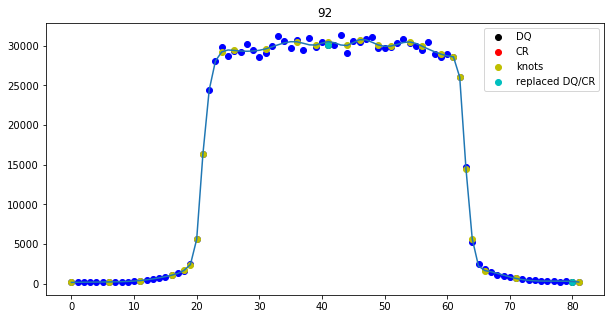

1295050.1403114889 pl 1295050.1403114889 40.618347
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


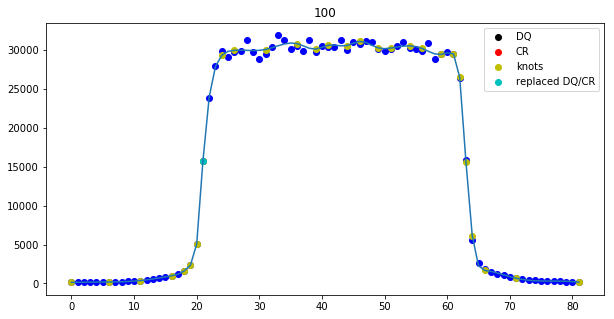

1289535.4442582254 pl 1289535.4442582254 40.059967
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


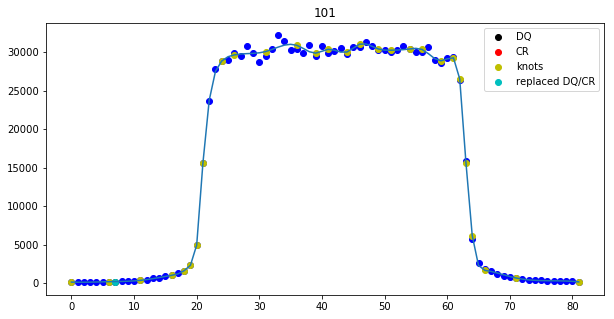

198 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 4]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 2
nr. of CRs 1227
Spectrum located at pixel 124 in spatial direction
subexp 163.03516647136368 [204, 162, 120, 78]
ypix is 162 for exposure 1


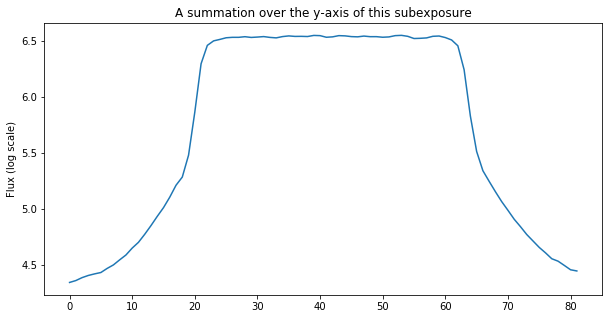

The difference between the two edges (for a 5-pixel bin for all subexps is): 877.51796875
This value may not be larger than  4441.278374522363  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1277699.1449517491 pl 1277699.1449517491 41.20987
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


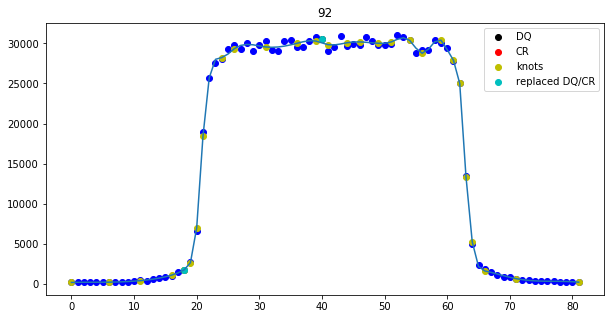

1295969.5885113867 pl 1295969.5885113867 41.54415
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


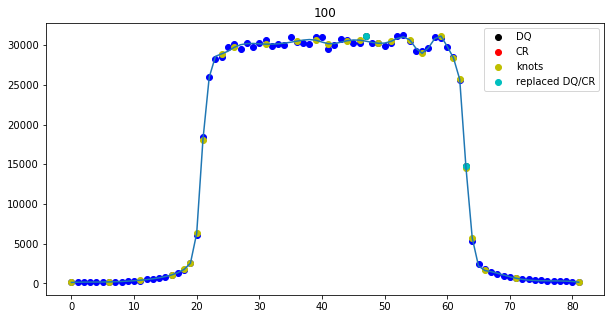

1285426.7623586752 pl 1285426.7623586752 41.115875
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


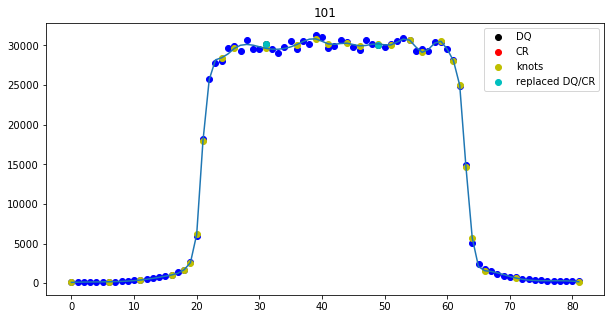

197 successes out of 200 total fits
Optimal extraction fitting failed for columns: [4]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 3
nr. of CRs 1202
Spectrum located at pixel 124 in spatial direction
subexp 120.6269175254315 [204, 162, 120, 78]
ypix is 120 for exposure 2


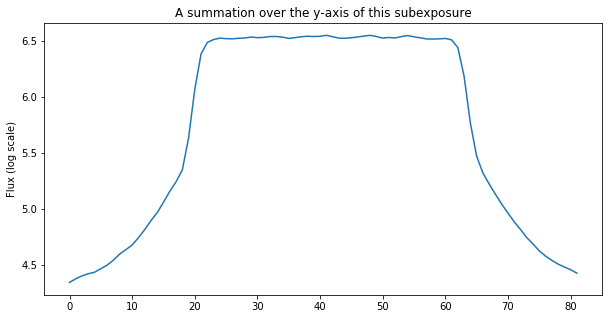

The difference between the two edges (for a 5-pixel bin for all subexps is): 891.5026041666666
This value may not be larger than  4442.12417656238  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1268419.5589490288 pl 1268419.5589490288 41.4072
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


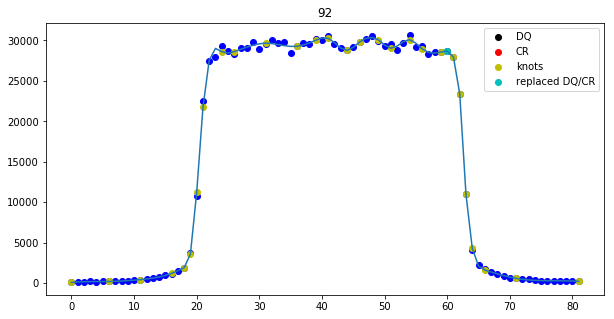

1296198.9149502676 pl 1296198.9149502676 40.84482
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


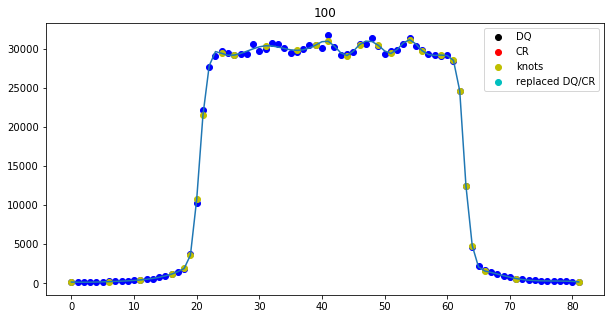

1286527.9524164225 pl 1286527.9524164225 41.070763
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


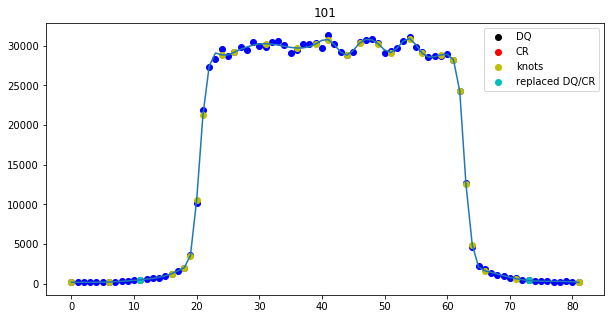

191 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 4
nr. of CRs 1175
Spectrum located at pixel 124 in spatial direction
subexp 78.08906154196184 [204, 162, 120, 78]
ypix is 78 for exposure 3


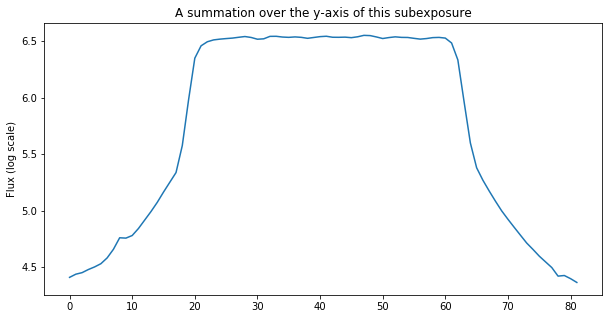

The difference between the two edges (for a 5-pixel bin for all subexps is): 565.1166666666667
This value may not be larger than  4440.706970742383  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1264314.1398934757 pl 1264314.1398934757 41.152386
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


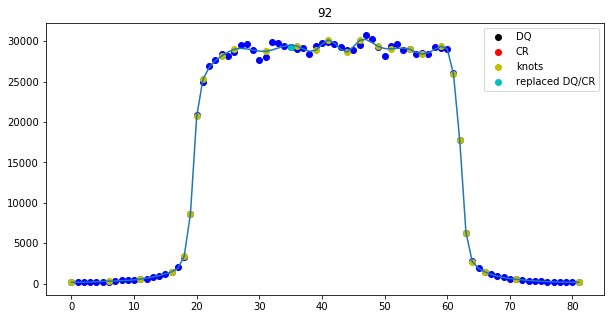

1295150.6050380154 pl 1295150.6050380154 41.603344
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


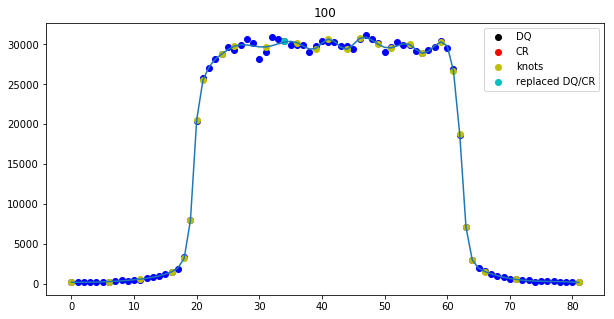

1284921.8650539455 pl 1284921.8650539455 41.329567
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


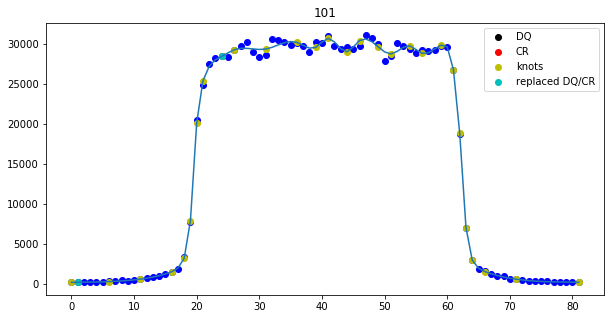

Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Applied an xshift of 0.0289646125137 pix compared to reference (reduced) spectrum ie9301bhq
Shifted subexposure nr. 1 with -0.349225135826 pixels and shrunk 0.220586782794 percent.
Shifted subexposure nr. 2 with -0.735206882185 pixels and shrunk 0.442136146054 percent.
Shifted subexposure nr. 3 with -1.07745949394 pixels and shrunk 0.6597557436 percent.
Saving spectrum to /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/ie9301buq_spec.txt
Extraction took 2.69s
########################################
###########Finished Extraction##########
########################################
ie9301buq
########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/s.baratuva.nl/Desktop/PhD/hst_data_a

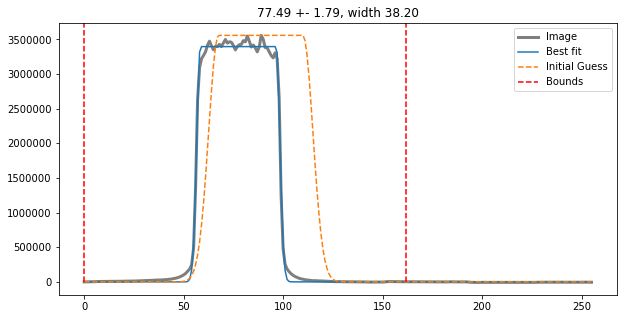

(array([[  8.476547  ,  26.842438  , -25.202911  , ..., -35.9345    ,
         21.629448  , -10.858505  ],
       [ 41.350685  , -14.66507   ,  35.31521   , ...,  16.201172  ,
        -16.385422  ,  -0.55641174],
       [-16.913239  ,  10.641899  ,   4.928604  , ..., -14.094009  ,
        -16.574432  ,   9.66291   ],
       ...,
       [  0.07832336, -17.283707  , -18.994339  , ...,  17.672974  ,
          4.624466  ,   0.93214417],
       [ 13.113388  ,   9.373764  , -19.33406   , ...,  10.06102   ,
        -64.094376  ,  -7.7353363 ],
       [ -4.747513  ,   1.1876984 ,   2.8911285 , ..., -19.814896  ,
        -22.591583  ,  -8.248703  ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.01597487, 0.99097391, 1.001089

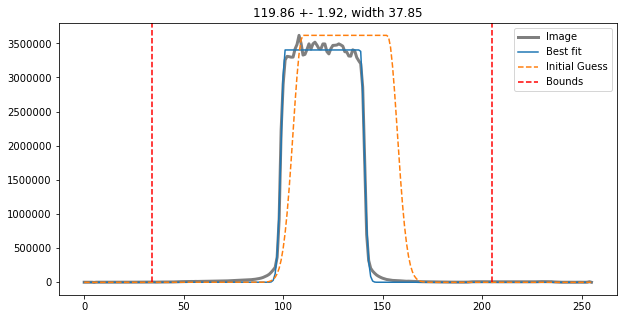

(array([[ 16.459095 ,  12.850506 , -12.201122 , ...,  47.037083 ,
         14.839283 ,  52.95695  ],
       [ 29.6749   ,  41.398754 , -45.618168 , ...,  -9.616261 ,
          5.833313 ,  78.758606 ],
       [ -4.0784874, -12.406544 ,   2.7995567, ..., -14.019505 ,
          7.1115837,  10.441257 ],
       ...,
       [ 10.599049 ,  13.707912 ,  45.794064 , ...,  47.189243 ,
          6.3928413,  57.439243 ],
       [ -5.155346 ,  25.550694 ,   7.826252 , ...,   5.1913795,
         43.304203 , -22.057247 ],
       [ -6.456402 ,  24.472317 ,  22.895725 , ..., -19.501232 ,
        -13.199688 ,  43.769306 ]], dtype=float32), array([[1.00005887, 0.99631715, 1.01913849, ..., 1.01117496, 0.9857711 ,
        1.00169883],
       [1.0077967 , 1.00066505, 0.99113703, ..., 0.97842318, 0.98744521,
        0.98047949],
       [0.98492686, 0.9683537 , 0.97322563, ..., 0.98656412, 1.01614636,
        0.99626665],
       ...,
       [0.99159165, 0.96546904, 0.93943933, ..., 0.99333385, 0.98981972,
   

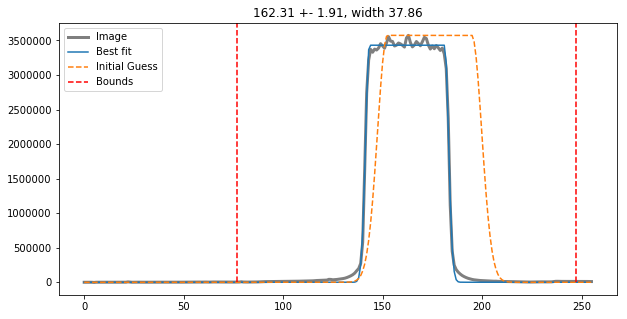

(array([[ 69.068085  ,  -0.6327286 ,  38.983936  , ...,   6.900654  ,
         25.413403  ,  -7.420864  ],
       [-23.902142  ,  -4.892544  ,   5.8896446 , ...,   4.086029  ,
         23.895428  , -36.70737   ],
       [  8.682953  , -21.39539   ,  37.541965  , ...,  10.720379  ,
         35.730274  ,  26.372898  ],
       ...,
       [ 16.5097    , -24.621922  ,  15.787636  , ...,  19.084202  ,
         25.748692  ,   9.517025  ],
       [ 10.826691  ,  43.584538  ,  -2.492096  , ...,  10.144917  ,
         30.897785  ,  16.507336  ],
       [ -0.46889877,  15.773361  , -12.469765  , ...,  -6.517536  ,
         36.47008   ,  14.803547  ]], dtype=float32), array([[0.97276955, 0.98545687, 1.00024228, ..., 0.99504684, 0.98786921,
        0.98946573],
       [1.01984942, 1.02008576, 0.99551588, ..., 0.97861723, 0.98087129,
        0.98033262],
       [0.99689192, 0.99048877, 0.99948678, ..., 1.02427525, 0.96923003,
        0.96686731],
       ...,
       [0.95235794, 0.96168618, 1.000953

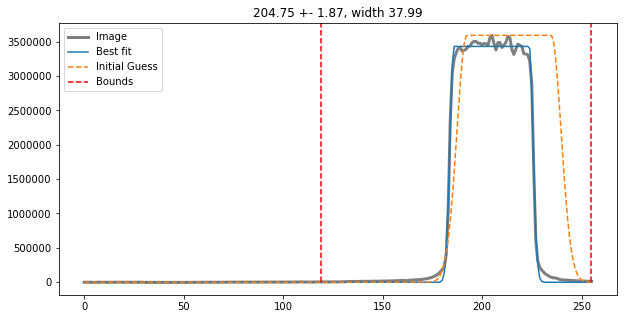

(array([[ 23.88218   ,  -9.050991  ,  39.607002  , ...,  19.000671  ,
         26.711655  ,   4.501568  ],
       [ 38.82303   ,   0.15002823,  13.356827  , ...,  35.28131   ,
         -9.544327  ,  50.14173   ],
       [ 27.213402  ,   3.5281525 ,  10.023895  , ...,   4.2755203 ,
         22.163528  ,  27.970863  ],
       ...,
       [ 11.8618965 ,   5.4830017 ,  26.486343  , ...,  13.313286  ,
         14.441257  ,  18.442513  ],
       [-18.452303  ,  31.159698  , -13.992294  , ...,   3.2949448 ,
          3.0649414 ,  29.994995  ],
       [ 12.859909  ,  32.631676  ,  48.058907  , ...,  -1.6951027 ,
         36.98867   ,  42.911377  ]], dtype=float32), array([[1.01551701, 0.9995939 , 1.0131288 , ..., 0.99402601, 0.99839718,
        1.0051168 ],
       [0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       ...,
       [0.99049433, 0.98990652, 1.018020

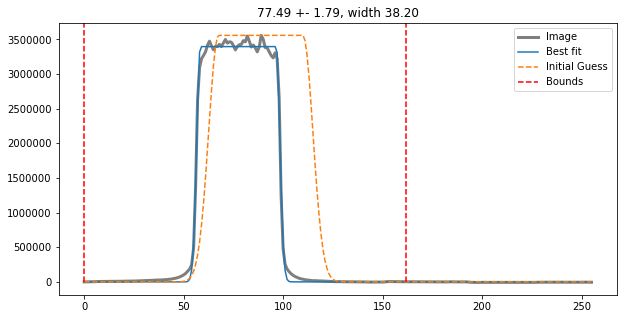

(array([[  8.476547  ,  26.842438  , -25.202911  , ..., -35.9345    ,
         21.629448  , -10.858505  ],
       [ 41.350685  , -14.66507   ,  35.31521   , ...,  16.201172  ,
        -16.385422  ,  -0.55641174],
       [-16.913239  ,  10.641899  ,   4.928604  , ..., -14.094009  ,
        -16.574432  ,   9.66291   ],
       ...,
       [  0.07832336, -17.283707  , -18.994339  , ...,  17.672974  ,
          4.624466  ,   0.93214417],
       [ 13.113388  ,   9.373764  , -19.33406   , ...,  10.06102   ,
        -64.094376  ,  -7.7353363 ],
       [ -4.747513  ,   1.1876984 ,   2.8911285 , ..., -19.814896  ,
        -22.591583  ,  -8.248703  ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.01597487, 0.99097391, 1.001089

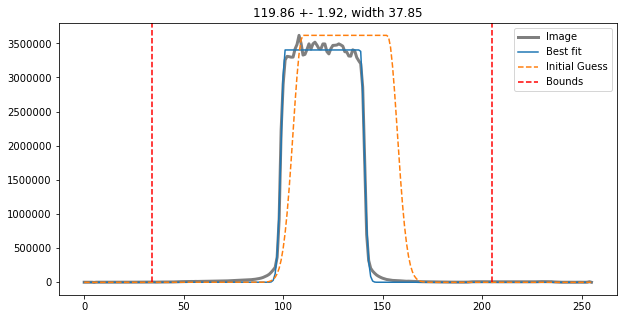

(array([[ 16.459095 ,  12.850506 , -12.201122 , ...,  47.037083 ,
         14.839283 ,  52.95695  ],
       [ 29.6749   ,  41.398754 , -45.618168 , ...,  -9.616261 ,
          5.833313 ,  78.758606 ],
       [ -4.0784874, -12.406544 ,   2.7995567, ..., -14.019505 ,
          7.1115837,  10.441257 ],
       ...,
       [ 10.599049 ,  13.707912 ,  45.794064 , ...,  47.189243 ,
          6.3928413,  57.439243 ],
       [ -5.155346 ,  25.550694 ,   7.826252 , ...,   5.1913795,
         43.304203 , -22.057247 ],
       [ -6.456402 ,  24.472317 ,  22.895725 , ..., -19.501232 ,
        -13.199688 ,  43.769306 ]], dtype=float32), array([[1.00005887, 0.99631715, 1.01913849, ..., 1.01117496, 0.9857711 ,
        1.00169883],
       [1.0077967 , 1.00066505, 0.99113703, ..., 0.97842318, 0.98744521,
        0.98047949],
       [0.98492686, 0.9683537 , 0.97322563, ..., 0.98656412, 1.01614636,
        0.99626665],
       ...,
       [0.99159165, 0.96546904, 0.93943933, ..., 0.99333385, 0.98981972,
   

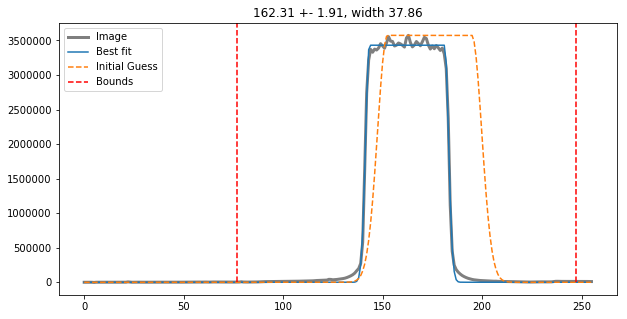

(array([[ 69.068085  ,  -0.6327286 ,  38.983936  , ...,   6.900654  ,
         25.413403  ,  -7.420864  ],
       [-23.902142  ,  -4.892544  ,   5.8896446 , ...,   4.086029  ,
         23.895428  , -36.70737   ],
       [  8.682953  , -21.39539   ,  37.541965  , ...,  10.720379  ,
         35.730274  ,  26.372898  ],
       ...,
       [ 16.5097    , -24.621922  ,  15.787636  , ...,  19.084202  ,
         25.748692  ,   9.517025  ],
       [ 10.826691  ,  43.584538  ,  -2.492096  , ...,  10.144917  ,
         30.897785  ,  16.507336  ],
       [ -0.46889877,  15.773361  , -12.469765  , ...,  -6.517536  ,
         36.47008   ,  14.803547  ]], dtype=float32), array([[0.97276955, 0.98545687, 1.00024228, ..., 0.99504684, 0.98786921,
        0.98946573],
       [1.01984942, 1.02008576, 0.99551588, ..., 0.97861723, 0.98087129,
        0.98033262],
       [0.99689192, 0.99048877, 0.99948678, ..., 1.02427525, 0.96923003,
        0.96686731],
       ...,
       [0.95235794, 0.96168618, 1.000953

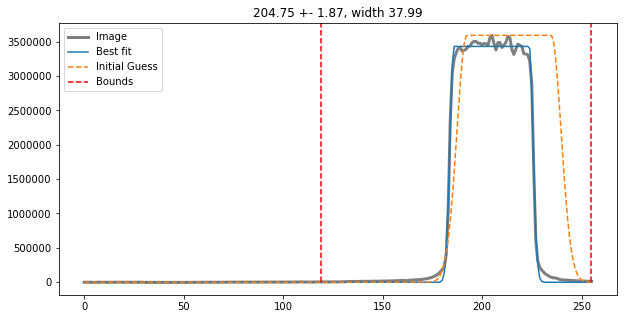

(array([[ 23.88218   ,  -9.050991  ,  39.607002  , ...,  19.000671  ,
         26.711655  ,   4.501568  ],
       [ 38.82303   ,   0.15002823,  13.356827  , ...,  35.28131   ,
         -9.544327  ,  50.14173   ],
       [ 27.213402  ,   3.5281525 ,  10.023895  , ...,   4.2755203 ,
         22.163528  ,  27.970863  ],
       ...,
       [ 11.8618965 ,   5.4830017 ,  26.486343  , ...,  13.313286  ,
         14.441257  ,  18.442513  ],
       [-18.452303  ,  31.159698  , -13.992294  , ...,   3.2949448 ,
          3.0649414 ,  29.994995  ],
       [ 12.859909  ,  32.631676  ,  48.058907  , ...,  -1.6951027 ,
         36.98867   ,  42.911377  ]], dtype=float32), array([[1.01551701, 0.9995939 , 1.0131288 , ..., 0.99402601, 0.99839718,
        1.0051168 ],
       [0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       ...,
       [0.99049433, 0.98990652, 1.018020

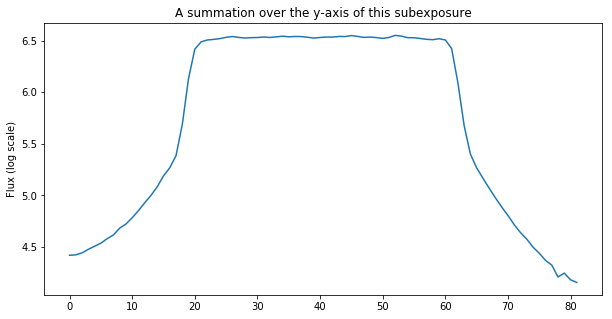

The difference between the two edges (for a 5-pixel bin for all subexps is): 1625.32109375
This value may not be larger than  4422.737131385194  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Using flux for variance estimate
Extracting spectrum with optimal extraction...
1256812.8973160018 pl 1256812.8973160018 40.73608
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


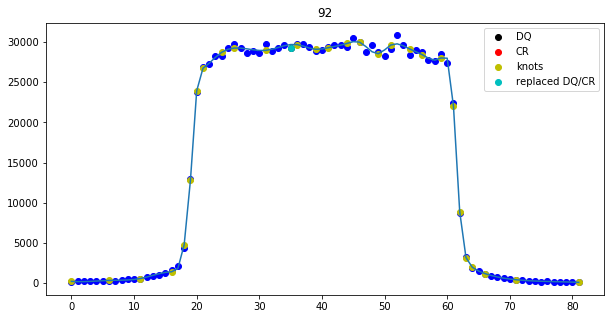

1283567.6697398128 pl 1283567.6697398128 41.049404
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


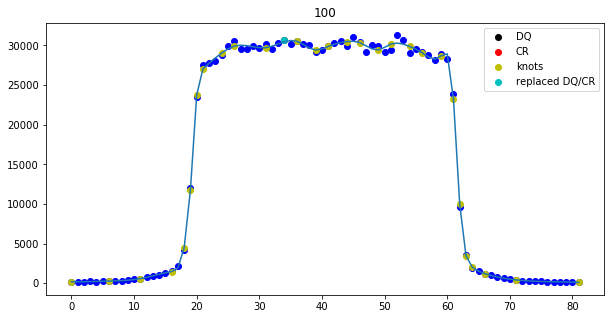

1275032.5801081995 pl 1275032.5801081995 40.87576
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


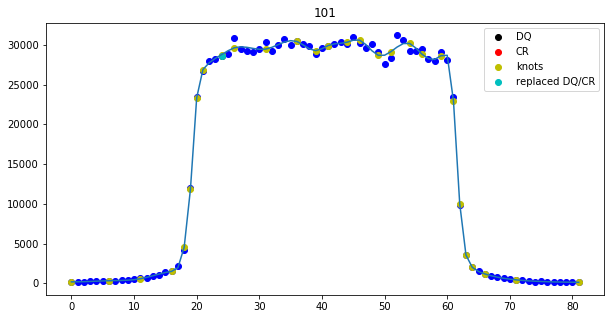

Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 6, 7, 9, 10, 11, 12, 13, 14, 15, 17]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 2
nr. of CRs 1195
Spectrum located at pixel 124 in spatial direction
subexp 119.86434863109598 [204, 162, 120, 78]
ypix is 120 for exposure 1


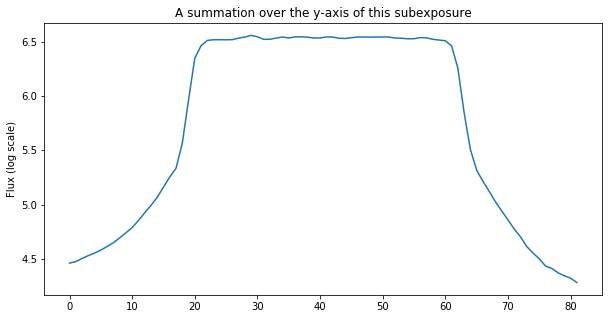

The difference between the two edges (for a 5-pixel bin for all subexps is): 1419.9611979166666
This value may not be larger than  4437.908696672342  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1267098.3109385516 pl 1267098.3109385516 40.437717
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


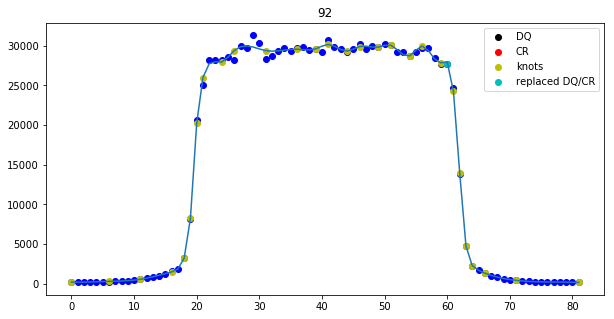

1295746.8046795016 pl 1295746.8046795016 40.251957
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


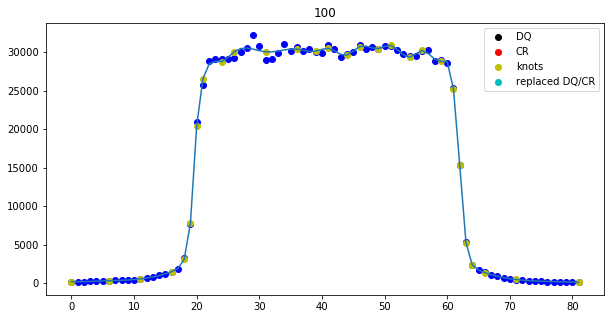

1286012.1977935585 pl 1286012.1977935585 40.795856
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


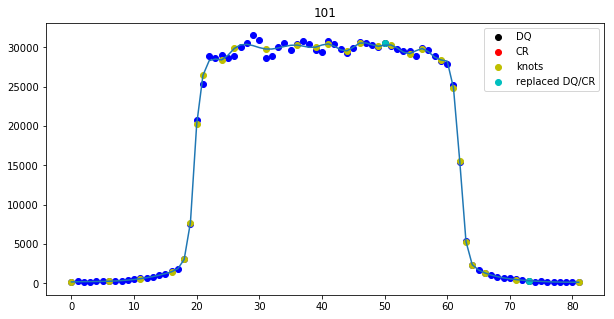

189 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 3
nr. of CRs 1178
Spectrum located at pixel 124 in spatial direction
subexp 162.3073420419548 [204, 162, 120, 78]
ypix is 162 for exposure 2


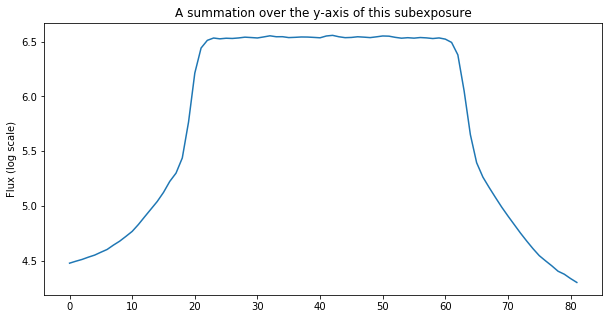

The difference between the two edges (for a 5-pixel bin for all subexps is): 1510.1341145833333
This value may not be larger than  4459.665518100358  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1287552.9361490968 pl 1287552.9361490968 41.267567
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


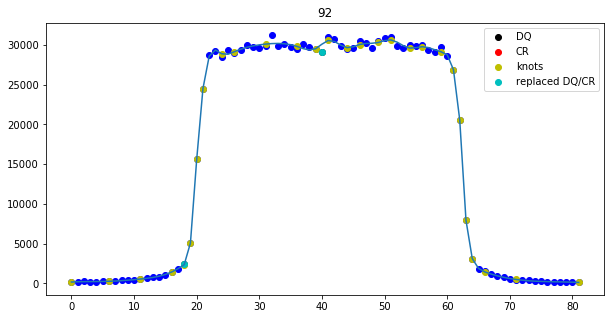

1306129.6380947998 pl 1306129.6380947998 41.12294
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


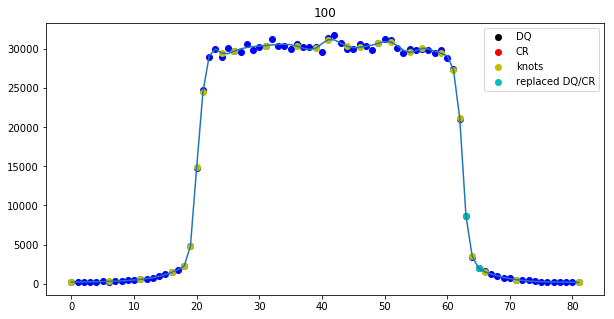

1295686.1028106895 pl 1295686.1028106895 41.245255
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


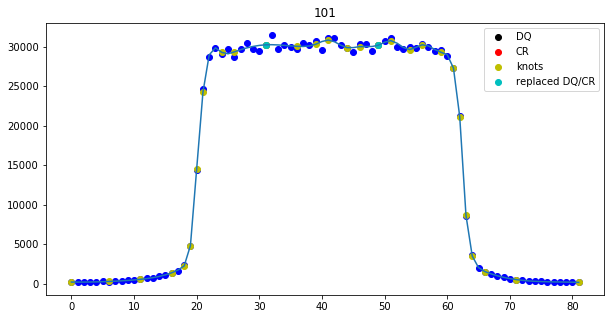

193 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 2, 3, 4, 6]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 4
nr. of CRs 1182
Spectrum located at pixel 124 in spatial direction
subexp 204.75484026094878 [204, 162, 120, 78]
ypix is 204 for exposure 3


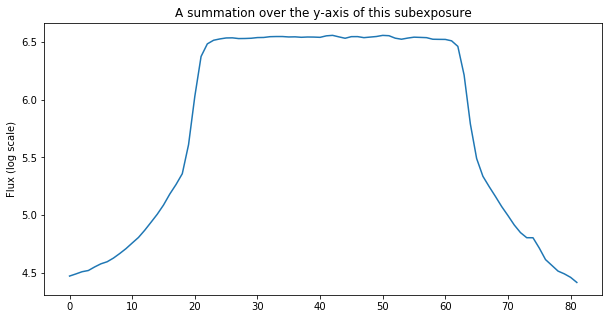

The difference between the two edges (for a 5-pixel bin for all subexps is): 644.6072916666667
This value may not be larger than  4462.239557292579  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1297468.0189033858 pl 1297468.0189033858 41.081387
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


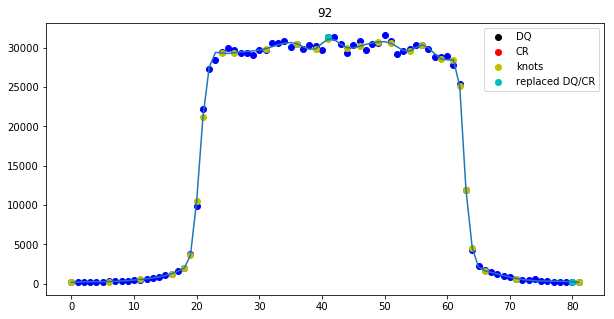

1307236.0738733513 pl 1307236.0738733513 41.219624
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


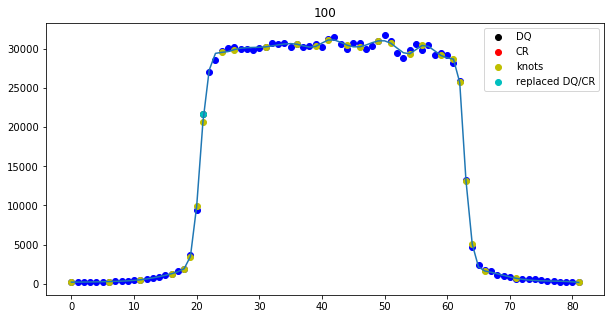

1303177.1970340747 pl 1303177.1970340747 41.121143
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


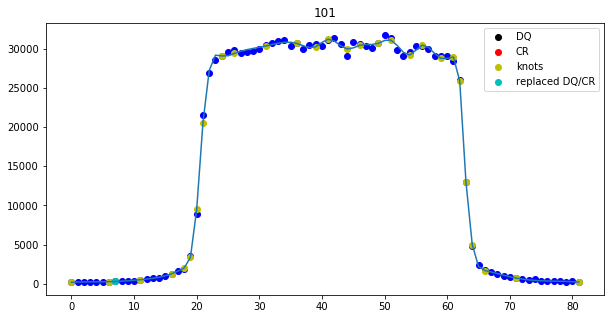

195 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 6]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Applied an xshift of 0.0477713525174 pix compared to reference (reduced) spectrum ie9301bhq
Shifted subexposure nr. 0 with -1.1010023584 pixels and shrunk 0.670162427694 percent.
Shifted subexposure nr. 1 with -0.778997160624 pixels and shrunk 0.460619859092 percent.
Shifted subexposure nr. 2 with -0.402447059543 pixels and shrunk 0.23424724306 percent.
Saving spectrum to /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/ie9301bvq_spec.txt
Extraction took 2.58s
########################################
###########Finished Extraction##########
########################################
ie9301bvq
########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysi

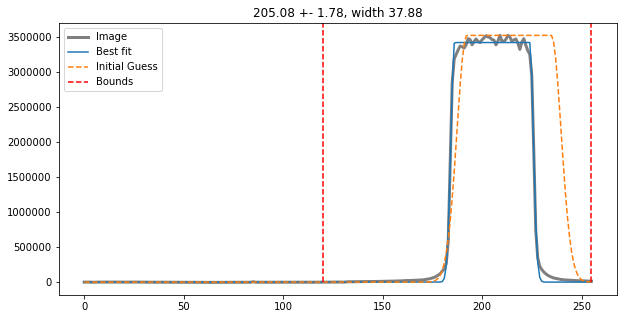

(array([[ 57.42881   ,   0.5734024 , -11.452873  , ...,  10.897652  ,
         16.254738  ,  17.399055  ],
       [ 14.520607  ,   1.8560562 , -14.855827  , ...,  -9.310478  ,
         17.675972  ,  -3.4450607 ],
       [  8.608437  ,  37.180183  ,   0.30298615, ...,  47.948433  ,
         -5.345146  ,  11.8491745 ],
       ...,
       [ -9.027504  ,  38.86927   ,  34.36788   , ...,  24.892906  ,
         41.869408  ,  63.570503  ],
       [ 56.308754  ,  53.88456   ,  11.319069  , ...,   4.1776657 ,
         25.543724  ,   5.795906  ],
       [ 26.516869  ,   6.603279  ,  29.401985  , ...,  31.012001  ,
         46.239708  ,  -7.22921   ]], dtype=float32), array([[0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       [1.01465568, 1.01152106, 0.97465585, ..., 0.99614412, 0.99226877,
        0.99630135],
       ...,
       [0.99049433, 0.98990652, 1.018020

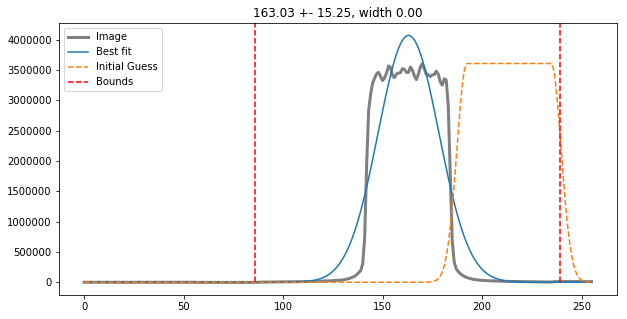

(array([[ 30.524967 ,  53.095005 ,   6.1008034, ...,  -1.263073 ,
          1.6938667, -17.30447  ],
       [ 74.86803  ,  28.678165 , -10.304043 , ..., -23.988445 ,
         13.387623 ,  28.789799 ],
       [ 68.93756  , 107.53789  ,  50.214146 , ..., -32.5628   ,
         26.974094 ,  33.32964  ],
       ...,
       [ 12.963367 ,  36.70355  ,  -1.4863625, ...,  18.96783  ,
         37.826977 ,  20.282215 ],
       [  2.5051155,  13.017292 ,  -1.5922432, ..., -21.519077 ,
          3.9949303,  -3.5718117],
       [-14.558849 , -73.54025  ,  23.174938 , ...,  17.000187 ,
         21.18092  ,   2.3865318]], dtype=float32), array([[0.97797824, 1.01717404, 1.02369336, ..., 0.97947431, 0.99055837,
        0.97462096],
       [0.86756175, 1.00057105, 1.00078321, ..., 0.98511468, 0.98741866,
        0.97093693],
       [1.04421316, 1.00141875, 0.96262652, ..., 0.98749226, 1.01309426,
        0.9847939 ],
       ...,
       [0.98067773, 1.00647348, 0.9807526 , ..., 1.00480205, 0.98312882,
   

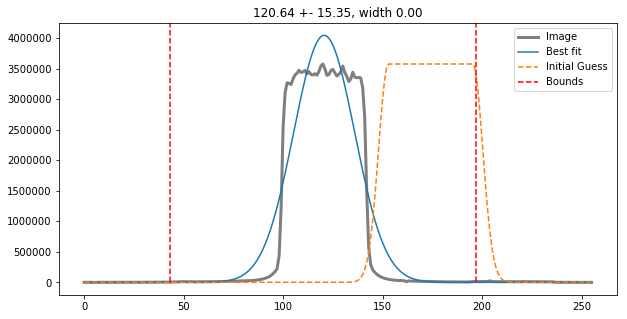

(array([[  5.4568634,   6.432022 ,  14.447464 , ...,  15.556892 ,
        -38.077065 ,  -4.6967926],
       [ 39.75743  ,  10.343399 ,  48.24263  , ..., -23.846603 ,
         30.262642 ,   3.493637 ],
       [ 37.949844 ,  20.376587 ,  33.036148 , ...,  -5.8950577,
        -26.20472  ,  -3.5401077],
       ...,
       [-14.137444 ,  -0.5691452,  15.523621 , ...,   2.484295 ,
         49.654648 ,  29.893799 ],
       [ 19.550941 ,  -9.953842 , -18.551659 , ..., -23.597816 ,
         47.61261  , -14.949516 ],
       [ 13.564186 ,  -1.3372269,  15.518791 , ...,  -1.0038986,
         20.000221 ,  21.149666 ]], dtype=float32), array([[0.99152216, 0.98206137, 0.98798856, ..., 0.9900434 , 0.97864713,
        0.99251526],
       [1.0128799 , 0.96209698, 1.03174513, ..., 1.00765806, 0.99389191,
        0.98775042],
       [0.99974451, 0.98079478, 0.99440176, ..., 0.99625174, 0.9890361 ,
        0.95858532],
       ...,
       [1.03185068, 1.00088005, 0.98926224, ..., 0.98714183, 0.9753993 ,
   

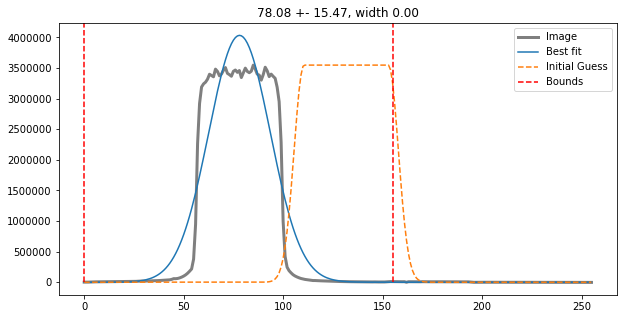

(array([[  0.56207275,   3.9324493 ,  13.401176  , ...,  19.239616  ,
        -22.444103  , -12.868393  ],
       [ -5.0764427 , -16.170933  , -15.312012  , ..., -16.058895  ,
         -2.929741  , -25.525997  ],
       [  6.92572   ,  26.985939  ,   1.901001  , ...,  -3.086544  ,
         -5.8327637 ,  11.863113  ],
       ...,
       [ -0.29151154,  -2.9757385 ,  19.827583  , ..., -21.86876   ,
        -33.7936    , -12.113434  ],
       [  6.7723618 ,  16.67247   ,  41.027313  , ..., -13.173096  ,
        -63.05702   ,   7.1269455 ],
       [ -5.897972  , -16.494602  ,  16.721008  , ...,  33.997086  ,
          2.0717316 ,  -8.2039795 ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.03028248, 1.00843969, 1.014272

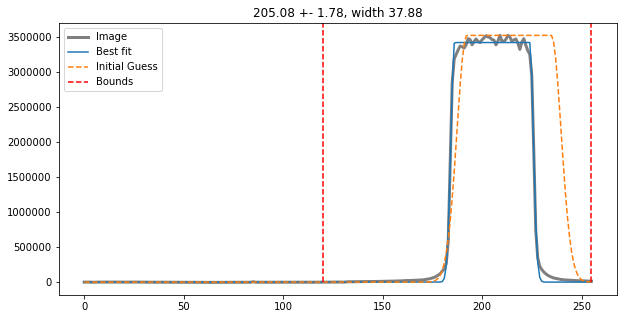

(array([[ 57.42881   ,   0.5734024 , -11.452873  , ...,  10.897652  ,
         16.254738  ,  17.399055  ],
       [ 14.520607  ,   1.8560562 , -14.855827  , ...,  -9.310478  ,
         17.675972  ,  -3.4450607 ],
       [  8.608437  ,  37.180183  ,   0.30298615, ...,  47.948433  ,
         -5.345146  ,  11.8491745 ],
       ...,
       [ -9.027504  ,  38.86927   ,  34.36788   , ...,  24.892906  ,
         41.869408  ,  63.570503  ],
       [ 56.308754  ,  53.88456   ,  11.319069  , ...,   4.1776657 ,
         25.543724  ,   5.795906  ],
       [ 26.516869  ,   6.603279  ,  29.401985  , ...,  31.012001  ,
         46.239708  ,  -7.22921   ]], dtype=float32), array([[0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       [1.01465568, 1.01152106, 0.97465585, ..., 0.99614412, 0.99226877,
        0.99630135],
       ...,
       [0.99049433, 0.98990652, 1.018020

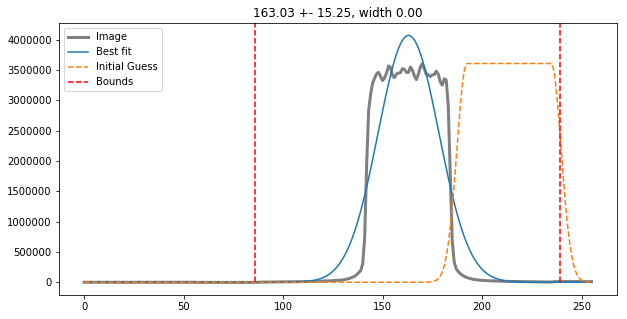

(array([[ 30.524967 ,  53.095005 ,   6.1008034, ...,  -1.263073 ,
          1.6938667, -17.30447  ],
       [ 74.86803  ,  28.678165 , -10.304043 , ..., -23.988445 ,
         13.387623 ,  28.789799 ],
       [ 68.93756  , 107.53789  ,  50.214146 , ..., -32.5628   ,
         26.974094 ,  33.32964  ],
       ...,
       [ 12.963367 ,  36.70355  ,  -1.4863625, ...,  18.96783  ,
         37.826977 ,  20.282215 ],
       [  2.5051155,  13.017292 ,  -1.5922432, ..., -21.519077 ,
          3.9949303,  -3.5718117],
       [-14.558849 , -73.54025  ,  23.174938 , ...,  17.000187 ,
         21.18092  ,   2.3865318]], dtype=float32), array([[0.97797824, 1.01717404, 1.02369336, ..., 0.97947431, 0.99055837,
        0.97462096],
       [0.86756175, 1.00057105, 1.00078321, ..., 0.98511468, 0.98741866,
        0.97093693],
       [1.04421316, 1.00141875, 0.96262652, ..., 0.98749226, 1.01309426,
        0.9847939 ],
       ...,
       [0.98067773, 1.00647348, 0.9807526 , ..., 1.00480205, 0.98312882,
   

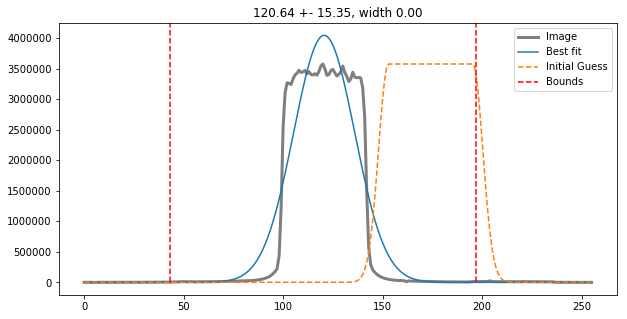

(array([[  5.4568634,   6.432022 ,  14.447464 , ...,  15.556892 ,
        -38.077065 ,  -4.6967926],
       [ 39.75743  ,  10.343399 ,  48.24263  , ..., -23.846603 ,
         30.262642 ,   3.493637 ],
       [ 37.949844 ,  20.376587 ,  33.036148 , ...,  -5.8950577,
        -26.20472  ,  -3.5401077],
       ...,
       [-14.137444 ,  -0.5691452,  15.523621 , ...,   2.484295 ,
         49.654648 ,  29.893799 ],
       [ 19.550941 ,  -9.953842 , -18.551659 , ..., -23.597816 ,
         47.61261  , -14.949516 ],
       [ 13.564186 ,  -1.3372269,  15.518791 , ...,  -1.0038986,
         20.000221 ,  21.149666 ]], dtype=float32), array([[0.99152216, 0.98206137, 0.98798856, ..., 0.9900434 , 0.97864713,
        0.99251526],
       [1.0128799 , 0.96209698, 1.03174513, ..., 1.00765806, 0.99389191,
        0.98775042],
       [0.99974451, 0.98079478, 0.99440176, ..., 0.99625174, 0.9890361 ,
        0.95858532],
       ...,
       [1.03185068, 1.00088005, 0.98926224, ..., 0.98714183, 0.9753993 ,
   

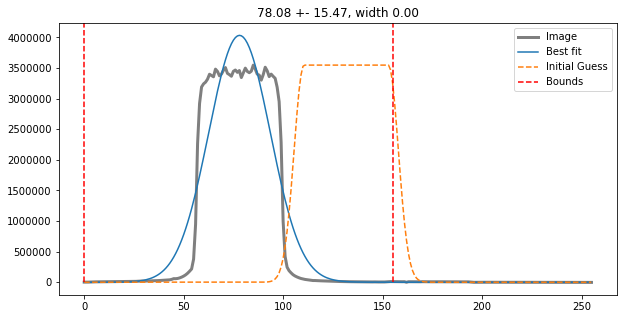

(array([[  0.56207275,   3.9324493 ,  13.401176  , ...,  19.239616  ,
        -22.444103  , -12.868393  ],
       [ -5.0764427 , -16.170933  , -15.312012  , ..., -16.058895  ,
         -2.929741  , -25.525997  ],
       [  6.92572   ,  26.985939  ,   1.901001  , ...,  -3.086544  ,
         -5.8327637 ,  11.863113  ],
       ...,
       [ -0.29151154,  -2.9757385 ,  19.827583  , ..., -21.86876   ,
        -33.7936    , -12.113434  ],
       [  6.7723618 ,  16.67247   ,  41.027313  , ..., -13.173096  ,
        -63.05702   ,   7.1269455 ],
       [ -5.897972  , -16.494602  ,  16.721008  , ...,  33.997086  ,
          2.0717316 ,  -8.2039795 ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.03028248, 1.00843969, 1.014272

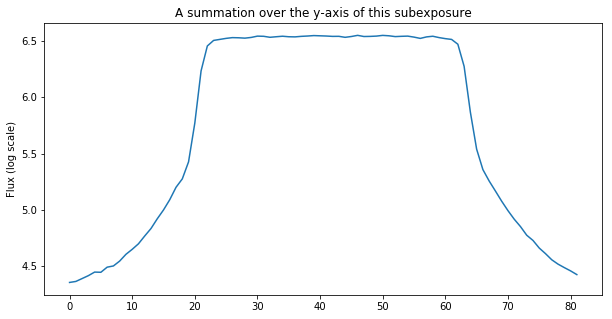

The difference between the two edges (for a 5-pixel bin for all subexps is): 804.0114583333333
This value may not be larger than  4440.925549177034  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Using flux for variance estimate
Extracting spectrum with optimal extraction...
1283876.9884442256 pl 1283876.9884442256 41.066185
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


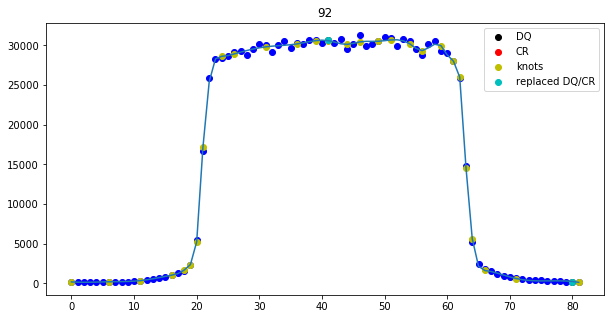

1295451.0255418308 pl 1295451.0255418308 41.4723
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


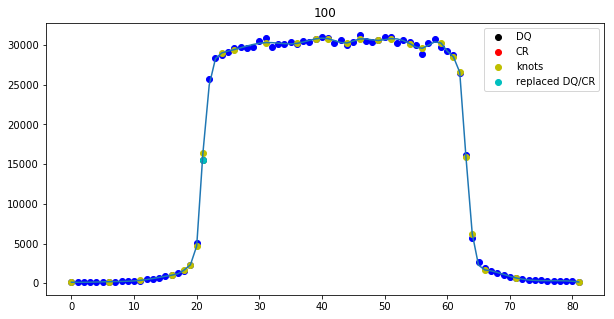

1290309.1881375415 pl 1290309.1881375415 41.17597
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


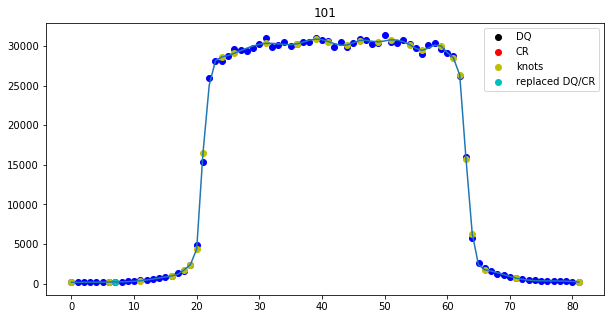

196 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 3]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 2
nr. of CRs 1204
Spectrum located at pixel 124 in spatial direction
subexp 163.03493407347864 [204, 162, 120, 78]
ypix is 162 for exposure 1


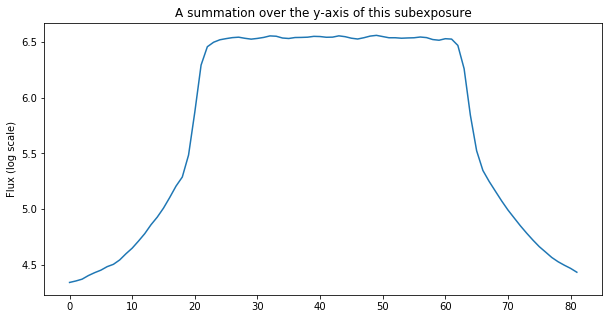

The difference between the two edges (for a 5-pixel bin for all subexps is): 990.7736979166667
This value may not be larger than  4443.09105616049  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1277016.5496888193 pl 1277016.5496888193 40.96572
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


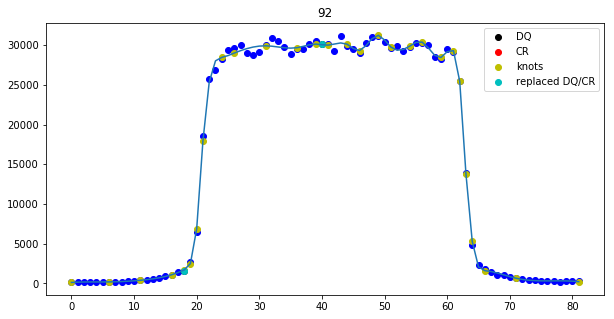

1296525.304156737 pl 1296525.304156737 40.38943
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


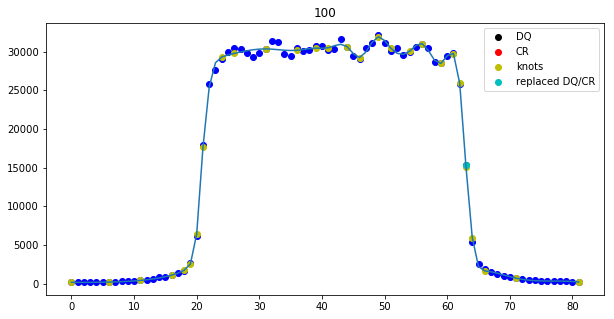

1285214.5956226522 pl 1285214.5956226522 40.895546
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


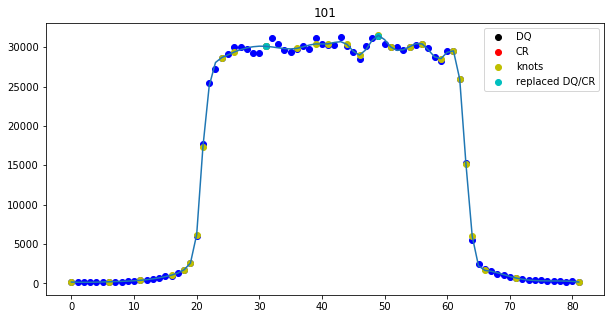

198 successes out of 200 total fits
Optimal extraction fitting failed for columns: []
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 3
nr. of CRs 1230
Spectrum located at pixel 124 in spatial direction
subexp 120.63769692925996 [204, 162, 120, 78]
ypix is 120 for exposure 2


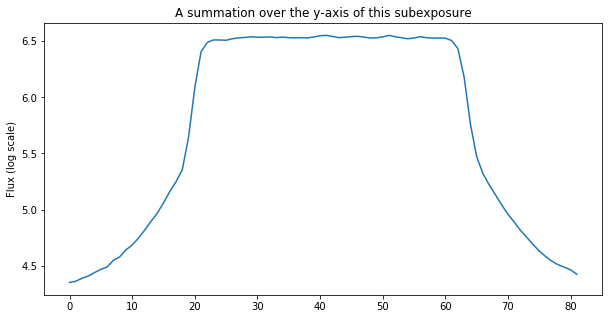

The difference between the two edges (for a 5-pixel bin for all subexps is): 879.4838541666667
This value may not be larger than  4442.832970076638  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1269009.410559883 pl 1269009.410559883 41.24806
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


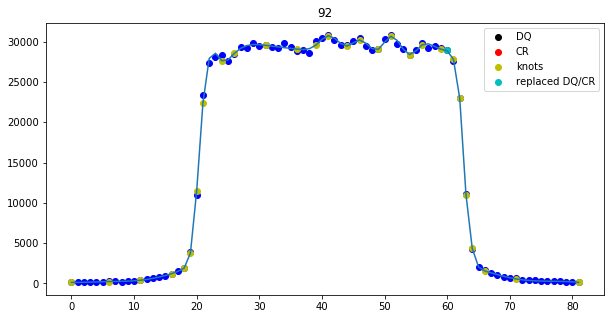

1294829.9545111477 pl 1294829.9545111477 41.025574
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


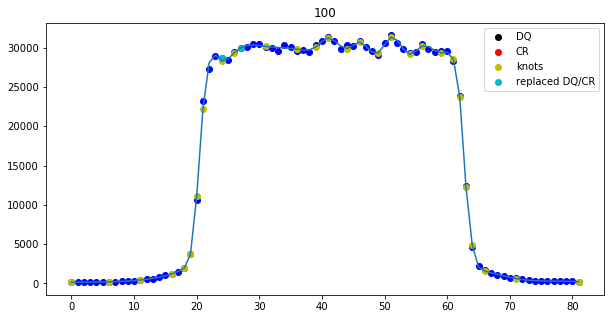

1288575.558537118 pl 1288575.558537118 41.35898
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


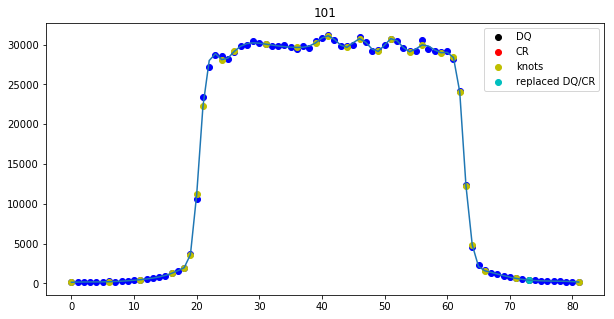

188 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 4
nr. of CRs 1175
Spectrum located at pixel 124 in spatial direction
subexp 78.08327412102396 [204, 162, 120, 78]
ypix is 78 for exposure 3


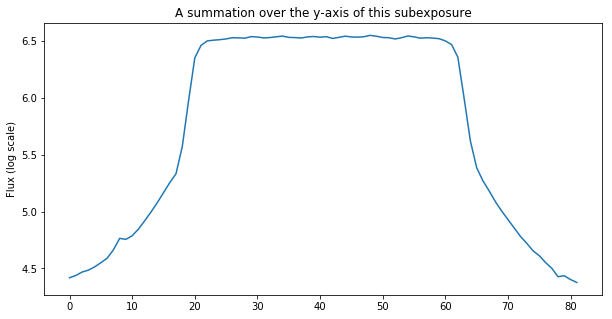

The difference between the two edges (for a 5-pixel bin for all subexps is): 480.44114583333334
This value may not be larger than  4442.957093348228  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1264390.730819637 pl 1264390.730819637 41.142178
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


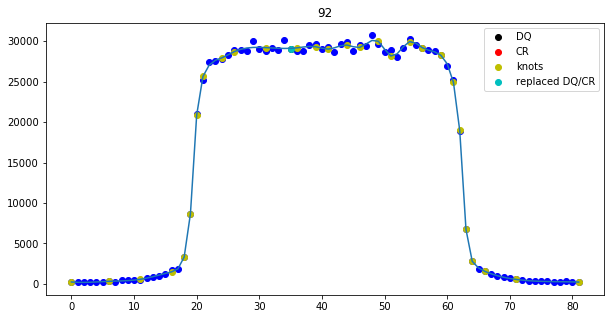

1292474.4515436746 pl 1292474.4515436746 41.352737
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


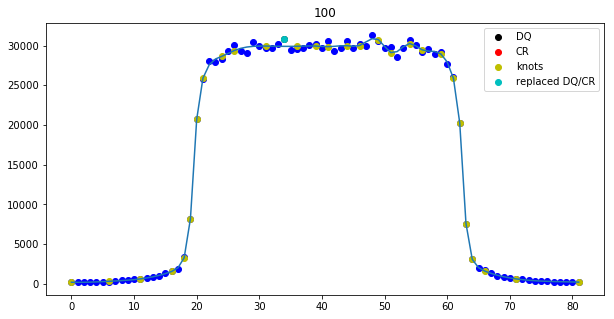

1287814.4447230105 pl 1287814.4447230105 41.60096
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


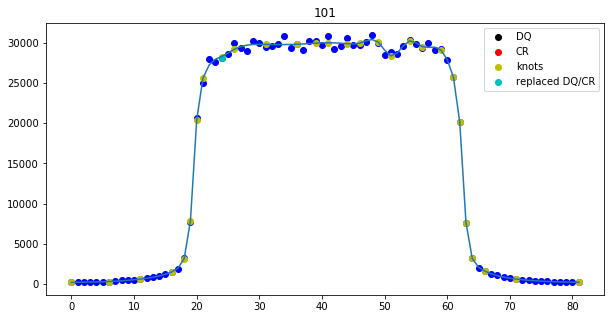

Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Applied an xshift of 0.0550246352734 pix compared to reference (reduced) spectrum ie9301bhq
Shifted subexposure nr. 1 with -0.405563379881 pixels and shrunk 0.232124553624 percent.
Shifted subexposure nr. 2 with -0.765804850223 pixels and shrunk 0.448267738871 percent.
Shifted subexposure nr. 3 with -1.08381768368 pixels and shrunk 0.664891167388 percent.
Saving spectrum to /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/ie9301bwq_spec.txt
Extraction took 2.61s
########################################
###########Finished Extraction##########
########################################
ie9301bwq
########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/s.baratuva.nl/Desktop/PhD/hst_data_ana

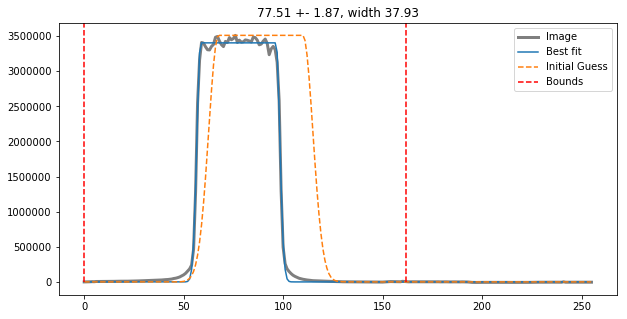

(array([[ 10.035591 , -13.81591  ,  51.411118 , ...,  -6.3200455,
        -44.63111  , -13.981895 ],
       [ -6.345833 ,  29.113838 , -21.76339  , ..., -14.982826 ,
        -40.554512 ,  50.10469  ],
       [ 38.59034  ,  19.23687  ,  34.63421  , ..., -14.8782425,
         -3.3278427, -14.506355 ],
       ...,
       [-24.115288 , -13.387596 ,  -8.074211 , ...,  -9.047722 ,
          1.4795151,  21.358864 ],
       [ 14.668312 , -19.502098 , -62.25689  , ...,   2.2018204,
          8.196968 ,   5.61985  ],
       [  1.4895706,  47.22193  , -16.621483 , ...,   5.327751 ,
          4.907875 ,  -1.9659653]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.01597487, 0.99097391, 1.00108907, ..., 1.0139594 , 0.99567206,
   

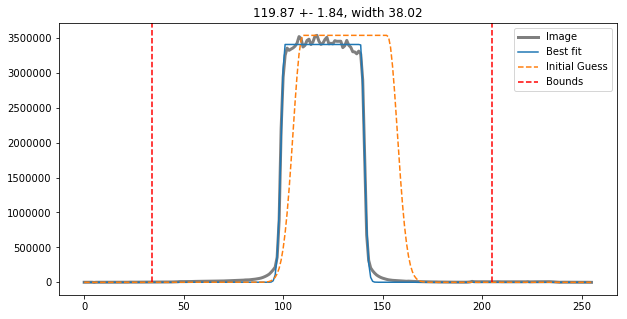

(array([[-30.656063  , -13.155399  , -26.478764  , ...,  -2.2888374 ,
        -41.50121   ,  -3.3835945 ],
       [ -1.0213661 , -17.443035  ,   3.4323769 , ...,  34.596935  ,
        -34.13959   ,  20.079235  ],
       [  2.7534828 ,  -7.9197655 , -39.623966  , ..., -11.898312  ,
         16.247997  ,  31.269695  ],
       ...,
       [-59.846935  ,  15.83601   ,  22.17052   , ...,  14.002346  ,
         29.782757  ,  19.536892  ],
       [-10.050938  , -33.18961   ,  -6.4332695 , ...,   0.29346848,
         52.55067   , -15.167484  ],
       [ 30.787907  ,  21.916546  , -21.798954  , ...,  20.39227   ,
          0.7621422 ,  38.87176   ]], dtype=float32), array([[1.00005887, 0.99631715, 1.01913849, ..., 1.01117496, 0.9857711 ,
        1.00169883],
       [1.0077967 , 1.00066505, 0.99113703, ..., 0.97842318, 0.98744521,
        0.98047949],
       [0.98492686, 0.9683537 , 0.97322563, ..., 0.98656412, 1.01614636,
        0.99626665],
       ...,
       [0.99159165, 0.96546904, 0.939439

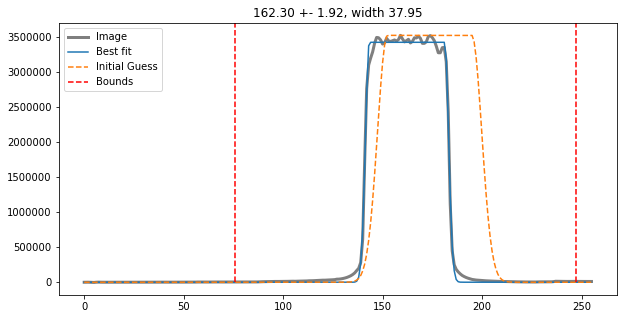

(array([[-22.453495  ,  67.78332   , -13.340019  , ..., -16.918549  ,
         14.352104  ,   4.5942535 ],
       [-17.136276  ,  30.439781  ,  11.41732   , ...,  26.175385  ,
        -11.436104  ,  23.546051  ],
       [ 25.935638  ,   9.7616005 , -14.639587  , ...,  -2.363617  ,
         36.15442   ,  34.01455   ],
       ...,
       [ -3.988823  ,   6.385544  ,  30.404617  , ...,  14.974503  ,
         23.996086  ,  12.479347  ],
       [ -2.64859   ,  18.404045  ,  19.150024  , ..., -10.466824  ,
         31.501266  , -27.68029   ],
       [ -2.237877  ,  35.0747    ,  -0.19224548, ..., -34.20269   ,
         20.573006  , -22.311378  ]], dtype=float32), array([[0.98118528, 0.99323157, 1.00366311, ..., 0.98204106, 0.9522191 ,
        0.97554738],
       [0.97276955, 0.98545687, 1.00024228, ..., 0.99504684, 0.98786921,
        0.98946573],
       [1.01984942, 1.02008576, 0.99551588, ..., 0.97861723, 0.98087129,
        0.98033262],
       ...,
       [0.95235794, 0.96168618, 1.000953

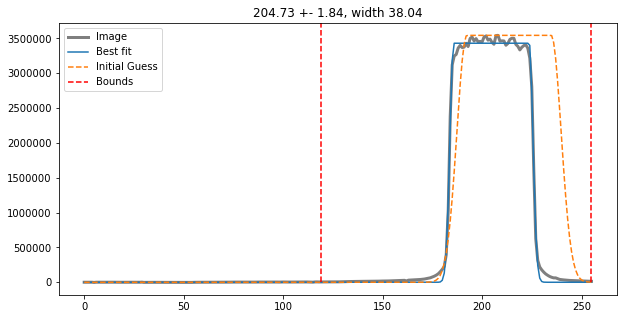

(array([[ -7.7959366, -12.580963 ,  -3.7980537, ...,  36.52359  ,
        -44.62993  , -24.746815 ],
       [ 16.527893 ,   3.6563988,  16.862862 , ...,  17.72567  ,
        -20.083721 ,  37.264122 ],
       [  9.6092   ,   4.688408 ,  29.949165 , ...,  21.79889  ,
        -35.147026 ,  -3.6155434],
       ...,
       [ 27.064926 , -28.479372 ,  13.595772 , ..., -11.447296 ,
         53.336227 , -20.462975 ],
       [ 38.89186  ,  29.974434 ,   8.235115 , ...,  39.831543 ,
         46.67476  ,   5.2354507],
       [ 39.76876  ,  26.763916 ,  32.828033 , ...,  39.55761  ,
         21.659187 ,  27.581512 ]], dtype=float32), array([[1.01551701, 0.9995939 , 1.0131288 , ..., 0.99402601, 0.99839718,
        1.0051168 ],
       [0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       ...,
       [0.99049433, 0.98990652, 1.01802076, ..., 0.98726069, 0.99180205,
   

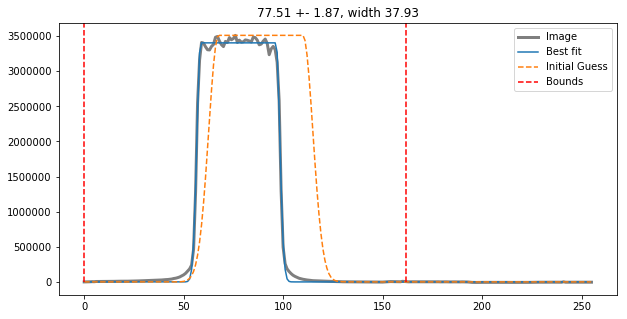

(array([[ 10.035591 , -13.81591  ,  51.411118 , ...,  -6.3200455,
        -44.63111  , -13.981895 ],
       [ -6.345833 ,  29.113838 , -21.76339  , ..., -14.982826 ,
        -40.554512 ,  50.10469  ],
       [ 38.59034  ,  19.23687  ,  34.63421  , ..., -14.8782425,
         -3.3278427, -14.506355 ],
       ...,
       [-24.115288 , -13.387596 ,  -8.074211 , ...,  -9.047722 ,
          1.4795151,  21.358864 ],
       [ 14.668312 , -19.502098 , -62.25689  , ...,   2.2018204,
          8.196968 ,   5.61985  ],
       [  1.4895706,  47.22193  , -16.621483 , ...,   5.327751 ,
          4.907875 ,  -1.9659653]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.01597487, 0.99097391, 1.00108907, ..., 1.0139594 , 0.99567206,
   

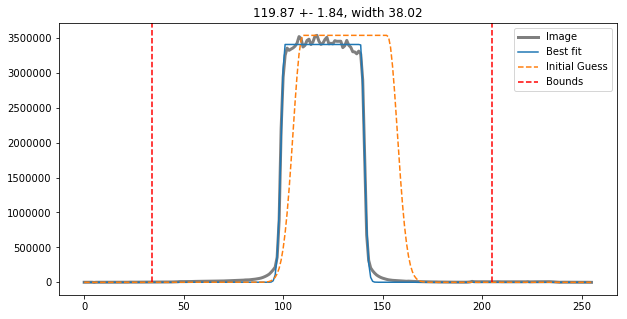

(array([[-30.656063  , -13.155399  , -26.478764  , ...,  -2.2888374 ,
        -41.50121   ,  -3.3835945 ],
       [ -1.0213661 , -17.443035  ,   3.4323769 , ...,  34.596935  ,
        -34.13959   ,  20.079235  ],
       [  2.7534828 ,  -7.9197655 , -39.623966  , ..., -11.898312  ,
         16.247997  ,  31.269695  ],
       ...,
       [-59.846935  ,  15.83601   ,  22.17052   , ...,  14.002346  ,
         29.782757  ,  19.536892  ],
       [-10.050938  , -33.18961   ,  -6.4332695 , ...,   0.29346848,
         52.55067   , -15.167484  ],
       [ 30.787907  ,  21.916546  , -21.798954  , ...,  20.39227   ,
          0.7621422 ,  38.87176   ]], dtype=float32), array([[1.00005887, 0.99631715, 1.01913849, ..., 1.01117496, 0.9857711 ,
        1.00169883],
       [1.0077967 , 1.00066505, 0.99113703, ..., 0.97842318, 0.98744521,
        0.98047949],
       [0.98492686, 0.9683537 , 0.97322563, ..., 0.98656412, 1.01614636,
        0.99626665],
       ...,
       [0.99159165, 0.96546904, 0.939439

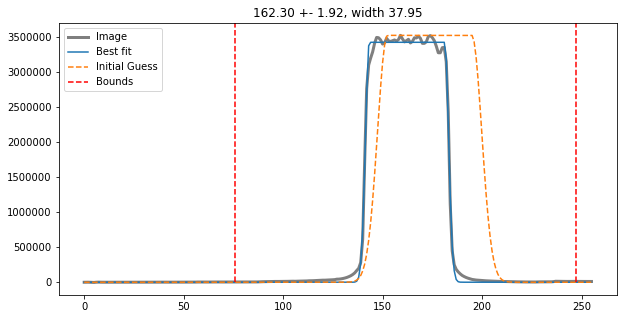

(array([[-22.453495  ,  67.78332   , -13.340019  , ..., -16.918549  ,
         14.352104  ,   4.5942535 ],
       [-17.136276  ,  30.439781  ,  11.41732   , ...,  26.175385  ,
        -11.436104  ,  23.546051  ],
       [ 25.935638  ,   9.7616005 , -14.639587  , ...,  -2.363617  ,
         36.15442   ,  34.01455   ],
       ...,
       [ -3.988823  ,   6.385544  ,  30.404617  , ...,  14.974503  ,
         23.996086  ,  12.479347  ],
       [ -2.64859   ,  18.404045  ,  19.150024  , ..., -10.466824  ,
         31.501266  , -27.68029   ],
       [ -2.237877  ,  35.0747    ,  -0.19224548, ..., -34.20269   ,
         20.573006  , -22.311378  ]], dtype=float32), array([[0.98118528, 0.99323157, 1.00366311, ..., 0.98204106, 0.9522191 ,
        0.97554738],
       [0.97276955, 0.98545687, 1.00024228, ..., 0.99504684, 0.98786921,
        0.98946573],
       [1.01984942, 1.02008576, 0.99551588, ..., 0.97861723, 0.98087129,
        0.98033262],
       ...,
       [0.95235794, 0.96168618, 1.000953

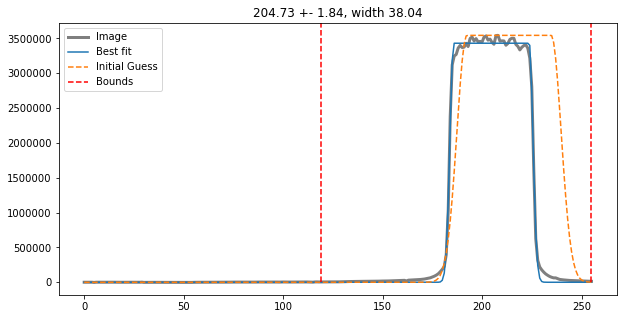

(array([[ -7.7959366, -12.580963 ,  -3.7980537, ...,  36.52359  ,
        -44.62993  , -24.746815 ],
       [ 16.527893 ,   3.6563988,  16.862862 , ...,  17.72567  ,
        -20.083721 ,  37.264122 ],
       [  9.6092   ,   4.688408 ,  29.949165 , ...,  21.79889  ,
        -35.147026 ,  -3.6155434],
       ...,
       [ 27.064926 , -28.479372 ,  13.595772 , ..., -11.447296 ,
         53.336227 , -20.462975 ],
       [ 38.89186  ,  29.974434 ,   8.235115 , ...,  39.831543 ,
         46.67476  ,   5.2354507],
       [ 39.76876  ,  26.763916 ,  32.828033 , ...,  39.55761  ,
         21.659187 ,  27.581512 ]], dtype=float32), array([[1.01551701, 0.9995939 , 1.0131288 , ..., 0.99402601, 0.99839718,
        1.0051168 ],
       [0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       ...,
       [0.99049433, 0.98990652, 1.01802076, ..., 0.98726069, 0.99180205,
   

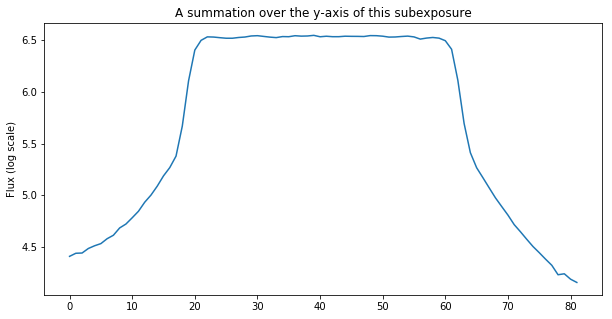

The difference between the two edges (for a 5-pixel bin for all subexps is): 1751.8947916666666
This value may not be larger than  4423.895357412213  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Using flux for variance estimate
Extracting spectrum with optimal extraction...
1255778.3221401249 pl 1255778.3221401249 41.68823
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


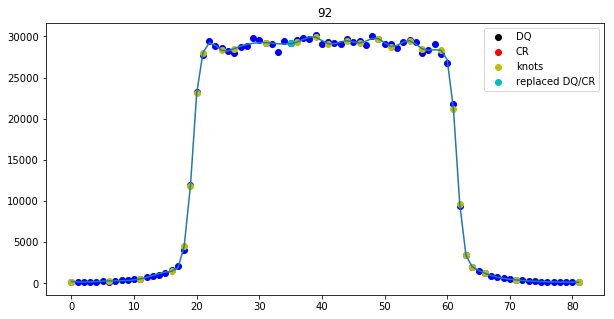

1285469.0787865391 pl 1285469.0787865391 41.199024
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


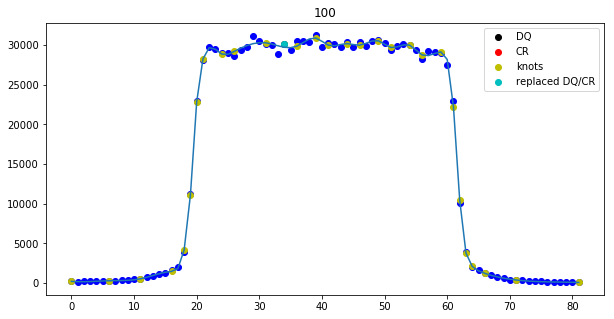

1275977.3351331598 pl 1275977.3351331598 41.35616
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


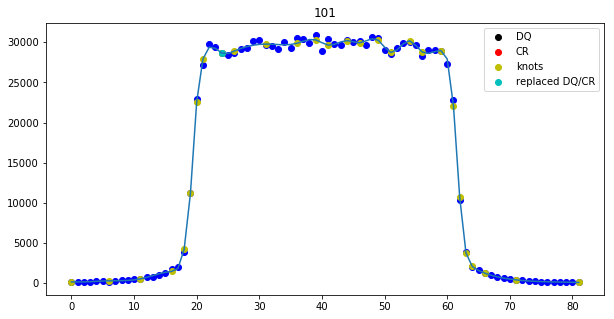

Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 2
nr. of CRs 1193
Spectrum located at pixel 124 in spatial direction
subexp 119.87344897706078 [204, 162, 120, 78]
ypix is 120 for exposure 1


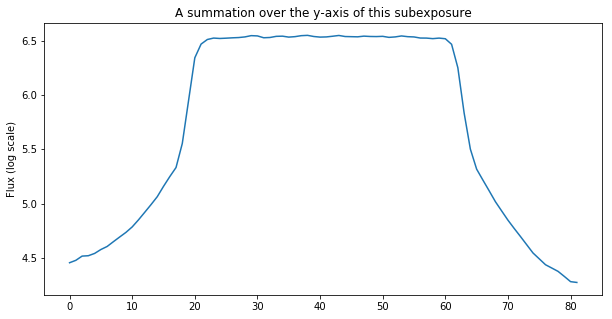

The difference between the two edges (for a 5-pixel bin for all subexps is): 1496.6643229166666
This value may not be larger than  4438.431674965081  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1267756.2869070312 pl 1267756.2869070312 40.95737
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


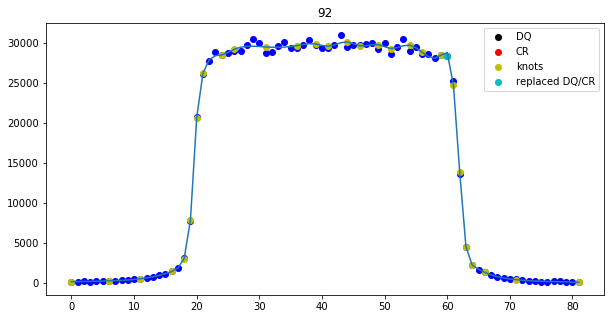

1293677.049132865 pl 1293677.049132865 41.29189
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


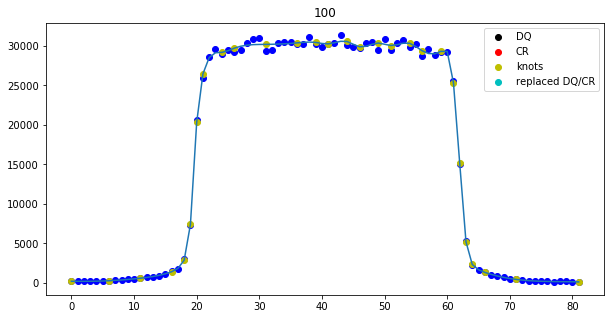

1284405.7549425685 pl 1284405.7549425685 40.9756
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


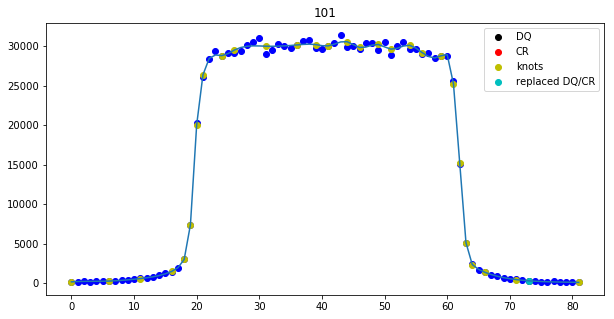

187 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 8, 9]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 3
nr. of CRs 1187
Spectrum located at pixel 124 in spatial direction
subexp 162.30185369724393 [204, 162, 120, 78]
ypix is 162 for exposure 2


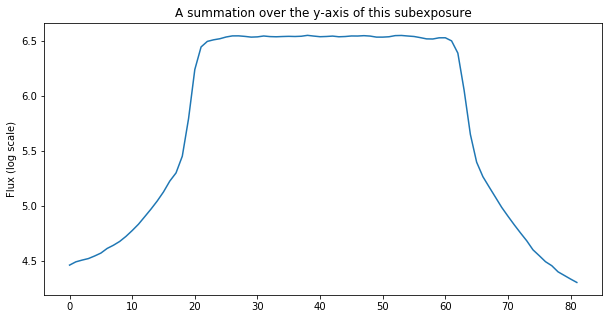

The difference between the two edges (for a 5-pixel bin for all subexps is): 1454.4065104166666
This value may not be larger than  4460.534616687406  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1286307.8037936732 pl 1286307.8037936732 41.830025
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


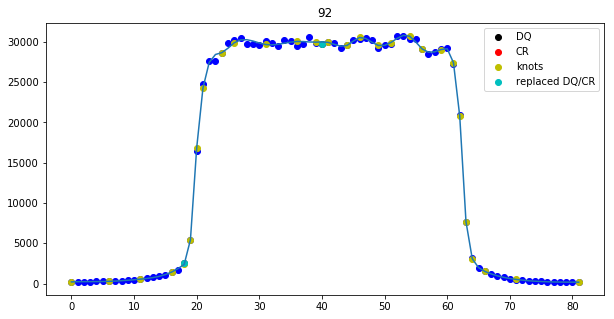

1307246.6831096464 pl 1307246.6831096464 41.9032
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


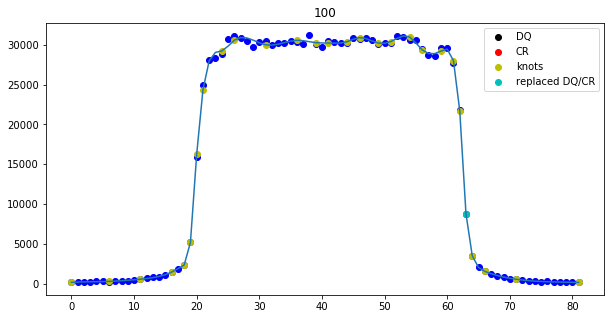

1297640.8098937504 pl 1297640.8098937504 41.682903
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


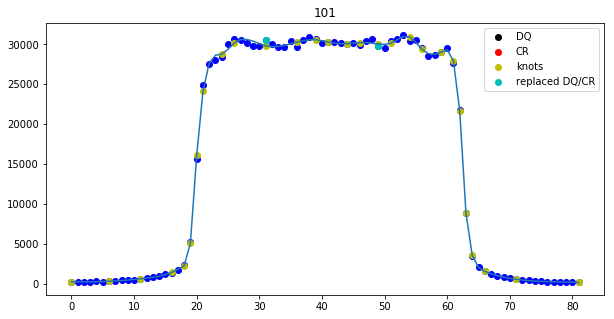

192 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 4
nr. of CRs 1171
Spectrum located at pixel 124 in spatial direction
subexp 204.72945584558846 [204, 162, 120, 78]
ypix is 204 for exposure 3


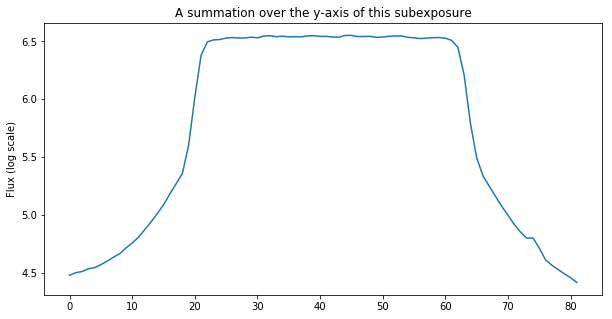

The difference between the two edges (for a 5-pixel bin for all subexps is): 750.2736979166667
This value may not be larger than  4463.369131048877  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1297841.8124276954 pl 1297841.8124276954 41.515945
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


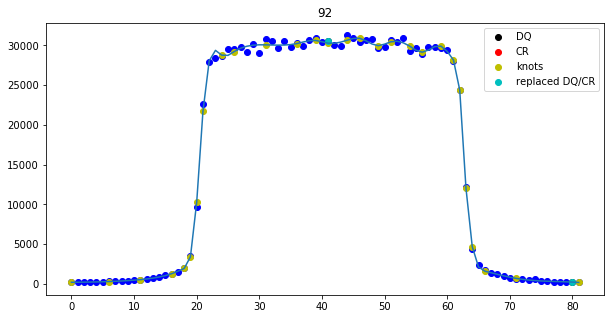

1307999.086853591 pl 1307999.086853591 41.61377
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


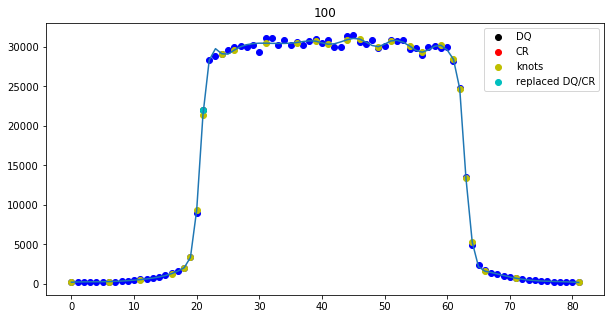

1303168.510510635 pl 1303168.510510635 41.474907
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


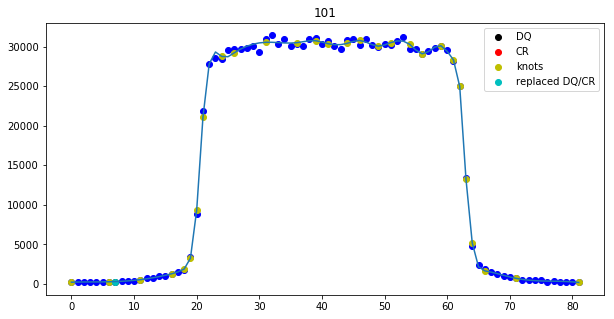

194 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Applied an xshift of 0.0538947854965 pix compared to reference (reduced) spectrum ie9301bhq
Shifted subexposure nr. 0 with -1.07496196223 pixels and shrunk 0.661642186029 percent.
Shifted subexposure nr. 1 with -0.77695001114 pixels and shrunk 0.458325204381 percent.
Shifted subexposure nr. 2 with -0.343344270549 pixels and shrunk 0.219935832527 percent.
Saving spectrum to /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/ie9301byq_spec.txt
Extraction took 2.56s
########################################
###########Finished Extraction##########
########################################
ie9301byq
########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_

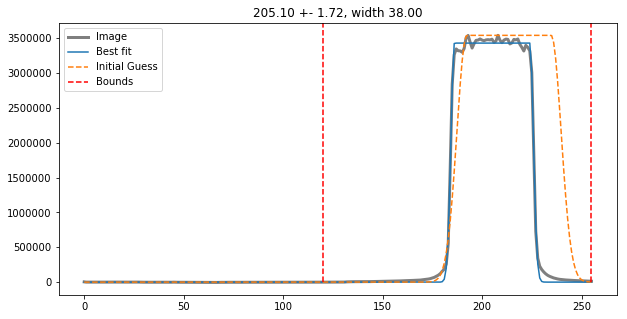

(array([[ -2.359848  , -12.306808  ,  13.191177  , ...,  23.76796   ,
         15.093582  ,  27.928879  ],
       [  6.3293304 ,  38.2274    ,   0.40733337, ...,  50.328156  ,
         -4.528595  ,   0.07087708],
       [-25.379898  ,  36.026657  ,  31.981674  , ...,  25.743088  ,
        -13.520096  ,  15.363541  ],
       ...,
       [ 13.225327  ,   0.25486755,   5.1171417 , ...,  37.8936    ,
         50.15564   , -10.654022  ],
       [ 22.37584   ,  62.087845  ,  21.866486  , ...,  43.11003   ,
        -18.034271  ,  58.873108  ],
       [ -5.075577  ,  31.198036  ,  11.856781  , ...,  62.87285   ,
         52.168625  ,  38.775803  ]], dtype=float32), array([[0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       [1.01465568, 1.01152106, 0.97465585, ..., 0.99614412, 0.99226877,
        0.99630135],
       ...,
       [0.99049433, 0.98990652, 1.018020

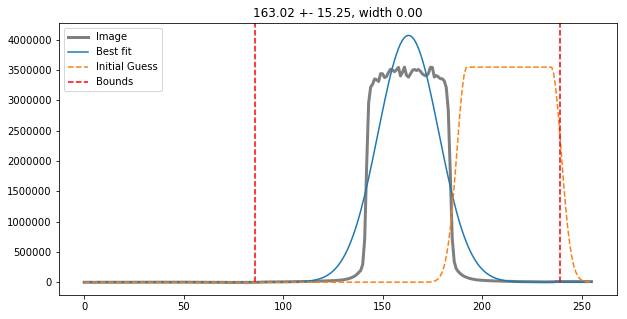

(array([[-32.19913   ,  53.694546  ,  30.152126  , ...,  22.704388  ,
        -28.12125   , -14.38213   ],
       [ 37.94174   ,  41.003017  ,  27.820034  , ...,  32.71603   ,
         16.310009  ,  20.01942   ],
       [ 43.737118  ,  37.77609   ,  43.777523  , ...,  12.45068   ,
         74.32521   , -33.901066  ],
       ...,
       [  8.870922  ,  -9.529453  ,   1.4436226 , ..., -11.055958  ,
        -29.915577  ,   9.120701  ],
       [ 17.142147  ,  39.358685  ,  22.407742  , ..., -25.608799  ,
         -4.8114204 ,  34.773098  ],
       [  2.4196014 , -16.76366   ,  16.74088   , ...,  24.697407  ,
          5.3028755 ,   0.65415573]], dtype=float32), array([[0.97797824, 1.01717404, 1.02369336, ..., 0.97947431, 0.99055837,
        0.97462096],
       [0.86756175, 1.00057105, 1.00078321, ..., 0.98511468, 0.98741866,
        0.97093693],
       [1.04421316, 1.00141875, 0.96262652, ..., 0.98749226, 1.01309426,
        0.9847939 ],
       ...,
       [0.98067773, 1.00647348, 0.980752

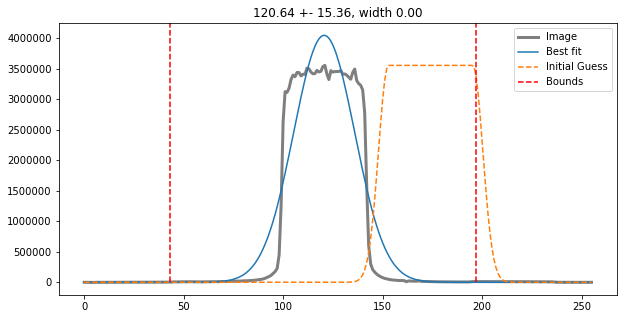

(array([[-16.261494 ,  19.89555  ,  -4.9254494, ..., -10.793148 ,
         -1.2874565,  15.722843 ],
       [ 55.567516 ,  16.770367 ,  45.28773  , ...,   8.265041 ,
        -10.11816  ,  37.944492 ],
       [ 16.23074  ,  17.422253 ,  23.043697 , ...,  33.232952 ,
        -12.800343 ,  23.893917 ],
       ...,
       [ 27.383663 , -26.941685 ,  38.315166 , ...,  20.766216 ,
         -9.864197 ,   3.3814316],
       [ -6.8227425, -22.28004  , -37.9005   , ...,  18.25848  ,
         21.101254 ,  26.90739  ],
       [  1.2389336,  12.090328 ,  40.65121  , ...,  -1.5828705,
         12.348621 ,  34.714863 ]], dtype=float32), array([[0.99152216, 0.98206137, 0.98798856, ..., 0.9900434 , 0.97864713,
        0.99251526],
       [1.0128799 , 0.96209698, 1.03174513, ..., 1.00765806, 0.99389191,
        0.98775042],
       [0.99974451, 0.98079478, 0.99440176, ..., 0.99625174, 0.9890361 ,
        0.95858532],
       ...,
       [1.03185068, 1.00088005, 0.98926224, ..., 0.98714183, 0.9753993 ,
   

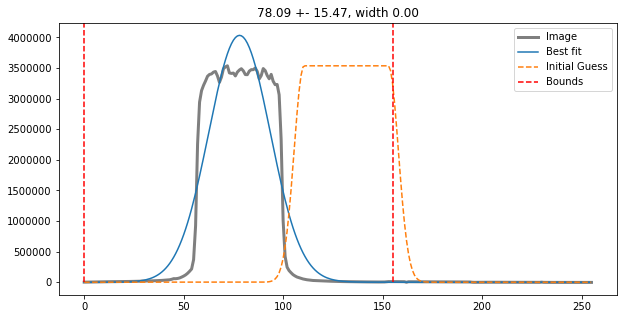

(array([[ 10.429237 ,  18.490593 ,  39.686256 , ...,  10.35965  ,
         -0.9241791, -40.45692  ],
       [ -2.2466278,   5.4231567,  27.392899 , ...,   0.7843704,
         23.268066 , -48.437836 ],
       [-23.081905 ,  -7.7127495,  16.458115 , ...,  16.095245 ,
        -33.421585 ,   5.3216248],
       ...,
       [ -4.496399 ,   9.208336 ,  10.939308 , ...,  11.640198 ,
         -2.6425858,   2.533783 ],
       [ 14.273788 ,  26.51445  ,  20.435661 , ...,  17.977257 ,
         10.530403 , -67.81437  ],
       [-17.125908 ,  16.75978  , -10.8959465, ...,  13.2808075,
         23.790878 , -33.635204 ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.03028248, 1.00843969, 1.01427215, ..., 1.00247373, 0.98736319,
   

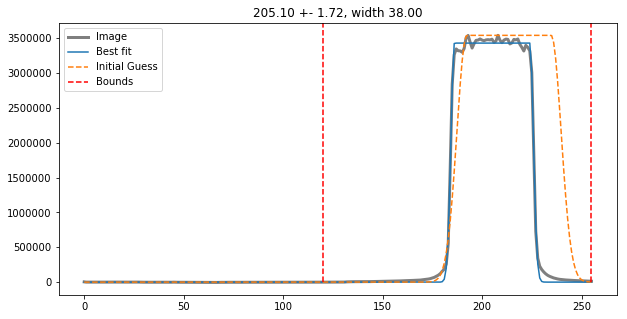

(array([[ -2.359848  , -12.306808  ,  13.191177  , ...,  23.76796   ,
         15.093582  ,  27.928879  ],
       [  6.3293304 ,  38.2274    ,   0.40733337, ...,  50.328156  ,
         -4.528595  ,   0.07087708],
       [-25.379898  ,  36.026657  ,  31.981674  , ...,  25.743088  ,
        -13.520096  ,  15.363541  ],
       ...,
       [ 13.225327  ,   0.25486755,   5.1171417 , ...,  37.8936    ,
         50.15564   , -10.654022  ],
       [ 22.37584   ,  62.087845  ,  21.866486  , ...,  43.11003   ,
        -18.034271  ,  58.873108  ],
       [ -5.075577  ,  31.198036  ,  11.856781  , ...,  62.87285   ,
         52.168625  ,  38.775803  ]], dtype=float32), array([[0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       [1.01465568, 1.01152106, 0.97465585, ..., 0.99614412, 0.99226877,
        0.99630135],
       ...,
       [0.99049433, 0.98990652, 1.018020

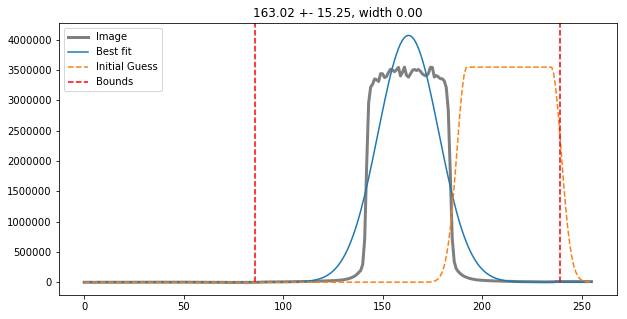

(array([[-32.19913   ,  53.694546  ,  30.152126  , ...,  22.704388  ,
        -28.12125   , -14.38213   ],
       [ 37.94174   ,  41.003017  ,  27.820034  , ...,  32.71603   ,
         16.310009  ,  20.01942   ],
       [ 43.737118  ,  37.77609   ,  43.777523  , ...,  12.45068   ,
         74.32521   , -33.901066  ],
       ...,
       [  8.870922  ,  -9.529453  ,   1.4436226 , ..., -11.055958  ,
        -29.915577  ,   9.120701  ],
       [ 17.142147  ,  39.358685  ,  22.407742  , ..., -25.608799  ,
         -4.8114204 ,  34.773098  ],
       [  2.4196014 , -16.76366   ,  16.74088   , ...,  24.697407  ,
          5.3028755 ,   0.65415573]], dtype=float32), array([[0.97797824, 1.01717404, 1.02369336, ..., 0.97947431, 0.99055837,
        0.97462096],
       [0.86756175, 1.00057105, 1.00078321, ..., 0.98511468, 0.98741866,
        0.97093693],
       [1.04421316, 1.00141875, 0.96262652, ..., 0.98749226, 1.01309426,
        0.9847939 ],
       ...,
       [0.98067773, 1.00647348, 0.980752

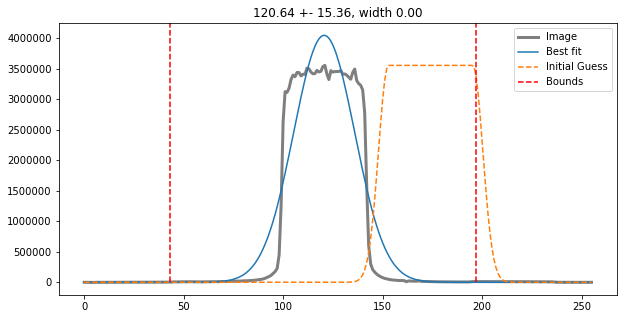

(array([[-16.261494 ,  19.89555  ,  -4.9254494, ..., -10.793148 ,
         -1.2874565,  15.722843 ],
       [ 55.567516 ,  16.770367 ,  45.28773  , ...,   8.265041 ,
        -10.11816  ,  37.944492 ],
       [ 16.23074  ,  17.422253 ,  23.043697 , ...,  33.232952 ,
        -12.800343 ,  23.893917 ],
       ...,
       [ 27.383663 , -26.941685 ,  38.315166 , ...,  20.766216 ,
         -9.864197 ,   3.3814316],
       [ -6.8227425, -22.28004  , -37.9005   , ...,  18.25848  ,
         21.101254 ,  26.90739  ],
       [  1.2389336,  12.090328 ,  40.65121  , ...,  -1.5828705,
         12.348621 ,  34.714863 ]], dtype=float32), array([[0.99152216, 0.98206137, 0.98798856, ..., 0.9900434 , 0.97864713,
        0.99251526],
       [1.0128799 , 0.96209698, 1.03174513, ..., 1.00765806, 0.99389191,
        0.98775042],
       [0.99974451, 0.98079478, 0.99440176, ..., 0.99625174, 0.9890361 ,
        0.95858532],
       ...,
       [1.03185068, 1.00088005, 0.98926224, ..., 0.98714183, 0.9753993 ,
   

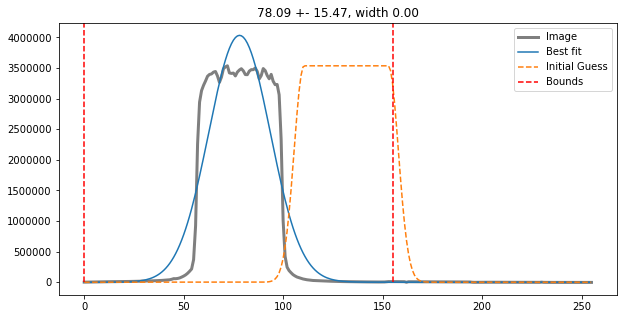

(array([[ 10.429237 ,  18.490593 ,  39.686256 , ...,  10.35965  ,
         -0.9241791, -40.45692  ],
       [ -2.2466278,   5.4231567,  27.392899 , ...,   0.7843704,
         23.268066 , -48.437836 ],
       [-23.081905 ,  -7.7127495,  16.458115 , ...,  16.095245 ,
        -33.421585 ,   5.3216248],
       ...,
       [ -4.496399 ,   9.208336 ,  10.939308 , ...,  11.640198 ,
         -2.6425858,   2.533783 ],
       [ 14.273788 ,  26.51445  ,  20.435661 , ...,  17.977257 ,
         10.530403 , -67.81437  ],
       [-17.125908 ,  16.75978  , -10.8959465, ...,  13.2808075,
         23.790878 , -33.635204 ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.03028248, 1.00843969, 1.01427215, ..., 1.00247373, 0.98736319,
   

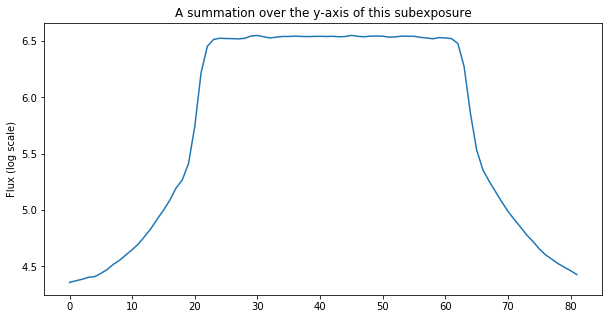

The difference between the two edges (for a 5-pixel bin for all subexps is): 830.8388020833333
This value may not be larger than  4441.24715217096  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Using flux for variance estimate
Extracting spectrum with optimal extraction...
1284919.565612427 pl 1284919.565612427 41.33275
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


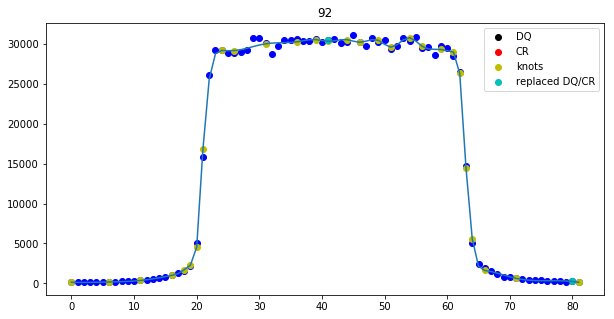

1296437.8885311328 pl 1296437.8885311328 41.184895
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


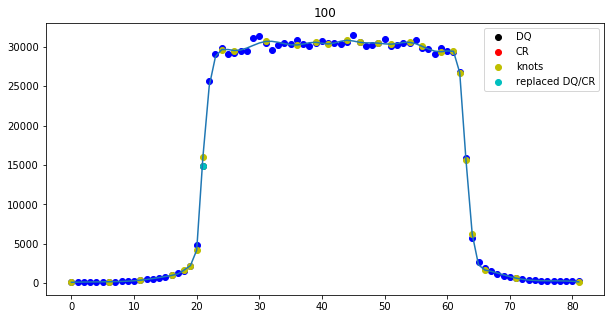

1290223.4828316197 pl 1290223.4828316197 41.444107
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


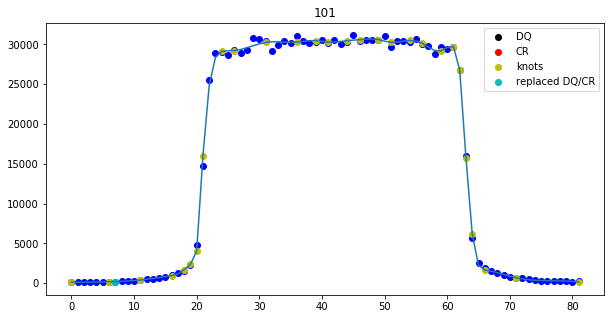

195 successes out of 200 total fits
Optimal extraction fitting failed for columns: [2, 3]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 2
nr. of CRs 1201
Spectrum located at pixel 124 in spatial direction
subexp 163.02462530548908 [204, 162, 120, 78]
ypix is 162 for exposure 1


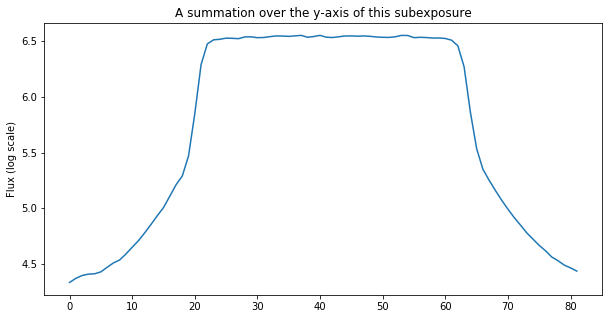

The difference between the two edges (for a 5-pixel bin for all subexps is): 1008.9057291666667
This value may not be larger than  4443.251902229567  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1275763.590530791 pl 1275763.590530791 41.147285
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


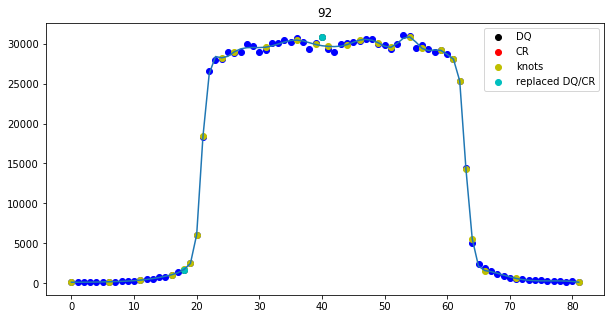

1297848.6379293934 pl 1297848.6379293934 41.15321
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


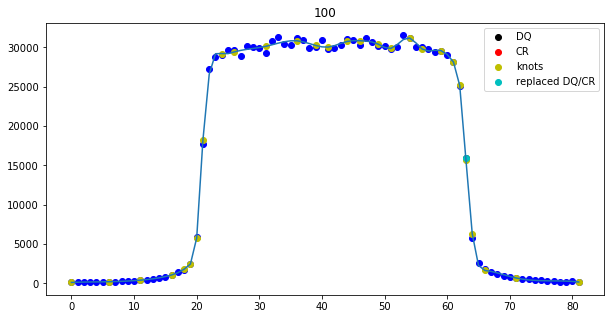

1287102.6758104775 pl 1287102.6758104775 40.918964
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


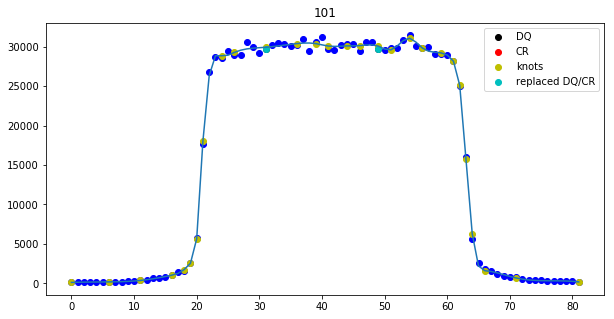

195 successes out of 200 total fits
Optimal extraction fitting failed for columns: [1, 3]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 3
nr. of CRs 1239
Spectrum located at pixel 124 in spatial direction
subexp 120.63851597729206 [204, 162, 120, 78]
ypix is 120 for exposure 2


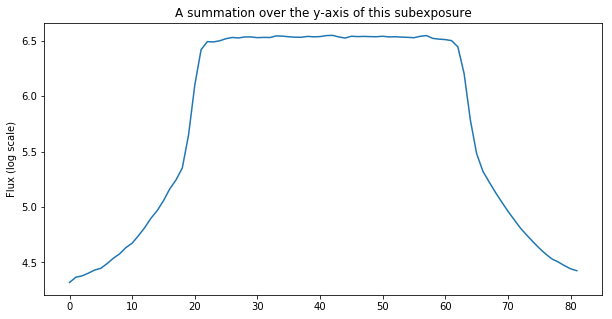

The difference between the two edges (for a 5-pixel bin for all subexps is): 912.6684895833333
This value may not be larger than  4443.121545340243  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1268645.7812035142 pl 1268645.7812035142 41.09923
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


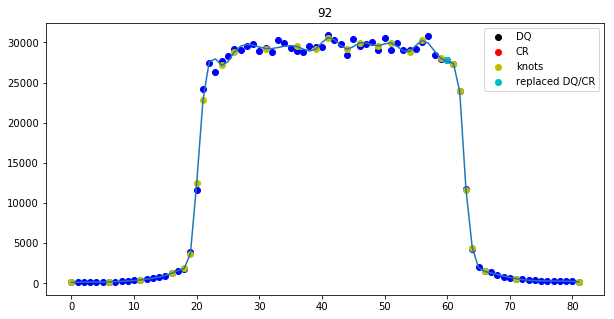

1296791.1104626867 pl 1296791.1104626867 41.23599
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


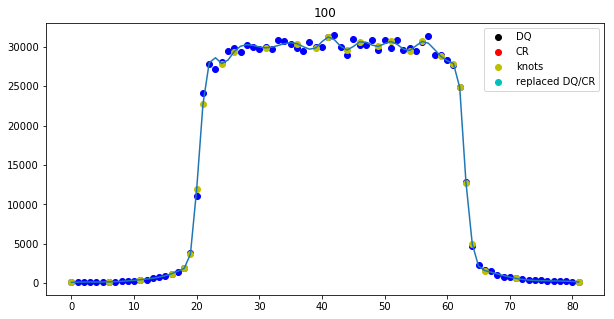

1288659.577123985 pl 1288659.577123985 41.387146
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


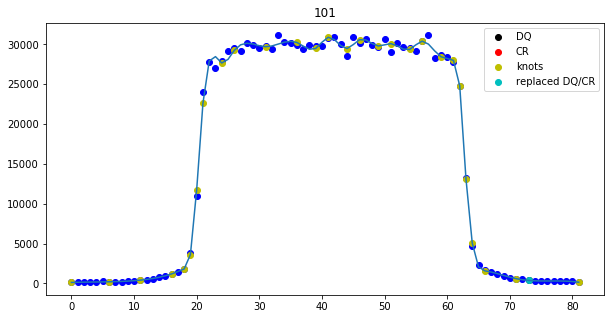

184 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 4
nr. of CRs 1239
Spectrum located at pixel 124 in spatial direction
subexp 78.08765006869473 [204, 162, 120, 78]
ypix is 78 for exposure 3


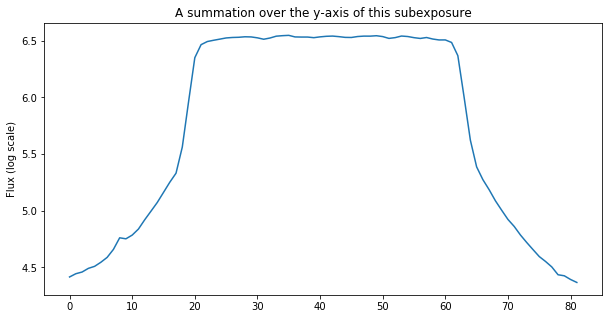

The difference between the two edges (for a 5-pixel bin for all subexps is): 602.9846354166667
This value may not be larger than  4443.2156523550975  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1266506.957747828 pl 1266506.957747828 41.812897
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


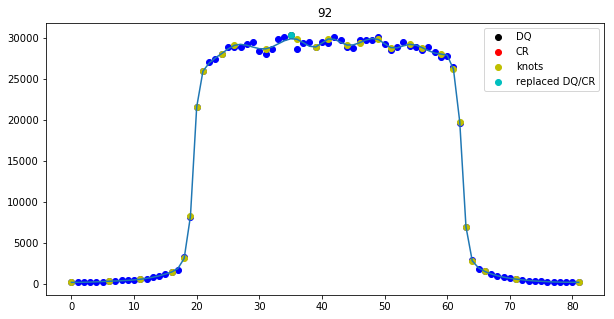

1295657.6906900797 pl 1295657.6906900797 41.53338
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


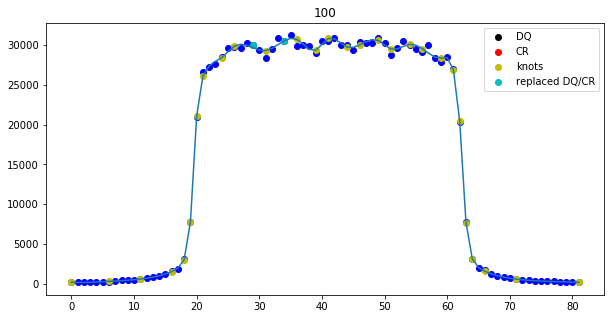

1286205.6511894818 pl 1286205.6511894818 41.357677
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


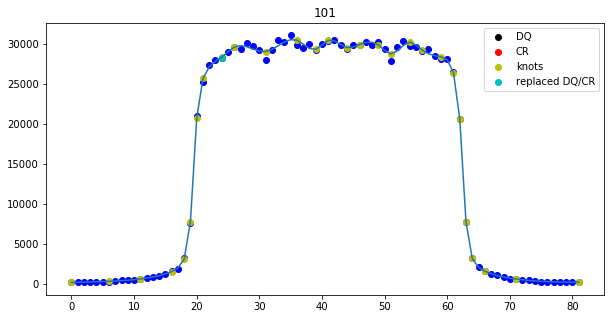

Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Applied an xshift of 0.0622921337968 pix compared to reference (reduced) spectrum ie9301bhq
Shifted subexposure nr. 1 with -0.374142362288 pixels and shrunk 0.23213070074 percent.
Shifted subexposure nr. 2 with -0.757720326333 pixels and shrunk 0.450399796505 percent.
Shifted subexposure nr. 3 with -1.11652981976 pixels and shrunk 0.674508079772 percent.
Saving spectrum to /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/ie9301bzq_spec.txt
Extraction took 2.60s
########################################
###########Finished Extraction##########
########################################
ie9301bzq
########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/s.baratuva.nl/Desktop/PhD/hst_data_anal

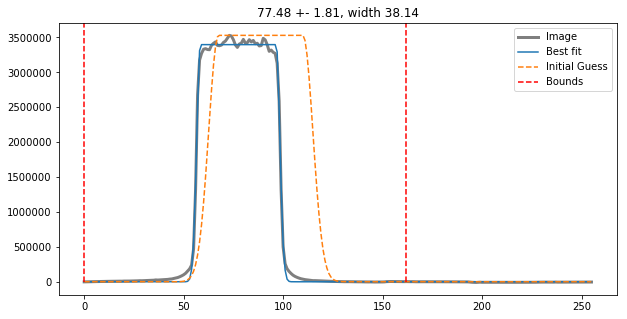

(array([[  9.081375 , -35.878586 ,  -3.48674  , ..., -14.311981 ,
        -57.300537 , -82.77283  ],
       [  9.118469 ,   9.394669 , -43.825928 , ...,  -6.606827 ,
        -27.50087  , -23.364532 ],
       [ 30.602264 ,  -7.5168304,   3.189972 , ..., -11.178268 ,
        -20.674759 ,  -3.7915802],
       ...,
       [-25.084274 ,  -9.675522 , -18.407578 , ...,  -2.8887482,
         33.568726 , -31.416153 ],
       [-26.095901 ,  -6.4256744,  21.048203 , ...,   8.358536 ,
        -28.078476 , -23.583206 ],
       [-11.183609 , -16.9525   , -12.907608 , ...,  -9.730759 ,
        -33.723312 ,  -7.592987 ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.01597487, 0.99097391, 1.00108907, ..., 1.0139594 , 0.99567206,
   

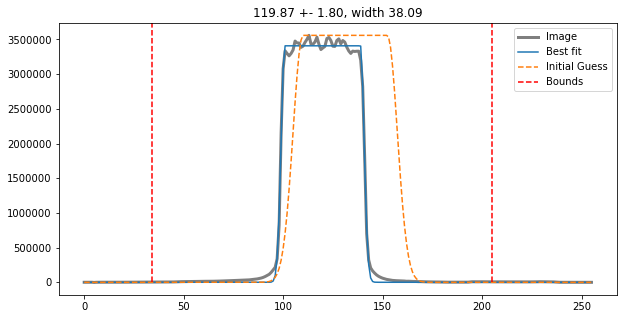

(array([[-19.060291 ,  21.896313 , -17.228085 , ...,   4.5902367,
         23.839733 ,  50.26466  ],
       [ 50.448116 ,  -8.19286  , -22.49908  , ..., -28.678715 ,
        -15.56789  , -15.133228 ],
       [ 26.076756 ,  24.785038 ,   2.4632912, ...,  25.379826 ,
         16.11137  , -15.635815 ],
       ...,
       [ 40.686375 ,   3.99551  ,  -1.3756142, ...,  56.31312  ,
          8.442287 ,   5.268612 ],
       [ 24.931591 ,  15.838436 ,   5.137783 , ...,  16.671642 ,
          5.278515 ,  10.641872 ],
       [-23.192616 ,  35.82826  , -12.569065 , ..., -24.522282 ,
         26.571499 ,  -3.6868477]], dtype=float32), array([[1.00005887, 0.99631715, 1.01913849, ..., 1.01117496, 0.9857711 ,
        1.00169883],
       [1.0077967 , 1.00066505, 0.99113703, ..., 0.97842318, 0.98744521,
        0.98047949],
       [0.98492686, 0.9683537 , 0.97322563, ..., 0.98656412, 1.01614636,
        0.99626665],
       ...,
       [0.99159165, 0.96546904, 0.93943933, ..., 0.99333385, 0.98981972,
   

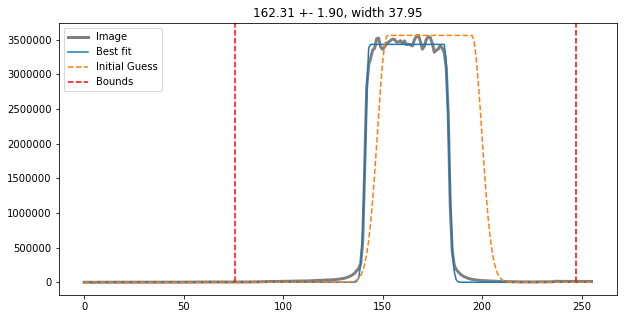

(array([[  2.590622 , -17.414276 ,   9.358967 , ..., -69.13023  ,
          6.5733566, -17.216805 ],
       [ -6.164795 ,   8.573067 ,  15.351334 , ...,  76.858345 ,
         25.215828 , -16.97261  ],
       [ 11.106232 ,  16.041069 ,   5.713379 , ...,  -3.1276054,
         -9.041801 ,  58.973167 ],
       ...,
       [ 21.002281 ,   7.9647446, -21.860924 , ...,  56.665504 ,
        -26.256516 ,  37.668793 ],
       [ 31.70665  ,  17.64209  , -19.069672 , ...,  10.006111 ,
         18.97181  , -23.709023 ],
       [ 53.18728  ,  13.242462 ,  24.799294 , ...,  -9.013916 ,
         24.54412  ,  -1.8376846]], dtype=float32), array([[0.98118528, 0.99323157, 1.00366311, ..., 0.98204106, 0.9522191 ,
        0.97554738],
       [0.97276955, 0.98545687, 1.00024228, ..., 0.99504684, 0.98786921,
        0.98946573],
       [1.01984942, 1.02008576, 0.99551588, ..., 0.97861723, 0.98087129,
        0.98033262],
       ...,
       [0.95235794, 0.96168618, 1.00095344, ..., 0.98480437, 0.99359909,
   

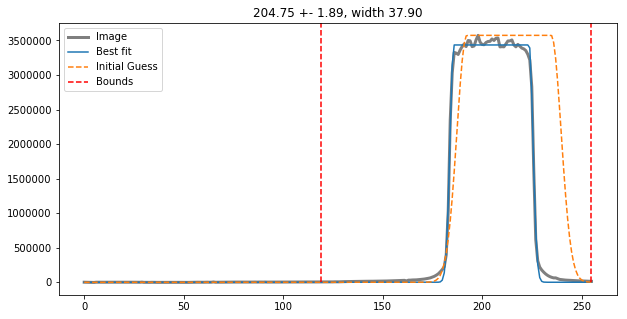

(array([[ 44.509796 , -40.026005 ,   3.940979 , ...,  -9.558472 ,
         19.199196 ,   6.3433723],
       [ -3.8809738, -14.406113 ,  24.601715 , ..., -19.001492 ,
        -12.379086 ,  19.24443  ],
       [ 26.730026 ,   7.7372475,  35.34294  , ...,  45.872276 ,
         56.745697 , -12.281021 ],
       ...,
       [ 16.053734 , -11.396957 , -18.487537 , ...,  36.42917  ,
         49.344353 ,  46.274185 ],
       [ 34.904037 , -13.814159 ,  -2.7777367, ...,  40.556694 ,
         37.968674 ,  36.608467 ],
       [  5.3457985, -31.071869 ,  14.792091 , ...,  54.42788  ,
         15.310959 ,  21.234291 ]], dtype=float32), array([[1.01551701, 0.9995939 , 1.0131288 , ..., 0.99402601, 0.99839718,
        1.0051168 ],
       [0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       ...,
       [0.99049433, 0.98990652, 1.01802076, ..., 0.98726069, 0.99180205,
   

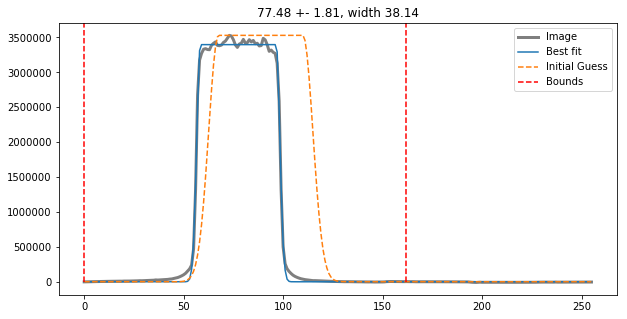

(array([[  9.081375 , -35.878586 ,  -3.48674  , ..., -14.311981 ,
        -57.300537 , -82.77283  ],
       [  9.118469 ,   9.394669 , -43.825928 , ...,  -6.606827 ,
        -27.50087  , -23.364532 ],
       [ 30.602264 ,  -7.5168304,   3.189972 , ..., -11.178268 ,
        -20.674759 ,  -3.7915802],
       ...,
       [-25.084274 ,  -9.675522 , -18.407578 , ...,  -2.8887482,
         33.568726 , -31.416153 ],
       [-26.095901 ,  -6.4256744,  21.048203 , ...,   8.358536 ,
        -28.078476 , -23.583206 ],
       [-11.183609 , -16.9525   , -12.907608 , ...,  -9.730759 ,
        -33.723312 ,  -7.592987 ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.01597487, 0.99097391, 1.00108907, ..., 1.0139594 , 0.99567206,
   

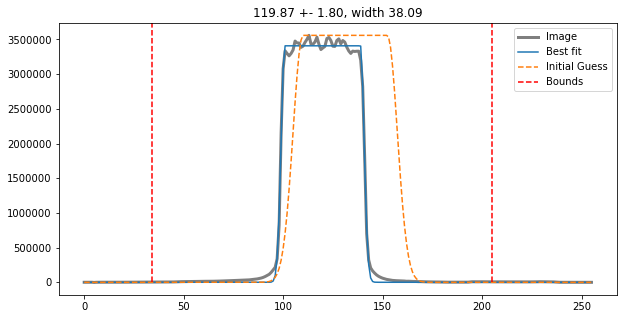

(array([[-19.060291 ,  21.896313 , -17.228085 , ...,   4.5902367,
         23.839733 ,  50.26466  ],
       [ 50.448116 ,  -8.19286  , -22.49908  , ..., -28.678715 ,
        -15.56789  , -15.133228 ],
       [ 26.076756 ,  24.785038 ,   2.4632912, ...,  25.379826 ,
         16.11137  , -15.635815 ],
       ...,
       [ 40.686375 ,   3.99551  ,  -1.3756142, ...,  56.31312  ,
          8.442287 ,   5.268612 ],
       [ 24.931591 ,  15.838436 ,   5.137783 , ...,  16.671642 ,
          5.278515 ,  10.641872 ],
       [-23.192616 ,  35.82826  , -12.569065 , ..., -24.522282 ,
         26.571499 ,  -3.6868477]], dtype=float32), array([[1.00005887, 0.99631715, 1.01913849, ..., 1.01117496, 0.9857711 ,
        1.00169883],
       [1.0077967 , 1.00066505, 0.99113703, ..., 0.97842318, 0.98744521,
        0.98047949],
       [0.98492686, 0.9683537 , 0.97322563, ..., 0.98656412, 1.01614636,
        0.99626665],
       ...,
       [0.99159165, 0.96546904, 0.93943933, ..., 0.99333385, 0.98981972,
   

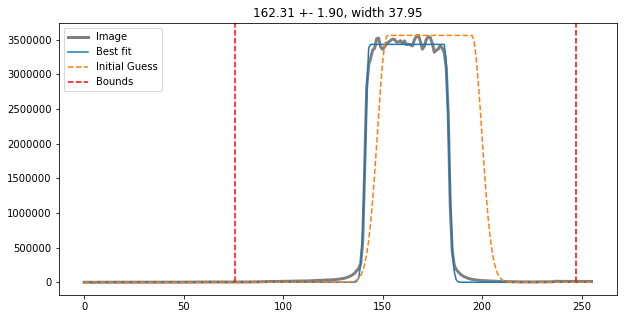

(array([[  2.590622 , -17.414276 ,   9.358967 , ..., -69.13023  ,
          6.5733566, -17.216805 ],
       [ -6.164795 ,   8.573067 ,  15.351334 , ...,  76.858345 ,
         25.215828 , -16.97261  ],
       [ 11.106232 ,  16.041069 ,   5.713379 , ...,  -3.1276054,
         -9.041801 ,  58.973167 ],
       ...,
       [ 21.002281 ,   7.9647446, -21.860924 , ...,  56.665504 ,
        -26.256516 ,  37.668793 ],
       [ 31.70665  ,  17.64209  , -19.069672 , ...,  10.006111 ,
         18.97181  , -23.709023 ],
       [ 53.18728  ,  13.242462 ,  24.799294 , ...,  -9.013916 ,
         24.54412  ,  -1.8376846]], dtype=float32), array([[0.98118528, 0.99323157, 1.00366311, ..., 0.98204106, 0.9522191 ,
        0.97554738],
       [0.97276955, 0.98545687, 1.00024228, ..., 0.99504684, 0.98786921,
        0.98946573],
       [1.01984942, 1.02008576, 0.99551588, ..., 0.97861723, 0.98087129,
        0.98033262],
       ...,
       [0.95235794, 0.96168618, 1.00095344, ..., 0.98480437, 0.99359909,
   

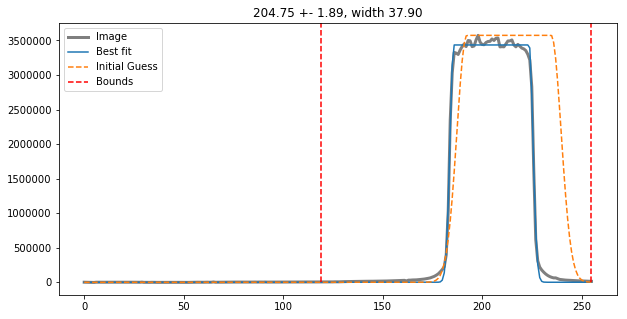

(array([[ 44.509796 , -40.026005 ,   3.940979 , ...,  -9.558472 ,
         19.199196 ,   6.3433723],
       [ -3.8809738, -14.406113 ,  24.601715 , ..., -19.001492 ,
        -12.379086 ,  19.24443  ],
       [ 26.730026 ,   7.7372475,  35.34294  , ...,  45.872276 ,
         56.745697 , -12.281021 ],
       ...,
       [ 16.053734 , -11.396957 , -18.487537 , ...,  36.42917  ,
         49.344353 ,  46.274185 ],
       [ 34.904037 , -13.814159 ,  -2.7777367, ...,  40.556694 ,
         37.968674 ,  36.608467 ],
       [  5.3457985, -31.071869 ,  14.792091 , ...,  54.42788  ,
         15.310959 ,  21.234291 ]], dtype=float32), array([[1.01551701, 0.9995939 , 1.0131288 , ..., 0.99402601, 0.99839718,
        1.0051168 ],
       [0.98653099, 0.97552589, 0.95116226, ..., 1.00951556, 1.00293865,
        0.99608606],
       [1.01056755, 1.00303752, 1.01114139, ..., 1.00903112, 0.99377523,
        0.97650091],
       ...,
       [0.99049433, 0.98990652, 1.01802076, ..., 0.98726069, 0.99180205,
   

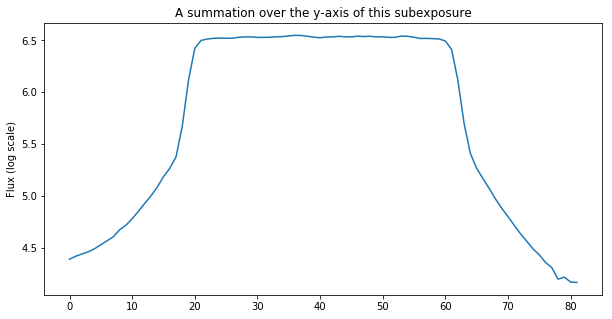

The difference between the two edges (for a 5-pixel bin for all subexps is): 1549.3889322916666
This value may not be larger than  4423.595400425616  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Using flux for variance estimate
Extracting spectrum with optimal extraction...
1253008.1112743076 pl 1253008.1112743076 41.65649
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


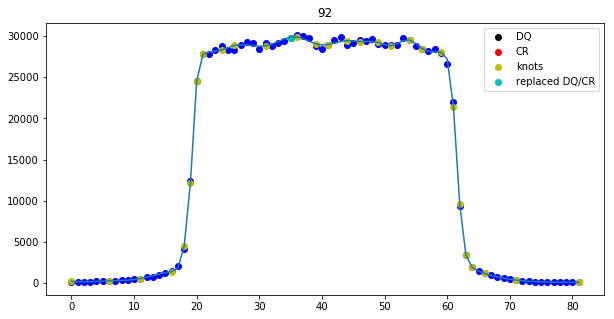

1285552.695796222 pl 1285552.695796222 41.373165
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


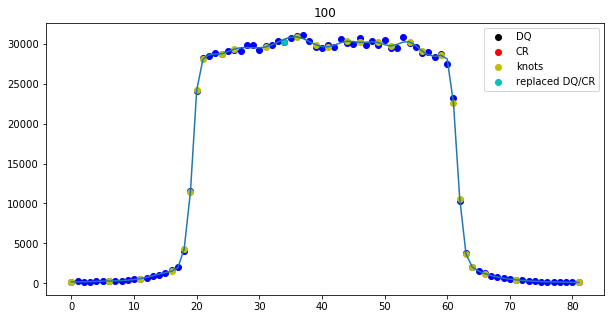

1275079.6521991657 pl 1275079.6521991657 41.11713
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


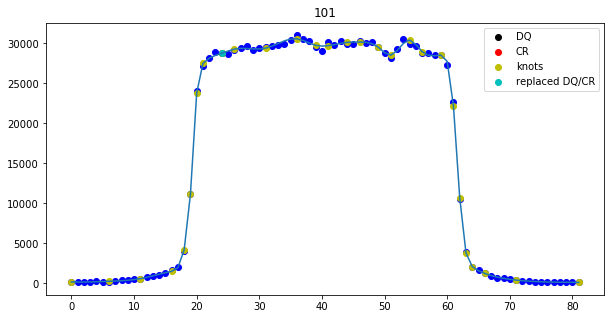

Optimal extraction fitting failed for columns: [1, 2, 3, 4, 5, 7, 9, 10, 12, 13, 14]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 2
nr. of CRs 1212
Spectrum located at pixel 124 in spatial direction
subexp 119.86840892283126 [204, 162, 120, 78]
ypix is 120 for exposure 1


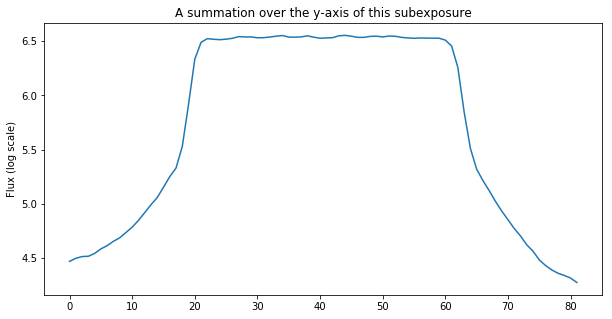

The difference between the two edges (for a 5-pixel bin for all subexps is): 1683.4390625
This value may not be larger than  4439.7705646425775  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1267527.7519725088 pl 1267527.7519725088 41.116554
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


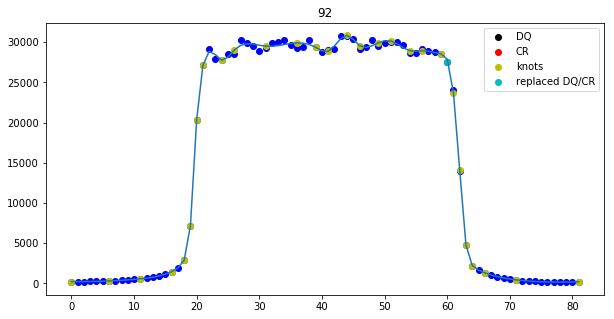

1293851.9781482837 pl 1293851.9781482837 41.156387
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


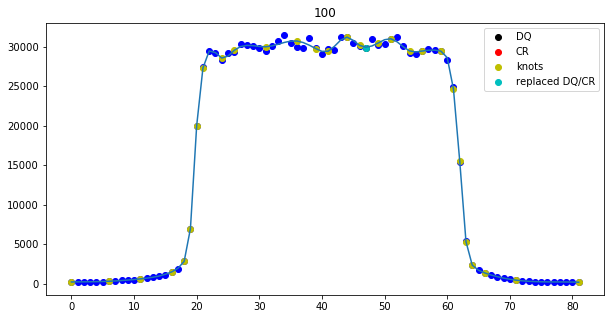

1285793.054327582 pl 1285793.054327582 41.044025
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


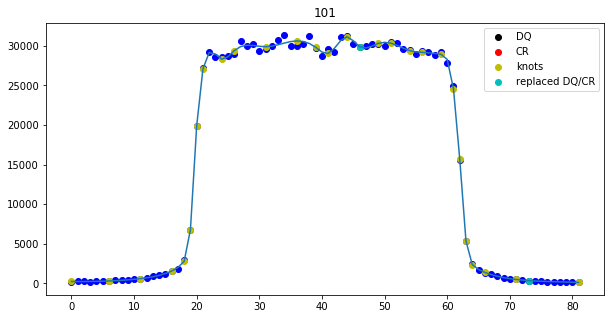

187 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 5, 6]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 3
nr. of CRs 1198
Spectrum located at pixel 124 in spatial direction
subexp 162.30599530703287 [204, 162, 120, 78]
ypix is 162 for exposure 2


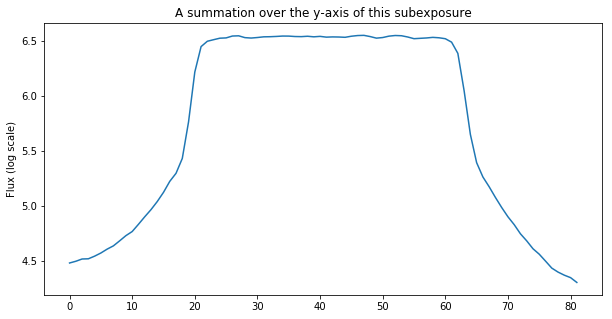

The difference between the two edges (for a 5-pixel bin for all subexps is): 1508.2546875
This value may not be larger than  4461.580706431298  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1285115.1769200317 pl 1285115.1769200317 41.50961
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


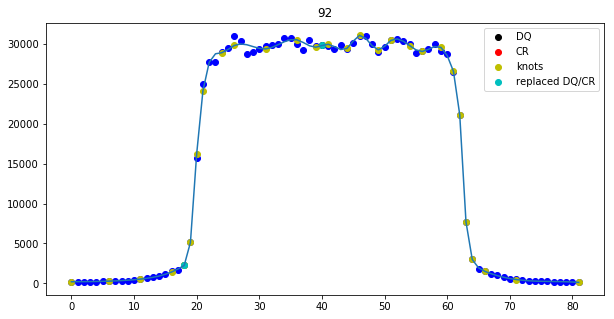

1306956.5120523726 pl 1306956.5120523726 41.540806
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


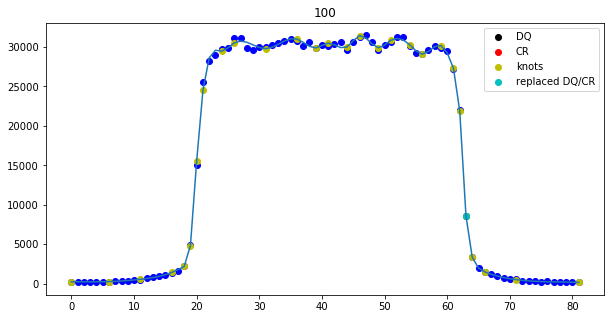

1297278.6410953314 pl 1297278.6410953314 41.49822
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


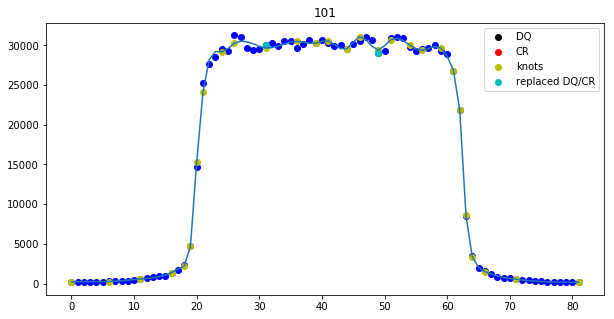

191 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4, 6]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Extracting from subexposure 4
nr. of CRs 1179
Spectrum located at pixel 124 in spatial direction
subexp 204.7496420901704 [204, 162, 120, 78]
ypix is 204 for exposure 3


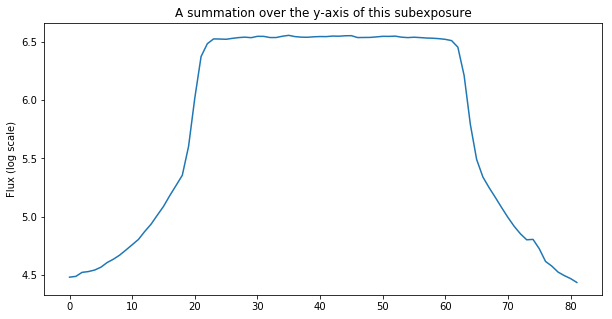

The difference between the two edges (for a 5-pixel bin for all subexps is): 463.51015625
This value may not be larger than  4463.835600318034  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
1296236.5521633395 pl 1296236.5521633395 41.03253
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


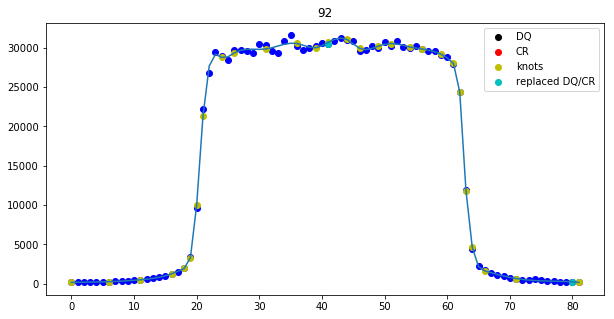

1309002.1269960217 pl 1309002.1269960217 41.13988
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


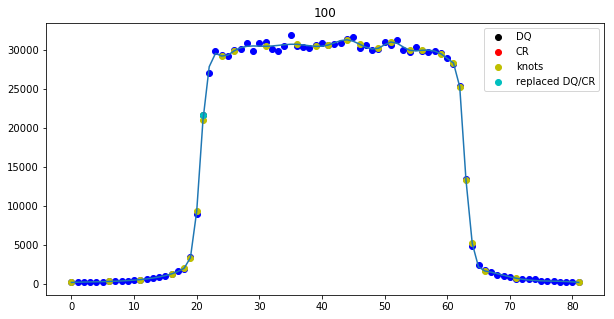

1302656.73909223 pl 1302656.73909223 41.614162
Knots estimated by pipeline are: [ 0.  6. 11. 16. 18. 19. 20. 21. 24. 26. 31. 36. 39. 41. 44. 46. 49. 51.
 54. 56. 59. 61. 62. 63. 64. 66. 71. 81.]


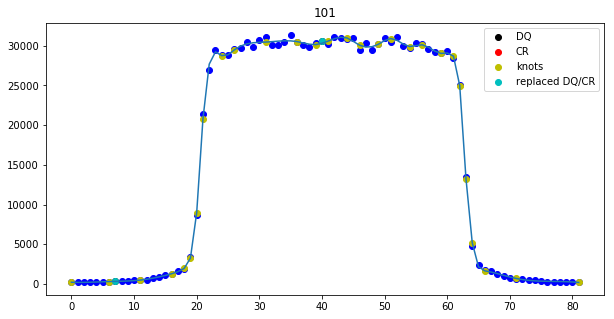

195 successes out of 200 total fits
Optimal extraction fitting failed for columns: [1, 3]
Terminated CR clipping at 30 iterations
Clipped 30 cosmic rays in OE
Applied an xshift of 0.089798489571 pix compared to reference (reduced) spectrum ie9301bhq
Shifted subexposure nr. 0 with -1.07934985325 pixels and shrunk 0.664289455351 percent.
Shifted subexposure nr. 1 with -0.757285515643 pixels and shrunk 0.448810012426 percent.
Shifted subexposure nr. 2 with -0.413306909078 pixels and shrunk 0.235406018619 percent.
Saving spectrum to /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/ie9301c0q_spec.txt
Extraction took 2.57s
########################################
###########Finished Extraction##########
########################################
ie9301c0q


In [28]:
file_name=np.genfromtxt('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/visit_01.lis',dtype=str,usecols=(0),unpack=True,skip_header=1)
print (file_name)
ref_Images=[file_name[0]+'_ima.fits']
print (ref_Images[0])
#file_name=file_name[np.where(file_name != 'ie93h1gfq')[0]]
#file_name=file_name[np.where(file_name != 'ie93a1caq')[0]]
for i in range(len(file_name)):
    reload(pipe)
    fname = str(file_name[i])
 #   print (fname)
    visit = 1

    if visit == 1:
        Bg_x, Bg_y, Bg_w, Bg_h = (215, 5, 38, 30)
        Ref_exp = ref_Images[0].split('_ima.fits')[0]
    
    if fname == Ref_exp + '_ima.fits':
        Save_sub = True
    else:
        Save_sub = False

    exp = pipe.reduce_exposure(fname, pdf=False, logger=False, debug=False,
                           bg_x = Bg_x, bg_y = Bg_y, bg_w = Bg_w, bg_h = Bg_h,
                           tsiaras=False, cr_tolx=4, cr_toly=4, cr_thresh=50,
                           ref_exp = Ref_exp,
                           conf_file=conf_file_red, \
                           source_dir=data_dir, write = True)
#print (exp.t)
#noknots=False
#custom_knots=[]
#x=np.array([3,5,7,9,11,23,31,45,46,61])
#custom_knots.append(x)
#custom_knots.append(x)
#custom_knots.append(x)
#custom_knots.append(x)
#print (custom_knots)
    noknots=False
    if noknots:
        exp_spectrum, variance, interp_spectra, variances = \
                    pipe.extract_spectra(exp, pdf=False, logger=False, debug=False,
                    conf_file=conf_file_ext, ref_exp=Ref_exp,
                    save_dir=output_dir, save_sub=Save_sub,custom_knots_F=None,custom_knots_R=None)
    else:
#        custom_knots=[0,3,5,7,9,21,23,57,61]
        exp_spectrum, variance, interp_spectra, variances = \
                    pipe.extract_spectra(exp, pdf=False, logger=False, debug=False,
                    conf_file=conf_file_ext, ref_exp=Ref_exp, ypix_F=ypix_F, ypix_R=ypix_R,
                    custom_knots_F=custom_knots, custom_knots_R=custom_knots[::-1],
                    save_dir=output_dir, save_sub=Save_sub, show_knots=True)
    print (file_name[i])
    

In [42]:
print (exp.t)
print (type(exp))
print (exp_spectrum.__dict__)
print (interp_spectra)

2456196.0748296147
<type 'instance'>
{'x_unit': 'Spectral Pixel', 'refshifterr': 0, 'y_unit': 'Electrons', 'fname': None, 'y': array([6.34645884e+03, 6.85583239e+03, 7.14853751e+03, 7.83783231e+03,
       8.74324238e+03, 9.08992642e+03, 9.69203139e+03, 1.07009220e+04,
       1.24672457e+04, 1.45727073e+04, 1.46109433e+04, 1.51028274e+04,
       1.66061597e+04, 1.76515068e+04, 1.95197114e+04, 2.14714338e+04,
       2.36178186e+04, 2.54327583e+04, 2.81978181e+04, 3.26647103e+04,
       3.66343699e+04, 3.92277315e+04, 4.23743090e+04, 4.82593043e+04,
       5.62251906e+04, 6.49849104e+04, 7.23789372e+04, 8.17041518e+04,
       9.62932697e+04, 1.19402893e+05, 1.51020173e+05, 1.82895772e+05,
       2.14863037e+05, 2.67616901e+05, 3.60210856e+05, 5.02961181e+05,
       6.55433443e+05, 7.85941706e+05, 9.49419141e+05, 1.25480441e+06,
       1.81379680e+06, 2.57221038e+06, 3.26942847e+06, 3.73693541e+06,
       4.16949557e+06, 4.85372856e+06, 5.69168624e+06, 6.34000946e+06,
       6.66595788e+06

# Taking multiple images...

In [18]:
Images = glob.glob(data_dir + '*_ima.fits')
Images = np.sort([image.replace(data_dir, '') for image in Images])
Images = [str(I) for I in Images]


In [19]:
Direct_images = []
with open(data_dir + 'visit_driz.lis') as g:
    for line in g:
        Direct_images.append(line.replace('\n',''))
for image in Direct_images:
    imagename = image.replace('_drz', '_ima')
    Images.remove(imagename)

In [20]:
Images

['ie9301bhq_ima.fits',
 'ie9301biq_ima.fits',
 'ie9301bjq_ima.fits',
 'ie9301bkq_ima.fits',
 'ie9301blq_ima.fits',
 'ie9301bmq_ima.fits',
 'ie9301bnq_ima.fits',
 'ie9301boq_ima.fits',
 'ie9301bqq_ima.fits',
 'ie9301brq_ima.fits',
 'ie9301bsq_ima.fits',
 'ie9301btq_ima.fits',
 'ie9301buq_ima.fits',
 'ie9301bvq_ima.fits',
 'ie9301bwq_ima.fits',
 'ie9301byq_ima.fits',
 'ie9301bzq_ima.fits',
 'ie9301c0q_ima.fits',
 'ie93a1c2q_ima.fits',
 'ie93a1c3q_ima.fits',
 'ie93a1c4q_ima.fits',
 'ie93a1c5q_ima.fits',
 'ie93a1c7q_ima.fits',
 'ie93a1c8q_ima.fits',
 'ie93a1c9q_ima.fits',
 'ie93a1caq_ima.fits',
 'ie93a1cbq_ima.fits',
 'ie93a1ccq_ima.fits',
 'ie93a1cdq_ima.fits',
 'ie93a1cfq_ima.fits',
 'ie93a1cgq_ima.fits',
 'ie93a1chq_ima.fits',
 'ie93a1ciq_ima.fits',
 'ie93a1cjq_ima.fits',
 'ie93a1ckq_ima.fits',
 'ie93a1clq_ima.fits',
 'ie93b1coq_ima.fits',
 'ie93b1cpq_ima.fits',
 'ie93b1cqq_ima.fits',
 'ie93b1crq_ima.fits',
 'ie93b1csq_ima.fits',
 'ie93b1ctq_ima.fits',
 'ie93b1cuq_ima.fits',
 'ie93b1cwq

First do the reference exposures. They should be the first spectrum of each visit.

########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie9301bhq_ima.fits
For configuration, see pipeline conf file: /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/transmission_reduction.conf


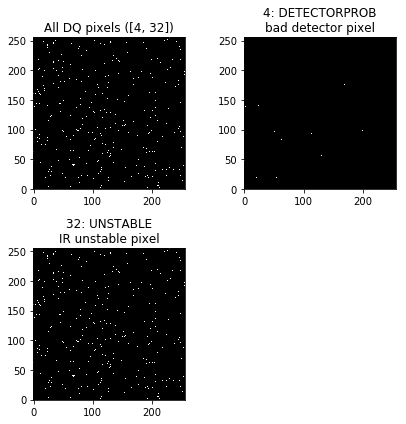

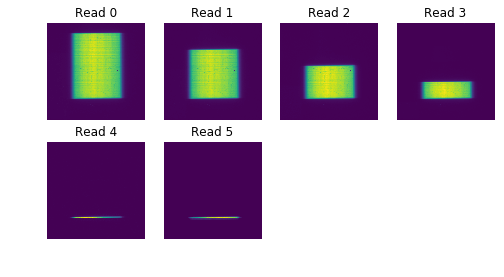

Large background of 50.6708259583 electrons per pixel found in subexposure 2
Large background of 65.5615539551 electrons per pixel found in subexposure 3


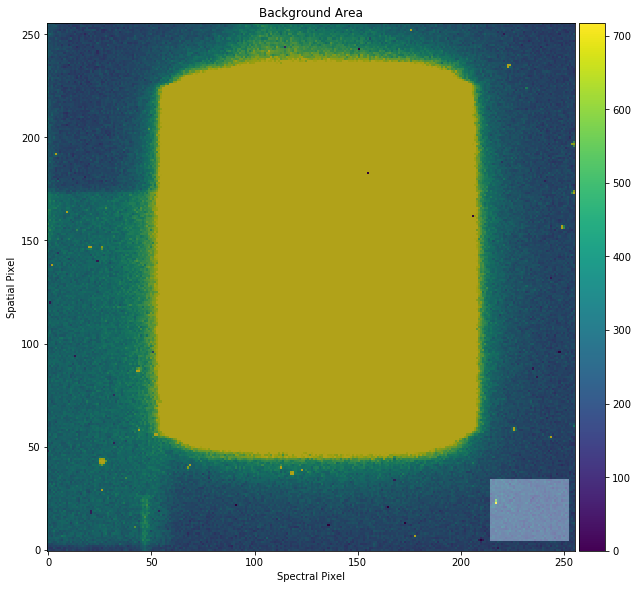

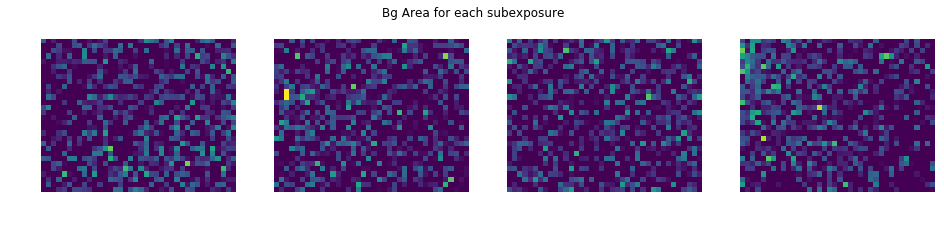

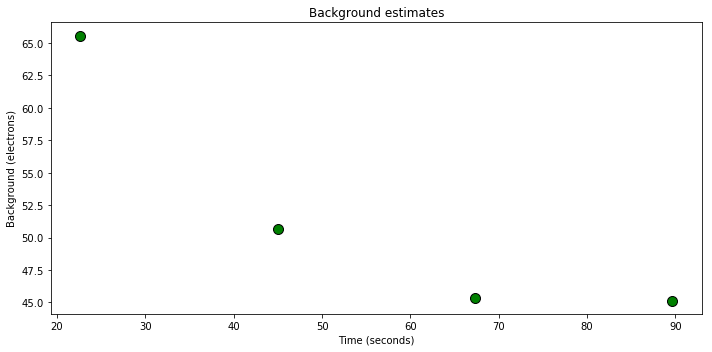

Forward scan
Catalogue used: /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie9301bgq_flt_1.cat
Direct Image name: ie9301bgq
catalogue /Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/ie9301bgq_flt_1.cat
Catalogue file: ie9301bgq_ima.fits
########################
Direct image location of (27.8162381117,138.762948982)


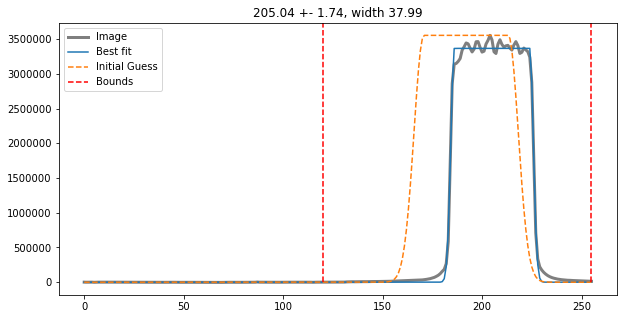

using a PHOENIX stellar model


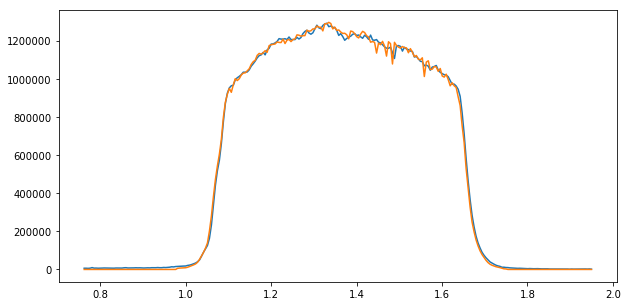

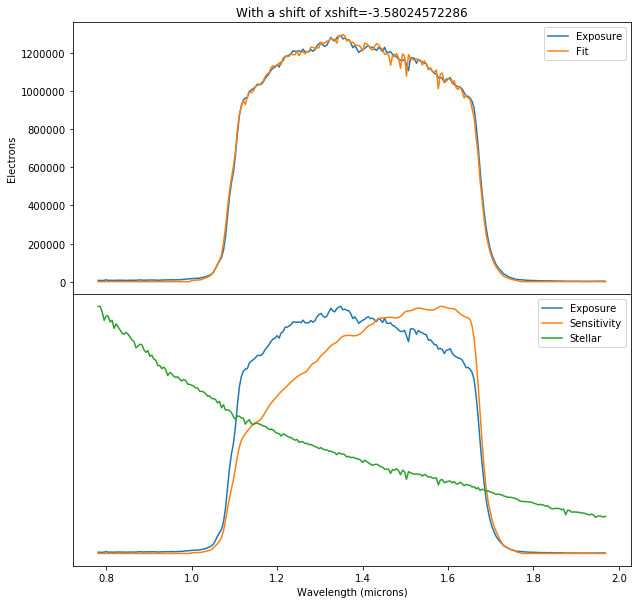

Applied an xshift of -3.58024572286 pix from a comparison to a stellar spectrum
24 value of xpix
Initial xpix is 24 and shift_in_x: -3.58024572286
applying postarg offset to yguess, 88.84 pix


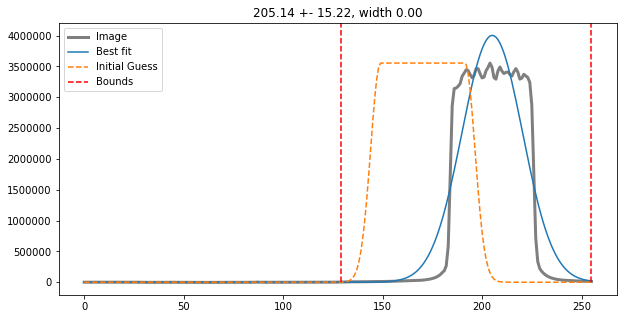

(array([[ 19.653458  ,  -8.508621  ,  25.228409  , ...,   3.6849823 ,
        -37.996964  , -17.056808  ],
       [ 28.733963  ,  26.211273  ,   4.3486176 , ...,  34.53035   ,
         33.53212   ,   6.3264923 ],
       [ 12.2183075 ,  66.561325  ,  24.2397    , ...,  26.025192  ,
         19.539017  ,  10.923386  ],
       ...,
       [-13.157394  , -12.082367  ,  -0.19472504, ...,  51.35933   ,
         37.69023   ,  42.88994   ],
       [-18.053268  ,  12.297195  ,  75.07977   , ...,  18.857544  ,
         26.078949  ,  39.33519   ],
       [ 34.09201   ,   7.1550446 , -14.526733  , ...,  38.622     ,
          9.056374  ,   5.093643  ]], dtype=float32), array([[1.02659969, 0.95132709, 0.92730187, ..., 0.99022098, 1.00048807,
        0.95889914],
       [0.97614515, 0.99879615, 0.98293377, ..., 0.98699562, 0.98994462,
        1.00868618],
       [0.98820233, 0.99198851, 1.02126702, ..., 0.9856331 , 0.98831714,
        0.98157718],
       ...,
       [0.99049433, 0.98990652, 1.018020

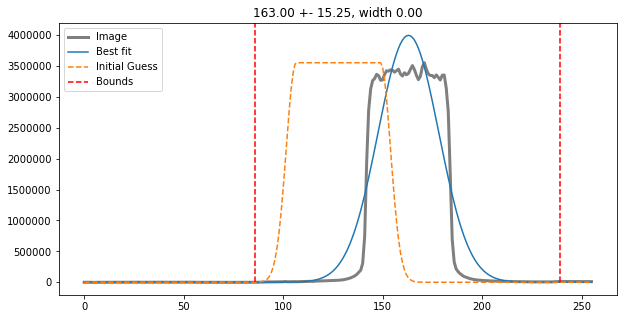

(array([[ 22.526443  ,  28.678757  ,  -4.243881  , ...,  21.165527  ,
        -17.96849   ,   9.802063  ],
       [ 24.652756  ,   1.9153595 , -25.339249  , ...,  10.132126  ,
         31.138489  ,  18.48053   ],
       [ 49.21164   ,  83.122025  ,  42.215683  , ...,  15.588791  ,
         16.665283  ,  37.050034  ],
       ...,
       [  7.3221893 ,   0.62770844,  -4.7863846 , ...,  20.348824  ,
        -33.873474  ,  31.094917  ],
       [  8.570694  ,  40.151802  , -58.737946  , ..., -13.063889  ,
        -13.483528  , -28.122635  ],
       [ 38.32763   ,  -4.2649155 ,   5.8282623 , ...,  58.458817  ,
         36.708397  ,  13.19915   ]], dtype=float32), array([[0.97797824, 1.01717404, 1.02369336, ..., 0.97947431, 0.99055837,
        0.97462096],
       [0.86756175, 1.00057105, 1.00078321, ..., 0.98511468, 0.98741866,
        0.97093693],
       [1.04421316, 1.00141875, 0.96262652, ..., 0.98749226, 1.01309426,
        0.9847939 ],
       ...,
       [0.98067773, 1.00647348, 0.980752

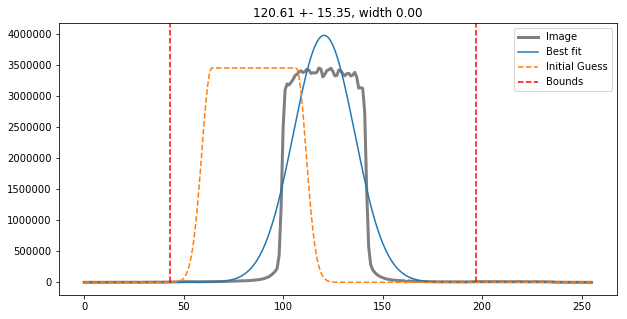

(array([[  9.546062 ,  92.601364 , 175.65584  , ..., -10.7611885,
        -22.301914 ,  27.447224 ],
       [ 25.085247 ,  68.371475 ,  92.19557  , ...,   1.2822151,
         15.637363 ,  -4.1155205],
       [ 20.931774 ,  17.43063  , -40.27297  , ...,  16.896053 ,
        -19.78371  ,  14.572933 ],
       ...,
       [  3.9953766, -12.871494 ,  -8.485424 , ..., -26.416622 ,
        -12.253185 ,  15.137379 ],
       [ -9.140141 ,  -8.209721 ,  34.699093 , ...,  15.870724 ,
         32.85783  ,  52.80817  ],
       [  8.286343 ,  14.454884 ,   5.556843 , ...,  24.318653 ,
         -4.185276 , -14.823246 ]], dtype=float32), array([[0.99152216, 0.98206137, 0.98798856, ..., 0.9900434 , 0.97864713,
        0.99251526],
       [1.0128799 , 0.96209698, 1.03174513, ..., 1.00765806, 0.99389191,
        0.98775042],
       [0.99974451, 0.98079478, 0.99440176, ..., 0.99625174, 0.9890361 ,
        0.95858532],
       ...,
       [1.03185068, 1.00088005, 0.98926224, ..., 0.98714183, 0.9753993 ,
   

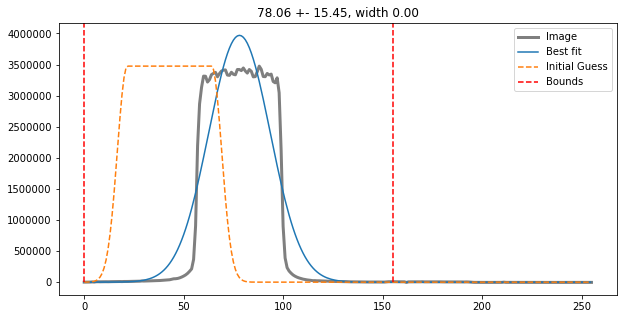

(array([[  1.6079636 ,  19.051071  , -13.7007675 , ..., -31.169815  ,
        -37.77574   , -11.8300705 ],
       [-27.487885  ,   3.637619  ,  32.644722  , ...,   8.36496   ,
        -36.96995   , -17.472729  ],
       [  0.93361664,  32.721222  ,  21.710213  , ..., -16.079144  ,
         30.284042  , -22.17635   ],
       ...,
       [-15.639114  ,  12.112091  ,   2.137436  , ...,  23.98069   ,
        -42.169014  ,  -6.3431206 ],
       [ 10.15358   ,  -5.6991577 , -60.944084  , ..., -40.408714  ,
         13.440819  , -15.394093  ],
       [-21.245361  ,  33.71161   , -17.356941  , ..., -28.602707  ,
        -32.23739   ,  25.858185  ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.03028248, 1.00843969, 1.014272

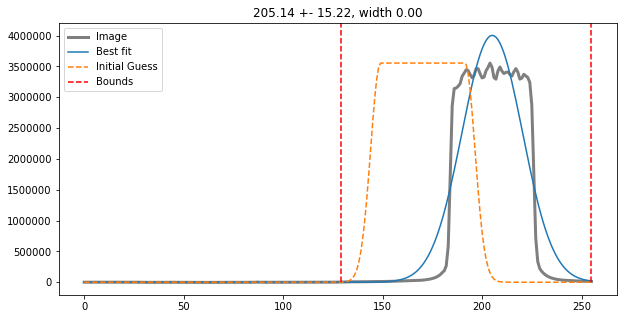

(array([[ 19.653458  ,  -8.508621  ,  25.228409  , ...,   3.6849823 ,
        -37.996964  , -17.056808  ],
       [ 28.733963  ,  26.211273  ,   4.3486176 , ...,  34.53035   ,
         33.53212   ,   6.3264923 ],
       [ 12.2183075 ,  66.561325  ,  24.2397    , ...,  26.025192  ,
         19.539017  ,  10.923386  ],
       ...,
       [-13.157394  , -12.082367  ,  -0.19472504, ...,  51.35933   ,
         37.69023   ,  42.88994   ],
       [-18.053268  ,  12.297195  ,  75.07977   , ...,  18.857544  ,
         26.078949  ,  39.33519   ],
       [ 34.09201   ,   7.1550446 , -14.526733  , ...,  38.622     ,
          9.056374  ,   5.093643  ]], dtype=float32), array([[1.02659969, 0.95132709, 0.92730187, ..., 0.99022098, 1.00048807,
        0.95889914],
       [0.97614515, 0.99879615, 0.98293377, ..., 0.98699562, 0.98994462,
        1.00868618],
       [0.98820233, 0.99198851, 1.02126702, ..., 0.9856331 , 0.98831714,
        0.98157718],
       ...,
       [0.99049433, 0.98990652, 1.018020

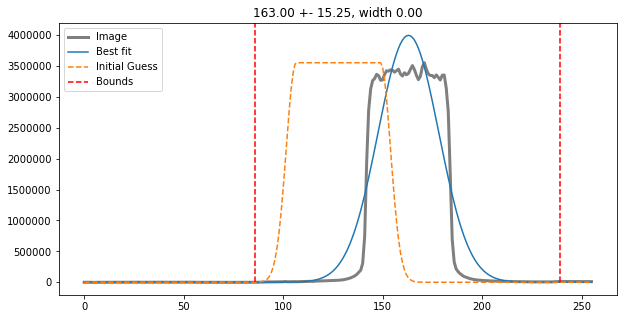

(array([[ 22.526443  ,  28.678757  ,  -4.243881  , ...,  21.165527  ,
        -17.96849   ,   9.802063  ],
       [ 24.652756  ,   1.9153595 , -25.339249  , ...,  10.132126  ,
         31.138489  ,  18.48053   ],
       [ 49.21164   ,  83.122025  ,  42.215683  , ...,  15.588791  ,
         16.665283  ,  37.050034  ],
       ...,
       [  7.3221893 ,   0.62770844,  -4.7863846 , ...,  20.348824  ,
        -33.873474  ,  31.094917  ],
       [  8.570694  ,  40.151802  , -58.737946  , ..., -13.063889  ,
        -13.483528  , -28.122635  ],
       [ 38.32763   ,  -4.2649155 ,   5.8282623 , ...,  58.458817  ,
         36.708397  ,  13.19915   ]], dtype=float32), array([[0.97797824, 1.01717404, 1.02369336, ..., 0.97947431, 0.99055837,
        0.97462096],
       [0.86756175, 1.00057105, 1.00078321, ..., 0.98511468, 0.98741866,
        0.97093693],
       [1.04421316, 1.00141875, 0.96262652, ..., 0.98749226, 1.01309426,
        0.9847939 ],
       ...,
       [0.98067773, 1.00647348, 0.980752

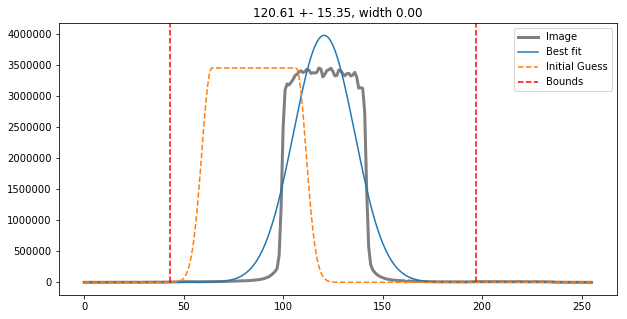

(array([[  9.546062 ,  92.601364 , 175.65584  , ..., -10.7611885,
        -22.301914 ,  27.447224 ],
       [ 25.085247 ,  68.371475 ,  92.19557  , ...,   1.2822151,
         15.637363 ,  -4.1155205],
       [ 20.931774 ,  17.43063  , -40.27297  , ...,  16.896053 ,
        -19.78371  ,  14.572933 ],
       ...,
       [  3.9953766, -12.871494 ,  -8.485424 , ..., -26.416622 ,
        -12.253185 ,  15.137379 ],
       [ -9.140141 ,  -8.209721 ,  34.699093 , ...,  15.870724 ,
         32.85783  ,  52.80817  ],
       [  8.286343 ,  14.454884 ,   5.556843 , ...,  24.318653 ,
         -4.185276 , -14.823246 ]], dtype=float32), array([[0.99152216, 0.98206137, 0.98798856, ..., 0.9900434 , 0.97864713,
        0.99251526],
       [1.0128799 , 0.96209698, 1.03174513, ..., 1.00765806, 0.99389191,
        0.98775042],
       [0.99974451, 0.98079478, 0.99440176, ..., 0.99625174, 0.9890361 ,
        0.95858532],
       ...,
       [1.03185068, 1.00088005, 0.98926224, ..., 0.98714183, 0.9753993 ,
   

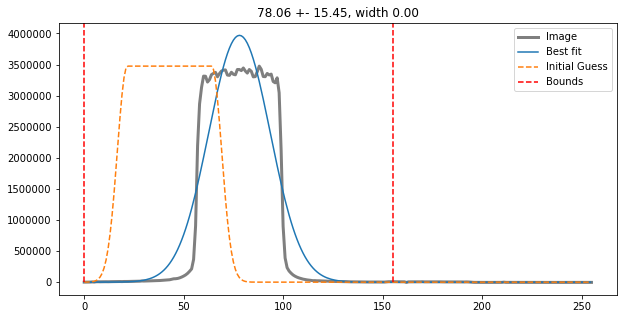

(array([[  1.6079636 ,  19.051071  , -13.7007675 , ..., -31.169815  ,
        -37.77574   , -11.8300705 ],
       [-27.487885  ,   3.637619  ,  32.644722  , ...,   8.36496   ,
        -36.96995   , -17.472729  ],
       [  0.93361664,  32.721222  ,  21.710213  , ..., -16.079144  ,
         30.284042  , -22.17635   ],
       ...,
       [-15.639114  ,  12.112091  ,   2.137436  , ...,  23.98069   ,
        -42.169014  ,  -6.3431206 ],
       [ 10.15358   ,  -5.6991577 , -60.944084  , ..., -40.408714  ,
         13.440819  , -15.394093  ],
       [-21.245361  ,  33.71161   , -17.356941  , ..., -28.602707  ,
        -32.23739   ,  25.858185  ]], dtype=float32), array([[1.0025397 , 1.00531455, 0.96537224, ..., 0.99669652, 0.96768171,
        1.00546945],
       [1.01686754, 1.02771516, 1.02399886, ..., 1.00075701, 0.98206835,
        1.01651938],
       [0.94389857, 0.98304762, 1.02166633, ..., 0.98454576, 0.96427924,
        0.98843169],
       ...,
       [1.03028248, 1.00843969, 1.014272

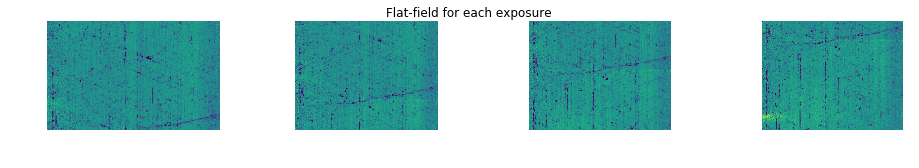

(array([[  1.6038902 ,  18.95036   , -14.192212  , ..., -31.273125  ,
        -39.03736   , -11.765718  ],
       [-27.031923  ,   3.5395207 ,  31.879646  , ...,   8.358632  ,
        -37.64499   , -17.18878   ],
       [  0.98910695,  33.285492  ,  21.249807  , ..., -16.331535  ,
         31.405884  , -22.435896  ],
       ...,
       [-15.179443  ,  12.010724  ,   2.1073594 , ...,  23.921515  ,
        -42.708717  ,  -6.4383755 ],
       [ 10.066234  ,  -5.617998  , -61.778046  , ..., -40.502678  ,
         13.55334   , -15.666772  ],
       [-25.205013  ,  33.541367  , -17.19989   , ..., -28.751444  ,
        -32.799995  ,  25.685226  ]], dtype=float32), array([[1.01986375, 1.01788227, 1.00333199, ..., 1.01311059, 0.99215196,
        1.00288673],
       [1.01891299, 1.01244766, 1.01397387, ..., 1.01571291, 0.99375317,
        1.01311498],
       [0.96877723, 1.00556246, 1.01989773, ..., 0.97336441, 0.98547606,
        1.00876676],
       ...,
       [1.00083182, 1.00346711, 1.012641

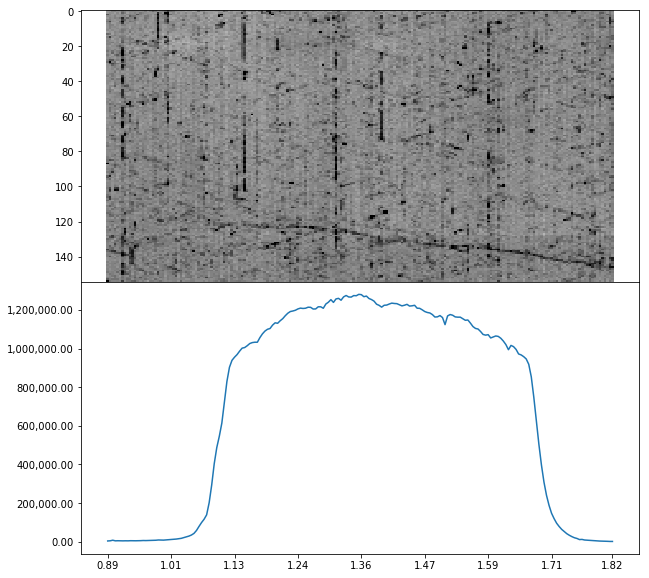

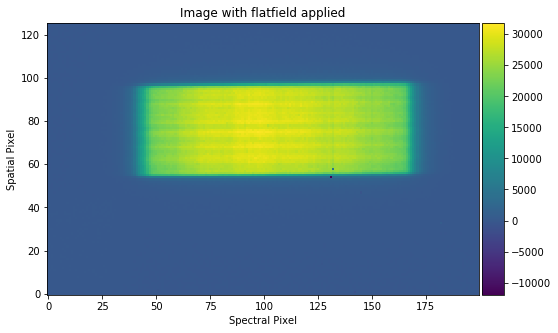

(array([[ 19.144228  ,  -8.943949  ,  27.206253  , ...,   3.7213738 ,
        -37.978428  , -17.787907  ],
       [ 29.43616   ,  26.242867  ,   4.4241204 , ...,  34.985313  ,
         33.872723  ,   6.2720127 ],
       [ 12.364176  ,  67.098885  ,  23.73493   , ...,  26.404543  ,
         19.769987  ,  11.128402  ],
       ...,
       [-13.283665  , -12.205564  ,  -0.19127806, ...,  52.022053  ,
         38.001766  ,  43.283627  ],
       [-18.504864  ,  13.034951  ,  74.49034   , ...,  18.805275  ,
         26.708483  ,  39.632877  ],
       [ 35.718937  ,   7.3797574 , -14.671021  , ...,  38.249886  ,
          9.073744  ,   5.1301746 ]], dtype=float32), array([[1.01361971, 0.96692816, 0.94822369, ..., 0.98770593, 1.00499347,
        0.98093304],
       [0.98106131, 0.99137534, 0.99694402, ..., 0.99455272, 0.98276846,
        0.9930855 ],
       [0.99548914, 0.99975305, 1.01730802, ..., 1.00700168, 0.99812322,
        0.98889829],
       ...,
       [0.98589419, 1.00479864, 1.003800

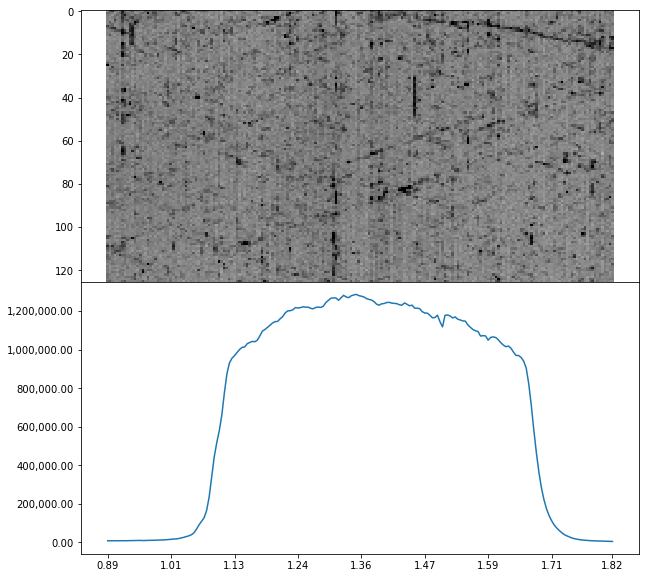

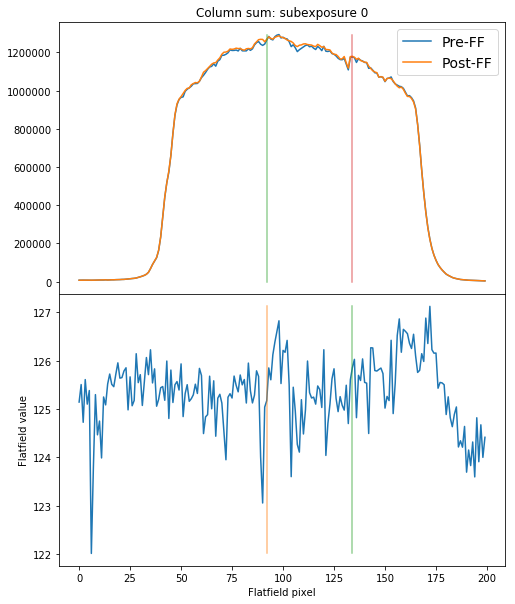

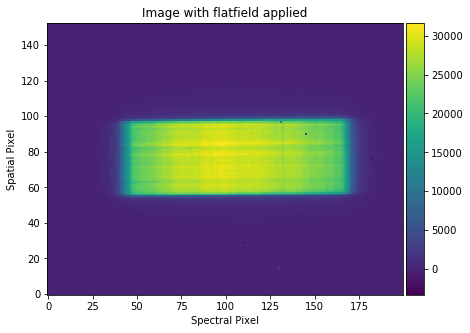

(array([[ 23.033686 ,  28.194542 ,  -4.1456566, ...,  21.609068 ,
        -18.13976  ,  10.057308 ],
       [ 28.41614  ,   1.9142663, -25.319418 , ...,  10.285225 ,
         31.535244 ,  19.033709 ],
       [ 47.127964 ,  83.004265 ,  43.854687 , ...,  15.786242 ,
         16.449884 ,  37.62212  ],
       ...,
       [  7.4664583,   0.6236711,  -4.880318 , ...,  20.251575 ,
        -34.454765 ,  31.197353 ],
       [  8.803267 ,  39.415756 , -59.641933 , ..., -13.249926 ,
        -13.984826 , -28.282614 ],
       [ 40.887993 ,  -4.387791 ,   6.2622414, ...,  58.729584 ,
         36.566883 ,  13.232247 ]], dtype=float32), array([[0.98933687, 1.00919437, 1.01501392, ..., 1.01038722, 1.01096022,
        0.97663709],
       [0.8870573 , 1.0034665 , 1.00254232, ..., 1.00864013, 1.01315568,
        0.99313417],
       [1.01568041, 1.00402799, 0.99119482, ..., 1.01318273, 1.00796219,
        0.99427487],
       ...,
       [1.00024632, 1.00194615, 0.99958568, ..., 1.00248113, 0.99306469,
   

KeyboardInterrupt: 

In [20]:
it = 0
#for Image in ref_Images:
for Image in Images:
    visit = 1
    if visit == 1:
        Bg_x, Bg_y, Bg_w, Bg_h = (215, 5, 38, 30)
        Ref_exp = ref_Images[0].split('_ima.fits')[0]
        
    if fname == Ref_exp + '_ima.fits':
        Save_sub = True
    else:
        Save_sub = False
    
    
    exp = pipe.reduce_exposure(Image, pdf=False, logger=False, debug=True,
                           bg_x = Bg_x, bg_y = Bg_y, bg_w = Bg_w, bg_h = Bg_h,
                           ref_exp = Ref_exp,
                           conf_file=conf_file_red, \
                           source_dir=data_dir, write = True)

    if noknots:
        exp_spectrum, variance, interp_spectra, variances = \
                    pipe.extract_spectra(exp, pdf=False, logger=False, debug=True,
                    conf_file=conf_file_ext, ref_exp=Ref_exp,
                    save_dir=output_dir, save_sub=True)
    else:
        exp_spectrum, variance, interp_spectra, variances = \
                    pipe.extract_spectra(exp, pdf=False, logger=False, debug=True,
                    conf_file=conf_file_ext, ref_exp=Ref_exp,
                    custom_knots_F=custom_knots, custom_knots_R=custom_knots[::-1], ypix_F=ypix_F, ypix_R=ypix_R,
                    save_dir=output_dir, save_sub=True)
    

In [21]:
%%capture

BGs0 = []
BGs1=[]
BGs2 = []
BGs3=[]
refshifts=[]
refshifterrs=[]
Ts  = []
reload(pipe)
it = 0
ypixs=[]
xpix0=[]
xpix1=[]
xpix2=[]
xpix3=[]
for Image in Images:
    visit = 1
    if visit == 1:
        Bg_x, Bg_y, Bg_w, Bg_h = (215, 5, 38, 30)
        Ref_exp = ref_Images[0].split('_ima.fits')[0]
    if Image == Ref_exp + '_ima.fits':
        Save_sub = True
    else:
        Save_sub = False
    
    print ('Step1')
    exp = pipe.reduce_exposure(Image, pdf=False, logger=False, debug=False,
                           skip_start=1,
                           bg_x = Bg_x, bg_y = Bg_y, bg_w = Bg_w, bg_h = Bg_h,
                           ref_exp = Ref_exp,
                           conf_file=conf_file_red, \
                           source_dir=data_dir, write = True)
    print ('Step2')
    noknots=False
    if noknots:
        exp_spectrum, variance, interp_spectra, variances, reduced_exp = \
                    pipe.extract_spectra(exp, pdf=False, logger=False, debug=True,
                    conf_file=conf_file_ext, ref_exp=Ref_exp,
                    save_dir=output_dir, save_sub=Save_sub)
    else:
        exp_spectrum, variance, interp_spectra, variances, reduced_exp = \
                    pipe.extract_spectra(exp, pdf=False, logger=False, debug=False,
                    conf_file=conf_file_ext, ref_exp=Ref_exp, ypix_F=ypix_F, ypix_R=ypix_R,
                    custom_knots_F=custom_knots, custom_knots_R=custom_knots[::-1],
                    save_dir=output_dir, save_sub=Save_sub)
    ypixs.append([subex.ypix for subex in exp.subexposures])
    xpix0.append(vars(reduced_exp)['sub_shifts'][0][0])
    xpix1.append(vars(reduced_exp)['sub_shifts'][1][0])
    xpix2.append(vars(reduced_exp)['sub_shifts'][2][0])
    xpix3.append(vars(reduced_exp)['sub_shifts'][3][0])
    BGs0.append(exp.BGs[0][0,0])
    BGs2.append(exp.BGs[2][0,0])
    Ts.append(exp.t)
    refshifts.append(exp_spectrum.refshift)
    refshifterrs.append(exp_spectrum.refshifterr)
    it +=1
    print (it)
    

Text(0,0.5,'x_shift')

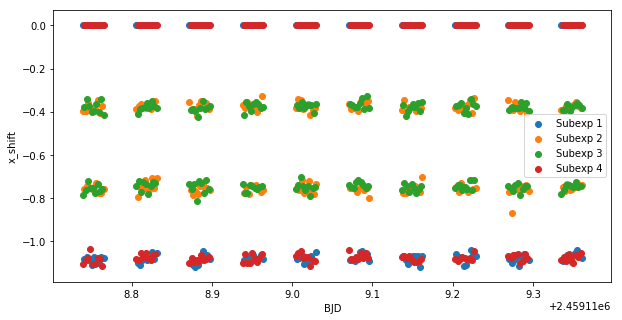

In [14]:
plt.scatter(Ts,xpix0,label='Subexp 1')
plt.scatter(Ts,xpix1,label='Subexp 2')
plt.scatter(Ts,xpix2,label='Subexp 3')
plt.scatter(Ts,xpix3,label='Subexp 4')
plt.legend()
plt.xlabel('BJD')
plt.ylabel('x_shift')
#plt.savefig('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/Subexp_xshift.pdf',format='pdf')

In [56]:
print (exp_spectrum.refshift)
print (vars(exp).keys())
print vars(vars(exp)['subexposures'][3])

0.05058523708056484
['CRs', 'sub_shifts', 'DQs', 'variances', 'spectra', 'Primary', 'filename', 'POSTARG2', 'rootname', 'reads', 'BGs', 'subexposures', 't', 't_units', 'dt', 'Ds']
{'n_crs': 85, 'ERR': <astropy.io.fits.hdu.image.PrimaryHDU object at 0x7ff5b89774d0>, 'yend': 155, 'ystart': 0, 'bg_err': 24.995165, 'cut_image': array([[-25.04122294,  20.3764951 ,  16.45035339, ...,  14.73381542,
         13.18129163,  -8.0261924 ],
       [  4.36571508,   7.21848705, -19.40416851, ..., -11.25194592,
        -43.34094127,  -8.88821403],
       [ 24.87405433,  20.42951988,  11.17476912, ..., -10.13746365,
         57.13166795,   2.66206697],
       ...,
       [-13.79547651, -28.36333305,  -1.10258798, ..., -19.30905761,
         -0.64120521, -14.53206632],
       [  6.83852634,  -8.82799591,  -5.74776464, ...,  -3.59669249,
         43.55090959, -59.77215006],
       [-65.17585241,  -9.2977339 , -32.02628633, ...,  -1.21884498,
         16.65700379,   6.05580952]]), 'CR_mask': array([[False

In [42]:
vars(exp.subexposures[3])['ystart']

0

['x_unit', 'refshifterr', 'y_unit', 'fname', 'y', 'x', 'refstretch', 'refshift']
[(-1.0729621141098729, 0.09524157824098543), (-0.695045720584282, 0.07216309315396237), (-0.3017093951117896, 0.05900100716813473), (0.0, 0.0)]
[[205.04085177425796, 162.99554231645595, 120.60501340491888, 78.0580698241159], [77.486009362025, 119.87221724877993, 162.32754879975016, 204.75509906692682], [205.09334686154895, 163.0165089238272, 120.62035260617718, 78.0473760314999], [77.47966862939938, 119.86444110482448, 162.29901913523923, 204.72147743904446], [205.06277833124614, 162.99362731682191, 120.62374292929395, 78.07285621646182], [77.48400498372402, 119.847669652697, 162.33009007153856, 204.7165065781305]]


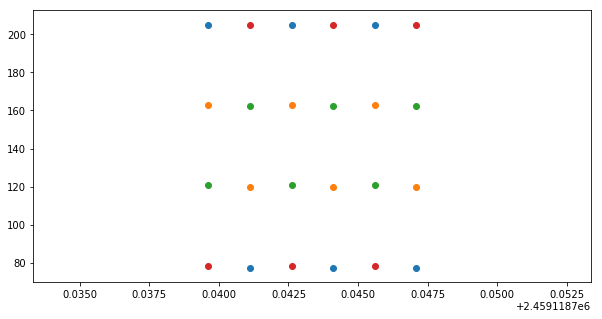

In [75]:
#plt.errorbar(Ts,refshifts,yerr=refshifterrs,fmt='o')
print (vars(exp_spectrum).keys())
#print (vars(exp_spectrum)['x_unit'])
print (vars(reduced_exp)['sub_shifts'])
#np.savetxt('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/xshift_full.txt',np.column_stack((Ts,refshifts,refshifterrs)))

#ypix=[]
#ypix.append([subex.ypix for subex in exp.subexposures])
#print ypixs
#print (exp.subexposures)
#plt.scatter(Ts,ypixs[:,0])
y1=np.array([ypixs[i][0] for i in range(len(Ts))])
y2=np.array([ypixs[i][1] for i in range(len(Ts))])
y3=np.array([ypixs[i][2] for i in range(len(Ts))])
y4=np.array([ypixs[i][3] for i in range(len(Ts))])
#print (y)
plt.scatter(Ts,y1)
plt.scatter(Ts,y2)
plt.scatter(Ts,y3)
plt.scatter(Ts,y4)
#plt.ylim(60,100)
print ypixs

Text(0,0.5,'Pixel value')

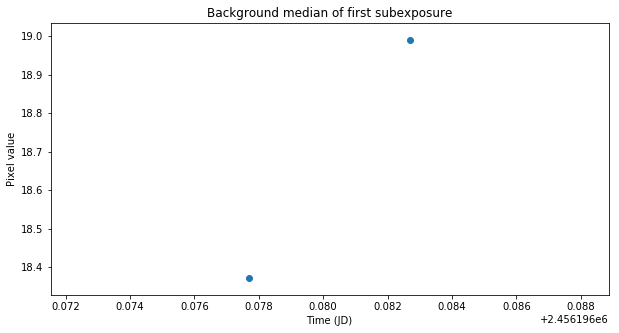

In [12]:
plt.title('Background median of first subexposure')
plt.scatter(Ts, BGs0)
plt.xlabel('Time (JD)')
plt.ylabel('Pixel value')

Text(0,0.5,'Pixel value')

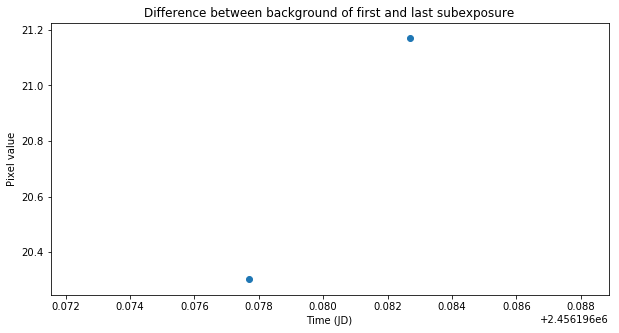

In [13]:
plt.scatter(Ts, np.array(BGs2) - np.array(BGs0))
plt.title('Difference between background of first and last subexposure')
plt.xlabel('Time (JD)')
plt.ylabel('Pixel value')

In [9]:
import astropy.io as pyfits

1
3
5
7
9
11
13
15
17
19
21
23
25
27
29
33
35
37
39
41
43
45
47
49
51
53
55
57
59
61
63
65
67
69
71
73
75
77
79
81
83
85
87
89
91
93
95
97
99
101
103
105
107
109
111
113
115
117
119
121
123
125
127
129
131
133
135
137
139
141
143
145
147
149
151
153
155
157
159
161
163
165
167
169
171
173
175
177
179
([array([3893462.92096549, 3959102.77123982, 4009718.96227663,
       4077431.44426423, 4117539.45112525, 4142644.02761592,
       4194615.60025062, 4224372.12559263, 4243112.51575622,
       4234393.09523606, 4269223.91663533, 4367639.47476549,
       4457337.43437969, 4498057.14988851, 4526066.60561353,
       4575499.63063505, 4626658.3732856 , 4643307.0012095 ,
       4660240.52073467, 4715724.5960284 , 4767160.24283918,
       4831942.79455573, 4867977.61861984, 4890780.765479  ,
       4908352.9080844 , 4936671.15983938, 4944762.22740185,
       4946435.59499568, 4962288.00604537, 4964193.66560624,
       4957944.40612302, 4938629.32669983, 4938073.54011941,
       4964771.14471064, 

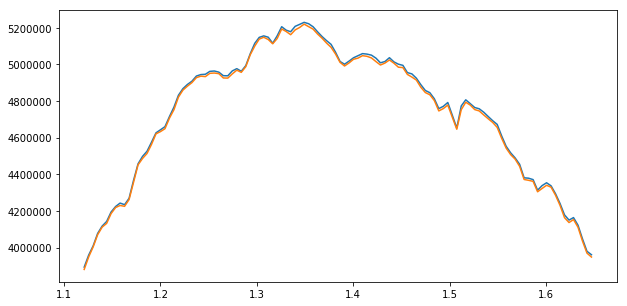

In [15]:
import os
import numpy as np
import matplotlib.pyplot as plt
filelist=[]

for file in os.listdir("/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output"):
    if (file.startswith("ie93") and file.endswith(".txt") and not file.endswith("subs_spec.txt")):
        #print(os.path.join("/mydir", file))
        filelist.append(file)
#print (sorted(filelist))
name,direction=np.genfromtxt('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/input_image.lis',dtype=('str','str'),usecols=(0,3),unpack=True)
#print (name[0],direction)
filelist=sorted(filelist)
flux_f=np.array([])
flux_r=np.array([])
flux=np.array([])
Dir="/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/"
signal1=[]
for i in range(len(filelist)):
    if (filelist[i]!='ie93a1chq_spec.txt'):
        w,f=np.loadtxt(Dir+filelist[i],usecols=(0,1),skiprows=2,unpack=True)
 #   print (len(f))
        f=f[np.where(w>=1.12)[0]]
        w=w[np.where(w>=1.12)[0]]
        f=f[np.where(w<=1.65)[0]]
        w=w[np.where(w<=1.65)[0]]
#    print (filelist[i].strip('_spec.txt'))
#    signal1=[]
        dir_scan=direction[np.where(name==filelist[i].strip('_spec.txt'))[0]][0]
#    print (dir_scan[0])
        flux=np.append(flux,f)
        if (dir_scan=='reverse'):
            flux_r=np.append(flux_r,f)
   #     print (i)
        else:
            flux_f=np.append(flux_f,f)
            print (i)
        if (i==40 or i==100):
            plt.plot(w,f)
            signal1.append(f)
#    print (np.mean(f)),i
#print (flux)
flux=flux.reshape(len(filelist)-1,len(w))
flux_f=flux_f.reshape(89,len(w))
flux_r=flux_r.reshape(90,len(w))
#import pandas as pd
#df1=pd.DataFrame(flux)
#print (df1)
#print (len(flux.sum(axis=0)))
for i in range(len(w)):
    flux_f[:,i]=flux_f[:,i]/(flux_f.sum(axis=0)[i]/89)
    flux_r[:,i]=flux_r[:,i]/(flux_r.sum(axis=0)[i]/90)
    flux[:,i]=flux[:,i]/(flux.sum(axis=0)[i]/179)
print (signal1,w[1]-w[0])

In [44]:
def dcf(a,ta,b,tb):
    udcf=np.empty([len(a),len(b)])
    tau=np.empty([len(a),len(b)])
    a_mean=np.mean(a)
    b_mean=np.mean(b)
    sig_a=np.std(a)
    sig_b=np.std(b)
    for i in range(len(a)):
        for j in range(len(b)):
            udcf[i,j]=(a[i]-a_mean)*(b[j]-b_mean)/(sig_a*sig_b)
            tau[i,j]=(ta[i]-tb[j])
    
    dt=0.001
    t_low=-0.1
    t_high=+0.1
    t=t_low
    delay=np.array([])
    dccf=np.array([])
  #  return tau
    
    while(t<t_high):
        count=0
        dcf=0.0
   #     print (t)
        for i in range(len(a)):
            for j in range(len(b)):
                if(tau[i,j]>t-dt/2. and tau[i,j]<t+dt/2.):
                    count=count+1
                    dcf=dcf+udcf[i,j]
        if (count!=0):
            delay=np.append(delay,t)
            dccf=np.append(dccf,dcf/count)
        t=t+dt
    
    return delay,dccf
    

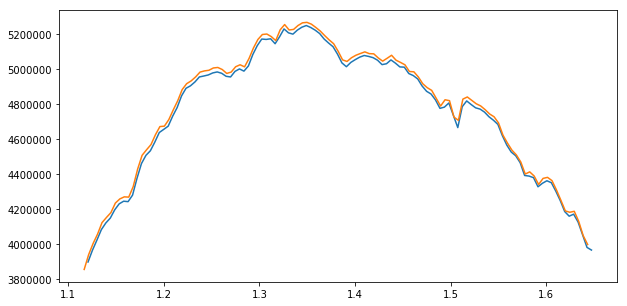

In [66]:
plt.plot(w,signal1[0])
plt.plot(w-0.004,signal1[1])

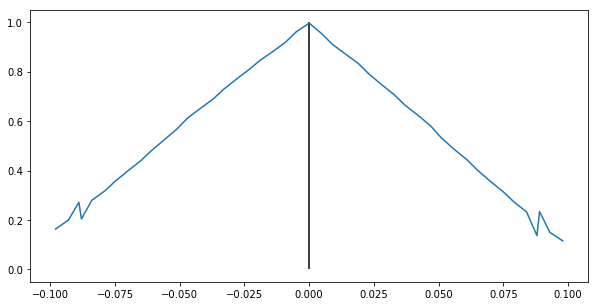

In [45]:
w0,dccf=dcf(signal1[0],w,signal1[1],w)
plt.plot(w0,dccf)
plt.vlines(0.0,0,1)

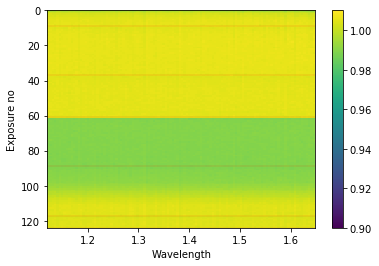

In [62]:
import matplotlib.pyplot as plt
plt.imshow(flux,extent=[min(w),max(w),len(filelist)-1,0],aspect='auto',vmin=0.9,vmax=1.01)
#plt.xticks(w*100)
plt.colorbar()
plt.xlabel('Wavelength')
plt.ylabel('Exposure no')
#plt.vlines(1.12,0,124)
#plt.vlines(1.65,0,124)
plt.xlim(min(w),max(w))
#plt.savefig('Scan_spec_hd209.pdf',format='pdf')
orbits=[9,37,61,89,117,124]
for i in range(len(orbits)):
    plt.hlines(orbits[i],min(w),max(w),linestyles='--',lw=0.2,color='red')

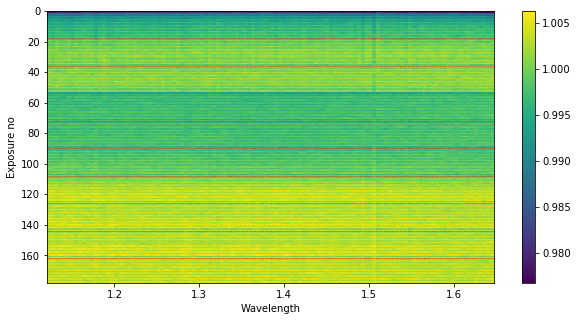

In [16]:
import matplotlib.pyplot as plt
plt.imshow(flux,extent=[min(w),max(w),len(filelist)-2,0],aspect='auto')
#plt.xticks(w*100)
plt.colorbar()
plt.xlabel('Wavelength')
plt.ylabel('Exposure no')
orbits=[0,18,36,54,72,90,108,126,144,162]
for i in range(len(orbits)):
    plt.hlines(orbits[i],min(w),max(w),linestyles='--',lw=0.5,color='red')
#plt.vlines(1.12,0,180)
#plt.vlines(1.65,0,180)
#plt.savefig('v1298_scanned_spectra.pdf',format='pdf')

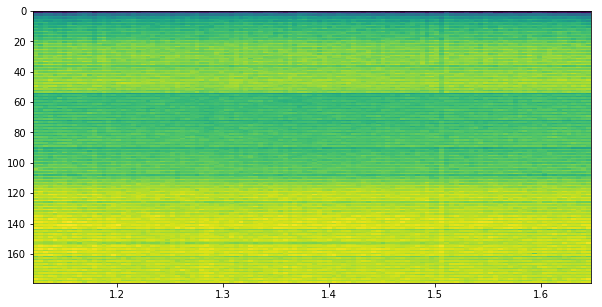

In [24]:
import matplotlib.pyplot as plt
plt.imshow(flux,extent=[min(w),max(w),len(filelist)-1,0],aspect='auto')

0.0778262703808061
0.07760634597221802
0.0774481349329323
0.07748318565454448
0.07739530611734889
0.07741685051971967
0.07730827748339161
0.07726282360646845
0.07712284945199818
0.07733607409361906
0.07709390947802706
0.07724291626627428
0.07707848529713666
0.07717215125454248
0.07710633866359434
0.07718017939755685
0.07713679256514629
0.07711091223051107
0.07718860175395628
0.07719606356121644
0.07715729460520171
0.07713867033670954
0.07705336790064853
0.07707586996355184
0.07704322512133437
0.07720024999180103
0.07708967651230389
0.07707501694717046
0.07716948071406003
0.07708225493791733
0.07701856780046408
0.07704698964766754
0.07702919833434957
0.07695937103799314
0.07704416232056642
0.07702089066493473
0.07698471320715482
0.07715617090441758
0.07704993633835226
0.07698285109990312
0.0769816091406347
0.0772312097529412
0.07699238632210104
0.07717224870596628
0.07699222206498926
0.07707704885205044
0.07702152364937712
0.07698964840162675
0.07699890232040543
0.07703798282735955
0.07

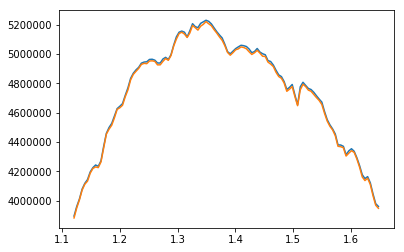

In [6]:
import os
import numpy as np
filelist=[]

for file in os.listdir("/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output"):
    if (file.startswith("ie93") and file.endswith(".txt") and not file.endswith("subs_spec.txt")):
        #print(os.path.join("/mydir", file))
        filelist.append(file)
#print (sorted(filelist))
name,direction=np.genfromtxt('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/input_image.lis',dtype=('str','str'),usecols=(0,3),unpack=True)
filelist=sorted(filelist)
flux=np.array([])
Dir="/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/"
signal1=[]
count=0
count_f=0
count_r=0
flux_f=np.array([])
flux_r=np.array([])
for i in range(0,180):
    count+=1
    w,f=np.loadtxt(Dir+filelist[i],usecols=(0,1),skiprows=2,unpack=True)
 #   print (len(f))
    f=f[np.where(w>=1.12)[0]]
    w=w[np.where(w>=1.12)[0]]
    f=f[np.where(w<=1.65)[0]]
    w=w[np.where(w<=1.65)[0]]
    dir_scan=direction[np.where(name==filelist[i].strip('_spec.txt'))[0]][0]
#    signal1=[]
    flux=np.append(flux,f)
    if (dir_scan=='reverse'):
        flux_r=np.append(flux_r,f)
        count_r+=1
   #     print (i)
    else:
        flux_f=np.append(flux_f,f)
        count_f+=1
    print (np.std(f)/(np.mean(f)))
    if (i==40 or i==100):
        plt.plot(w,f)
        signal1.append(f)
#    print (np.mean(f)),i
#print (flux)
#print (np.mean(flux),np.std(flux)/np.sqrt(np.mean(flux)))
flux=flux.reshape(count,len(w))
flux_f=flux_f.reshape(count_f,len(w))
flux_r=flux_r.reshape(count_r,len(w))
#import pandas as pd
#df1=pd.DataFrame(flux)
#print (df1)
#print (len(flux.sum(axis=0)))

for i in range(len(w)):
    flux[:,i]=flux[:,i]/(flux.sum(axis=0)[i]/count)
    flux_f[:,i]=flux_f[:,i]/(flux_f.sum(axis=0)[i]/count_f)
    flux_r[:,i]=flux_r[:,i]/(flux_r.sum(axis=0)[i]/count_r)
print (w[1]-w[0],count)





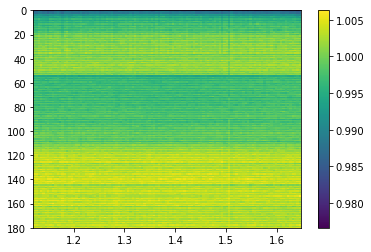

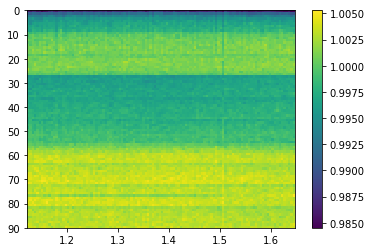

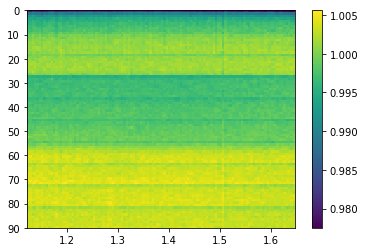

In [7]:
import matplotlib.pyplot as plt

#fig, axs = plt.subplots(3, 1)
plt.figure(0)
plt.imshow(flux,extent=[min(w),max(w),180,0],aspect='auto')
plt.colorbar()
plt.figure(1)
plt.imshow(flux_f,extent=[min(w),max(w),90,0],aspect='auto')
plt.colorbar()
plt.figure(2)
plt.imshow(flux_r,extent=[min(w),max(w),90,0],aspect='auto')
plt.colorbar()

(array([ 1.,  4.,  8.,  8., 24., 31., 21., 11.,  5.,  1.]),
 array([1.00156365, 1.00183498, 1.0021063 , 1.00237763, 1.00264895,
        1.00292027, 1.0031916 , 1.00346292, 1.00373425, 1.00400557,
        1.0042769 ]),
 <a list of 10 Patch objects>)

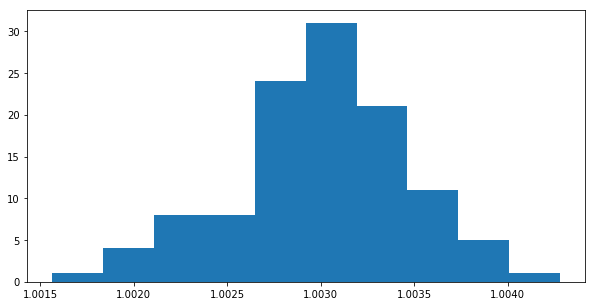

In [44]:
plt.hist(flux_f[85,:])

In [24]:
x=np.array([1000,1200,1198,2100,70000])
np.std(x)

27452.852686742775

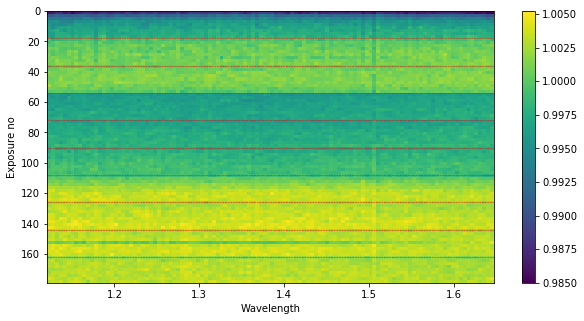

In [22]:
import matplotlib.pyplot as plt
plt.imshow(flux_r,extent=[min(w),max(w),180-1,0],aspect='auto')
#plt.xticks(w*100)
plt.colorbar()
plt.xlabel('Wavelength')
plt.ylabel('Exposure no')
orbits=[0,18,36,54,72,90,108,126,144,162]
for i in range(len(orbits)):
    plt.hlines(orbits[i],min(w),max(w),linestyles='--',lw=0.5,color='red')
#plt.vlines(1.12,0,180)
#plt.vlines(1.65,0,180)
#plt.savefig('v1298_scanned_spectra.pdf',format='pdf')

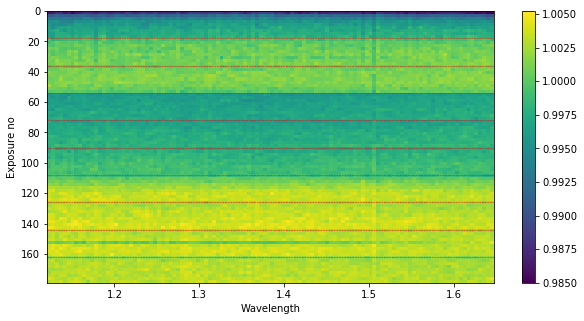

In [23]:
import matplotlib.pyplot as plt
plt.imshow(flux_f,extent=[min(w),max(w),180-1,0],aspect='auto')
#plt.xticks(w*100)
plt.colorbar()
plt.xlabel('Wavelength')
plt.ylabel('Exposure no')
orbits=[0,18,36,54,72,90,108,126,144,162]
for i in range(len(orbits)):
    plt.hlines(orbits[i],min(w),max(w),linestyles='--',lw=0.5,color='red')
#plt.vlines(1.12,0,180)
#plt.vlines(1.65,0,180)
#plt.savefig('v1298_scanned_spectra.pdf',format='pdf')

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
filelist=[]

for file in os.listdir("/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output"):
    if (file.startswith("ie93") and file.endswith(".txt") and not file.endswith("subs_spec.txt")):
        #print(os.path.join("/mydir", file))
        filelist.append(file)
#print (sorted(filelist))
name,direction=np.genfromtxt('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/Data/input_image.lis',dtype=('str','str'),usecols=(0,3),unpack=True)
filelist=sorted(filelist)
print (filelist)
print (name)
flux=np.array([])
Dir="/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/"
signal1=[]
count=0
count_f=0
count_r=0
flux_f=np.array([])
flux_r=np.array([])
for i in range(len(filelist)):
    count+=1
    w,f=np.loadtxt(Dir+filelist[i],usecols=(0,1),skiprows=2,unpack=True)
 #   print (len(f))
    f=f[np.where(w>=1.12)[0]]
    w=w[np.where(w>=1.12)[0]]
    f=f[np.where(w<=1.65)[0]]
    w=w[np.where(w<=1.65)[0]]
    dir_scan=direction[np.where(name==filelist[i].strip('_spec.txt'))[0]][0]
#    signal1=[]
    print (count)
    flux=np.append(flux,f)
    if (dir_scan=='reverse'):
        flux_r=np.append(flux_r,f)
        count_r+=1
   #     print (i)
    else:
        flux_f=np.append(flux_f,f)
        count_f+=1
    print (np.std(f)/(np.mean(f)))
    if (i==40 or i==100):
        plt.plot(w,f)
        signal1.append(f)
#    print (np.mean(f)),i
#print (flux)
#print (np.mean(flux),np.std(flux)/np.sqrt(np.mean(flux)))
flux=flux.reshape(count,len(w))
flux_f=flux_f.reshape(count_f,len(w))
flux_r=flux_r.reshape(count_r,len(w))
#import pandas as pd
#df1=pd.DataFrame(flux)
#print (df1)
#print (len(flux.sum(axis=0)))
for i in range(len(w)):
    flux[:,i]=flux[:,i]/(flux.sum(axis=0)[i]/count)
    flux_f[:,i]=flux_f[:,i]/(flux_f.sum(axis=0)[i]/count_f)
    flux_r[:,i]=flux_r[:,i]/(flux_r.sum(axis=0)[i]/count_r)
print (w[1]-w[0],count)



for i in range (len(filelist)):
    flux[i,:]=flux[i,:]/np.mean(flux[i,:])


['ie9301bhq_spec.txt', 'ie9301biq_spec.txt', 'ie9301bjq_spec.txt', 'ie9301bkq_spec.txt', 'ie9301blq_spec.txt', 'ie9301bmq_spec.txt', 'ie9301bnq_spec.txt', 'ie9301boq_spec.txt', 'ie9301bqq_spec.txt', 'ie9301brq_spec.txt', 'ie9301bsq_spec.txt', 'ie9301btq_spec.txt', 'ie9301buq_spec.txt', 'ie9301bvq_spec.txt', 'ie9301bwq_spec.txt', 'ie9301byq_spec.txt', 'ie9301bzq_spec.txt', 'ie9301c0q_spec.txt', 'ie93a1c2q_spec.txt', 'ie93a1c3q_spec.txt', 'ie93a1c4q_spec.txt', 'ie93a1c5q_spec.txt', 'ie93a1c7q_spec.txt', 'ie93a1c8q_spec.txt', 'ie93a1c9q_spec.txt', 'ie93a1caq_spec.txt', 'ie93a1cbq_spec.txt', 'ie93a1ccq_spec.txt', 'ie93a1cdq_spec.txt', 'ie93a1cfq_spec.txt', 'ie93a1cgq_spec.txt', 'ie93a1chq_spec.txt', 'ie93a1ciq_spec.txt', 'ie93a1cjq_spec.txt', 'ie93a1ckq_spec.txt', 'ie93a1clq_spec.txt', 'ie93b1coq_spec.txt', 'ie93b1cpq_spec.txt', 'ie93b1cqq_spec.txt', 'ie93b1crq_spec.txt', 'ie93b1csq_spec.txt', 'ie93b1ctq_spec.txt', 'ie93b1cuq_spec.txt', 'ie93b1cwq_spec.txt', 'ie93b1cxq_spec.txt', 'ie93b1cy

102
0.07692520851270773
103
0.0768581448752251
104
0.07705245594212341
105
0.07696700671701703
106
0.07707785564187447
107
0.07701830198278894
108
0.07710329718122384
109
0.0770604763552644
110
0.07717648822715177
111
0.07700092871231058
112
0.07722894324012877
113
0.07703049696168844
114
0.07714378968456516
115
0.07706145996942067
116
0.07726073333309139
117
0.0770038420845381
118
0.07711672105691801
119
0.07708401426179408
120
0.07723805018645398
121
0.07700360664064199
122
0.07714615605825398
123
0.0770253156978385
124
0.07710052074519808
125
0.07701838245052145
126
0.07710283216674073
127
0.07709750958969226
128
0.0771200501645427
129
0.07698492836434244
130
0.07717053574526105
131
0.07711814270824596
132
0.07722474912579305
133
0.0770622080361414
134
0.07716509997561122
135
0.0770061831324788
136
0.07721577927285947
137
0.07713668428951283
138
0.07712646436948202
139
0.07716810601508563
140
0.07710468833938168
141
0.07716593691736778
142
0.07718815513536295
143
0.0770689633881906


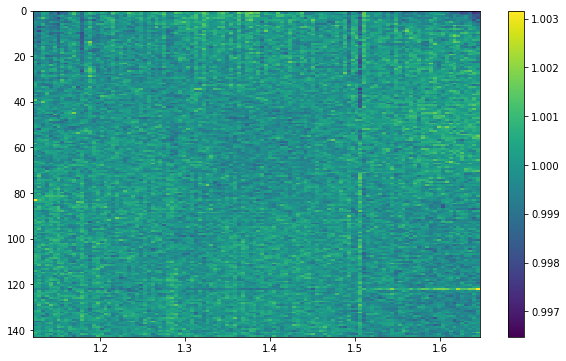

In [3]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 1,figsize=(10,6))
#plt.figure(0)
plt.imshow(flux,extent=[min(w),max(w),143,0],aspect='auto')
plt.colorbar()